# Project Overview

This project is a derivative of a previous project I did with the same dataset. In that project, titled "NBA_Outcomes_2012-2018" I tried to find an overarching model to explain NBA outcomes. The logistic regression model I crafted had perfect accuracy. I believe this is due to something I did wrong in forming the model. Unfortunately I don't know how to explain what exactly I did wrong. In this project I think if I breakdown outcomes by teams instead of every game, then I will have a more reasonable model.

Once again here is the dataset

https://www.kaggle.com/pablote/nba-enhanced-stats/data

# Insights from the Previous Project

In the previous project, I found that team location and net days off did not have a significant impact on game outcomes. I also discovered that using Net Offensive Rating or Net Defensive Rating is not really a good measure when you are predicting game by game outcome. Those two metrics probably work better on determining overall team wins on the season. Basically you could use historical offensive rating/defensive rating data and predict how many wins a team will achieve in the upcoming season. That is not my goal on this project. I am looking at individual game outcomes. What is common amongst them? 

# Importing Basic Libraries

In [1]:
#Here are the libraries I tend to use in my analysis. I tend to import all of them at once for simplicity.
#If I need more, then I will import them as needed. 

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
plt.style.use('fivethirtyeight')
%matplotlib inline

# Glossary Of Terms

Here is a glossary of the stats included in the dataset

https://stats.nba.com/help/glossary/

# Exploratory Analysis

In [2]:
#Reading in of the dataset

box_score = pd.read_csv("2012-18_officialBoxScore.csv")

In [3]:
#Here is a first look at the dataset

box_score.head()

,gmDate,gmTime,seasTyp,offLNm,offFNm,teamAbbr,teamConf,teamDiv,teamLoc,teamRslt,...,opptFIC40,opptOrtg,opptDrtg,opptEDiff,opptPlay%,opptAR,opptAST/TO,opptSTL/TO,poss,pace
0,2012-10-30,19:00,Regular,Brothers,Tony,WAS,East,Southeast,Away,Loss,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
1,2012-10-30,19:00,Regular,Smith,Michael,WAS,East,Southeast,Away,Loss,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
2,2012-10-30,19:00,Regular,Workman,Haywoode,WAS,East,Southeast,Away,Loss,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
3,2012-10-30,19:00,Regular,Brothers,Tony,CLE,East,Central,Home,Win,...,56.0417,94.4447,105.6882,-11.2435,0.3765,18.8679,2.0000,84.6154,88.9409,88.9409
4,2012-10-30,19:00,Regular,Smith,Michael,CLE,East,Central,Home,Win,...,56.0417,94.4447,105.6882,-11.2435,0.3765,18.8679,2.0000,84.6154,88.9409,88.9409


In [4]:
#There are 44,284 rows and 119 columns worth of data in the untouched dataset

box_score.shape

(44284, 119)

#### Dropping Irrelevant Columns

Since this project is similar to a previous one I did, I'm not going to repeat other forms of data analysis like finding null values since I already know how that worked out. I am only going to repeat the steps that are absolutely necessary. Here I am once again dropping the columns from the dataset that I don't find relevant. In this version I am keeping "teamAbbr" and "opptAbbr" since this project will focus more on specific team outcomes

In [5]:
#Here I am going to drop columns that I don't find relevant to what I want to analyze
#I dropped "gmDate" because I don't think the date of the game matters for the outcome. This isn't time series analysis
#I dropped "gmTime" because it's not so much time that matters, but time difference, like if the Knicks play in Portland
#I dropped "seasTyp" because although there's a difference between playoffs and reg. season, this dataset only has the latter
#I dropped "teamConf" because that would only be relevant when there's interconference games, which is a small part of the data
#I dropped "teamDiv" because divisions in basketball are not like baseball. They're basically irrelevant
#I dropped "opptConf" for the same reason I dropped "teamConf"
#I dropped "opptDiv" for the same reason I dropped "teamDiv"
#I dropped "opptLoc" because that will be coded in "teamLoc" already
#I dropped "opptRslt" because that will be coded in "teamRslt" already
#I dropped "teamMin" because teams play the same amount of minutes. If this were an individual stat I'd keep it
#I dropped "opptMin" because teams play the same amount of minutes. If this were an individual stat I'd keep it
#I dropped "teamPTS" because we know whoever scores the most points wins. That's how wins are decided. 
#I dropped "opptPTS" for the same reason I dropped "teamPTS"
#I dropped "teamFIC" because Floor Impact Counter makes sense for individual players, not entire teams
#I dropped "opptFIC" for the same reason I dropped "teamFIC"
#I dropped "teamFIC40" and "opptFIC40" for the same reason I dropped "teamFIC"
#I dropped "teamORB/opptORB" and "teamDRB/opptDRB" because I'm going to focus on total rebounds
#I dropped "teamFT%" and 'team FTM' because I care more about free throw attempts (are teams getting to the line more)
#I dropped "team2PM" and "team 2P%" because like with free throws I care more about attempts (in a negative sense in this case)
#I dropped the opponent counterparts to 2PM and 2P% as well
#I dropped "team3PM" because that will be encoded with three point percentage
#I dropped "teamPTS1-8" and the oppt counterpart because I don't care how many points are scored per quarter for a team 
#I dropped "teamPPS" because I don't know what it is
#I dropped "teamPlay%" because I don't know what it is
#I dropped "teamAR" because I don't know what it is
#I dropped "teamOREB%/opptOREB%/teamDREB%/opptDREB%" because I am focused on overall rebounds
#I dropped "teamBLK%/teamSTL%/teamASST%/teamTO%" and their oppt counterparts because I'm focused on whole values 
#I dropped "teamAST/TO, teamSTL/TO, teamBLKR" and their oppt counterparts since I'm focused on whole numbers
#I dropped "poss" and "pace" because they aren't specific to each team
#I dropped "teamOrtg" and "teamDrtg" along with their counterparts because they are not useful for this analysis



box_score = box_score.drop(['gmDate','gmTime','seasTyp','teamConf','teamDiv','opptConf', 'teamOrtg', 'teamDrtg', 'opptOrtg',
                            'opptDiv','opptLoc','opptRslt','teamMin', 'opptMin', 'teamPTS', 'opptPTS', 'teamFIC', 'opptFIC',
                            'teamFIC40', 'opptFIC40', 'teamORB', 'teamDRB', 'teamFT%', 'opptFT%', 'teamFTM', 'opptFTM',
                            'team2PM','team2P%', 'team3PM', 'oppt3PM', 'teamPTS1', 'teamPTS2', 'teamPTS3', 'teamPTS4', 
                            'teamPTS4','teamPTS5', 'teamPTS6', 'teamPTS7', 'teamPTS8', 'teamPPS', 'opptAR','teamPlay%', 
                            'teamAR', 'teamOREB%', 'opptOREB%', 'teamDREB%', 'opptDREB%', 'opptORB', 'opptDRB', 'teamBLK%', 
                            'opptBLK%', 'opptAR', 'teamSTL%', 'opptSTL%', 'teamASST%', 'opptASST%', 'teamTO%', 'opptTO%', 
                            'teamAST/TO', 'opptAST/TO', 'teamSTL/TO', 'opptSTL/TO', 'teamBLKR', 'opptBLKR', 'teamTREB%', 
                            'opptTREB%', 'opptPTS1', 'opptPTS2', 'opptPTS3', 'opptPTS4', 'opptPTS4','opptPTS5', 'opptPTS6', 
                            'opptPTS7', 'opptPTS8', 'oppt2PM','oppt2P%', 'teamTS%', 'opptTS%', 'teamEFG%', 'opptDrtg',
                            'opptEFG%', 'teamEDiff', 'opptEDiff', 'opptPPS', 'opptPlay%', 'poss', 'pace'], axis = 'columns')

#### Column transformation

Many of the columns in this dataset are mirrors of other columns. For example you have team assists and opponent assists. While I believe assists matter, I don't think individual team assists matter. I don't think you can say "oh if we get 50 assists we are going to win." I think a better metric would be assist DIFFERENCE. The difference in assists between teams could have a significant impact on the outcome of the game. Below I am going to do several column transformations that take into account these differences.

In [6]:
#Net_Day_Off: teamDayOff - opptDayOff, does the difference in days off before a game have an effect on the outcome?

box_score["Net_Day_Off"] = box_score["teamDayOff"] - box_score["opptDayOff"]

#Net_AST: teamAST - opptAST, does the magnitude of difference in assists have an effect on the outcome?

box_score["Net_AST"] = box_score["teamAST"] - box_score["opptAST"]

#Net_TO: teamTO - opptTO, does the magnitude of difference in turnovers have an effect on the outcome?

box_score["Net_TO"] = box_score["teamTO"] - box_score["opptTO"]

#Net_STL: teamSTL - opptSTL, does the magnitude of difference in steals have an effect on the outcome?

box_score["Net_STL"] = box_score["teamSTL"] - box_score["opptSTL"]

#Net_BLK: teamBLK - opptBLK, does the magnitude of difference in blocks have an effect on the outcome?

box_score["Net_BLK"] = box_score["teamBLK"] - box_score["opptBLK"]

#Net_Fouls: teamPF - opptPF, does the magnitude of difference in team fouls have an effect on the outcome?

box_score["Net_Fouls"] = box_score["teamPF"] - box_score["opptPF"]

#Net_FGA: teamFGA - opptFGA, does the magnitude of difference in field goal attempts have an effect on the outcome?

box_score["Net_FGA"] = box_score["teamFGA"] - box_score["opptFGA"]

#Net_FG%: teamFG% - opptFG%, does the magnitude of difference in field goal percentage have an effect on the outcome?

box_score["Net_FG%"] = box_score["teamFG%"] - box_score["opptFG%"]

#Net_2PA: team2PA - oppt2PA, does the magnitude of difference in two point attempts have an effect on the outcome?

box_score["Net_2PA"] = box_score["team2PA"] - box_score["oppt2PA"]

#Net_3PA: team3PA - oppt3PA, does the magnitude of difference in three point attempts have an effect on the outcome?

box_score["Net_3PA"] = box_score["team3PA"] - box_score["oppt3PA"]

#Net_3P%: team3P% - oppt3P%, does the magnitude of difference in three point percentage have an effect on the outcome?

box_score["Net_3P%"] = box_score["team3P%"] - box_score["oppt3P%"]

#Net_FTA: teamFTA - opptFTA, does the magnitude of difference in free throw attempts have an effect on the outcome?

box_score["Net_FTA"] = box_score["teamFTA"] - box_score["opptFTA"]

#Net_TRB: teamTRB - opptTRB, does the magnitude of difference in team rebounds have an effect on the outcome?

box_score["Net_TRB"] = box_score["teamTRB"] - box_score["opptTRB"]

#### Further column dropping

In [7]:
#I dropped 'teamDayoff' and 'opptDayoff' since I used their difference as a separate column
#I dropped 'teamAST' and 'opptAST' since I used their difference as a separate column
#I dropped 'teamTO' and 'opptTO' since I used their difference as a separate column
#I dropped 'teamSTL' and 'opptSTL' since I used their difference as a separate column
#I dropped 'teamBLK' and 'opptBLK' since I used their difference as a separate column
#I dropped 'teamPF' and 'opptPF' since I used their difference as a separate column
#I dropped 'teamFGA' and 'opptFGA' since I used their difference as a separate column
#I dropped 'teamFG%' and 'opptFG%' since I used their difference as a separate column
#I dropped 'team3PA' and 'oppt3PA' since I used their difference as a separate column
#I dropped 'teamFTA' and 'opptFTA' since I used their difference as a separate column
#I dropped 'teamTRB' and 'opptTRB' since I used their difference as a separate column
#I dropped 'team2PA' and 'oppt2PA' since I used their difference as a separate column
#I dropped 'teamFGM' and 'opptFGM' because they are better represented by field goal percentage
#I dropped 'team3P%' and 'oppt3P%' since I used their difference as a separate column
#I dropped "teamOrtg/teamDrtg" and the oppt counterparts since I used their difference as a separate column


box_score = box_score.drop(['teamDayOff','opptDayOff','teamAST','opptAST','teamTO','opptTO','teamSTL','opptSTL',
                            'teamBLK','opptBLK','teamPF','opptPF', 'teamFGA', 'opptFGA', 'teamFG%', 'opptFG%',
                            'team3PA', 'oppt3PA', 'teamFTA', 'opptFTA', 'teamTRB', 'opptTRB', 'teamFGM', 'team2PA', 
                            'oppt2PA', 'opptFGM', 'team3P%', 'oppt3P%'], axis = 'columns')

#### Dummy Variable Transformation

In order to create a predictive model, I need to convert the wins and losses into 0s and 1s. As you can tell, my idea will be to do a logistic regression.

In [8]:
#Here I am officially converting the categorical variables in 'teamRslt' into dummy variables

#Wins = 1 And Losses = 0

box_score = pd.get_dummies(box_score, columns=['teamRslt'], drop_first=True)

In [9]:
#Here I am officially converting the categorical variables in 'teamLoc' into dummy variables

#Home = 1, Away = 0

box_score = pd.get_dummies(box_score, columns=['teamLoc'], drop_first=True)

In [10]:
#Here I am converting 'opptAbbr' into dummy variables

#This way when I build my model I can see what effect certain opponents have on outcomes

#I am not going to convert 'teamAbbr' into dummy variables since they are not going to be used as explanatory variables
 
box_score = pd.get_dummies(box_score, columns=['opptAbbr'], drop_first=True)

In [11]:
#Here I am going to combine the first and last names into one column

#This will make things easier to convert into dummy variables. 

box_score["Off_Name"] = box_score["offFNm"] + box_score["offLNm"]

In [12]:
#Now that I have the combined names I am going to drop the first and last name individual columns to make things cleaner

box_score = box_score.drop(['offFNm', 'offLNm'], axis = 'columns')

In [13]:
#Here I am converting 'Off_Name' into dummy variables

#Do certain refs have a statistically significant effect on game outcomes for teams?

box_score = pd.get_dummies(box_score, columns=['Off_Name'], drop_first=True)

In [14]:
#Here is what the dataset looks like now with all of the changes

box_score.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
0,WAS,0,4,-8,4,5,-2,11,-0.1001,-1,...,0,0,0,1,0,0,0,0,0,0
1,WAS,0,4,-8,4,5,-2,11,-0.1001,-1,...,0,0,0,0,0,0,0,0,0,0
2,WAS,0,4,-8,4,5,-2,11,-0.1001,-1,...,0,0,0,0,0,0,0,0,0,0
3,CLE,0,-4,8,-4,-5,2,-11,0.1001,1,...,0,0,0,1,0,0,0,0,0,0
4,CLE,0,-4,8,-4,-5,2,-11,0.1001,1,...,0,0,0,0,0,0,0,0,0,0


In [15]:
#After the transformations we have 44,284 rows and 130 columns worth of data 

box_score.shape

(44284, 130)

# Correlation and Basic Data Visualization

In [16]:
#Here I am checking what teams are in this database and how often they show up

box_score['teamAbbr'].value_counts()

DEN    1478
MIN    1478
LAL    1477
UTA    1477
CLE    1477
DAL    1477
MIL    1477
CHI    1477
POR    1477
MIA    1477
TOR    1476
BKN    1476
WAS    1476
SA     1476
NO     1476
GS     1476
SAC    1476
ATL    1476
MEM    1476
OKC    1476
HOU    1476
PHI    1476
ORL    1476
PHO    1476
LAC    1476
NY     1476
DET    1475
CHA    1475
IND    1473
BOS    1473
Name: teamAbbr, dtype: int64

#### Minnesota Timberwolves

In [17]:
timberwolves = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'MIN']

In [18]:
timberwolves.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
123,MIN,-2,0,-1,-3,6,-17,-2,0.0082,-3,...,0,0,0,0,0,0,0,0,0,0
124,MIN,-2,0,-1,-3,6,-17,-2,0.0082,-3,...,0,0,1,0,0,0,0,0,0,0
125,MIN,-2,0,-1,-3,6,-17,-2,0.0082,-3,...,0,0,0,0,0,0,0,0,0,0
222,MIN,1,0,13,-1,5,-7,-26,0.0087,-21,...,0,0,0,0,0,0,0,0,0,0
223,MIN,1,0,13,-1,5,-7,-26,0.0087,-21,...,0,0,0,0,0,0,0,0,0,0


In [19]:
timberwolves.shape

(1478, 130)

In [20]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Timberwolves

timberwolves.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.629726
Net_AST                        0.471298
Net_3P%                        0.417112
Net_TRB                        0.346344
Net_BLK                        0.234704
Net_FTA                        0.214426
Net_STL                        0.181062
teamLoc_Home                   0.166175
Net_Day_Off                    0.110888
opptAbbr_SAC                   0.076723
opptAbbr_LAL                   0.067118
opptAbbr_PHO                   0.067118
Net_3PA                        0.066147
Off_Name_ScottWall             0.065703
opptAbbr_BKN                   0.061301
Off_Name_JoeDeRosa             0.055957
Off_Name_JonathanSterling      0.048441
opptAbbr_NO                    0.047004
opptAbbr_DAL                   0.047004
Off_Name_RonGarretson          0.044626
Off_Name_JustinVan Duyne       0.036126
Off_Name_C.J.Washington        0.034912
Off_Name_OlandisPoole          0.034837
opptAbbr_PHI                   0.034352


In [21]:
#My cutoff rate is going to be variables less than .1correlated (positive or negative) with wins

#Here I am adjusting the timberwolves subset to only those variables with .1 or greater correlation

timberwolves = timberwolves.drop(['Off_Name_BennettSalvatore','Off_Name_MarkLindsay','Off_Name_ScottBolnick',
                                  'Off_Name_JamesWilliams','Off_Name_BillSpooner','Off_Name_GediminasPetraitis',
                                  'Off_Name_TreMaddox','Off_Name_JasonPhillips','Off_Name_CourtneyKirkland',
                                  'Off_Name_KarlLane','Off_Name_DerrickStafford','Off_Name_BillKennedy',
                                  'Off_Name_KippKissinger', 'Off_Name_RayAcosta', 'Off_Name_SirAllenConner', 
                                  'Off_Name_OlandisPoole','Off_Name_C.J.Washington', 'Off_Name_JustinVan Duyne', 
                                  'Off_Name_RonGarretson', 'Off_Name_JonathanSterling', 'Off_Name_JoeDeRosa', 
                                  'Off_Name_ScottWall', 'opptAbbr_GS', 'opptAbbr_SA','opptAbbr_POR', 'opptAbbr_CHA', 
                                  'opptAbbr_TOR', 'opptAbbr_LAC', 'opptAbbr_OKC', 'opptAbbr_UTA','opptAbbr_WAS', 
                                  'opptAbbr_DET', 'opptAbbr_CHI', 'opptAbbr_MIL', 'opptAbbr_PHI','opptAbbr_DAL', 
                                  'opptAbbr_NO', 'opptAbbr_BKN', 'Net_3PA', 'opptAbbr_PHO','opptAbbr_LAL', 
                                  'opptAbbr_SAC'], axis = 'columns')


In [22]:
timberwolves.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.629726
Net_AST                          0.471298
Net_3P%                          0.417112
Net_TRB                          0.346344
Net_BLK                          0.234704
Net_FTA                          0.214426
Net_STL                          0.181062
teamLoc_Home                     0.166175
Net_Day_Off                      0.110888
Off_Name_RandyRichardson         0.032285
Off_Name_KevinCutler             0.030957
Off_Name_ZachZarba               0.030212
opptAbbr_DEN                     0.029901
Off_Name_MattBoland              0.025464
Off_Name_DickBavetta             0.024591
Off_Name_JohnGoble               0.024487
Off_Name_J.T.Orr                 0.024487
Off_Name_TomWashington           0.024124
Off_Name_LaurenHoltkamp          0.022744
Off_Name_CurtisBlair             0.020251
Off_Name_JoeCrawford             0.019670
Off_Name_PatFraher               0.016976
Off_Name_StevenAnderson          0

In [23]:
timberwolves = timberwolves.drop(['opptAbbr_MEM','opptAbbr_MIA','Off_Name_EliRoe',
                                  'Off_Name_DedricTaylor','Off_Name_MattMyers','Off_Name_PhenizeeRansom',
                                  'Off_Name_BrandonAdair','Off_Name_VladimirVoyard-Tadal','Off_Name_BrendaPantoja',
                                  'opptAbbr_BOS','opptAbbr_CLE','Off_Name_ScottTwardoski',
                                  'Off_Name_KevinScott', 'Off_Name_KevinFehr', 'Off_Name_EddieRush', 
                                  'Off_Name_MaratKogut','Off_Name_DavidGuthrie', 'Off_Name_DerekRichardson', 
                                  'Off_Name_KenMauer', 'Off_Name_EricDalen', 'Off_Name_BrettNansel', 
                                  'Off_Name_TylerFord', 'Off_Name_BenTaylor', 'Off_Name_JacynGoble',
                                  'Off_Name_SeanCorbin', 'Off_Name_MikeCallahan', 'Off_Name_BennieAdams', 
                                  'Off_Name_EricLewis', 'Off_Name_StevenAnderson', 
                                  'Off_Name_PatFraher','Off_Name_JoeCrawford', 
                                  'Off_Name_CurtisBlair', 'Off_Name_LaurenHoltkamp', 'Off_Name_TomWashington', 
                                  'Off_Name_J.T.Orr','Off_Name_JohnGoble', 
                                  'Off_Name_DickBavetta', 'Off_Name_MattBoland', 'opptAbbr_DEN', 'Off_Name_ZachZarba',
                                  'Off_Name_KevinCutler', 'Off_Name_RandyRichardson'], axis = 'columns')

In [24]:
timberwolves.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.629726
Net_AST                     0.471298
Net_3P%                     0.417112
Net_TRB                     0.346344
Net_BLK                     0.234704
Net_FTA                     0.214426
Net_STL                     0.181062
teamLoc_Home                0.166175
Net_Day_Off                 0.110888
Off_Name_LeroyRichardson    0.010552
Off_Name_JamesCapers        0.008550
Off_Name_ScottFoster        0.008550
Off_Name_MontyMcCutchen     0.008550
Off_Name_VioletPalmer       0.008117
Off_Name_GaryZielinski      0.008025
Off_Name_TonyBrothers       0.008025
opptAbbr_IND                0.007403
opptAbbr_NY                 0.007403
opptAbbr_ORL                0.007403
Off_Name_KaneFitzgerald     0.006019
Off_Name_DerrickCollins     0.005796
Off_Name_DavidJones         0.003972
Off_Name_HaywoodeWorkman    0.003853
Off_Name_BrianForte         0.003853
Off_Name_NickBuchert        0.001671
Off_Name_RodneyMott         0.001290
O

In [25]:
timberwolves = timberwolves.drop(['Off_Name_DanCrawford','Off_Name_MichaelSmith','Off_Name_TonyBrown',
                                  'Off_Name_JoshTiven','Off_Name_SeanWright','Off_Name_BrentBarnaky',
                                  'Off_Name_EdMalloy','Off_Name_LeonWood','Off_Name_MarkAyotte',
                                  'Off_Name_MarcDavis','Off_Name_JasonGoldenberg','Off_Name_MitchellErvin',
                                  'Off_Name_RodneyMott', 'Off_Name_NickBuchert', 'Off_Name_BrianForte', 
                                  'Off_Name_HaywoodeWorkman','Off_Name_DavidJones', 'Off_Name_DerrickCollins', 
                                  'Off_Name_KaneFitzgerald', 'opptAbbr_ORL', 'opptAbbr_NY', 
                                  'opptAbbr_IND', 'Off_Name_TonyBrothers', 'Off_Name_GaryZielinski',
                                  'Off_Name_VioletPalmer', 'Off_Name_MontyMcCutchen', 'Off_Name_ScottFoster', 
                                  'Off_Name_JamesCapers', 'Off_Name_LeroyRichardson', 'opptAbbr_MIN'], axis = 'columns')

In [26]:
timberwolves.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.629726
Net_AST         0.471298
Net_3P%         0.417112
Net_TRB         0.346344
Net_BLK         0.234704
Net_FTA         0.214426
Net_STL         0.181062
teamLoc_Home    0.166175
Net_Day_Off     0.110888
Net_FGA        -0.102863
opptAbbr_HOU   -0.115713
Net_2PA        -0.141424
Net_TO         -0.161063
Net_Fouls      -0.211094
Name: teamRslt_Win, dtype: float64

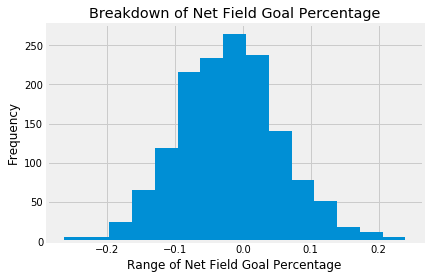

In [27]:
#Here is a histogram for Net_FG%

timberwolves.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

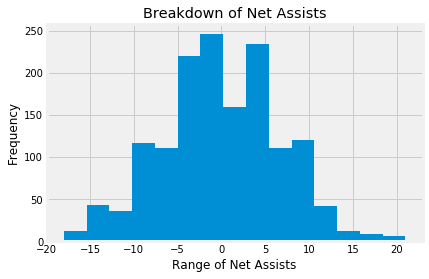

In [28]:
#Here is a histogram for Net_AST 

timberwolves.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

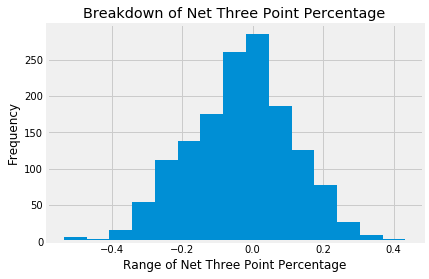

In [29]:
#Here is a histogram for Net_3P% 

timberwolves.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

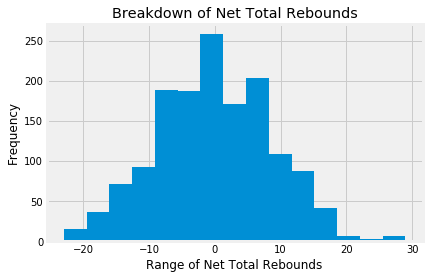

In [30]:
#Here is a histogram for Net_TRB 

timberwolves.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

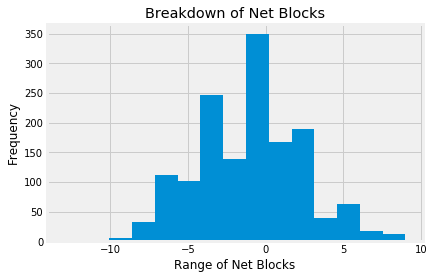

In [31]:
#Here is a histogram for Net_BLK

timberwolves.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

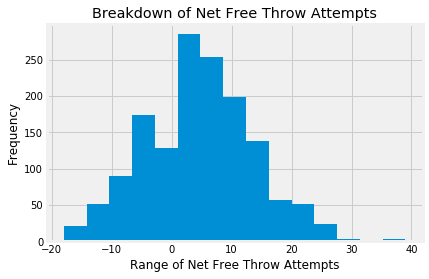

In [32]:
#Here is a histogram for Net_FTA 

timberwolves.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

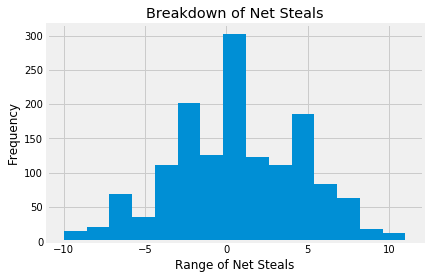

In [33]:
#Here is a histogram for Net_STL

timberwolves.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

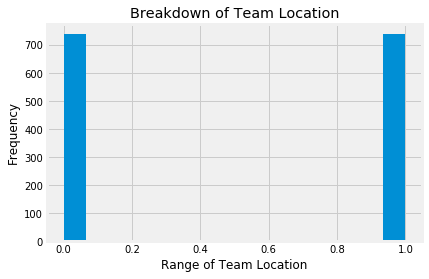

In [34]:
#Here is a histogram for teamLoc_Home

timberwolves.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

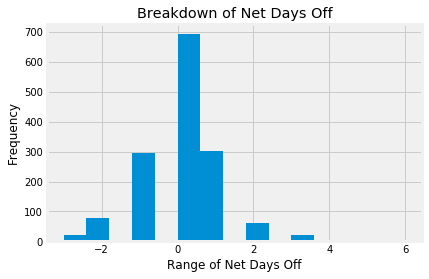

In [35]:
#Here is a histogram for Net_Day_Off

timberwolves.loc[:,"Net_Day_Off"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Days Off")
plt.title("Breakdown of Net Days Off");

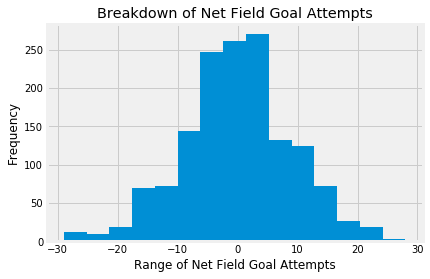

In [36]:
#Here is a histogram for Net_FGA 

timberwolves.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

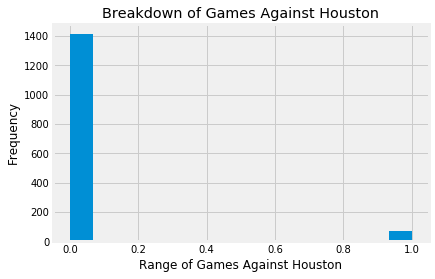

In [37]:
#Here is a histogram for opptAbbr_HOU

timberwolves.loc[:,"opptAbbr_HOU"].plot(kind='hist', bins=15)
plt.xlabel("Range of Games Against Houston")
plt.title("Breakdown of Games Against Houston");

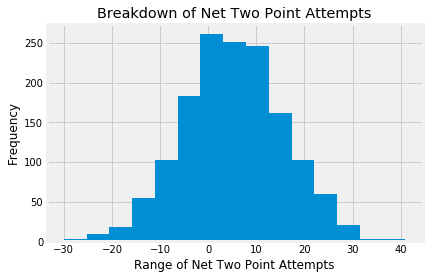

In [38]:
#Here is a histogram for Net_2PA  

timberwolves.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

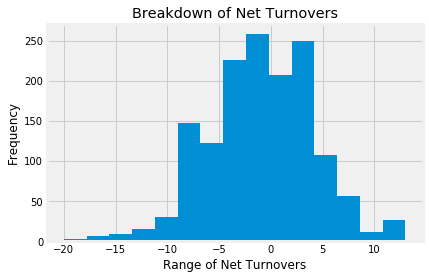

In [39]:
#Here is a histogram for Net_TO  

timberwolves.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

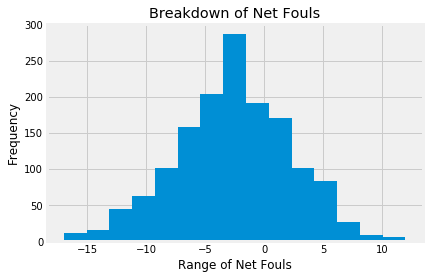

In [40]:
#Here is a histogram for Net_Fouls  

timberwolves.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Denver Nuggets

In [41]:
nuggets = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'DEN']

In [42]:
nuggets.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
18,DEN,0,1,6,-4,-6,8,3,0.0221,10,...,0,0,0,0,0,0,0,0,0,0
19,DEN,0,1,6,-4,-6,8,3,0.0221,10,...,0,0,0,0,1,0,0,0,0,0
20,DEN,0,1,6,-4,-6,8,3,0.0221,10,...,0,0,0,0,0,0,0,0,0,0
78,DEN,2,-2,1,-3,-3,-7,-2,-0.1074,-13,...,0,0,0,0,0,0,0,0,0,0
79,DEN,2,-2,1,-3,-3,-7,-2,-0.1074,-13,...,0,0,0,0,0,0,0,0,0,0


In [43]:
nuggets.shape

(1478, 130)

In [44]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Nuggets

nuggets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.644177
Net_AST                        0.495260
Net_3P%                        0.435845
Net_TRB                        0.356770
Net_BLK                        0.241927
teamLoc_Home                   0.235507
Net_FTA                        0.233169
Net_STL                        0.207533
Net_Day_Off                    0.155274
opptAbbr_MIL                   0.107916
opptAbbr_LAL                   0.104375
opptAbbr_IND                   0.081579
opptAbbr_CHI                   0.081579
opptAbbr_ORL                   0.081579
opptAbbr_DET                   0.055241
opptAbbr_NY                    0.055241
opptAbbr_NO                    0.053673
Off_Name_ZachZarba             0.053409
Off_Name_KevinFehr             0.052946
Off_Name_EricDalen             0.052260
Off_Name_JoeCrawford           0.052260
Off_Name_JohnGoble             0.041973
Off_Name_MaratKogut            0.041973
Off_Name_J.T.Orr               0.036450


In [45]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the nuggets subset to only those variables with .1 or greater correlation

nuggets = nuggets.drop(['Off_Name_SirAllenConner','Off_Name_RandyRichardson','Off_Name_MattMyers',
                                  'Off_Name_KippKissinger','opptAbbr_DEN','Net_3PA',
                                  'opptAbbr_POR','opptAbbr_OKC','Off_Name_StevenAnderson',
                                  'opptAbbr_BOS','opptAbbr_MIA','opptAbbr_HOU',
                                  'Off_Name_JasonPhillips', 'Net_2PA', 'Off_Name_GediminasPetraitis', 
                                  'Off_Name_LeroyRichardson','Off_Name_MichaelSmith', 'Off_Name_PatFraher', 
                                  'Off_Name_DedricTaylor', 'opptAbbr_MEM', 'Off_Name_ScottTwardoski', 
                                  'Off_Name_ScottFoster', 'Off_Name_BillKennedy', 'Off_Name_VioletPalmer',
                                  'Off_Name_BennettSalvatore','Off_Name_JoshTiven','Off_Name_TonyBrothers', 
                                  'Off_Name_KevinScott', 'Off_Name_RonGarretson','Off_Name_J.T.Orr','Off_Name_MaratKogut',
                                  'Off_Name_JohnGoble', 'Off_Name_JoeCrawford','Off_Name_EricDalen', 'Off_Name_KevinFehr',
                                  'Off_Name_ZachZarba','opptAbbr_NO', 'opptAbbr_NY','opptAbbr_DET', 'opptAbbr_ORL',
                                  'opptAbbr_CHI','opptAbbr_IND'], axis = 'columns')

In [46]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Nuggets

nuggets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.644177
Net_AST                      0.495260
Net_3P%                      0.435845
Net_TRB                      0.356770
Net_BLK                      0.241927
teamLoc_Home                 0.235507
Net_FTA                      0.233169
Net_STL                      0.207533
Net_Day_Off                  0.155274
opptAbbr_MIL                 0.107916
opptAbbr_LAL                 0.104375
Off_Name_JonathanSterling    0.026896
Off_Name_TreMaddox           0.026692
Off_Name_JoeDeRosa           0.026446
Off_Name_PhenizeeRansom      0.026446
Off_Name_BrendaPantoja       0.026446
Off_Name_ScottBolnick        0.026446
Off_Name_TonyBrown           0.024349
Off_Name_DavidGuthrie        0.023271
opptAbbr_SAC                 0.023168
opptAbbr_MIN                 0.022535
Off_Name_KevinCutler         0.022111
Off_Name_MikeCallahan        0.020790
Off_Name_HaywoodeWorkman     0.019874
opptAbbr_DAL                 0.019803
Off_Name_Mit

In [47]:
nuggets = nuggets.drop(['Off_Name_KenMauer','Off_Name_JasonGoldenberg','Off_Name_BrandonAdair',
                                  'Off_Name_CourtneyKirkland','opptAbbr_PHI','opptAbbr_CLE',
                                  'opptAbbr_CHA','opptAbbr_TOR','opptAbbr_WAS',
                                  'opptAbbr_BKN','Off_Name_BennieAdams','Off_Name_OlandisPoole',
                                  'Off_Name_EliRoe', 'Off_Name_GaryZielinski', 'opptAbbr_GS', 
                                  'Off_Name_DanCrawford','opptAbbr_UTA', 'Off_Name_ScottWall', 
                                  'Off_Name_KarlLane', 'Off_Name_BrianForte', 'Off_Name_LeonWood', 
                                  'Off_Name_EricLewis', 'Off_Name_JamesWilliams', 'Off_Name_C.J.Washington',
                                  'Off_Name_JacynGoble','Off_Name_RayAcosta','Off_Name_MattBoland', 
                                  'Off_Name_MitchellErvin', 'opptAbbr_DAL','Off_Name_HaywoodeWorkman','Off_Name_MikeCallahan',
                                  'Off_Name_KevinCutler', 'opptAbbr_MIN','opptAbbr_SAC', 'Off_Name_DavidGuthrie',
                                  'Off_Name_TonyBrown','Off_Name_ScottBolnick', 'Off_Name_BrendaPantoja',
                                  'Off_Name_PhenizeeRansom','Off_Name_JoeDeRosa','Off_Name_TreMaddox',
                                  'Off_Name_JonathanSterling'], axis = 'columns')

In [48]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Nuggets

nuggets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.644177
Net_AST                          0.495260
Net_3P%                          0.435845
Net_TRB                          0.356770
Net_BLK                          0.241927
teamLoc_Home                     0.235507
Net_FTA                          0.233169
Net_STL                          0.207533
Net_Day_Off                      0.155274
opptAbbr_MIL                     0.107916
opptAbbr_LAL                     0.104375
opptAbbr_PHO                     0.013476
Off_Name_BillSpooner             0.013173
Off_Name_BenTaylor               0.012794
Off_Name_TylerFord               0.012600
Off_Name_MarcDavis               0.011715
Off_Name_BrettNansel             0.009969
Off_Name_LaurenHoltkamp          0.008396
Off_Name_DerrickCollins          0.007378
Off_Name_MarkAyotte              0.007268
Off_Name_TomWashington           0.002416
Off_Name_JamesCapers             0.002086
Off_Name_JustinVan Duyne         0

In [49]:
nuggets = nuggets.drop(['Off_Name_RodneyMott','Off_Name_NickBuchert','Off_Name_KaneFitzgerald',
                                  'opptAbbr_LAC','Off_Name_DerrickStafford','Off_Name_SeanCorbin',
                                  'Off_Name_CurtisBlair','Off_Name_BrentBarnaky','Off_Name_MontyMcCutchen',
                                  'Off_Name_MarkLindsay','Off_Name_SeanWright','Off_Name_DerekRichardson',
                                  'Off_Name_EdMalloy', 'Off_Name_VladimirVoyard-Tadal', 'Off_Name_EddieRush', 
                                  'Off_Name_DickBavetta','Off_Name_DavidJones', 'Off_Name_JustinVan Duyne', 
                                  'Off_Name_JamesCapers', 'Off_Name_TomWashington', 'Off_Name_MarkAyotte', 
                                  'Off_Name_DerrickCollins', 'Off_Name_LaurenHoltkamp', 'Off_Name_BrettNansel',
                                  'Off_Name_MarcDavis','Off_Name_TylerFord','Off_Name_BenTaylor', 
                                  'Off_Name_BillSpooner', 'opptAbbr_PHO'], axis = 'columns')

In [50]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Nuggets

nuggets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.644177
Net_AST         0.495260
Net_3P%         0.435845
Net_TRB         0.356770
Net_BLK         0.241927
teamLoc_Home    0.235507
Net_FTA         0.233169
Net_STL         0.207533
Net_Day_Off     0.155274
opptAbbr_MIL    0.107916
opptAbbr_LAL    0.104375
opptAbbr_SA    -0.114431
Net_FGA        -0.122161
Net_TO         -0.145466
Net_Fouls      -0.239842
Name: teamRslt_Win, dtype: float64

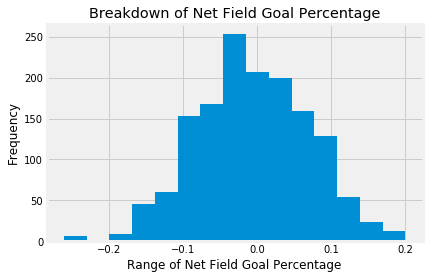

In [51]:
#Here is a histogram for Net_FG%  

nuggets.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

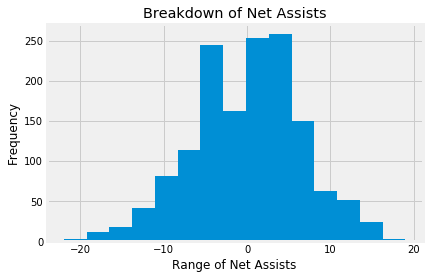

In [52]:
#Here is a histogram for Net_AST  

nuggets.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

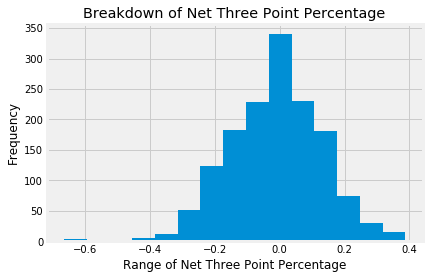

In [53]:
#Here is a histogram for Net_3P%  

nuggets.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

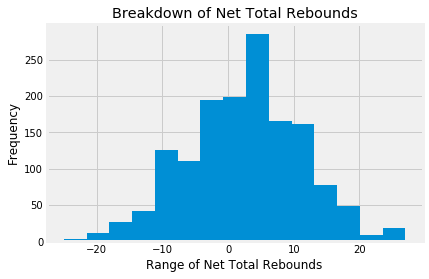

In [54]:
#Here is a histogram for Net_TRB  

nuggets.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

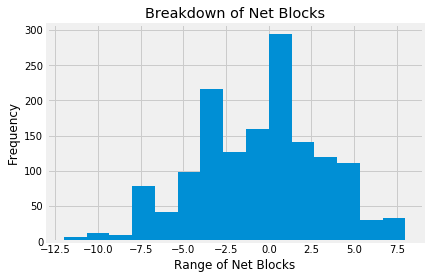

In [55]:
#Here is a histogram for Net_BLK 

nuggets.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

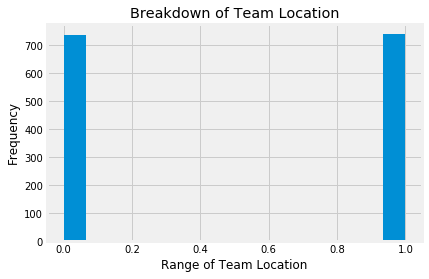

In [56]:
#Here is a histogram for teamLoc_Home 

nuggets.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

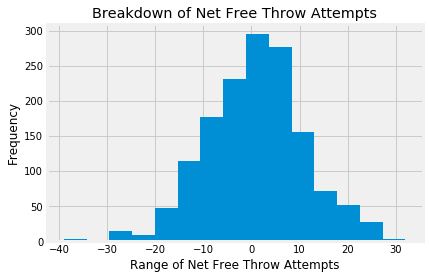

In [57]:
#Here is a histogram for Net_FTA  

nuggets.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

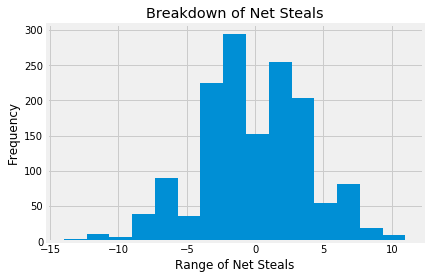

In [58]:
#Here is a histogram for Net_STL  

nuggets.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

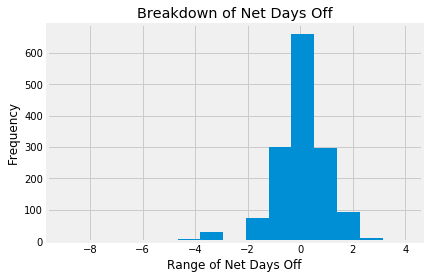

In [59]:
#Here is a histogram for Net_Day_Off 

nuggets.loc[:,"Net_Day_Off"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Days Off")
plt.title("Breakdown of Net Days Off");

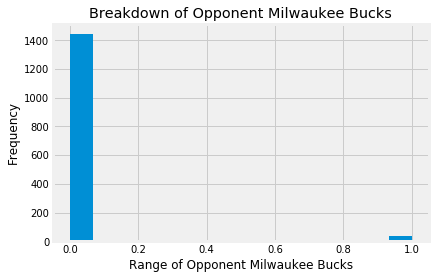

In [60]:
#Here is a histogram for opptAbbr_MIL 

nuggets.loc[:,"opptAbbr_MIL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Milwaukee Bucks")
plt.title("Breakdown of Opponent Milwaukee Bucks");

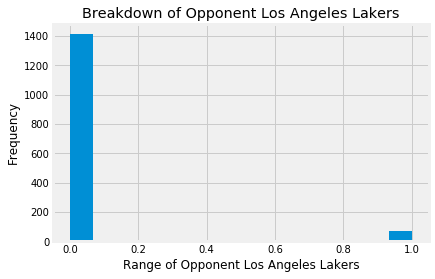

In [61]:
#Here is a histogram for opptAbbr_LAL 

nuggets.loc[:,"opptAbbr_LAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Lakers")
plt.title("Breakdown of Opponent Los Angeles Lakers");

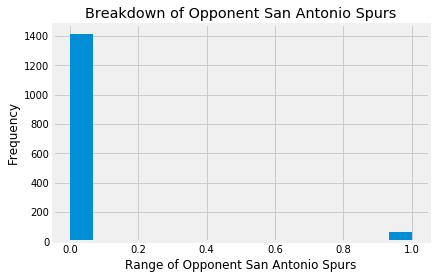

In [62]:
#Here is a histogram for opptAbbr_SA

nuggets.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

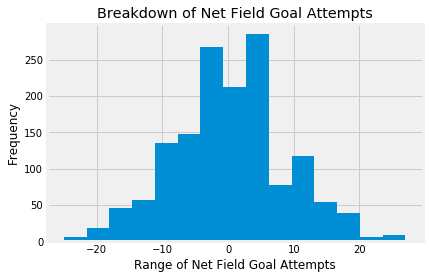

In [63]:
#Here is a histogram for Net_FGA

nuggets.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

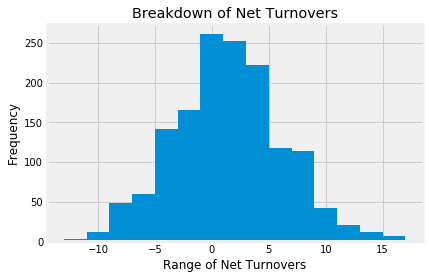

In [64]:
#Here is a histogram for Net_TO

nuggets.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

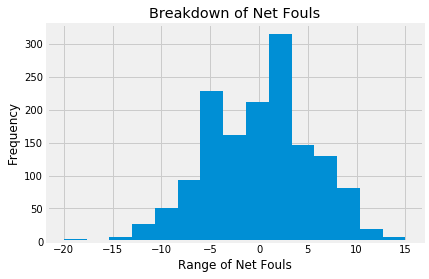

In [65]:
#Here is a histogram for Net_Fouls

nuggets.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Miami Heat

In [66]:
heat = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'MIA']

In [67]:
heat.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
9,MIA,0,1,-8,4,3,-3,4,0.0243,1,...,0,0,0,0,0,0,0,0,0,0
10,MIA,0,1,-8,4,3,-3,4,0.0243,1,...,0,0,0,0,0,0,0,0,0,0
11,MIA,0,1,-8,4,3,-3,4,0.0243,1,...,0,0,0,0,0,0,0,0,0,0
108,MIA,3,-9,7,-6,5,-4,-13,0.0362,3,...,0,0,0,0,0,0,0,0,0,0
109,MIA,3,-9,7,-6,5,-4,-13,0.0362,3,...,0,0,0,0,0,0,0,0,0,0


In [68]:
heat.shape

(1477, 130)

In [69]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Heat

heat.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.618549
Net_AST                      0.497089
Net_3P%                      0.466295
Net_TRB                      0.271217
Net_STL                      0.268795
Net_BLK                      0.217881
teamLoc_Home                 0.173995
Net_FTA                      0.148123
opptAbbr_PHO                 0.105062
opptAbbr_DAL                 0.078284
opptAbbr_CHA                 0.073769
opptAbbr_ORL                 0.054593
opptAbbr_CLE                 0.053459
opptAbbr_SAC                 0.051507
opptAbbr_LAL                 0.051507
Off_Name_DickBavetta         0.043467
opptAbbr_PHI                 0.040499
Off_Name_BennettSalvatore    0.040235
Off_Name_ZachZarba           0.038206
Off_Name_BrandonAdair        0.037630
Net_2PA                      0.035434
Off_Name_MichaelSmith        0.031624
Off_Name_KevinFehr           0.030715
Off_Name_BenTaylor           0.029576
opptAbbr_MIN                 0.028015
Off_Name_Sea

In [70]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the heat subset to only those variables with .1 or greater correlation

heat = heat.drop(['Off_Name_SirAllenConner','Off_Name_RandyRichardson','Off_Name_ScottBolnick',
                                  'Off_Name_KippKissinger','Off_Name_MattMyers','Off_Name_BrendaPantoja',
                                  'opptAbbr_MIA','opptAbbr_OKC','opptAbbr_BOS',
                                  'Off_Name_LeroyRichardson','opptAbbr_IND','opptAbbr_POR',
                                  'Off_Name_JasonPhillips', 'Off_Name_DerekRichardson', 'Off_Name_JasonGoldenberg', 
                                  'Off_Name_RayAcosta','Off_Name_KarlLane', 'Off_Name_RodneyMott', 
                                  'Net_3PA', 'Off_Name_DavidGuthrie', 'Off_Name_TreMaddox', 
                                  'Off_Name_ScottFoster', 'Off_Name_JacynGoble', 'Off_Name_C.J.Washington',
                                  'Off_Name_PhenizeeRansom','Off_Name_EricDalen','Off_Name_ScottTwardoski', 
                                  'Off_Name_SeanCorbin', 'opptAbbr_MIN','Off_Name_BenTaylor','Off_Name_KevinFehr',
                                  'Off_Name_MichaelSmith', 'Net_2PA','Off_Name_BrandonAdair', 'Off_Name_ZachZarba',
                                  'Off_Name_BennettSalvatore','opptAbbr_PHI', 'Off_Name_DickBavetta','opptAbbr_LAL', 
                                  'opptAbbr_ORL','opptAbbr_CHA','opptAbbr_DAL'], axis = 'columns')

In [71]:
heat.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.618549
Net_AST                          0.497089
Net_3P%                          0.466295
Net_TRB                          0.271217
Net_STL                          0.268795
Net_BLK                          0.217881
teamLoc_Home                     0.173995
Net_FTA                          0.148123
opptAbbr_PHO                     0.105062
opptAbbr_CLE                     0.053459
opptAbbr_SAC                     0.051507
opptAbbr_DEN                     0.024729
Off_Name_MontyMcCutchen          0.024086
Off_Name_DanCrawford             0.023026
Off_Name_MarkLindsay             0.022528
Off_Name_TonyBrown               0.021932
Off_Name_EddieRush               0.021711
Off_Name_VladimirVoyard-Tadal    0.021711
Off_Name_EdMalloy                0.021349
Off_Name_BillSpooner             0.020805
opptAbbr_BKN                     0.020513
Off_Name_BrianForte              0.018834
Off_Name_MattBoland              0

In [72]:
heat = heat.drop(['Off_Name_JonathanSterling','Off_Name_DerrickCollins','opptAbbr_MEM',
                                  'opptAbbr_LAC','opptAbbr_HOU','opptAbbr_NO',
                                  'Off_Name_StevenAnderson','Off_Name_TomWashington','Off_Name_NickBuchert',
                                  'Off_Name_LeonWood','Off_Name_JohnGoble','Off_Name_CourtneyKirkland',
                                  'opptAbbr_DET', 'Off_Name_BrentBarnaky', 'opptAbbr_TOR', 
                                  'Off_Name_LaurenHoltkamp','Off_Name_DavidJones', 'Off_Name_JoeDeRosa', 
                                  'Off_Name_BennieAdams', 'Off_Name_SeanWright', 'Off_Name_KaneFitzgerald', 
                                  'Off_Name_HaywoodeWorkman', 'opptAbbr_WAS', 'opptAbbr_UTA',
                                  'Off_Name_EricLewis','Net_Day_Off','Off_Name_RonGarretson', 
                                  'Off_Name_KevinScott', 'Off_Name_VioletPalmer','Off_Name_MitchellErvin','Off_Name_MattBoland',
                                  'Off_Name_BrianForte', 'opptAbbr_BKN','Off_Name_BillSpooner', 'Off_Name_EdMalloy',
                                  'Off_Name_VladimirVoyard-Tadal','Off_Name_EddieRush', 'Off_Name_TonyBrown',
                                  'Off_Name_MarkLindsay', 'opptAbbr_SAC', 'opptAbbr_CLE',
                                  'Off_Name_DanCrawford','Off_Name_MontyMcCutchen','opptAbbr_DEN'], axis = 'columns')

In [73]:
heat.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.618549
Net_AST                        0.497089
Net_3P%                        0.466295
Net_TRB                        0.271217
Net_STL                        0.268795
Net_BLK                        0.217881
teamLoc_Home                   0.173995
Net_FTA                        0.148123
opptAbbr_PHO                   0.105062
Off_Name_JamesCapers           0.015020
Off_Name_DedricTaylor          0.014361
Off_Name_TylerFord             0.014160
Off_Name_JustinVan Duyne       0.014160
Off_Name_GediminasPetraitis    0.014160
Off_Name_MarcDavis             0.013416
Off_Name_CurtisBlair           0.013416
opptAbbr_MIL                   0.012590
Net_FGA                        0.011077
Off_Name_JoeCrawford           0.007508
Off_Name_KevinCutler           0.007508
Off_Name_BillKennedy           0.007163
Off_Name_BrettNansel           0.007058
Off_Name_JamesWilliams         0.006987
Off_Name_ScottWall             0.004927


In [74]:
heat = heat.drop(['Off_Name_J.T.Orr','Off_Name_MaratKogut','opptAbbr_CHI',
                                  'opptAbbr_NY','Off_Name_KenMauer','Off_Name_OlandisPoole',
                                  'Off_Name_MarkAyotte','Off_Name_DerrickStafford','Off_Name_TonyBrothers',
                                  'Off_Name_JoshTiven','Off_Name_GaryZielinski','Off_Name_PatFraher',
                                  'Off_Name_EliRoe', 'Off_Name_MikeCallahan', 'Off_Name_ScottWall', 
                                  'Off_Name_JamesWilliams','Off_Name_BrettNansel', 'Off_Name_BillKennedy', 
                                  'Off_Name_KevinCutler', 'Off_Name_JoeCrawford', 'Net_FGA', 
                                  'opptAbbr_MIL', 'Off_Name_CurtisBlair', 'Off_Name_MarcDavis',
                                  'Off_Name_GediminasPetraitis','Off_Name_JustinVan Duyne','Off_Name_TylerFord', 
                                  'Off_Name_DedricTaylor', 'Off_Name_JamesCapers'], axis = 'columns')

In [75]:
heat.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.618549
Net_AST         0.497089
Net_3P%         0.466295
Net_TRB         0.271217
Net_STL         0.268795
Net_BLK         0.217881
teamLoc_Home    0.173995
Net_FTA         0.148123
opptAbbr_PHO    0.105062
opptAbbr_SA    -0.109159
opptAbbr_GS    -0.109159
Net_Fouls      -0.171044
Net_TO         -0.288962
Name: teamRslt_Win, dtype: float64

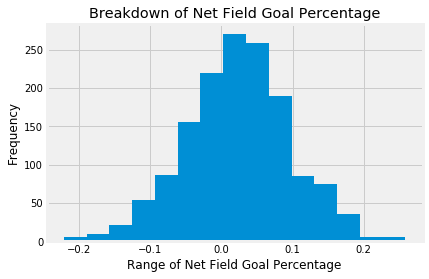

In [76]:
#Here is a histogram for Net_FG%

heat.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

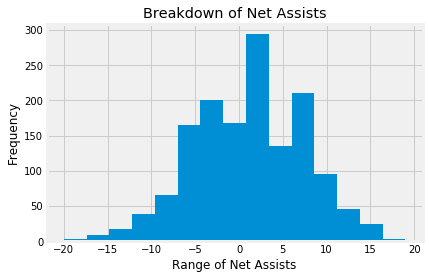

In [77]:
#Here is a histogram for Net_AST

heat.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

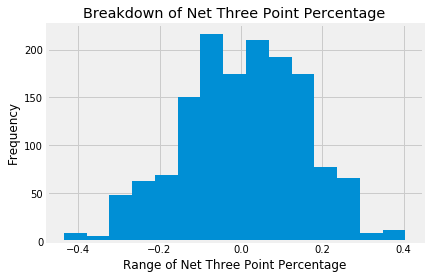

In [78]:
#Here is a histogram for Net_3P%

heat.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

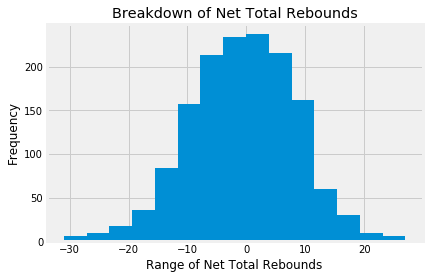

In [79]:
#Here is a histogram for Net_TRB

heat.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

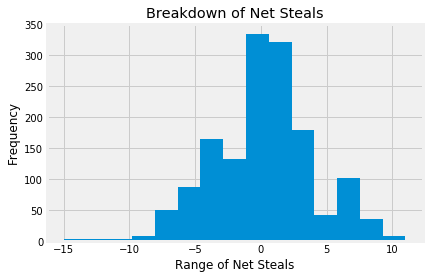

In [80]:
#Here is a histogram for Net_STL

heat.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

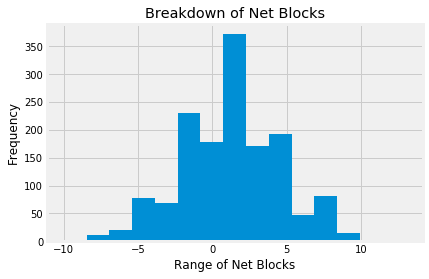

In [81]:
#Here is a histogram for Net_BLK

heat.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

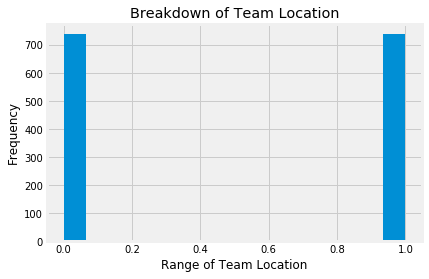

In [82]:
#Here is a histogram for teamLoc_Home

heat.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

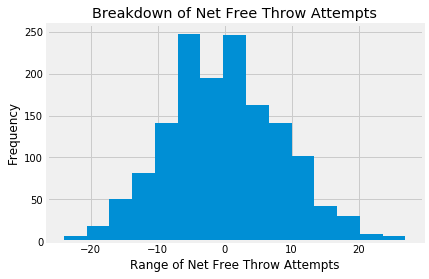

In [83]:
#Here is a histogram for Net_FTA 

heat.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

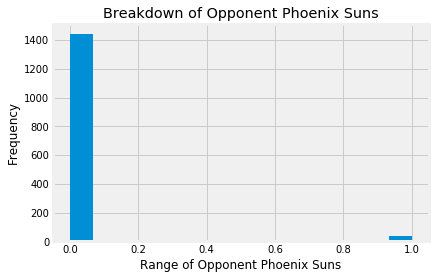

In [84]:
#Here is a histogram for opptAbbr_PHO

heat.loc[:,"opptAbbr_PHO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Phoenix Suns")
plt.title("Breakdown of Opponent Phoenix Suns");

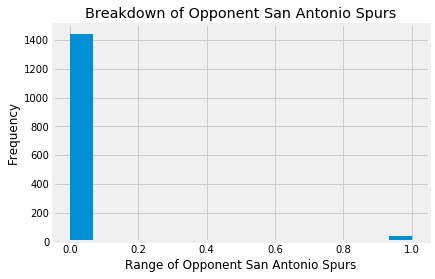

In [85]:
#Here is a histogram for opptAbbr_SA

heat.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

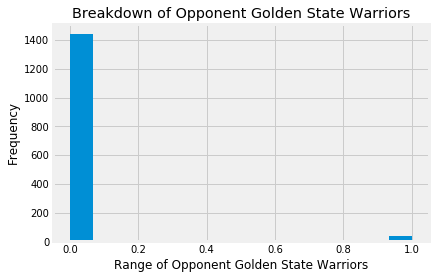

In [86]:
#Here is a histogram for opptAbbr_GS

heat.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

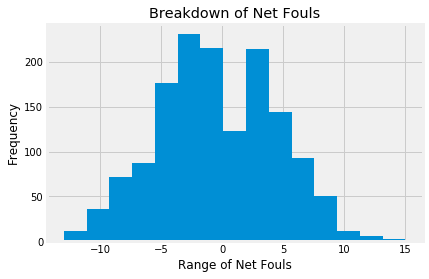

In [87]:
#Here is a histogram for Net_Fouls

heat.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

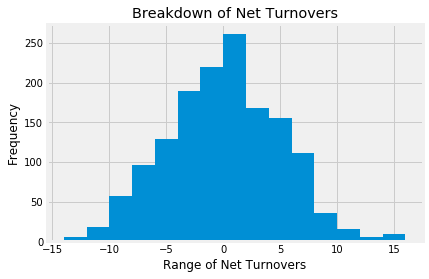

In [88]:
#Here is a histogram for Net_TO

heat.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Utah Jazz

In [89]:
jazz = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'UTA']

In [90]:
jazz.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
51,UTA,-1,4,-2,2,3,-7,4,0.0505,12,...,0,0,0,0,0,0,0,0,0,0
52,UTA,-1,4,-2,2,3,-7,4,0.0505,12,...,0,0,0,0,0,0,0,0,0,0
53,UTA,-1,4,-2,2,3,-7,4,0.0505,12,...,0,0,0,0,0,0,0,0,0,0
114,UTA,0,-4,3,0,2,5,4,-0.0450,-10,...,0,0,0,0,0,0,0,0,0,0
115,UTA,0,-4,3,0,2,5,4,-0.0450,-10,...,0,0,0,0,0,0,0,0,0,0


In [91]:
jazz.shape

(1477, 130)

In [92]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Jazz

jazz.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.665206
Net_AST                          0.503173
Net_3P%                          0.450553
Net_TRB                          0.420451
Net_BLK                          0.214366
teamLoc_Home                     0.207857
Net_STL                          0.202527
Net_FTA                          0.157906
opptAbbr_LAL                     0.111281
opptAbbr_PHO                     0.099040
opptAbbr_PHI                     0.079565
opptAbbr_MIL                     0.079565
opptAbbr_ORL                     0.079565
opptAbbr_DET                     0.079565
opptAbbr_MIN                     0.076225
Net_3PA                          0.072253
opptAbbr_SAC                     0.071075
opptAbbr_NO                      0.059717
opptAbbr_WAS                     0.053222
opptAbbr_BKN                     0.053222
opptAbbr_CHA                     0.053222
Off_Name_BennieAdams             0.051938
Net_Day_Off                      0

In [93]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the jazz subset to only those variables with .1 or greater correlation

jazz = jazz.drop(['Off_Name_VladimirVoyard-Tadal','Off_Name_SirAllenConner','Off_Name_ScottBolnick',
                                  'Off_Name_PhenizeeRansom','Off_Name_MattMyers','Off_Name_BrendaPantoja',
                                  'Off_Name_BrandonAdair','opptAbbr_UTA','opptAbbr_BOS',
                                  'opptAbbr_HOU','opptAbbr_GS','Net_FGA', 'opptAbbr_CHI',
                                  'opptAbbr_SA', 'Off_Name_KevinFehr', 'opptAbbr_TOR', 
                                  'Off_Name_TreMaddox','Off_Name_JoeCrawford', 'Off_Name_HaywoodeWorkman', 
                                  'Off_Name_EliRoe', 'opptAbbr_POR', 'Off_Name_DickBavetta', 
                                  'Off_Name_CourtneyKirkland', 'Off_Name_DerekRichardson', 'Off_Name_ZachZarba',
                                  'Off_Name_SeanWright','Off_Name_BillKennedy','Off_Name_JonathanSterling', 
                                  'Off_Name_ScottTwardoski', 'Net_Day_Off','Off_Name_BennieAdams','opptAbbr_CHA',
                                  'opptAbbr_BKN', 'opptAbbr_WAS','opptAbbr_NO', 'opptAbbr_SAC',
                                  'Net_3PA','opptAbbr_MIN', 'opptAbbr_DET','opptAbbr_ORL', 'opptAbbr_MIL', 
                                  'opptAbbr_PHI','opptAbbr_PHO'], axis = 'columns')

In [94]:
jazz.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.665206
Net_AST                     0.503173
Net_3P%                     0.450553
Net_TRB                     0.420451
Net_BLK                     0.214366
teamLoc_Home                0.207857
Net_STL                     0.202527
Net_FTA                     0.157906
opptAbbr_LAL                0.111281
Off_Name_DedricTaylor       0.034107
Off_Name_TonyBrothers       0.031344
Off_Name_LaurenHoltkamp     0.030475
Off_Name_BenTaylor          0.028281
Off_Name_TylerFord          0.026517
Off_Name_MitchellErvin      0.026365
Off_Name_RodneyMott         0.025732
Off_Name_DerrickCollins     0.025732
Off_Name_MattBoland         0.025732
Off_Name_LeonWood           0.024879
opptAbbr_DEN                0.019631
Off_Name_CurtisBlair        0.019408
Off_Name_DanCrawford        0.019408
Off_Name_StevenAnderson     0.015391
Off_Name_EdMalloy           0.014665
Off_Name_MaratKogut         0.013435
Off_Name_JustinVan Duyne    0.012113
O

In [95]:
jazz = jazz.drop(['Off_Name_DavidJones','opptAbbr_MEM','Off_Name_PatFraher',
                                  'Off_Name_BrentBarnaky','Off_Name_RandyRichardson','Off_Name_JasonGoldenberg',
                                  'Off_Name_EddieRush','Off_Name_KippKissinger','opptAbbr_IND',
                                  'opptAbbr_NY','opptAbbr_MIA','Off_Name_NickBuchert', 'Off_Name_VioletPalmer',
                                  'Off_Name_LeroyRichardson', 'opptAbbr_CLE', 'Off_Name_JoshTiven', 
                                  'Off_Name_MikeCallahan','Off_Name_JasonPhillips', 'Off_Name_KaneFitzgerald', 
                                  'Off_Name_DerrickStafford', 'Off_Name_JoeDeRosa', 'Off_Name_MichaelSmith', 
                                  'Off_Name_BillSpooner', 'Off_Name_SeanCorbin', 'Off_Name_TonyBrown',
                                  'Off_Name_OlandisPoole','Off_Name_JustinVan Duyne','Off_Name_MaratKogut', 
                                  'Off_Name_EdMalloy', 'Off_Name_StevenAnderson','Off_Name_DanCrawford','Off_Name_CurtisBlair',
                                  'opptAbbr_DEN', 'Off_Name_LeonWood','Off_Name_MattBoland', 'Off_Name_DerrickCollins',
                                  'Off_Name_RodneyMott','Off_Name_MitchellErvin', 'Off_Name_TylerFord','Off_Name_BenTaylor', 
                                  'Off_Name_LaurenHoltkamp', 
                                  'Off_Name_TonyBrothers','Off_Name_DedricTaylor'], axis = 'columns')

In [96]:
jazz.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.665206
Net_AST                        0.503173
Net_3P%                        0.450553
Net_TRB                        0.420451
Net_BLK                        0.214366
teamLoc_Home                   0.207857
Net_STL                        0.202527
Net_FTA                        0.157906
opptAbbr_LAL                   0.111281
Off_Name_KevinScott            0.011145
Off_Name_EricLewis             0.010750
Off_Name_JamesCapers           0.010400
Off_Name_KarlLane              0.006713
Off_Name_DavidGuthrie          0.005894
Off_Name_ScottFoster           0.005516
Off_Name_JohnGoble             0.000504
Off_Name_MarkAyotte            0.000487
Off_Name_BrianForte            0.000397
Off_Name_EricDalen             0.000376
Off_Name_GediminasPetraitis    0.000279
Off_Name_BrettNansel           0.000250
Off_Name_C.J.Washington        0.000250
Off_Name_JacynGoble            0.000216
Off_Name_RayAcosta             0.000176


In [97]:
jazz = jazz.drop(['Off_Name_RonGarretson','Off_Name_MarkLindsay','Off_Name_MarcDavis', 'Off_Name_J.T.Orr',
                                  'Off_Name_KevinCutler','opptAbbr_DAL','Off_Name_BennettSalvatore',
                                  'Off_Name_KenMauer','Off_Name_MontyMcCutchen','Off_Name_ScottWall',
                                  'Off_Name_JamesWilliams','Off_Name_TomWashington','Off_Name_GaryZielinski', 
                                  'Off_Name_RayAcosta', 'Off_Name_JacynGoble', 'Off_Name_C.J.Washington',
                                  'Off_Name_BrettNansel', 'Off_Name_GediminasPetraitis', 'Off_Name_EricDalen', 
                                  'Off_Name_BrianForte','Off_Name_MarkAyotte', 'Off_Name_JohnGoble', 
                                  'Off_Name_ScottFoster', 'Off_Name_DavidGuthrie', 'Off_Name_KarlLane', 
                                  'Off_Name_JamesCapers', 'Off_Name_EricLewis', 'Off_Name_KevinScott'
                                  ], axis = 'columns')

In [98]:
jazz.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.665206
Net_AST         0.503173
Net_3P%         0.450553
Net_TRB         0.420451
Net_BLK         0.214366
teamLoc_Home    0.207857
Net_STL         0.202527
Net_FTA         0.157906
opptAbbr_LAL    0.111281
Net_2PA        -0.111532
opptAbbr_OKC   -0.112422
opptAbbr_LAC   -0.117237
Net_Fouls      -0.141614
Net_TO         -0.159408
Name: teamRslt_Win, dtype: float64

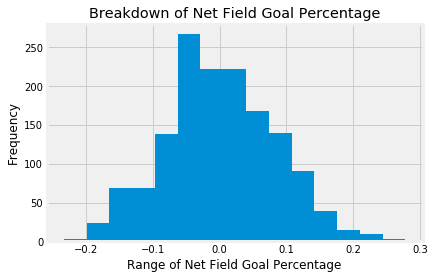

In [99]:
#Here is a histogram for Net_FG%

jazz.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

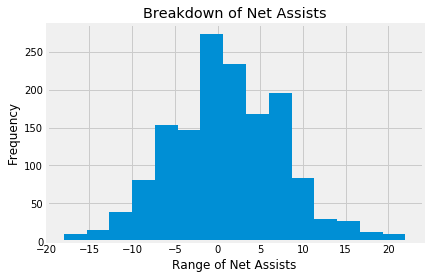

In [100]:
#Here is a histogram for Net_AST

jazz.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

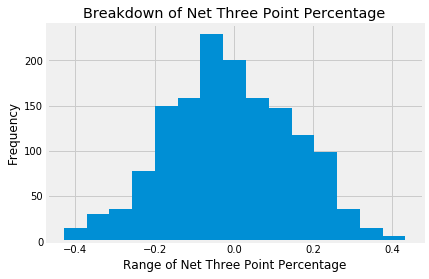

In [101]:
#Here is a histogram for Net_3P% 

jazz.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

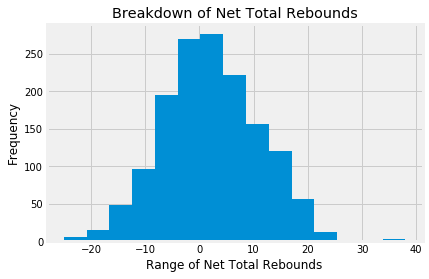

In [102]:
#Here is a histogram for Net_TRB

jazz.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

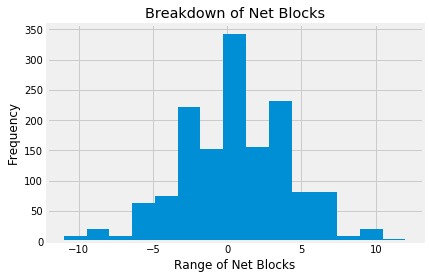

In [103]:
#Here is a histogram for Net_BLK

jazz.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

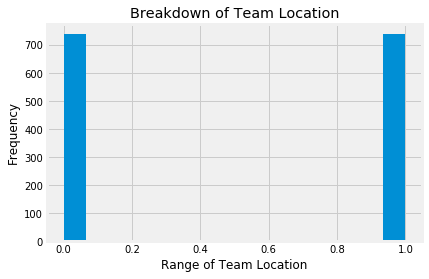

In [104]:
#Here is a histogram for teamLoc_Home

jazz.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

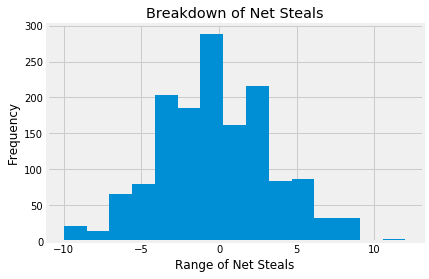

In [105]:
#Here is a histogram for Net_STL

jazz.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

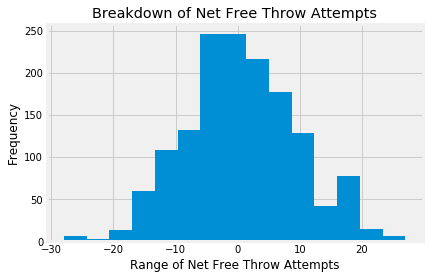

In [106]:
#Here is a histogram for Net_FTA

jazz.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

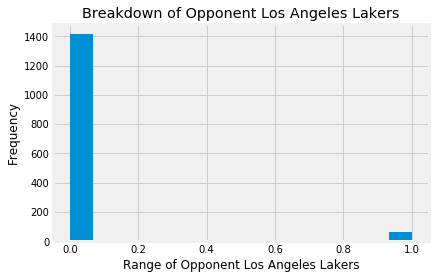

In [107]:
#Here is a histogram for opptAbbr_LAL

jazz.loc[:,"opptAbbr_LAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Lakers")
plt.title("Breakdown of Opponent Los Angeles Lakers");

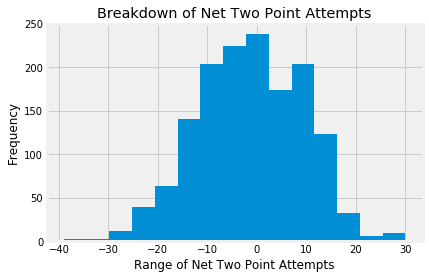

In [108]:
#Here is a histogram for Net_2PA 

jazz.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

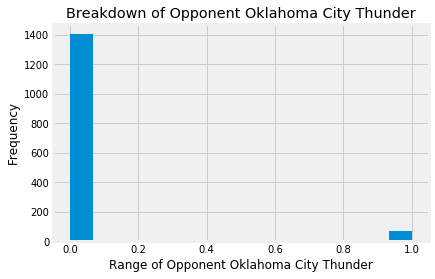

In [109]:
#Here is a histogram for opptAbbr_OKC

jazz.loc[:,"opptAbbr_OKC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Oklahoma City Thunder")
plt.title("Breakdown of Opponent Oklahoma City Thunder");

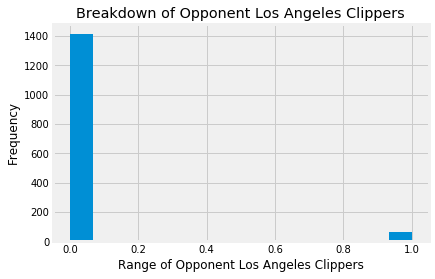

In [110]:
#Here is a histogram for opptAbbr_LAC

jazz.loc[:,"opptAbbr_LAC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Clippers")
plt.title("Breakdown of Opponent Los Angeles Clippers");

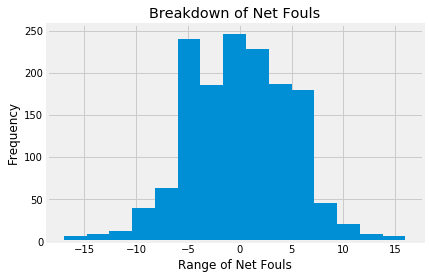

In [111]:
#Here is a histogram for Net_Fouls 

jazz.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

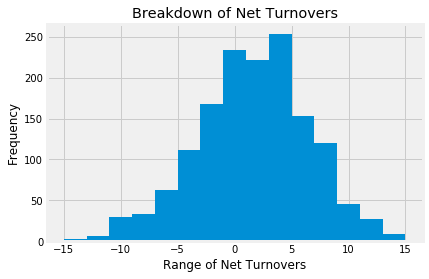

In [112]:
#Here is a histogram for Net_TO 

jazz.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Los Angeles Lakers

In [113]:
lakers = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'LAL']

In [114]:
lakers.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
15,LAL,0,2,2,-3,0,-4,-8,0.0229,-6,...,0,0,0,0,0,0,0,0,0,0
16,LAL,0,2,2,-3,0,-4,-8,0.0229,-6,...,0,0,0,0,0,0,0,0,0,0
17,LAL,0,2,2,-3,0,-4,-8,0.0229,-6,...,0,0,0,0,0,0,0,0,0,0
66,LAL,1,2,13,-4,-3,9,-11,-0.0060,-9,...,0,0,0,0,0,0,0,0,0,0
67,LAL,1,2,13,-4,-3,9,-11,-0.0060,-9,...,0,0,0,0,0,0,0,0,0,0


In [115]:
lakers.shape

(1477, 130)

In [116]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Lakers

lakers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.624432
Net_AST                          0.441489
Net_3P%                          0.403356
Net_TRB                          0.330004
Net_BLK                          0.197526
Net_STL                          0.188852
Net_FTA                          0.160234
teamLoc_Home                     0.158337
opptAbbr_DET                     0.106013
opptAbbr_BKN                     0.106013
Net_Day_Off                      0.099307
opptAbbr_PHI                     0.078348
Net_3PA                          0.076292
Off_Name_JonathanSterling        0.061843
opptAbbr_SAC                     0.052779
opptAbbr_ORL                     0.050684
opptAbbr_BOS                     0.050684
opptAbbr_MIN                     0.048704
Off_Name_BennieAdams             0.047719
Off_Name_MichaelSmith            0.046073
Off_Name_JoshTiven               0.044575
Off_Name_TomWashington           0.039430
Off_Name_MaratKogut              0

In [117]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the lakers subset to only those variables with .1 or greater correlation

lakers = lakers.drop(['Off_Name_VladimirVoyard-Tadal','Off_Name_SirAllenConner','Off_Name_ScottBolnick',
                                  'Off_Name_PhenizeeRansom','Off_Name_MattMyers','Off_Name_BrendaPantoja',
                                  'Off_Name_BrandonAdair','Off_Name_EddieRush','Off_Name_JoeDeRosa',
                                  'opptAbbr_LAL','Net_FGA','opptAbbr_POR', 'Off_Name_JustinVan Duyne',
                                  'opptAbbr_OKC', 'Off_Name_JamesWilliams', 'Off_Name_PatFraher', 
                                  'opptAbbr_UTA','Off_Name_StevenAnderson', 'Off_Name_MarkAyotte', 
                                  'Off_Name_ScottWall', 'opptAbbr_DEN', 'Off_Name_DerekRichardson', 
                                  'opptAbbr_HOU', 'opptAbbr_DAL', 'Off_Name_ScottFoster',
                                  'Off_Name_J.T.Orr','Off_Name_MikeCallahan','opptAbbr_NO', 
                                  'Off_Name_BennettSalvatore', 'Off_Name_GediminasPetraitis','Off_Name_MaratKogut',
                                  'Off_Name_TomWashington', 'Net_Day_Off', 'opptAbbr_PHI', 
                                  'Net_3PA', 'Off_Name_JonathanSterling','opptAbbr_SAC', 'opptAbbr_ORL',
                                  'opptAbbr_BOS','opptAbbr_MIN', 'Off_Name_BennieAdams','Off_Name_MichaelSmith',  
                                  'Off_Name_JoshTiven'], axis = 'columns')

In [118]:
lakers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.624432
Net_AST                      0.441489
Net_3P%                      0.403356
Net_TRB                      0.330004
Net_BLK                      0.197526
Net_STL                      0.188852
Net_FTA                      0.160234
teamLoc_Home                 0.158337
opptAbbr_DET                 0.106013
opptAbbr_BKN                 0.106013
Off_Name_DickBavetta         0.030259
Off_Name_JasonPhillips       0.030006
Off_Name_KenMauer            0.027835
Off_Name_ZachZarba           0.023103
opptAbbr_CHI                 0.023019
opptAbbr_CHA                 0.023019
Off_Name_EliRoe              0.022605
Off_Name_JohnGoble           0.021297
Off_Name_MontyMcCutchen      0.020493
Off_Name_DedricTaylor        0.019820
Off_Name_GaryZielinski       0.019756
Off_Name_DavidGuthrie        0.018717
opptAbbr_PHO                 0.013158
Off_Name_MarcDavis           0.012231
Off_Name_RayAcosta           0.011808
Off_Name_Rod

In [119]:
lakers = lakers.drop(['Off_Name_KippKissinger','Off_Name_LeonWood','opptAbbr_MIA',
                                  'opptAbbr_CLE','opptAbbr_TOR','opptAbbr_WAS',
                                  'Off_Name_BillKennedy','opptAbbr_GS','Off_Name_BrentBarnaky',
                                  'Off_Name_TylerFord','Off_Name_JoeCrawford','Off_Name_BillSpooner', 
                                  'Off_Name_DanCrawford', 'Off_Name_RonGarretson', 'Off_Name_RandyRichardson', 
                                  'Off_Name_KevinFehr', 'Off_Name_LeroyRichardson', 'Off_Name_TonyBrothers', 
                                  'Off_Name_VioletPalmer','Off_Name_BrettNansel', 'opptAbbr_MEM', 
                                  'Off_Name_KarlLane', 'Off_Name_DerrickStafford', 'Off_Name_EdMalloy', 
                                  'Off_Name_EricDalen', 'Off_Name_CourtneyKirkland', 'Off_Name_DickBavetta',
                                  'Off_Name_JasonPhillips','Off_Name_KenMauer','Off_Name_ZachZarba', 
                                  'opptAbbr_CHI', 'opptAbbr_CHA','Off_Name_EliRoe',
                                  'Off_Name_JohnGoble', 'Off_Name_MontyMcCutchen', 'Off_Name_DedricTaylor', 
                                  'Off_Name_GaryZielinski', 'Off_Name_DavidGuthrie','opptAbbr_PHO', 'Off_Name_MarcDavis',
                                  'Off_Name_RayAcosta','Off_Name_RodneyMott', 'Off_Name_KevinScott',
                                  'Off_Name_CourtneyKirkland'], axis = 'columns')

In [120]:
lakers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.624432
Net_AST                     0.441489
Net_3P%                     0.403356
Net_TRB                     0.330004
Net_BLK                     0.197526
Net_STL                     0.188852
Net_FTA                     0.160234
teamLoc_Home                0.158337
opptAbbr_DET                0.106013
opptAbbr_BKN                0.106013
Off_Name_MattBoland         0.009507
Off_Name_SeanCorbin         0.008482
Off_Name_HaywoodeWorkman    0.008482
Off_Name_DerrickCollins     0.008482
Off_Name_KaneFitzgerald     0.007470
Off_Name_DavidJones         0.007380
Off_Name_MarkLindsay        0.004212
Off_Name_NickBuchert        0.004212
Off_Name_CurtisBlair        0.003493
Off_Name_EricLewis          0.003493
Off_Name_OlandisPoole      -0.001326
Off_Name_MitchellErvin     -0.001877
Off_Name_LaurenHoltkamp    -0.002660
Off_Name_SeanWright        -0.003264
Off_Name_TonyBrown         -0.003529
Off_Name_BrianForte        -0.003529
O

In [121]:
lakers = lakers.drop(['Off_Name_JacynGoble','Off_Name_C.J.Washington','Off_Name_JasonGoldenberg',
                                  'Off_Name_BenTaylor','Off_Name_ScottTwardoski','opptAbbr_SA', 'Off_Name_EricLewis',
                                  'opptAbbr_NY','opptAbbr_MIL','opptAbbr_IND', 'Off_Name_CurtisBlair',
                                  'Off_Name_KevinCutler','Off_Name_TreMaddox','Off_Name_JamesCapers', 
                                  'Off_Name_BrianForte', 'Off_Name_TonyBrown', 'Off_Name_SeanWright', 
                                  'Off_Name_LaurenHoltkamp', 'Off_Name_MitchellErvin', 'Off_Name_OlandisPoole', 
                                  'Off_Name_MarkLindsay','Off_Name_DavidJones', 'Off_Name_KaneFitzgerald', 
                                  'Off_Name_DerrickCollins', 'Off_Name_HaywoodeWorkman', 'Off_Name_SeanCorbin', 
                                  'Off_Name_MattBoland', 'Off_Name_NickBuchert' ], axis = 'columns')

In [122]:
lakers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.624432
Net_AST         0.441489
Net_3P%         0.403356
Net_TRB         0.330004
Net_BLK         0.197526
Net_STL         0.188852
Net_FTA         0.160234
teamLoc_Home    0.158337
opptAbbr_DET    0.106013
opptAbbr_BKN    0.106013
opptAbbr_LAC   -0.105706
Net_2PA        -0.124873
Net_TO         -0.153358
Net_Fouls      -0.166861
Name: teamRslt_Win, dtype: float64

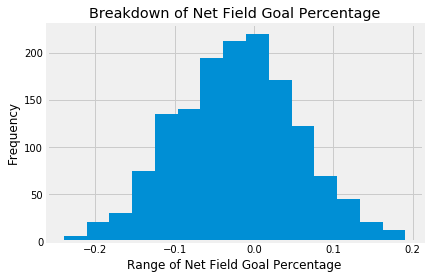

In [123]:
#Here is a histogram for Net_FG%

lakers.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

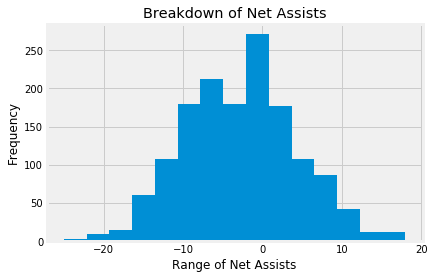

In [124]:
#Here is a histogram for Net_AST

lakers.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

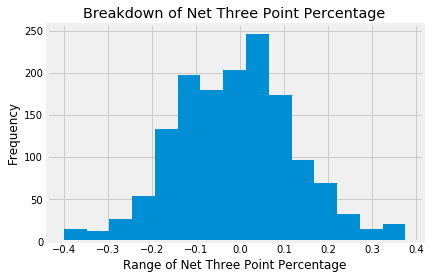

In [125]:
#Here is a histogram for Net_3P%

lakers.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

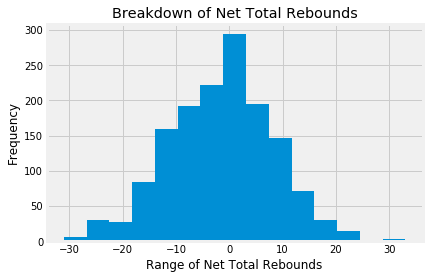

In [126]:
#Here is a histogram for Net_TRB

lakers.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

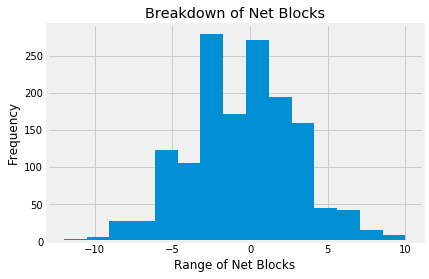

In [127]:
#Here is a histogram for Net_BLK

lakers.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

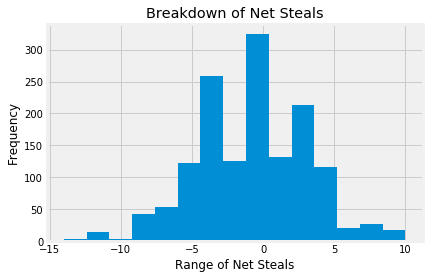

In [128]:
#Here is a histogram for Net_STL

lakers.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

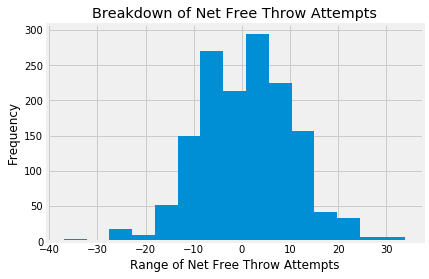

In [129]:
#Here is a histogram for Net_FTA

lakers.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

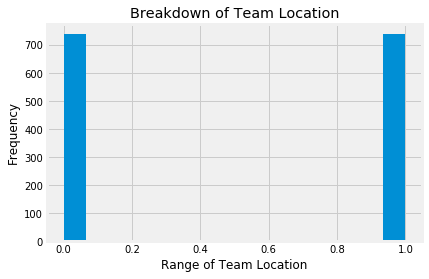

In [130]:
#Here is a histogram for teamLoc_Home

lakers.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

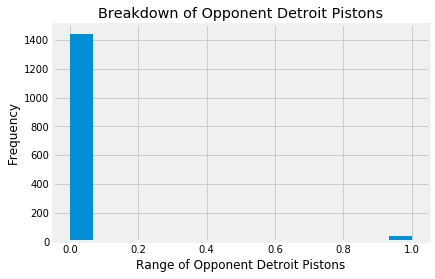

In [131]:
#Here is a histogram for opptAbbr_DET

lakers.loc[:,"opptAbbr_DET"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Detroit Pistons")
plt.title("Breakdown of Opponent Detroit Pistons");

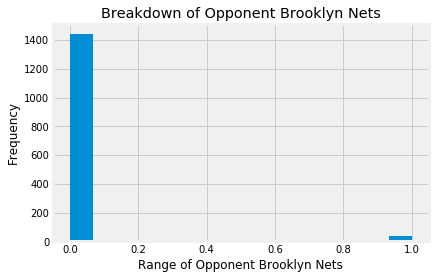

In [132]:
#Here is a histogram for opptAbbr_BKN

lakers.loc[:,"opptAbbr_BKN"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Brooklyn Nets")
plt.title("Breakdown of Opponent Brooklyn Nets");

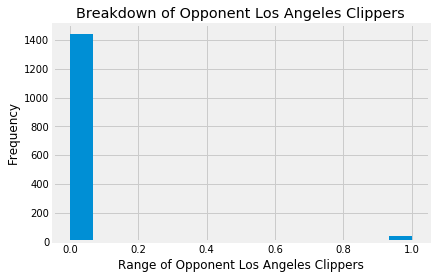

In [133]:
#Here is a histogram for opptAbbr_LAC

lakers.loc[:,"opptAbbr_DET"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Clippers")
plt.title("Breakdown of Opponent Los Angeles Clippers");

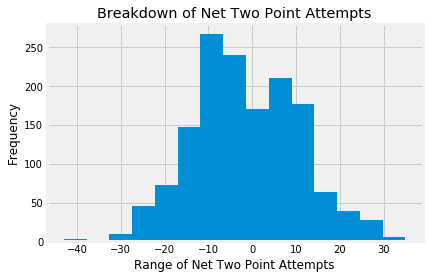

In [134]:
#Here is a histogram for Net_2PA

lakers.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

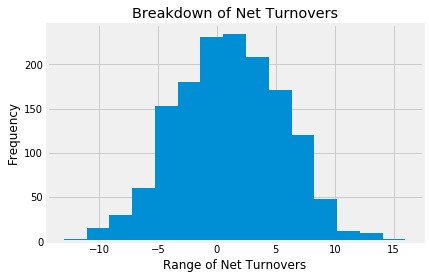

In [135]:
#Here is a histogram for Net_TO

lakers.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

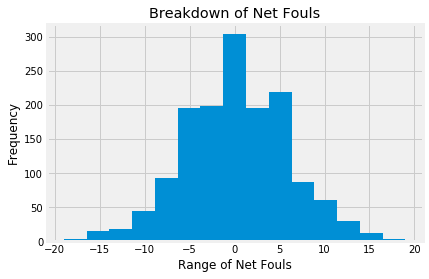

In [136]:
#Here is a histogram for Net_Fouls

lakers.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Milwaukee Bucks

In [137]:
bucks = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'MIL']

In [138]:
bucks.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
90,MIL,-3,4,1,3,1,-1,12,0.0192,8,...,0,0,0,0,0,0,0,0,0,0
91,MIL,-3,4,1,3,1,-1,12,0.0192,8,...,0,0,0,0,0,0,0,1,0,0
92,MIL,-3,4,1,3,1,-1,12,0.0192,8,...,0,0,0,0,0,0,0,0,0,0
195,MIL,0,13,1,-1,9,-3,-4,0.0491,-12,...,0,0,0,0,0,0,0,0,0,0
196,MIL,0,13,1,-1,9,-3,-4,0.0491,-12,...,0,0,0,0,0,0,0,0,0,0


In [139]:
bucks.shape

(1477, 130)

In [140]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Bucks

bucks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.606766
Net_AST                      0.471840
Net_3P%                      0.456550
Net_TRB                      0.277831
Net_BLK                      0.254031
Net_STL                      0.238632
Net_FTA                      0.209096
teamLoc_Home                 0.151097
opptAbbr_PHI                 0.128619
opptAbbr_PHO                 0.101248
opptAbbr_BKN                 0.099708
opptAbbr_LAL                 0.074663
opptAbbr_SAC                 0.074663
opptAbbr_POR                 0.074663
opptAbbr_ORL                 0.069092
opptAbbr_NY                  0.069092
Off_Name_DerrickStafford     0.050564
Net_Day_Off                  0.045908
Off_Name_RonGarretson        0.045839
Off_Name_LeonWood            0.045187
Off_Name_PhenizeeRansom      0.042169
Off_Name_KevinFehr           0.039229
Off_Name_MikeCallahan        0.033733
Off_Name_KarlLane            0.033644
Off_Name_HaywoodeWorkman     0.033644
Off_Name_Bre

In [141]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the bucks subset to only those variables with .1 or greater correlation

bucks = bucks.drop(['Off_Name_SirAllenConner','Off_Name_RandyRichardson','Off_Name_ScottBolnick',
                                  'Off_Name_BrendaPantoja','opptAbbr_MIL','opptAbbr_DEN', 'Net_2PA',
                                  'opptAbbr_TOR','opptAbbr_SA','opptAbbr_HOU', 'opptAbbr_NO', 'opptAbbr_UTA',
                                  'opptAbbr_DAL','opptAbbr_LAC','Net_FGA', 'opptAbbr_WAS', 'Off_Name_BennettSalvatore',
                                  'Off_Name_EdMalloy', 'Off_Name_EddieRush', 'opptAbbr_CLE', 'Off_Name_JasonPhillips',
                                  'Off_Name_C.J.Washington','Off_Name_PatFraher', 'Off_Name_ScottWall', 
                                  'Off_Name_J.T.Orr', 'Off_Name_NickBuchert', 'Off_Name_TonyBrown', 'Off_Name_BrandonAdair',
                                  'Off_Name_MattMyers', 'Off_Name_BrettNansel', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_KarlLane','Off_Name_MikeCallahan','Off_Name_KevinFehr', 'opptAbbr_POR',
                                  'Off_Name_PhenizeeRansom', 'Off_Name_LeonWood','Off_Name_RonGarretson',
                                  'Net_Day_Off', 'Off_Name_DerrickStafford', 'opptAbbr_NY', 'opptAbbr_ORL',
                                  'opptAbbr_SAC', 'opptAbbr_LAL','opptAbbr_BKN'], axis = 'columns')

In [142]:
bucks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.606766
Net_AST                        0.471840
Net_3P%                        0.456550
Net_TRB                        0.277831
Net_BLK                        0.254031
Net_STL                        0.238632
Net_FTA                        0.209096
teamLoc_Home                   0.151097
opptAbbr_PHI                   0.128619
opptAbbr_PHO                   0.101248
Off_Name_KippKissinger         0.029808
opptAbbr_BOS                   0.029408
Off_Name_JohnGoble             0.029266
Net_3PA                        0.028417
Off_Name_EricDalen             0.028284
Off_Name_MitchellErvin         0.027891
Off_Name_BillSpooner           0.027755
Off_Name_KevinScott            0.023139
opptAbbr_MIN                   0.021492
Off_Name_JonathanSterling      0.021311
Off_Name_RayAcosta             0.021311
Off_Name_TylerFord             0.020588
Off_Name_GediminasPetraitis    0.020128
Off_Name_JacynGoble            0.019688


In [143]:
bucks = bucks.drop(['Off_Name_JoeDeRosa','opptAbbr_OKC','opptAbbr_GS', 'Off_Name_DavidJones', 'opptAbbr_CHA', 
                                  'Off_Name_JoshTiven','Off_Name_DerekRichardson','opptAbbr_IND', 'Off_Name_SeanCorbin',
                                  'opptAbbr_MIA','Off_Name_JamesWilliams','Off_Name_BrentBarnaky', 'Off_Name_BennieAdams', 
                                  'Off_Name_MontyMcCutchen', 'Off_Name_EliRoe', 'Off_Name_DedricTaylor',
                                  'Off_Name_DavidGuthrie','Off_Name_JamesCapers','Off_Name_JoeCrawford', 'Off_Name_ZachZarba', 
                                  'opptAbbr_CHI', 'Off_Name_LaurenHoltkamp', 'Off_Name_MarkAyotte', 'Off_Name_LeroyRichardson',
                                  'Off_Name_DanCrawford', 'Off_Name_OlandisPoole', 'opptAbbr_DET', 'Off_Name_BillKennedy',
                                  'Off_Name_MarkLindsay','Off_Name_TomWashington', 'Off_Name_JacynGoble', 
                                  'Off_Name_GediminasPetraitis', 'Off_Name_TylerFord', 'Off_Name_RayAcosta', 
                                  'Off_Name_JonathanSterling', 'Net_3PA', 'Off_Name_JohnGoble',
                                  'opptAbbr_MIN', 'Off_Name_KevinScott', 'Off_Name_BillSpooner',
                                  'Off_Name_MitchellErvin','Off_Name_EricDalen', 'opptAbbr_BOS',
                                  'Off_Name_KippKissinger'], axis = 'columns')

In [144]:
bucks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.606766
Net_AST                          0.471840
Net_3P%                          0.456550
Net_TRB                          0.277831
Net_BLK                          0.254031
Net_STL                          0.238632
Net_FTA                          0.209096
teamLoc_Home                     0.151097
opptAbbr_PHI                     0.128619
opptAbbr_PHO                     0.101248
Off_Name_BrianForte              0.011583
Off_Name_MaratKogut              0.009459
Off_Name_TonyBrothers            0.009459
Off_Name_CourtneyKirkland        0.009459
Off_Name_DickBavetta             0.008684
Off_Name_JustinVan Duyne         0.008266
Off_Name_DerrickCollins          0.007810
Off_Name_GaryZielinski           0.007810
Off_Name_JasonGoldenberg         0.007086
Off_Name_CurtisBlair             0.006667
Off_Name_MarcDavis               0.006667
Off_Name_SeanWright              0.005609
Off_Name_MattBoland              0

In [145]:
bucks = bucks.drop(['Off_Name_KevinCutler','Off_Name_KenMauer','Off_Name_RodneyMott', 'Off_Name_ScottTwardoski', 
                                  'opptAbbr_MEM', 'Off_Name_TreMaddox', 'Off_Name_BenTaylor', 'Off_Name_MichaelSmith',
                                  'Off_Name_ScottFoster','Off_Name_KaneFitzgerald','Off_Name_VioletPalmer', 
                                  'Off_Name_StevenAnderson', 'Off_Name_EricLewis', 'Off_Name_VladimirVoyard-Tadal',
                                  'Off_Name_MattBoland','Off_Name_SeanWright','Off_Name_MarcDavis', 'Off_Name_DerrickCollins',
                                  'Off_Name_CurtisBlair', 'Off_Name_JasonGoldenberg', 'Off_Name_GaryZielinski',
                                  'Off_Name_JustinVan Duyne', 'Off_Name_DickBavetta', 'Off_Name_CourtneyKirkland',
                                  'Off_Name_TonyBrothers','Off_Name_MaratKogut','Off_Name_BrianForte'], axis = 'columns')

In [146]:
bucks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.606766
Net_AST         0.471840
Net_3P%         0.456550
Net_TRB         0.277831
Net_BLK         0.254031
Net_STL         0.238632
Net_FTA         0.209096
teamLoc_Home    0.151097
opptAbbr_PHI    0.128619
opptAbbr_PHO    0.101248
Net_Fouls      -0.224191
Net_TO         -0.250249
Name: teamRslt_Win, dtype: float64

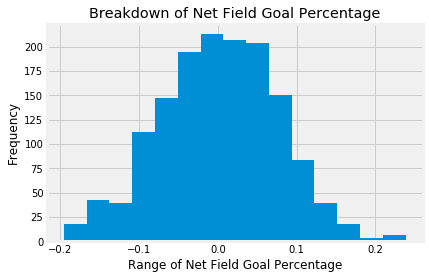

In [147]:
#Here is a histogram for Net_FG%

bucks.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

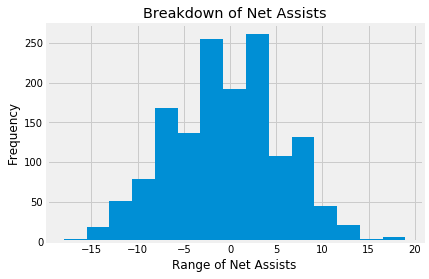

In [148]:
#Here is a histogram for Net_AST

bucks.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

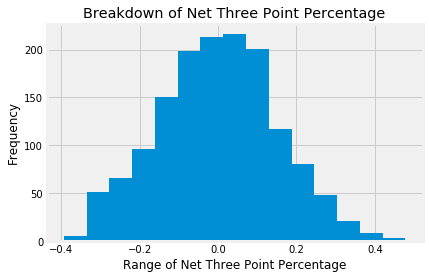

In [149]:
#Here is a histogram for Net_3P%

bucks.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

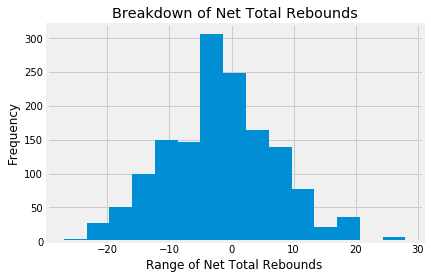

In [150]:
#Here is a histogram for Net_TRB

bucks.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

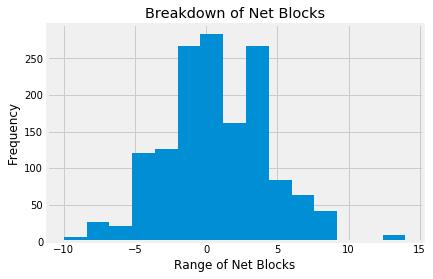

In [151]:
#Here is a histogram for Net_BLK

bucks.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

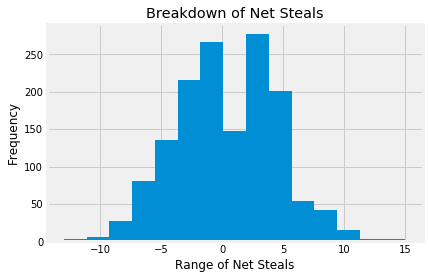

In [152]:
#Here is a histogram for Net_STL

bucks.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

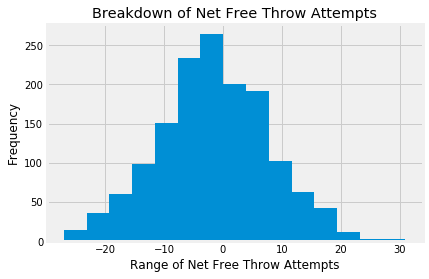

In [153]:
#Here is a histogram for Net_FTA

bucks.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

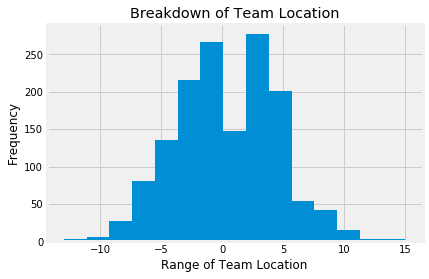

In [154]:
#Here is a histogram for teamLoc_Home

bucks.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

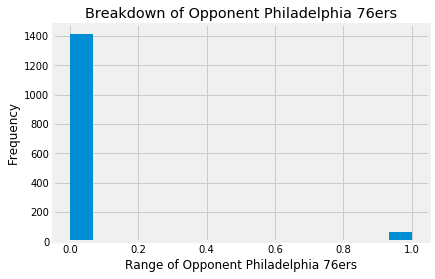

In [155]:
#Here is a histogram for opptAbbr_PHI

bucks.loc[:,"opptAbbr_PHI"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Philadelphia 76ers")
plt.title("Breakdown of Opponent Philadelphia 76ers");

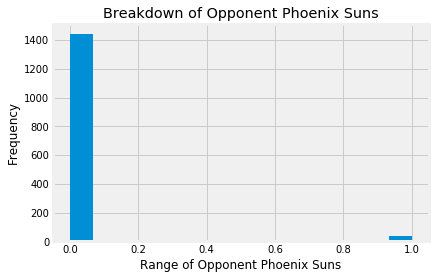

In [156]:
#Here is a histogram for opptAbbr_PHO

bucks.loc[:,"opptAbbr_PHO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Phoenix Suns")
plt.title("Breakdown of Opponent Phoenix Suns");

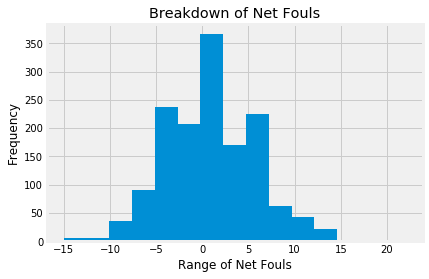

In [157]:
#Here is a histogram for Net_Fouls

bucks.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

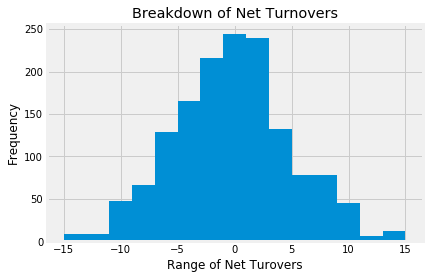

In [158]:
#Here is a histogram for Net_TO

bucks.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turovers")
plt.title("Breakdown of Net Turnovers");

#### Cleveland Cavaliers

In [159]:
cavaliers = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'CLE']

In [160]:
cavaliers.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
3,CLE,0,-4,8,-4,-5,2,-11,0.1001,1,...,0,0,0,1,0,0,0,0,0,0
4,CLE,0,-4,8,-4,-5,2,-11,0.1001,1,...,0,0,0,0,0,0,0,0,0,0
5,CLE,0,-4,8,-4,-5,2,-11,0.1001,1,...,0,0,0,0,0,0,0,0,0,0
99,CLE,1,-11,0,0,-3,4,10,-0.2326,0,...,0,0,0,0,0,0,0,0,0,0
100,CLE,1,-11,0,0,-3,4,10,-0.2326,0,...,0,0,0,0,0,0,0,0,0,0


In [161]:
cavaliers.shape

(1477, 130)

In [162]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Cavaliers

cavaliers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.628389
Net_AST                          0.469559
Net_3P%                          0.458060
Net_TRB                          0.418282
Net_BLK                          0.241998
Net_FTA                          0.233994
Net_STL                          0.214519
teamLoc_Home                     0.188345
opptAbbr_ORL                     0.138656
Net_3PA                          0.120039
opptAbbr_CHA                     0.072025
opptAbbr_LAL                     0.065268
Off_Name_DavidJones              0.061440
opptAbbr_WAS                     0.059699
opptAbbr_PHI                     0.059699
opptAbbr_MIL                     0.055599
Off_Name_GediminasPetraitis      0.051996
Off_Name_DerekRichardson         0.051996
opptAbbr_NY                      0.039960
opptAbbr_BKN                     0.039960
Net_Day_Off                      0.039721
opptAbbr_PHO                     0.038821
opptAbbr_MIN                     0

In [163]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the cavaliers subset to only those variables with .1 or greater correlation

cavaliers = cavaliers.drop(['Off_Name_VladimirVoyard-Tadal','Off_Name_RandyRichardson','Off_Name_PhenizeeRansom',
                                  'Off_Name_KippKissinger','Off_Name_BrandonAdair','opptAbbr_CLE', 'opptAbbr_GS',
                                  'Net_FGA','opptAbbr_CHI','opptAbbr_IND', 'Off_Name_JamesWilliams', 'opptAbbr_NO',
                                  'opptAbbr_POR','Off_Name_SirAllenConner','Off_Name_MaratKogut', 'Off_Name_BillKennedy',
                                  'Off_Name_KaneFitzgerald', 'Off_Name_RayAcosta', 'Off_Name_JonathanSterling',
                                  'Off_Name_KevinFehr', 'Off_Name_EliRoe', 'Off_Name_ScottBolnick', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_GaryZielinski','Off_Name_JoshTiven', 'opptAbbr_MIN', 'opptAbbr_PHO',
                                  'Net_Day_Off', 'opptAbbr_BKN', 'opptAbbr_NY', 'Off_Name_DerekRichardson',
                                  'Off_Name_GediminasPetraitis', 'opptAbbr_MIL', 'opptAbbr_PHI', 'opptAbbr_WAS',
                                  'Off_Name_DavidJones','opptAbbr_LAL','opptAbbr_CHA'], axis = 'columns')

In [164]:
cavaliers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.628389
Net_AST                     0.469559
Net_3P%                     0.458060
Net_TRB                     0.418282
Net_BLK                     0.241998
Net_FTA                     0.233994
Net_STL                     0.214519
teamLoc_Home                0.188345
opptAbbr_ORL                0.138656
Net_3PA                     0.120039
Off_Name_MikeCallahan       0.029639
Off_Name_KenMauer           0.029497
Off_Name_JamesCapers        0.027230
Off_Name_TylerFord          0.025804
Off_Name_SeanWright         0.025202
Off_Name_MattMyers          0.023814
Off_Name_JoeDeRosa          0.023814
Off_Name_BrendaPantoja      0.023814
Off_Name_MarkAyotte         0.022719
Off_Name_BrettNansel        0.021518
Off_Name_TreMaddox          0.020813
Off_Name_StevenAnderson     0.016947
Off_Name_MarcDavis          0.016251
Off_Name_TonyBrown          0.016251
Off_Name_ScottTwardoski     0.016251
Off_Name_CurtisBlair        0.016251
O

In [165]:
cavaliers = cavaliers.drop(['Off_Name_RonGarretson','Off_Name_BenTaylor','Off_Name_MarkLindsay', 'Off_Name_EdMalloy',
                                  'Off_Name_BrianForte','Off_Name_BennieAdams','Off_Name_MontyMcCutchen', 'Off_Name_PatFraher',
                                  'opptAbbr_DET','Off_Name_DavidGuthrie','Off_Name_DerrickStafford', 'Off_Name_J.T.Orr', 
                                  'opptAbbr_DAL', 'Off_Name_BillSpooner', 'Off_Name_JustinVan Duyne', 'opptAbbr_LAC',
                                  'opptAbbr_SAC','Off_Name_ScottFoster','Off_Name_MattBoland', 'Off_Name_SeanCorbin',
                                  'Off_Name_DedricTaylor', 'opptAbbr_BOS', 'Off_Name_EricLewis', 'Off_Name_DickBavetta',
                                  'Off_Name_NickBuchert', 'Off_Name_CurtisBlair', 'Off_Name_ScottTwardoski', 
                                  'Off_Name_TonyBrown', 'Off_Name_MarcDavis', 'Off_Name_StevenAnderson',
                                  'Off_Name_TreMaddox','Off_Name_BrettNansel', 'Off_Name_MarkAyotte', 'Off_Name_BrendaPantoja',
                                  'Off_Name_JoeDeRosa', 'Off_Name_MattMyers', 'Off_Name_SeanWright', 'Off_Name_TylerFord',
                                  'Off_Name_JamesCapers', 'Off_Name_KenMauer', 'Off_Name_MikeCallahan'], axis = 'columns')

In [166]:
cavaliers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.628389
Net_AST                      0.469559
Net_3P%                      0.458060
Net_TRB                      0.418282
Net_BLK                      0.241998
Net_FTA                      0.233994
Net_STL                      0.214519
teamLoc_Home                 0.188345
opptAbbr_ORL                 0.138656
Net_3PA                      0.120039
opptAbbr_DEN                 0.012373
opptAbbr_OKC                 0.012373
opptAbbr_MEM                 0.012373
Off_Name_OlandisPoole        0.011951
Off_Name_KevinCutler         0.011496
opptAbbr_TOR                 0.011478
Off_Name_LeroyRichardson     0.010061
Off_Name_LaurenHoltkamp      0.009509
Off_Name_TomWashington       0.008756
Off_Name_LeonWood            0.007931
Off_Name_ZachZarba           0.007559
Off_Name_BrentBarnaky        0.007559
opptAbbr_UTA                 0.007474
Off_Name_JacynGoble          0.006513
Off_Name_KarlLane            0.004124
Off_Name_C.J

In [167]:
cavaliers = cavaliers.drop(['Off_Name_JoeCrawford','Off_Name_DerrickCollins','Off_Name_CourtneyKirkland', 'Off_Name_JohnGoble',
                                  'Off_Name_JasonPhillips','Off_Name_TonyBrothers','Off_Name_KevinScott', 'opptAbbr_UTA',
                                  'Off_Name_JasonGoldenberg', 'Off_Name_RodneyMott', 'Off_Name_EddieRush',
                                  'Off_Name_DanCrawford','Off_Name_ScottWall','Off_Name_BennettSalvatore', 
                                  'Off_Name_EricDalen', 'Off_Name_VioletPalmer', 'Off_Name_MitchellErvin', 'opptAbbr_DEN',
                                  'Off_Name_MichaelSmith', 'Off_Name_C.J.Washington', 'Off_Name_KarlLane', 'opptAbbr_TOR',
                                  'Off_Name_JacynGoble', 'Off_Name_BrentBarnaky', 'Off_Name_ZachZarba', 'Off_Name_LeonWood',
                                  'Off_Name_TomWashington','Off_Name_LaurenHoltkamp','Off_Name_LeroyRichardson', 
                                  'Off_Name_KevinCutler', 'Off_Name_OlandisPoole', 'opptAbbr_MEM', 'opptAbbr_OKC'
                                  ], axis = 'columns')

In [168]:
cavaliers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.628389
Net_AST         0.469559
Net_3P%         0.458060
Net_TRB         0.418282
Net_BLK         0.241998
Net_FTA         0.233994
Net_STL         0.214519
teamLoc_Home    0.188345
opptAbbr_ORL    0.138656
Net_3PA         0.120039
opptAbbr_MIA   -0.109616
opptAbbr_HOU   -0.119864
opptAbbr_SA    -0.119864
Net_2PA        -0.154722
Net_TO         -0.164606
Net_Fouls      -0.253486
Name: teamRslt_Win, dtype: float64

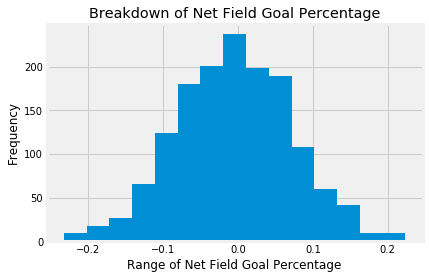

In [169]:
#Here is a histogram for Net_FG%

cavaliers.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

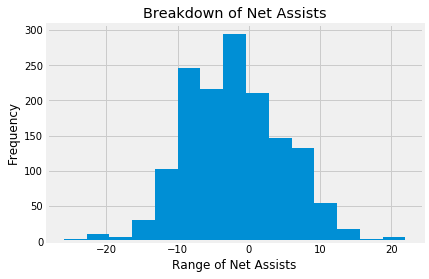

In [170]:
#Here is a histogram for Net_AST

cavaliers.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

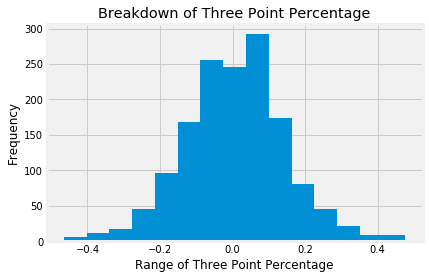

In [171]:
#Here is a histogram for Net_3P%

cavaliers.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Three Point Percentage")
plt.title("Breakdown of Three Point Percentage");

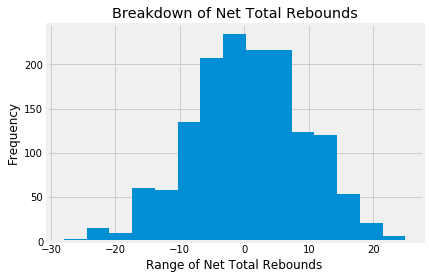

In [172]:
#Here is a histogram for Net_TRB

cavaliers.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

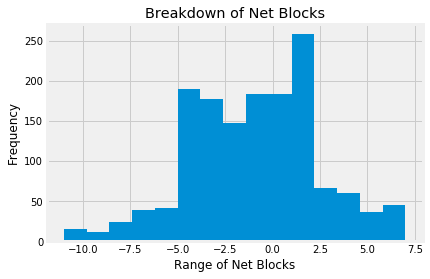

In [173]:
#Here is a histogram for Net_BLK

cavaliers.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

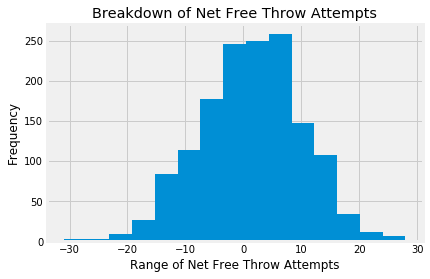

In [174]:
#Here is a histogram for Net_FTA

cavaliers.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

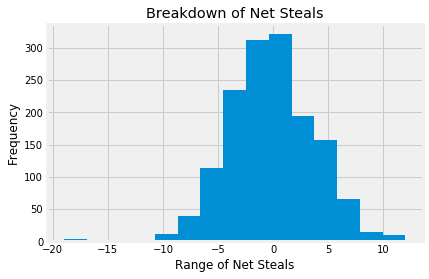

In [175]:
#Here is a histogram for Net_STL

cavaliers.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

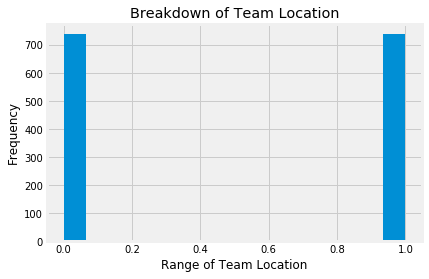

In [176]:
#Here is a histogram for teamLoc_Home

cavaliers.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

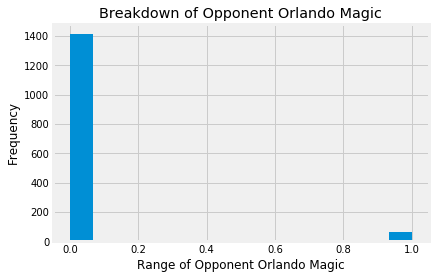

In [177]:
#Here is a histogram for opptAbbr_ORL

cavaliers.loc[:,"opptAbbr_ORL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Orlando Magic")
plt.title("Breakdown of Opponent Orlando Magic");

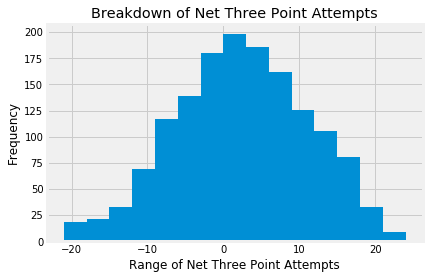

In [178]:
#Here is a histogram for Net_3PA

cavaliers.loc[:,"Net_3PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Attempts")
plt.title("Breakdown of Net Three Point Attempts");

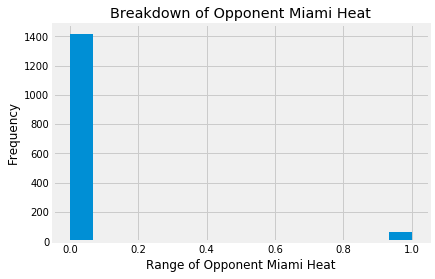

In [179]:
#Here is a histogram for opptAbbr_MIA

cavaliers.loc[:,"opptAbbr_MIA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Miami Heat")
plt.title("Breakdown of Opponent Miami Heat");

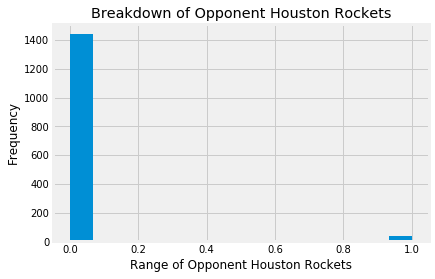

In [180]:
#Here is a histogram for opptAbbr_HOU

cavaliers.loc[:,"opptAbbr_HOU"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Houston Rockets")
plt.title("Breakdown of Opponent Houston Rockets");

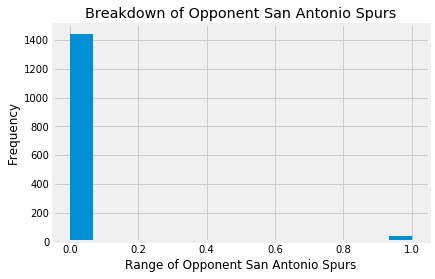

In [181]:
#Here is a histogram for opptAbbr_SA

cavaliers.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

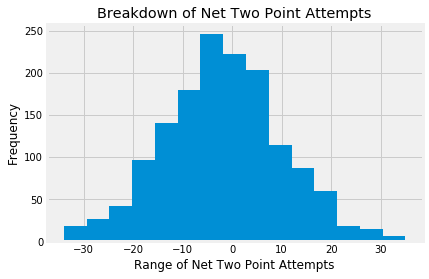

In [182]:
#Here is a histogram for Net_2PA 

cavaliers.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

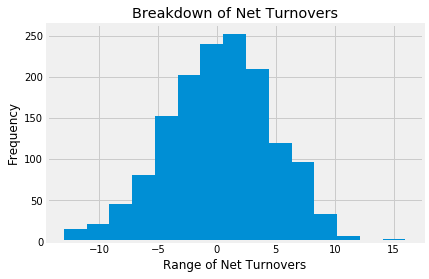

In [183]:
#Here is a histogram for Net_TO

cavaliers.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

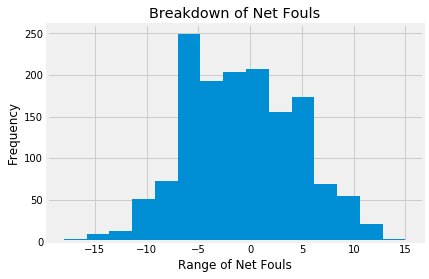

In [184]:
#Here is a histogram for Net_Fouls

cavaliers.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Portland Trailblazers

In [185]:
trailblazers = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'POR']

In [186]:
trailblazers.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
69,POR,-1,-2,-13,4,3,-9,11,0.0060,9,...,0,0,0,0,0,0,0,0,0,0
70,POR,-1,-2,-13,4,3,-9,11,0.0060,9,...,0,0,0,0,0,0,0,0,0,0
71,POR,-1,-2,-13,4,3,-9,11,0.0060,9,...,0,0,0,0,0,1,0,0,0,0
126,POR,1,-1,0,2,-10,3,13,-0.1536,-4,...,0,0,0,0,0,0,0,0,0,0
127,POR,1,-1,0,2,-10,3,13,-0.1536,-4,...,0,0,0,0,0,0,0,0,0,0


In [187]:
trailblazers.shape

(1477, 130)

In [188]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Trailblazers

trailblazers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.610895
Net_3P%                          0.449015
Net_AST                          0.425981
Net_TRB                          0.356207
Net_BLK                          0.265230
Net_STL                          0.253997
teamLoc_Home                     0.244518
Net_FTA                          0.130896
opptAbbr_LAL                     0.108848
opptAbbr_NY                      0.089076
opptAbbr_SAC                     0.075747
opptAbbr_MIN                     0.070660
Net_Day_Off                      0.065921
opptAbbr_CHI                     0.062583
opptAbbr_CHA                     0.062583
opptAbbr_IND                     0.062583
Off_Name_StevenAnderson          0.059814
opptAbbr_DEN                     0.051688
Off_Name_KevinCutler             0.048672
Off_Name_VioletPalmer            0.046177
Off_Name_BrentBarnaky            0.044037
Off_Name_JoeCrawford             0.040994
Off_Name_BillSpooner             0

In [189]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the trailblazers subset to only those variables with .1 or greater correlation

trailblazers = trailblazers.drop(['Off_Name_ScottBolnick','Off_Name_RayAcosta','Off_Name_KippKissinger', 'opptAbbr_POR',
                                  'Off_Name_BrandonAdair','opptAbbr_MEM','opptAbbr_LAC', 'opptAbbr_HOU', 'opptAbbr_MIL',
                                  'Off_Name_MarcDavis','opptAbbr_DAL','Off_Name_OlandisPoole', 'Off_Name_TomWashington',
                                  'opptAbbr_WAS', 'opptAbbr_TOR', 'Off_Name_VladimirVoyard-Tadal', 'Off_Name_EddieRush',
                                  'Off_Name_MikeCallahan','Off_Name_BennettSalvatore','Net_2PA', 'opptAbbr_SA',
                                  'Off_Name_CurtisBlair', 'Off_Name_EricDalen', 'Off_Name_ZachZarba', 'Off_Name_BillSpooner',
                                  'Off_Name_JoeCrawford', 'Off_Name_BrentBarnaky', 'Off_Name_VioletPalmer',
                                  'Off_Name_KevinCutler', 'opptAbbr_DEN', 'Off_Name_StevenAnderson', 'opptAbbr_IND',
                                  'opptAbbr_CHA','opptAbbr_CHI', 'Net_Day_Off', 'opptAbbr_MIN', 'opptAbbr_SAC', 
                                  'opptAbbr_NY'], axis = 'columns')

In [190]:
trailblazers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.610895
Net_3P%                      0.449015
Net_AST                      0.425981
Net_TRB                      0.356207
Net_BLK                      0.265230
Net_STL                      0.253997
teamLoc_Home                 0.244518
Net_FTA                      0.130896
opptAbbr_LAL                 0.108848
Off_Name_TonyBrown           0.040116
Off_Name_BillKennedy         0.038075
Off_Name_JustinVan Duyne     0.036710
opptAbbr_BKN                 0.036090
Off_Name_RonGarretson        0.034517
Off_Name_JacynGoble          0.033096
Off_Name_JoshTiven           0.031824
Off_Name_TreMaddox           0.025083
Off_Name_MichaelSmith        0.024387
Off_Name_JonathanSterling    0.023395
Off_Name_MattMyers           0.023395
Off_Name_RandyRichardson     0.023395
Off_Name_RodneyMott          0.022923
Off_Name_JoeDeRosa           0.020633
Net_3PA                      0.020084
Off_Name_DerekRichardson     0.018574
Off_Name_Mit

In [191]:
trailblazers = trailblazers.drop(['Off_Name_CourtneyKirkland','Off_Name_JohnGoble','Off_Name_JasonGoldenberg', 
                                  'Off_Name_PhenizeeRansom', 'Off_Name_BrendaPantoja', 'Off_Name_SirAllenConner',
                                  'Off_Name_BrettNansel','Off_Name_KevinFehr','Off_Name_TylerFord', 'Off_Name_JasonPhillips', 
                                  'Net_FGA', 'Off_Name_JamesCapers', 'Off_Name_KaneFitzgerald', 'Off_Name_MaratKogut', 
                                  'Off_Name_BenTaylor','Off_Name_ScottWall','Off_Name_EliRoe', 'Off_Name_DedricTaylor',
                                  'opptAbbr_DET', 'Off_Name_LeroyRichardson', 'Off_Name_PatFraher', 'Off_Name_EdMalloy',
                                  'opptAbbr_BOS','Off_Name_KevinScott','Off_Name_DavidGuthrie', 'Off_Name_JamesWilliams',
                                  'opptAbbr_PHO', 'Off_Name_KenMauer', 'Off_Name_MitchellErvin', 'Off_Name_DerekRichardson',
                                  'Net_3PA', 'Off_Name_JoeDeRosa', 'Off_Name_RodneyMott', 'Off_Name_RandyRichardson',
                                  'Off_Name_MattMyers', 'Off_Name_JonathanSterling', 'Off_Name_MichaelSmith', 
                                  'Off_Name_TreMaddox', 'Off_Name_RonGarretson', 'Off_Name_JustinVan Duyne',
                                  'Off_Name_JoshTiven','Off_Name_JacynGoble', 'opptAbbr_BKN', 'Off_Name_BillKennedy', 
                                  'Off_Name_TonyBrown'], axis = 'columns')

In [192]:
trailblazers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.610895
Net_3P%                        0.449015
Net_AST                        0.425981
Net_TRB                        0.356207
Net_BLK                        0.265230
Net_STL                        0.253997
teamLoc_Home                   0.244518
Net_FTA                        0.130896
opptAbbr_LAL                   0.108848
opptAbbr_NO                    0.016427
Off_Name_ScottFoster           0.014052
opptAbbr_UTA                   0.013744
opptAbbr_OKC                   0.013744
Off_Name_DerrickStafford       0.012950
Off_Name_KarlLane              0.012365
Off_Name_GaryZielinski         0.012153
Off_Name_DavidJones            0.011796
Off_Name_LeonWood              0.010826
opptAbbr_MIA                   0.009596
opptAbbr_PHI                   0.009596
opptAbbr_ORL                   0.009596
opptAbbr_CLE                   0.009596
Off_Name_ScottTwardoski        0.009339
Off_Name_MarkLindsay           0.007615


In [193]:
trailblazers = trailblazers.drop(['Off_Name_LaurenHoltkamp','Off_Name_MattBoland','Off_Name_SeanWright', 'Off_Name_MarkAyotte',
                                  'Off_Name_J.T.Orr', 'Off_Name_C.J.Washington', 'Off_Name_MontyMcCutchen',
                                  'Off_Name_TonyBrothers','Off_Name_BrianForte','Off_Name_BennieAdams', 'Off_Name_DanCrawford',
                                  'Off_Name_SeanCorbin', 'Off_Name_NickBuchert', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_GediminasPetraitis', 'Off_Name_EricLewis', 'Off_Name_DerrickCollins', 
                                  'Off_Name_DickBavetta', 'Off_Name_MarkLindsay', 'Off_Name_ScottTwardoski', 'opptAbbr_MIA',
                                  'opptAbbr_CLE','opptAbbr_ORL','opptAbbr_PHI', 'Off_Name_LeonWood', 'Off_Name_DavidJones', 
                                  'Off_Name_GaryZielinski', 'Off_Name_KarlLane', 'Off_Name_DerrickStafford', 
                                  'opptAbbr_OKC', 'opptAbbr_UTA', 'Off_Name_ScottFoster', 'opptAbbr_NO'], axis = 'columns')

In [194]:
trailblazers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.610895
Net_3P%         0.449015
Net_AST         0.425981
Net_TRB         0.356207
Net_BLK         0.265230
Net_STL         0.253997
teamLoc_Home    0.244518
Net_FTA         0.130896
opptAbbr_LAL    0.108848
opptAbbr_GS    -0.133760
Net_Fouls      -0.176883
Net_TO         -0.178040
Name: teamRslt_Win, dtype: float64

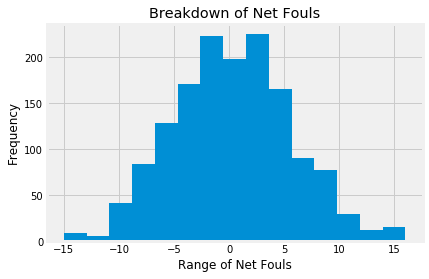

In [195]:
#Here is a histogram for Net_Fouls

trailblazers.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

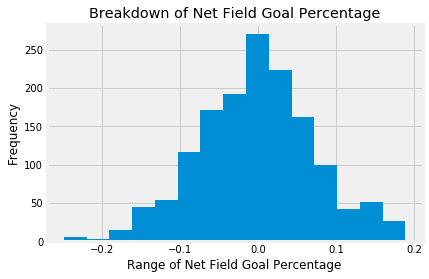

In [196]:
#Here is a histogram for Net_FG%

trailblazers.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

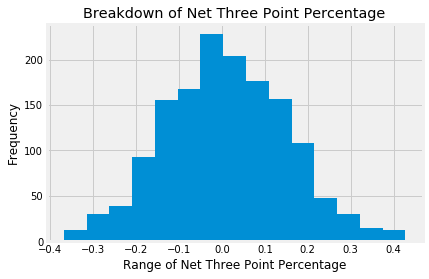

In [197]:
#Here is a histogram for Net_3P%

trailblazers.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

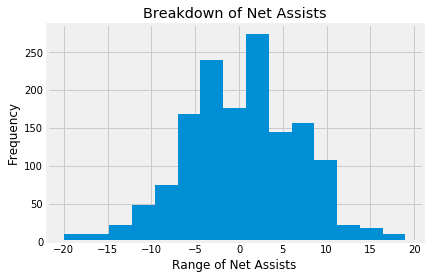

In [198]:
#Here is a histogram for Net_AST

trailblazers.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

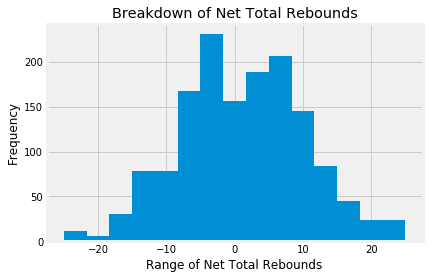

In [199]:
#Here is a histogram for Net_TRB

trailblazers.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

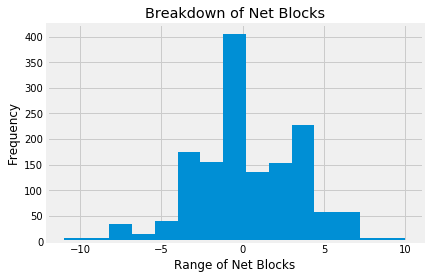

In [200]:
#Here is a histogram for Net_BLK

trailblazers.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

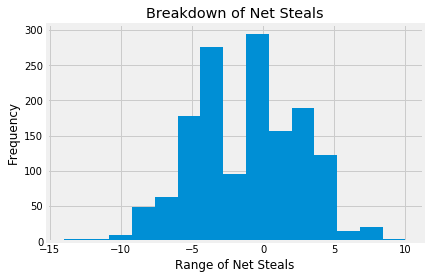

In [201]:
#Here is a histogram for Net_STL

trailblazers.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

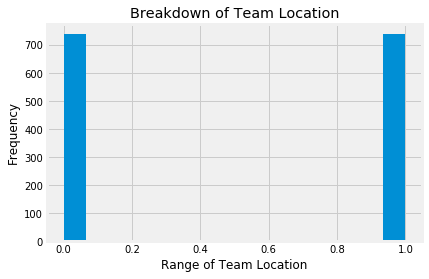

In [202]:
#Here is a histogram for teamLoc_Home

trailblazers.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

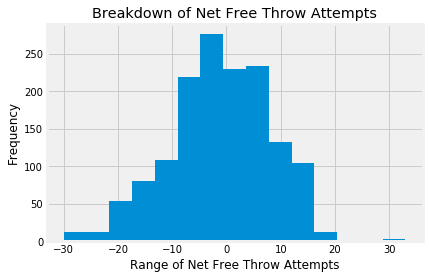

In [203]:
#Here is a histogram for Net_FTA

trailblazers.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

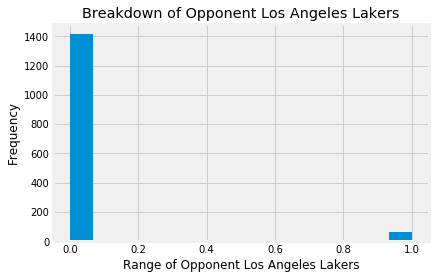

In [204]:
#Here is a histogram for opptAbbr_LAL

trailblazers.loc[:,"opptAbbr_LAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Lakers")
plt.title("Breakdown of Opponent Los Angeles Lakers");

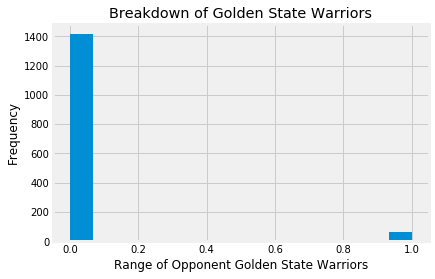

In [205]:
#Here is a histogram for opptAbbr_GS

trailblazers.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Golden State Warriors");

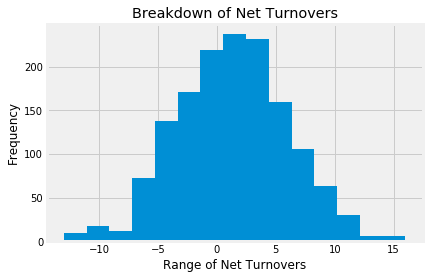

In [206]:
#Here is a histogram for Net_TO

trailblazers.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Chicago Bulls

In [207]:
bulls = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'CHI']

In [208]:
bulls.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
39,CHI,0,7,-3,-2,5,-10,-5,0.0129,3,...,0,0,0,0,0,0,0,0,0,0
40,CHI,0,7,-3,-2,5,-10,-5,0.0129,3,...,0,0,0,0,0,0,0,1,0,0
41,CHI,0,7,-3,-2,5,-10,-5,0.0129,3,...,0,0,0,0,0,0,0,0,0,0
96,CHI,-1,11,0,0,3,-4,-10,0.2326,0,...,0,0,0,0,0,0,0,0,0,0
97,CHI,-1,11,0,0,3,-4,-10,0.2326,0,...,0,0,0,0,0,0,0,0,0,0


In [209]:
bulls.shape

(1477, 130)

In [210]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Bulls

bulls.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.668065
Net_AST                      0.475714
Net_3P%                      0.426824
Net_TRB                      0.391437
Net_FTA                      0.266082
Net_BLK                      0.210292
Net_STL                      0.177041
teamLoc_Home                 0.157839
opptAbbr_PHI                 0.124576
opptAbbr_ORL                 0.092050
Net_Day_Off                  0.080371
Off_Name_MontyMcCutchen      0.064440
Off_Name_MarcDavis           0.058762
Off_Name_VioletPalmer        0.053221
Off_Name_EddieRush           0.050615
opptAbbr_UTA                 0.048105
Off_Name_LeroyRichardson     0.047608
Off_Name_OlandisPoole        0.047301
opptAbbr_BKN                 0.044131
Off_Name_ScottTwardoski      0.043472
Off_Name_DerekRichardson     0.038750
Off_Name_StevenAnderson      0.036868
Off_Name_PhenizeeRansom      0.035766
Off_Name_KaneFitzgerald      0.034631
opptAbbr_MIL                 0.033983
Off_Name_J.T

In [211]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the bulls subset to only those variables with .1 or greater correlation

bulls = bulls.drop(['Off_Name_SirAllenConner','Off_Name_KippKissinger','Off_Name_BrendaPantoja', 'opptAbbr_CHI',
                                  'opptAbbr_POR','opptAbbr_DEN','Off_Name_DavidGuthrie', 'Off_Name_BrettNansel', 'opptAbbr_SA',
                                  'Off_Name_JustinVan Duyne','Off_Name_KevinFehr','opptAbbr_HOU', 'opptAbbr_OKC',
                                  'opptAbbr_WAS', 'Off_Name_JoeDeRosa', 'opptAbbr_MIA', 'Net_3PA', 'Off_Name_MarkLindsay',
                                  'Off_Name_MarkAyotte','Off_Name_BennettSalvatore','Off_Name_CourtneyKirkland', 'opptAbbr_DAL',
                                  'Off_Name_TreMaddox', 'Off_Name_ScottWall', 'Off_Name_C.J.Washington', 'opptAbbr_TOR',
                                  'opptAbbr_CHA', 'Off_Name_DavidJones', 'Off_Name_J.T.Orr', 'opptAbbr_MIL',
                                  'Off_Name_KaneFitzgerald', 'Off_Name_PhenizeeRansom', 'Off_Name_StevenAnderson',
                                  'Off_Name_DerekRichardson', 'Off_Name_ScottTwardoski', 'opptAbbr_BKN', 'opptAbbr_UTA',
                                  'Off_Name_OlandisPoole','Off_Name_LeroyRichardson', 'Off_Name_EddieRush', 
                                  'Off_Name_VioletPalmer', 'Off_Name_MarcDavis', 'Off_Name_MontyMcCutchen', 'Net_Day_Off',
                                  'opptAbbr_ORL'], axis = 'columns')

In [212]:
bulls.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.668065
Net_AST                          0.475714
Net_3P%                          0.426824
Net_TRB                          0.391437
Net_FTA                          0.266082
Net_BLK                          0.210292
Net_STL                          0.177041
teamLoc_Home                     0.157839
opptAbbr_PHI                     0.124576
opptAbbr_NY                      0.033040
Off_Name_MaratKogut              0.032934
Off_Name_ScottFoster             0.032885
Off_Name_HaywoodeWorkman         0.031751
Off_Name_DerrickCollins          0.031751
opptAbbr_CLE                     0.031152
Off_Name_SeanWright              0.028401
Off_Name_GediminasPetraitis      0.027577
Off_Name_VladimirVoyard-Tadal    0.025282
Off_Name_ScottBolnick            0.025282
Off_Name_JohnGoble               0.023690
Off_Name_TonyBrown               0.023690
opptAbbr_SAC                     0.021751
opptAbbr_NO                      0

In [213]:
bulls = bulls.drop(['opptAbbr_GS','Off_Name_BillSpooner','Off_Name_TonyBrothers', 'Off_Name_BrentBarnaky',
                                  'Off_Name_BillKennedy', 'Off_Name_RandyRichardson', 'Off_Name_BrandonAdair',
                                  'Off_Name_MattMyers','Off_Name_EliRoe','opptAbbr_IND', 'Off_Name_TomWashington', 
                                  'Off_Name_GaryZielinski', 'Off_Name_KarlLane', 'Off_Name_ZachZarba', 'Off_Name_BenTaylor',
                                  'Off_Name_CurtisBlair','Off_Name_LeonWood','Off_Name_SeanCorbin', 'Off_Name_RonGarretson',
                                  'Off_Name_JamesCapers', 'Off_Name_DickBavetta', 'Off_Name_MitchellErvin', 'opptAbbr_LAL',
                                  'Off_Name_TylerFord', 'Off_Name_JasonGoldenberg', 'Off_Name_NickBuchert', 'opptAbbr_NO',
                                  'Off_Name_KevinCutler', 'Off_Name_JamesWilliams', 'Off_Name_PatFraher',
                                  'Off_Name_JacynGoble','Off_Name_TonyBrown','Off_Name_JohnGoble', 'Off_Name_ScottBolnick',
                                  'Off_Name_VladimirVoyard-Tadal', 'Off_Name_GediminasPetraitis', 'Off_Name_SeanWright', 
                                  'opptAbbr_CLE', 'Off_Name_DerrickCollins', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_ScottFoster', 'Off_Name_MaratKogut', 'opptAbbr_NY'], axis = 'columns')

In [214]:
bulls.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.668065
Net_AST                      0.475714
Net_3P%                      0.426824
Net_TRB                      0.391437
Net_FTA                      0.266082
Net_BLK                      0.210292
Net_STL                      0.177041
teamLoc_Home                 0.157839
opptAbbr_PHI                 0.124576
opptAbbr_SAC                 0.021751
opptAbbr_BOS                 0.013371
Off_Name_EricDalen           0.012749
Off_Name_LaurenHoltkamp      0.012455
Off_Name_JoshTiven           0.011931
Off_Name_KevinScott          0.011194
Off_Name_JoeCrawford         0.010039
Off_Name_MikeCallahan        0.007602
Off_Name_BrianForte          0.006971
Off_Name_DanCrawford         0.006971
Off_Name_DedricTaylor        0.004507
Off_Name_RodneyMott          0.002686
Off_Name_DerrickStafford     0.002223
Off_Name_JasonPhillips       0.001429
Off_Name_JonathanSterling   -0.001072
Off_Name_RayAcosta          -0.001518
Off_Name_Ben

In [215]:
bulls = bulls.drop(['Off_Name_KenMauer','Off_Name_MattBoland','Off_Name_MichaelSmith', 'opptAbbr_DET', 'opptAbbr_MEM',
                                  'opptAbbr_MIN', 'opptAbbr_PHO', 'Off_Name_EricLewis', 'Off_Name_EdMalloy',
                                  'Off_Name_BennieAdams','Off_Name_RayAcosta','Off_Name_JonathanSterling', 
                                  'Off_Name_JasonPhillips', 'Off_Name_DerrickStafford', 'Off_Name_RodneyMott',
                                  'Off_Name_DedricTaylor', 'Off_Name_DanCrawford', 'Off_Name_BrianForte', 
                                  'Off_Name_MikeCallahan', 'Off_Name_JoeCrawford', 'Off_Name_KevinScott', 'opptAbbr_SAC',
                                  'Off_Name_JoshTiven','Off_Name_LaurenHoltkamp','Off_Name_EricDalen', 'opptAbbr_BOS',
                                  ], axis = 'columns')

In [216]:
bulls.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.668065
Net_AST         0.475714
Net_3P%         0.426824
Net_TRB         0.391437
Net_FTA         0.266082
Net_BLK         0.210292
Net_STL         0.177041
teamLoc_Home    0.157839
opptAbbr_PHI    0.124576
opptAbbr_LAC   -0.110021
Net_2PA        -0.115955
Net_TO         -0.141973
Net_FGA        -0.180114
Net_Fouls      -0.251738
Name: teamRslt_Win, dtype: float64

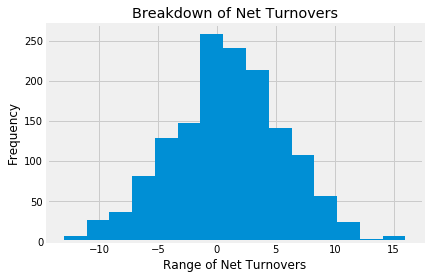

In [217]:
#Here is a histogram for Net_TO

bulls.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

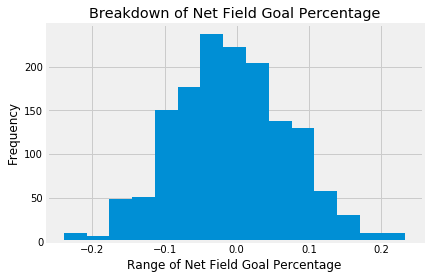

In [218]:
#Here is a histogram for Net_FG%

bulls.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

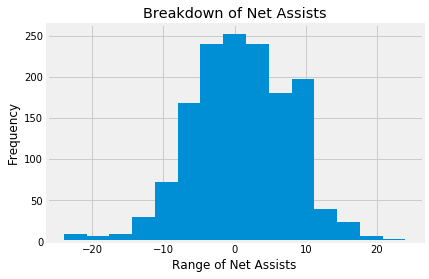

In [219]:
#Here is a histogram for Net_AST

bulls.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

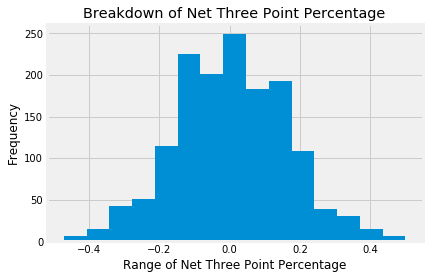

In [220]:
#Here is a histogram for Net_3P%

bulls.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

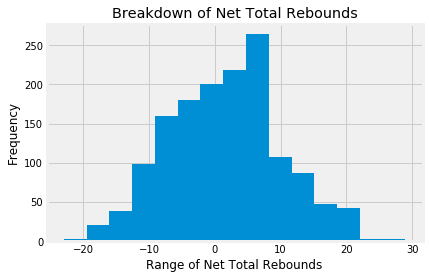

In [221]:
#Here is a histogram for Net_TRB

bulls.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

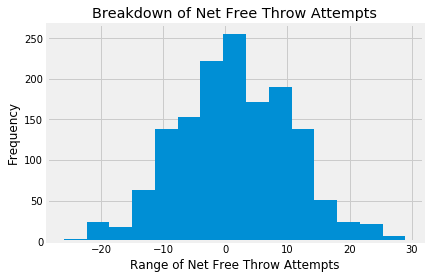

In [222]:
#Here is a histogram for Net_FTA

bulls.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

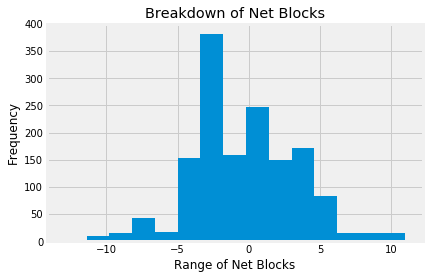

In [223]:
#Here is a histogram for Net_BLK

bulls.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

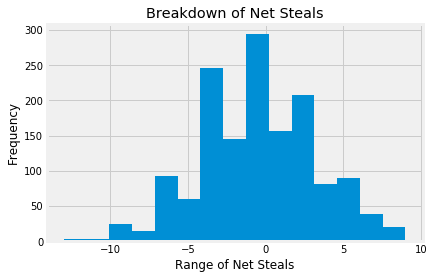

In [224]:
#Here is a histogram for Net_STL

bulls.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

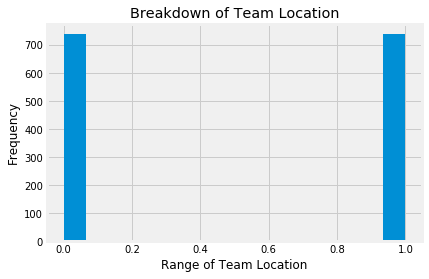

In [225]:
#Here is a histogram for teamLoc_Home

bulls.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

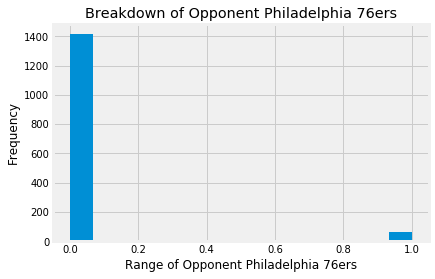

In [226]:
#Here is a histogram for opptAbbr_PHI

bulls.loc[:,"opptAbbr_PHI"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Philadelphia 76ers")
plt.title("Breakdown of Opponent Philadelphia 76ers");

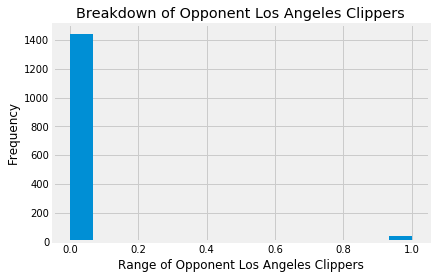

In [227]:
#Here is a histogram for opptAbbr_LAC

bulls.loc[:,"opptAbbr_LAC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Clippers")
plt.title("Breakdown of Opponent Los Angeles Clippers");

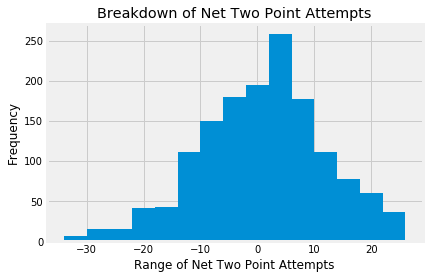

In [228]:
#Here is a histogram for Net_2PA

bulls.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

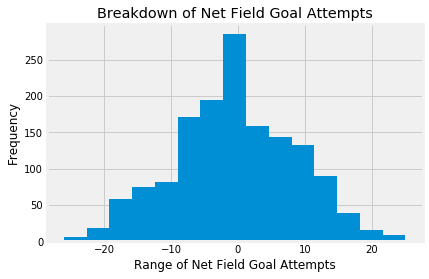

In [229]:
#Here is a histogram for Net_FGA

bulls.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

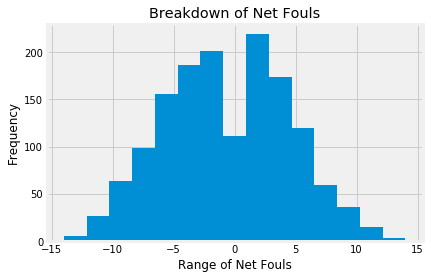

In [230]:
#Here is a histogram for Net_Fouls 

bulls.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Dallas Mavericks

In [231]:
mavericks = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'DAL']

In [232]:
mavericks.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
12,DAL,0,-2,-2,3,0,4,8,-0.0229,6,...,0,0,0,0,0,0,0,0,0,0
13,DAL,0,-2,-2,3,0,4,8,-0.0229,6,...,0,0,0,0,0,0,0,0,0,0
14,DAL,0,-2,-2,3,0,4,8,-0.0229,6,...,0,0,0,0,0,0,0,0,0,0
48,DAL,1,-4,2,-2,-3,7,-4,-0.0505,-12,...,0,0,0,0,0,0,0,0,0,0
49,DAL,1,-4,2,-2,-3,7,-4,-0.0505,-12,...,0,0,0,0,0,0,0,0,0,0


In [233]:
mavericks.shape

(1477, 130)

In [234]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Mavericks

mavericks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.660772
Net_AST                          0.476519
Net_3P%                          0.454623
Net_TRB                          0.316378
Net_BLK                          0.235566
Net_FTA                          0.226000
Net_STL                          0.221735
opptAbbr_WAS                     0.136156
teamLoc_Home                     0.133411
opptAbbr_LAL                     0.104351
Net_Day_Off                      0.092671
opptAbbr_MIL                     0.083449
opptAbbr_ORL                     0.083449
opptAbbr_SAC                     0.065013
opptAbbr_NO                      0.062902
Off_Name_VioletPalmer            0.059922
opptAbbr_NY                      0.057096
opptAbbr_PHI                     0.057096
Off_Name_PatFraher               0.055222
Off_Name_EddieRush               0.053578
Off_Name_DavidGuthrie            0.050655
Off_Name_KevinFehr               0.046384
Off_Name_BillSpooner             0

In [235]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the mavericks subset to only those variables with .1 or greater correlation

mavericks = mavericks.drop(['Off_Name_SirAllenConner','Off_Name_VladimirVoyard-Tadal','Off_Name_ScottBolnick', 
                                  'Off_Name_RandyRichardson', 'Off_Name_MattMyers', 'Off_Name_KippKissinger',
                                  'Off_Name_BrendaPantoja','opptAbbr_DAL','opptAbbr_HOU', 'opptAbbr_LAC', 'opptAbbr_OKC',
                                  'Off_Name_BenTaylor','Off_Name_RonGarretson','opptAbbr_TOR', 'Off_Name_DerrickStafford',
                                  'Off_Name_KenMauer', 'Off_Name_HaywoodeWorkman', 'Off_Name_GediminasPetraitis', 
                                  'Off_Name_KarlLane', 'Off_Name_RayAcosta', 'Off_Name_TylerFord', 'Off_Name_JamesWilliams',
                                  'Off_Name_BillKennedy','Off_Name_TonyBrown','Off_Name_ScottWall', 'Off_Name_JamesCapers',
                                  'opptAbbr_POR', 'Off_Name_TonyBrothers', 'Off_Name_EdMalloy', 'Off_Name_BillSpooner',
                                  'Off_Name_KevinFehr', 'Off_Name_DavidGuthrie', 'Off_Name_EddieRush', 'Off_Name_PatFraher',
                                  'opptAbbr_PHI', 'opptAbbr_NY', 'Off_Name_VioletPalmer', 'opptAbbr_NO', 'opptAbbr_SAC',
                                  'opptAbbr_ORL', 'opptAbbr_MIL', 'Net_Day_Off'], axis = 'columns')

In [236]:
mavericks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.660772
Net_AST                      0.476519
Net_3P%                      0.454623
Net_TRB                      0.316378
Net_BLK                      0.235566
Net_FTA                      0.226000
Net_STL                      0.221735
opptAbbr_WAS                 0.136156
teamLoc_Home                 0.133411
opptAbbr_LAL                 0.104351
opptAbbr_DET                 0.030743
opptAbbr_BOS                 0.030743
opptAbbr_CHI                 0.030743
Off_Name_CourtneyKirkland    0.029897
Off_Name_JoshTiven           0.029069
Off_Name_PhenizeeRansom      0.026762
Off_Name_StevenAnderson      0.026039
opptAbbr_MEM                 0.025158
Off_Name_ScottTwardoski      0.024997
Off_Name_LeonWood            0.024319
Off_Name_OlandisPoole        0.023070
Off_Name_TomWashington       0.022741
Off_Name_NickBuchert         0.019904
Net_3PA                      0.019363
Off_Name_J.T.Orr             0.016697
Off_Name_Jac

In [237]:
mavericks = mavericks.drop(['Off_Name_EricDalen','Off_Name_DerrickCollins','Off_Name_BennieAdams', 'Off_Name_MichaelSmith',
                                  'Off_Name_BrandonAdair', 'Off_Name_JoeDeRosa', 'Off_Name_EliRoe', 'Off_Name_MitchellErvin',
                                  'Off_Name_SeanCorbin','Off_Name_ScottFoster','opptAbbr_IND', 'Off_Name_KevinScott', 
                                  'Off_Name_MattBoland', 'Off_Name_CurtisBlair', 'Off_Name_JasonPhillips', 
                                  'Off_Name_C.J.Washington', 'Off_Name_JonathanSterling', 'Off_Name_TreMaddox',
                                  'Off_Name_LeroyRichardson','opptAbbr_DEN','Off_Name_MarkAyotte', 'Off_Name_MarkLindsay',
                                  'Off_Name_ZachZarba', 'Off_Name_DanCrawford', 'Off_Name_MaratKogut', 'opptAbbr_UTA', 
                                  'Off_Name_JacynGoble', 'Off_Name_J.T.Orr', 'Net_3PA', 'Off_Name_NickBuchert',
                                  'Off_Name_TomWashington','Off_Name_OlandisPoole','Off_Name_LeonWood', 'opptAbbr_MEM',
                                  'Off_Name_ScottTwardoski', 'Off_Name_StevenAnderson', 'Off_Name_PhenizeeRansom', 
                                  'Off_Name_JoshTiven', 'Off_Name_CourtneyKirkland', 'opptAbbr_CHI', 'opptAbbr_BOS',
                                  'opptAbbr_DET'], axis = 'columns')

In [238]:
mavericks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.660772
Net_AST                      0.476519
Net_3P%                      0.454623
Net_TRB                      0.316378
Net_BLK                      0.235566
Net_FTA                      0.226000
Net_STL                      0.221735
opptAbbr_WAS                 0.136156
teamLoc_Home                 0.133411
opptAbbr_LAL                 0.104351
Off_Name_MikeCallahan        0.014018
Off_Name_BrianForte          0.013793
Off_Name_JohnGoble           0.013601
Off_Name_LaurenHoltkamp      0.010283
Off_Name_DavidJones          0.010283
Off_Name_DedricTaylor        0.009868
Off_Name_RodneyMott          0.009056
Off_Name_SeanWright          0.008845
Off_Name_KaneFitzgerald      0.008791
opptAbbr_MIN                 0.006006
opptAbbr_CLE                 0.004389
opptAbbr_BKN                 0.004389
opptAbbr_CHA                 0.004389
Off_Name_MontyMcCutchen      0.003860
Off_Name_EricLewis           0.003860
Off_Name_Der

In [239]:
mavericks = mavericks.drop(['Off_Name_MarcDavis','Off_Name_JoeCrawford','opptAbbr_PHO', 'Off_Name_KevinCutler',
                                  'Off_Name_GaryZielinski', 'Off_Name_BrettNansel', 'Off_Name_JasonGoldenberg', 
                                  'Off_Name_DickBavetta', 'Off_Name_BennettSalvatore', 'Off_Name_BrentBarnaky',
                                  'Off_Name_JustinVan Duyne','Off_Name_DerekRichardson','Off_Name_EricLewis', 
                                  'Off_Name_MontyMcCutchen', 'opptAbbr_CHA', 'opptAbbr_BKN', 'opptAbbr_CLE',
                                  'opptAbbr_MIN', 'Off_Name_KaneFitzgerald', 'Off_Name_SeanWright', 'Off_Name_RodneyMott',
                                  'Off_Name_DedricTaylor', 'Off_Name_DavidJones', 'Off_Name_LaurenHoltkamp', 
                                  'Off_Name_JohnGoble', 'Off_Name_BrianForte', 'Off_Name_MikeCallahan'], axis = 'columns')

In [240]:
mavericks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.660772
Net_AST         0.476519
Net_3P%         0.454623
Net_TRB         0.316378
Net_BLK         0.235566
Net_FTA         0.226000
Net_STL         0.221735
opptAbbr_WAS    0.136156
teamLoc_Home    0.133411
opptAbbr_LAL    0.104351
opptAbbr_MIA   -0.101024
Net_2PA        -0.120988
Net_FGA        -0.141605
opptAbbr_SA    -0.144688
opptAbbr_GS    -0.151346
Net_TO         -0.184178
Net_Fouls      -0.228194
Name: teamRslt_Win, dtype: float64

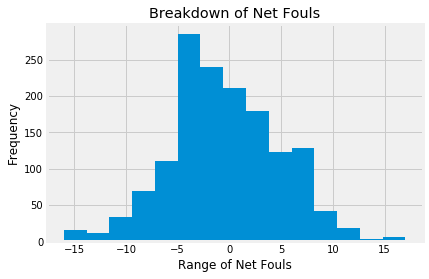

In [241]:
#Here is a histogram for Net_Fouls 

mavericks.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

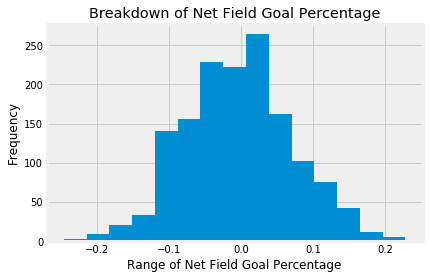

In [242]:
#Here is a histogram for Net_FG% 

mavericks.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

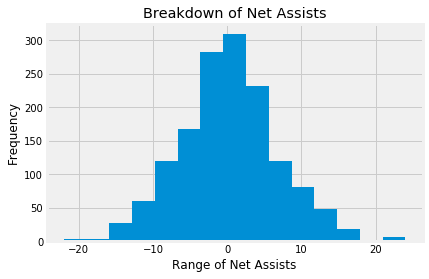

In [243]:
#Here is a histogram for Net_AST 

mavericks.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

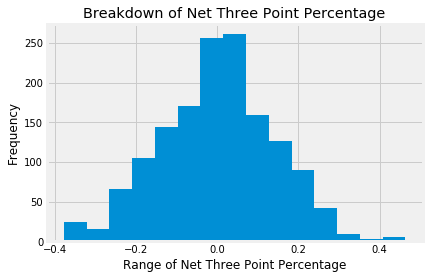

In [244]:
#Here is a histogram for Net_3P% 

mavericks.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

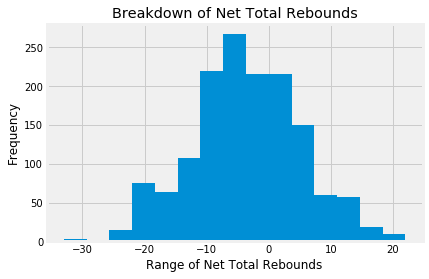

In [245]:
#Here is a histogram for Net_TRB 

mavericks.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

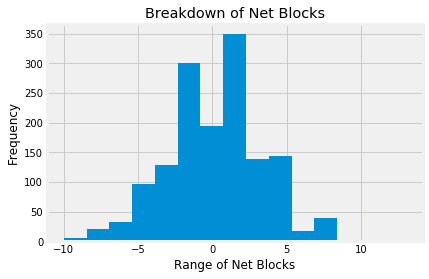

In [246]:
#Here is a histogram for Net_BLK 

mavericks.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

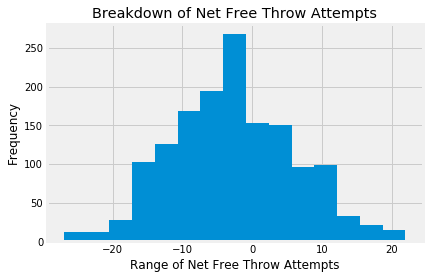

In [247]:
#Here is a histogram for Net_FTA

mavericks.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

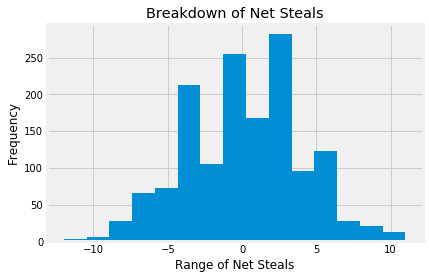

In [248]:
#Here is a histogram for Net_STL 

mavericks.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

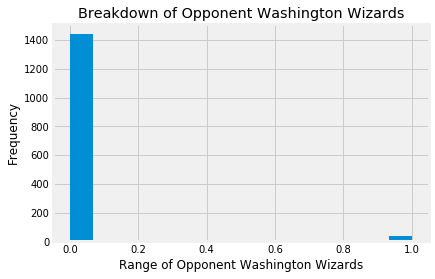

In [249]:
#Here is a histogram for opptAbbr_WAS 

mavericks.loc[:,"opptAbbr_WAS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Washington Wizards")
plt.title("Breakdown of Opponent Washington Wizards");

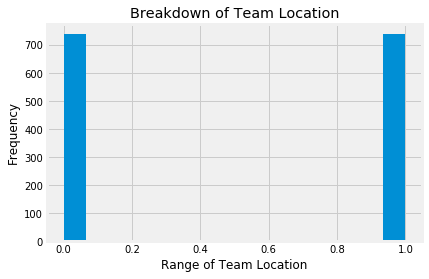

In [250]:
#Here is a histogram for teamLoc_Home

mavericks.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

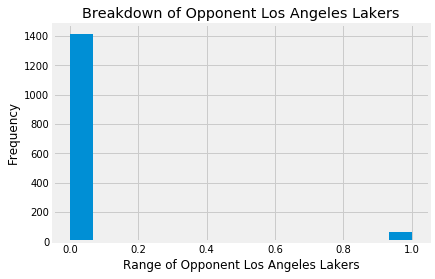

In [251]:
#Here is a histogram for opptAbbr_LAL

mavericks.loc[:,"opptAbbr_LAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Lakers")
plt.title("Breakdown of Opponent Los Angeles Lakers");

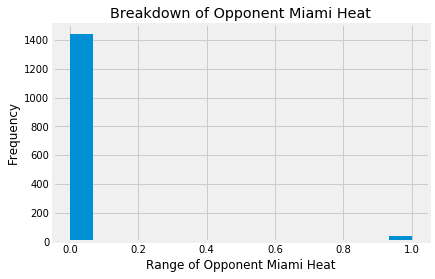

In [252]:
#Here is a histogram for opptAbbr_MIA 

mavericks.loc[:,"opptAbbr_MIA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Miami Heat")
plt.title("Breakdown of Opponent Miami Heat");

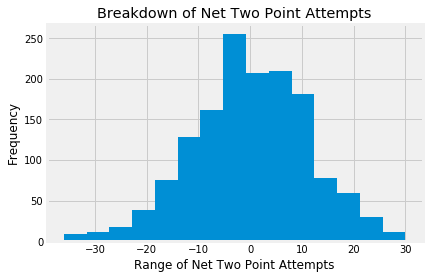

In [253]:
#Here is a histogram for Net_2PA

mavericks.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

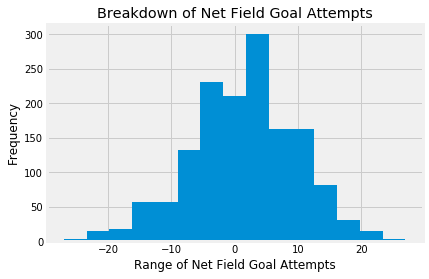

In [254]:
#Here is a histogram for Net_FGA 

mavericks.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

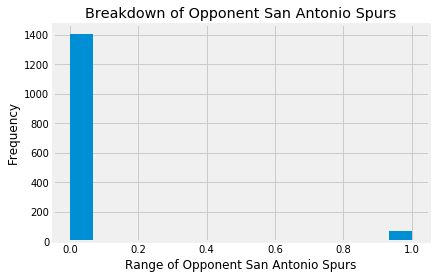

In [255]:
#Here is a histogram for opptAbbr_SA 

mavericks.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

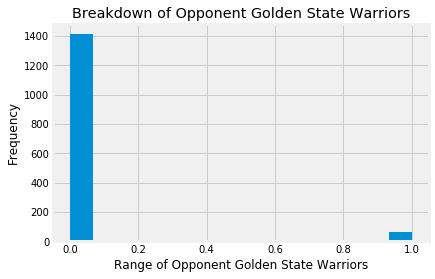

In [256]:
#Here is a histogram for opptAbbr_GS 

mavericks.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

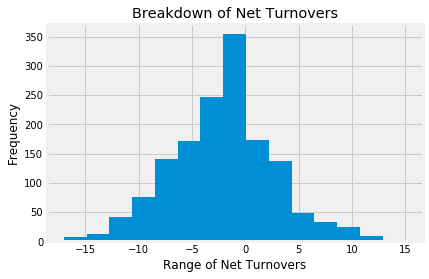

In [257]:
#Here is a histogram for Net_TO

mavericks.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### New Orleans Pelicans

In [258]:
pelicans = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'NO']

In [259]:
pelicans.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
45,NO,0,4,-1,-2,-2,-1,0,-0.0375,3,...,0,0,0,0,0,0,0,0,0,0
46,NO,0,4,-1,-2,-2,-1,0,-0.0375,3,...,0,0,0,0,0,0,0,0,0,0
47,NO,0,4,-1,-2,-2,-1,0,-0.0375,3,...,0,0,0,0,0,0,0,0,0,0
117,NO,0,4,-3,0,-2,-5,-4,0.0450,10,...,0,0,0,0,0,0,0,0,0,0
118,NO,0,4,-3,0,-2,-5,-4,0.0450,10,...,0,0,0,0,0,0,0,0,0,0


In [260]:
pelicans.shape

(1476, 130)

In [261]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Pelicans

pelicans.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.647057
Net_AST                      0.508514
Net_3P%                      0.404508
Net_TRB                      0.348708
Net_BLK                      0.297351
Net_STL                      0.256361
teamLoc_Home                 0.188215
opptAbbr_DET                 0.150738
Net_FTA                      0.133162
opptAbbr_MIL                 0.097688
opptAbbr_CHA                 0.097688
Net_Day_Off                  0.084129
opptAbbr_BKN                 0.071164
opptAbbr_SAC                 0.064381
Off_Name_KaneFitzgerald      0.057864
opptAbbr_LAL                 0.054553
opptAbbr_PHO                 0.054553
Off_Name_VioletPalmer        0.050190
opptAbbr_BOS                 0.044639
opptAbbr_CLE                 0.044639
opptAbbr_PHI                 0.044639
Off_Name_JoeDeRosa           0.041297
Off_Name_RayAcosta           0.041297
Off_Name_TylerFord           0.040748
Off_Name_TomWashington       0.040388
Off_Name_Cou

In [262]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the pelicans subset to only those variables with .1 or greater correlation

pelicans = pelicans.drop(['Off_Name_SirAllenConner','Off_Name_PhenizeeRansom','Off_Name_ScottBolnick', 
                                  'Off_Name_BrendaPantoja', 'Off_Name_MattMyers', 'Off_Name_KippKissinger',
                                  'opptAbbr_NO','opptAbbr_TOR','opptAbbr_HOU', 'opptAbbr_IND', 'Net_2PA',
                                  'Off_Name_BrentBarnaky','opptAbbr_OKC','Net_FGA', 'Off_Name_C.J.Washington',
                                  'Off_Name_MaratKogut', 'Off_Name_BennieAdams', 'opptAbbr_LAC', 'opptAbbr_UTA',
                                  'Off_Name_ZachZarba', 'opptAbbr_DAL', 'opptAbbr_SA', 'Off_Name_BillKennedy',
                                  'Off_Name_TonyBrothers','Off_Name_LeroyRichardson','Off_Name_BrianForte', 
                                  'Off_Name_DedricTaylor', 'Off_Name_JustinVan Duyne', 'Off_Name_JoshTiven',
                                  'Off_Name_CourtneyKirkland', 'Off_Name_TomWashington', 'Off_Name_TylerFord', 
                                  'Off_Name_RayAcosta', 'Off_Name_JoeDeRosa', 'opptAbbr_PHI', 'opptAbbr_CLE',
                                  'opptAbbr_BOS', 'Off_Name_VioletPalmer', 'opptAbbr_PHO', 'opptAbbr_LAL',
                                  'Off_Name_KaneFitzgerald', 'opptAbbr_SAC', 'opptAbbr_BKN', 'Net_Day_Off', 
                                  'opptAbbr_CHA', 'opptAbbr_MIL'], axis = 'columns')

In [263]:
pelicans.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.647057
Net_AST                          0.508514
Net_3P%                          0.404508
Net_TRB                          0.348708
Net_BLK                          0.297351
Net_STL                          0.256361
teamLoc_Home                     0.188215
opptAbbr_DET                     0.150738
Net_FTA                          0.133162
Off_Name_BrandonAdair            0.029191
Off_Name_RandyRichardson         0.029191
Off_Name_VladimirVoyard-Tadal    0.029191
Off_Name_MarkLindsay             0.026167
Off_Name_DerrickStafford         0.025156
Net_3PA                          0.025152
opptAbbr_MIN                     0.024787
Off_Name_TonyBrown               0.020323
Off_Name_EdMalloy                0.019132
Off_Name_BenTaylor               0.019132
opptAbbr_MIA                     0.018114
opptAbbr_NY                      0.018114
Off_Name_StevenAnderson          0.018098
Off_Name_BrettNansel             0

In [264]:
pelicans = pelicans.drop(['Off_Name_MichaelSmith','opptAbbr_DEN','Off_Name_MontyMcCutchen', 'Off_Name_MikeCallahan', 
                                  'Off_Name_LeonWood', 'Off_Name_HaywoodeWorkman', 'Off_Name_SeanCorbin',
                                  'Off_Name_DanCrawford','Off_Name_KevinScott','Off_Name_MarkAyotte', 'opptAbbr_POR', 
                                  'Off_Name_ScottTwardoski', 'Off_Name_BennettSalvatore', 'Off_Name_JacynGoble',
                                  'Off_Name_DerrickCollins','Off_Name_BillSpooner','Off_Name_ScottFoster', 
                                  'Off_Name_KenMauer', 'Off_Name_EddieRush', 'opptAbbr_CHI', 'opptAbbr_ORL',
                                  'Off_Name_DavidGuthrie', 'Off_Name_SeanWright', 'Off_Name_CurtisBlair', 
                                  'Off_Name_LaurenHoltkamp', 'Off_Name_JonathanSterling', 'Off_Name_GaryZielinski',
                                  'Off_Name_PatFraher', 'Off_Name_DavidJones', 'Off_Name_JasonPhillips', 
                                  'Off_Name_KarlLane', 'Off_Name_GediminasPetraitis', 'Off_Name_BrettNansel',
                                  'Off_Name_StevenAnderson','opptAbbr_NY','opptAbbr_MIA', 'Off_Name_BenTaylor', 
                                  'Off_Name_EdMalloy', 'Off_Name_TonyBrown', 'opptAbbr_MIN', 'Net_3PA', 
                                  'Off_Name_DerrickStafford', 'Off_Name_MarkLindsay', 'Off_Name_VladimirVoyard-Tadal', 
                                  'Off_Name_RandyRichardson', 'Off_Name_BrandonAdair'], axis = 'columns')

In [265]:
pelicans.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.647057
Net_AST                     0.508514
Net_3P%                     0.404508
Net_TRB                     0.348708
Net_BLK                     0.297351
Net_STL                     0.256361
teamLoc_Home                0.188215
opptAbbr_DET                0.150738
Net_FTA                     0.133162
Off_Name_MattBoland         0.008908
Off_Name_JamesCapers        0.008005
opptAbbr_MEM                0.006949
Off_Name_KevinFehr          0.005972
Off_Name_MarcDavis          0.005934
Off_Name_JohnGoble          0.004973
Off_Name_EricDalen          0.004809
Off_Name_MitchellErvin      0.004809
Off_Name_JasonGoldenberg    0.004220
Off_Name_RonGarretson       0.003945
Off_Name_KevinCutler        0.003945
Off_Name_RodneyMott         0.003945
Off_Name_OlandisPoole       0.003501
Off_Name_ScottWall          0.002837
Off_Name_J.T.Orr            0.002837
Off_Name_DerekRichardson    0.002837
Off_Name_JoeCrawford        0.001998
O

In [266]:
pelicans = pelicans.drop(['Off_Name_JamesWilliams','Off_Name_NickBuchert','Off_Name_DickBavetta', 'Off_Name_EliRoe', 
                                  'Off_Name_TreMaddox', 'Off_Name_EricLewis', 'Off_Name_JoeCrawford', 'Off_Name_RodneyMott',
                                  'Off_Name_DerekRichardson','Off_Name_J.T.Orr','Off_Name_ScottWall', 'Off_Name_OlandisPoole', 
                                  'Off_Name_KevinCutler', 'Off_Name_RonGarretson', 'Off_Name_JasonGoldenberg',
                                  'Off_Name_MitchellErvin','Off_Name_EricDalen','Off_Name_JohnGoble', 'Off_Name_MarcDavis',
                                  'Off_Name_KevinFehr', 'opptAbbr_MEM', 'Off_Name_JamesCapers', 
                                  'Off_Name_MattBoland'], axis = 'columns')

In [267]:
pelicans.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.647057
Net_AST         0.508514
Net_3P%         0.404508
Net_TRB         0.348708
Net_BLK         0.297351
Net_STL         0.256361
teamLoc_Home    0.188215
opptAbbr_DET    0.150738
Net_FTA         0.133162
opptAbbr_WAS   -0.114509
opptAbbr_GS    -0.153387
Net_Fouls      -0.166618
Net_TO         -0.203165
Name: teamRslt_Win, dtype: float64

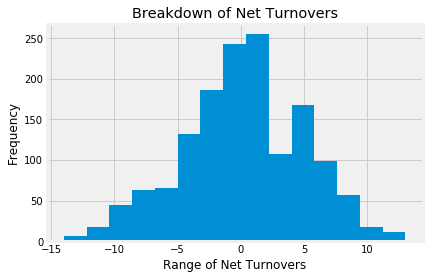

In [268]:
#Here is a histogram for Net_TO

pelicans.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

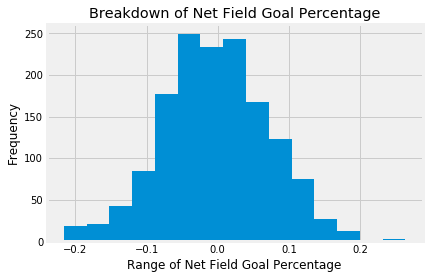

In [269]:
#Here is a histogram for Net_FG%

pelicans.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

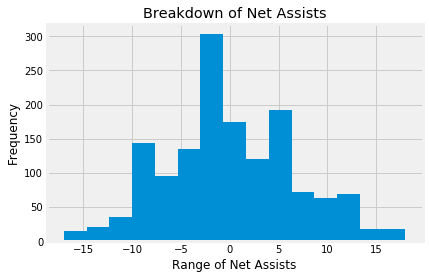

In [270]:
#Here is a histogram for Net_AST

pelicans.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

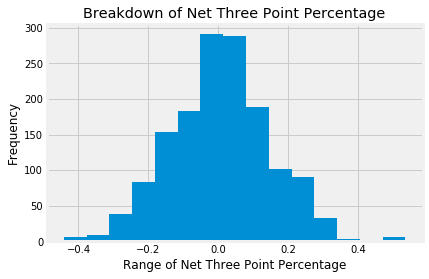

In [271]:
#Here is a histogram for Net_3P%

pelicans.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

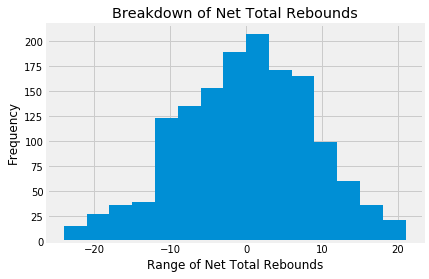

In [272]:
#Here is a histogram for Net_TRB

pelicans.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

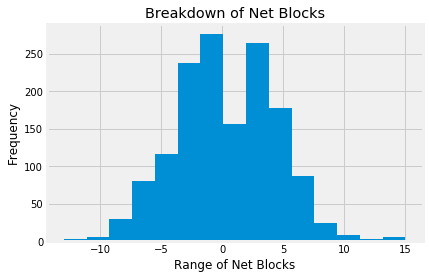

In [273]:
#Here is a histogram for Net_BLK

pelicans.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

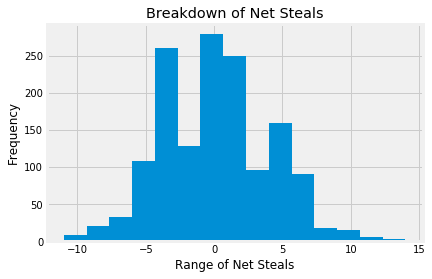

In [274]:
#Here is a histogram for Net_STL

pelicans.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

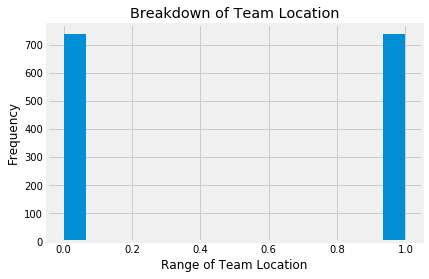

In [275]:
#Here is a histogram for teamLoc_Home

pelicans.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

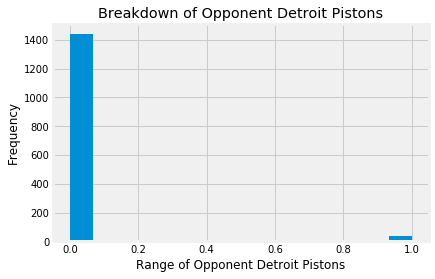

In [276]:
#Here is a histogram for opptAbbr_DET

pelicans.loc[:,"opptAbbr_DET"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Detroit Pistons")
plt.title("Breakdown of Opponent Detroit Pistons");

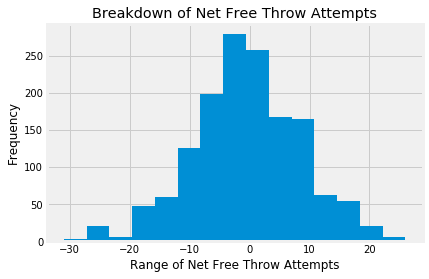

In [277]:
#Here is a histogram for Net_FTA 

pelicans.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

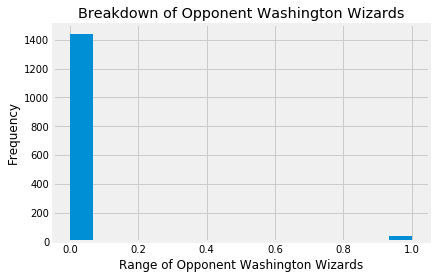

In [278]:
#Here is a histogram for opptAbbr_WAS

pelicans.loc[:,"opptAbbr_WAS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Washington Wizards")
plt.title("Breakdown of Opponent Washington Wizards");

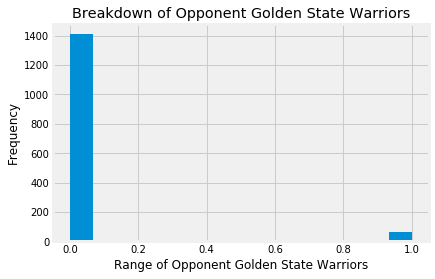

In [279]:
#Here is a histogram for opptAbbr_GS

pelicans.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

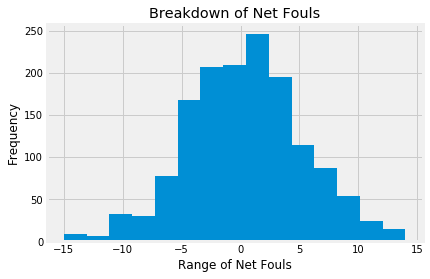

In [280]:
#Here is a histogram for Net_Fouls 

pelicans.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Los Angeles Clippers

In [281]:
clippers = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'LAC']

In [282]:
clippers.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
63,LAC,0,1,1,-2,5,2,-12,0.1298,-13,...,0,0,0,0,0,0,0,0,0,0
64,LAC,0,1,1,-2,5,2,-12,0.1298,-13,...,0,0,0,0,0,0,0,0,0,0
65,LAC,0,1,1,-2,5,2,-12,0.1298,-13,...,0,0,0,0,0,0,0,0,0,0
138,LAC,0,9,-8,5,-3,3,16,-0.0476,10,...,0,0,0,0,0,0,0,0,0,0
139,LAC,0,9,-8,5,-3,3,16,-0.0476,10,...,0,0,0,0,0,0,0,0,0,0


In [283]:
clippers.shape

(1476, 130)

In [284]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Clippers

clippers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.650663
Net_3P%                          0.460671
Net_AST                          0.442554
Net_TRB                          0.351171
Net_BLK                          0.298466
Net_STL                          0.254466
Net_FTA                          0.169669
teamLoc_Home                     0.156697
opptAbbr_LAL                     0.110770
opptAbbr_PHO                     0.091110
opptAbbr_SAC                     0.091110
opptAbbr_NY                      0.091068
Net_Day_Off                      0.087469
Net_3PA                          0.074002
opptAbbr_ORL                     0.063614
opptAbbr_DET                     0.063614
opptAbbr_CHA                     0.063614
opptAbbr_CHI                     0.063614
opptAbbr_UTA                     0.059724
Off_Name_BrentBarnaky            0.054634
Off_Name_KevinCutler             0.053430
Off_Name_BennieAdams             0.049232
Off_Name_TomWashington           0

In [285]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the clippers subset to only those variables with .1 or greater correlation

clippers = clippers.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'opptAbbr_CLE',
                                  'Off_Name_BrendaPantoja', 'Off_Name_EddieRush', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','opptAbbr_LAC','opptAbbr_SA', 'Off_Name_ZachZarba', 'Net_FGA',
                                  'Off_Name_JamesCapers','opptAbbr_DEN','opptAbbr_MIA', 'opptAbbr_TOR', 'opptAbbr_DET',
                                  'Off_Name_J.T.Orr', 'Off_Name_GaryZielinski', 'Off_Name_VladimirVoyard-Tadal', 
                                  'Off_Name_PhenizeeRansom', 'Off_Name_RandyRichardson', 'Off_Name_JoshTiven',
                                  'Off_Name_MikeCallahan', 'opptAbbr_MIL', 'Off_Name_JasonPhillips', 'Off_Name_BillSpooner',
                                  'Off_Name_JoeCrawford','Off_Name_JamesWilliams','Off_Name_HaywoodeWorkman', 
                                  'Off_Name_TomWashington', 'Off_Name_BennieAdams', 'Off_Name_KevinCutler', 'opptAbbr_CHA',
                                  'Off_Name_BrentBarnaky', 'opptAbbr_UTA', 'opptAbbr_CHI', 'opptAbbr_ORL', 'Net_3PA',
                                  'Net_Day_Off', 'opptAbbr_NY', 'opptAbbr_SAC', 'opptAbbr_PHO'], axis = 'columns')

In [286]:
clippers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.650663
Net_3P%                        0.460671
Net_AST                        0.442554
Net_TRB                        0.351171
Net_BLK                        0.298466
Net_STL                        0.254466
Net_FTA                        0.169669
teamLoc_Home                   0.156697
opptAbbr_LAL                   0.110770
opptAbbr_PHI                   0.036159
Off_Name_BrettNansel           0.031197
Off_Name_MattBoland            0.030455
Off_Name_BenTaylor             0.029661
Off_Name_KarlLane              0.029402
Off_Name_RayAcosta             0.027612
Off_Name_JacynGoble            0.027612
Off_Name_LeroyRichardson       0.026803
Off_Name_CourtneyKirkland      0.025923
Off_Name_BennettSalvatore      0.025335
Off_Name_KenMauer              0.024351
Off_Name_TonyBrown             0.021813
Off_Name_DanCrawford           0.021813
Off_Name_C.J.Washington        0.019407
opptAbbr_MIN                   0.018742


In [287]:
clippers = clippers.drop(['Off_Name_DavidJones','Off_Name_EricLewis','Off_Name_BillKennedy', 'Off_Name_MontyMcCutchen',
                                  'Off_Name_DerekRichardson', 'Off_Name_LaurenHoltkamp', 'Off_Name_TylerFord', 'opptAbbr_MEM',
                                  'opptAbbr_HOU','Off_Name_JohnGoble','Off_Name_CurtisBlair', 'Off_Name_MarkLindsay', 
                                  'Off_Name_TonyBrothers', 'Off_Name_MitchellErvin', 'Off_Name_LeonWood', 
                                  'Off_Name_DerrickCollins', 'Off_Name_RodneyMott', 'Off_Name_JonathanSterling',
                                  'Off_Name_JoeDeRosa','Off_Name_JasonGoldenberg','Off_Name_GediminasPetraitis', 
                                  'Off_Name_MichaelSmith', 'Off_Name_TreMaddox', 'Off_Name_NickBuchert', 'Off_Name_EricDalen',
                                  'Off_Name_MarcDavis', 'Off_Name_ScottWall', 'opptAbbr_MIN', 'Off_Name_C.J.Washington',
                                  'Off_Name_DanCrawford', 'Off_Name_TonyBrown', 'Off_Name_KenMauer','Off_Name_BennettSalvatore',
                                  'Off_Name_CourtneyKirkland', 'Off_Name_LeroyRichardson', 'Off_Name_JacynGoble',
                                  'Off_Name_RayAcosta', 'Off_Name_KarlLane', 'Off_Name_BenTaylor', 'Off_Name_MattBoland',
                                  'Off_Name_BrettNansel','opptAbbr_PHI'], axis = 'columns')

In [288]:
clippers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.650663
Net_3P%                     0.460671
Net_AST                     0.442554
Net_TRB                     0.351171
Net_BLK                     0.298466
Net_STL                     0.254466
Net_FTA                     0.169669
teamLoc_Home                0.156697
opptAbbr_LAL                0.110770
opptAbbr_DAL                0.011625
Off_Name_DavidGuthrie       0.010873
Off_Name_KaneFitzgerald     0.010873
Off_Name_VioletPalmer       0.010650
opptAbbr_WAS                0.008705
opptAbbr_BOS                0.008705
opptAbbr_BKN                0.008705
Off_Name_SeanWright         0.007930
Off_Name_JustinVan Duyne    0.006117
Off_Name_PatFraher          0.003795
Off_Name_ScottFoster        0.003795
Off_Name_KevinFehr          0.003517
Off_Name_SeanCorbin         0.003127
Off_Name_EdMalloy           0.003127
Off_Name_OlandisPoole       0.002485
Off_Name_DedricTaylor       0.000533
opptAbbr_NO                -0.001749
o

In [289]:
clippers = clippers.drop(['Off_Name_DerrickStafford','Off_Name_ScottTwardoski','Off_Name_MaratKogut', 'Off_Name_MarkAyotte',
                                  'Off_Name_StevenAnderson', 'Off_Name_DickBavetta', 'Off_Name_KevinScott', 'Off_Name_EliRoe',
                                  'Off_Name_RonGarretson','opptAbbr_POR','opptAbbr_NO', 'Off_Name_DedricTaylor', 
                                  'Off_Name_OlandisPoole', 'Off_Name_EdMalloy', 'Off_Name_SeanCorbin', 'Off_Name_KevinFehr',
                                  'Off_Name_ScottFoster', 'Off_Name_PatFraher', 'Off_Name_JustinVan Duyne', 'opptAbbr_WAS',
                                  'Off_Name_SeanWright','opptAbbr_BKN','opptAbbr_BOS', 'Off_Name_VioletPalmer',
                                  'Off_Name_KaneFitzgerald', 'Off_Name_DavidGuthrie', 'opptAbbr_DAL'], axis = 'columns')

In [290]:
clippers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win           1.000000
Net_FG%                0.650663
Net_3P%                0.460671
Net_AST                0.442554
Net_TRB                0.351171
Net_BLK                0.298466
Net_STL                0.254466
Net_FTA                0.169669
teamLoc_Home           0.156697
opptAbbr_LAL           0.110770
opptAbbr_IND          -0.101113
Net_2PA               -0.103371
Off_Name_BrianForte   -0.112119
opptAbbr_OKC          -0.135031
Net_Fouls             -0.160383
opptAbbr_GS           -0.203798
Net_TO                -0.221377
Name: teamRslt_Win, dtype: float64

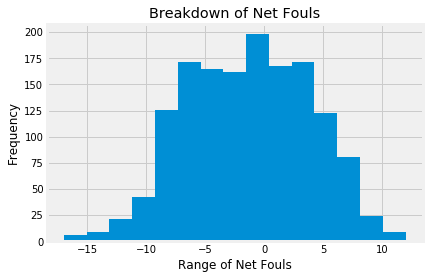

In [291]:
#Here is a histogram for Net_Fouls 

clippers.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

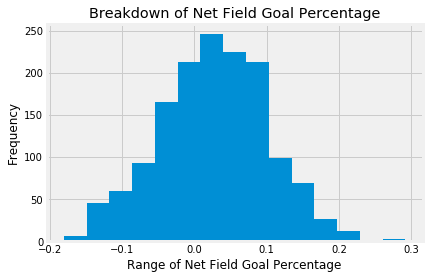

In [292]:
#Here is a histogram for Net_FG%

clippers.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

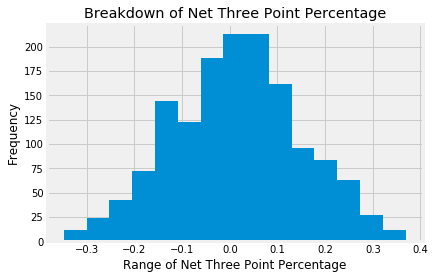

In [293]:
#Here is a histogram for Net_3P% 

clippers.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

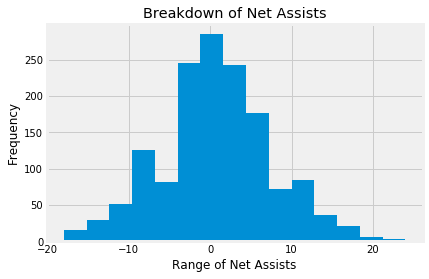

In [294]:
#Here is a histogram for Net_AST 

clippers.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

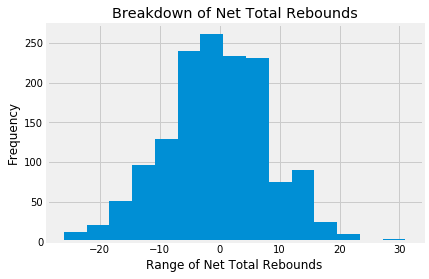

In [295]:
#Here is a histogram for Net_TRB 

clippers.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

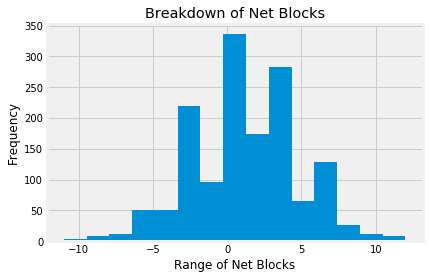

In [296]:
#Here is a histogram for Net_BLK

clippers.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

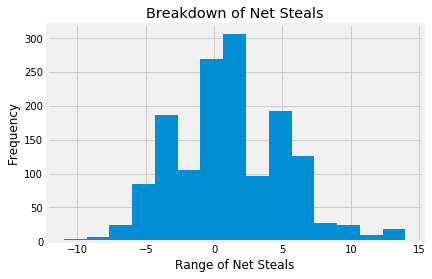

In [297]:
#Here is a histogram for Net_STL

clippers.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

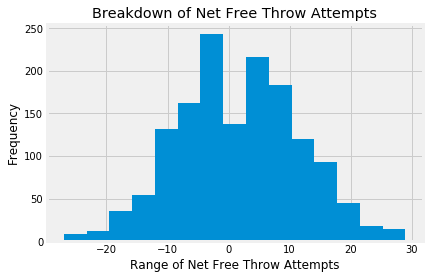

In [298]:
#Here is a histogram for Net_FTA 

clippers.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

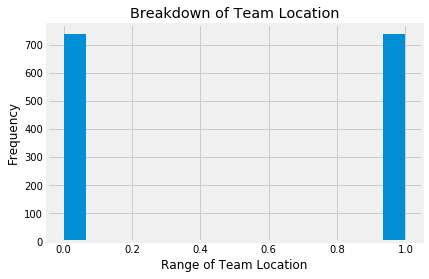

In [299]:
#Here is a histogram for teamLoc_Home 

clippers.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

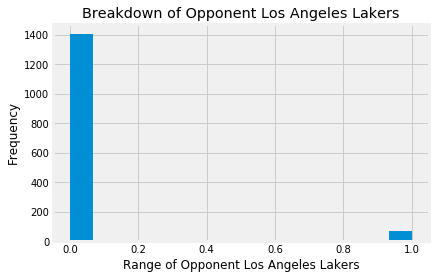

In [300]:
#Here is a histogram for opptAbbr_LAL

clippers.loc[:,"opptAbbr_LAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Lakers")
plt.title("Breakdown of Opponent Los Angeles Lakers");

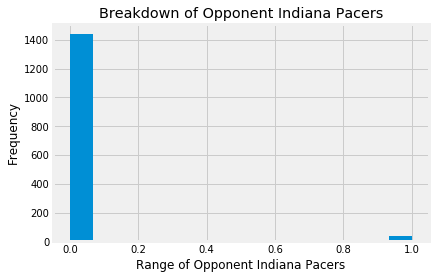

In [301]:
#Here is a histogram for opptAbbr_IND

clippers.loc[:,"opptAbbr_IND"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Indiana Pacers")
plt.title("Breakdown of Opponent Indiana Pacers");

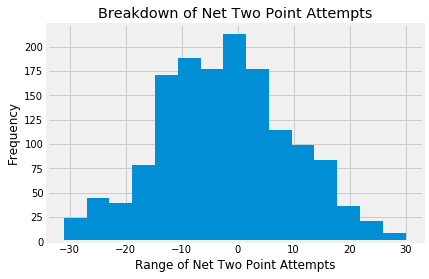

In [302]:
#Here is a histogram for Net_2PA 

clippers.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

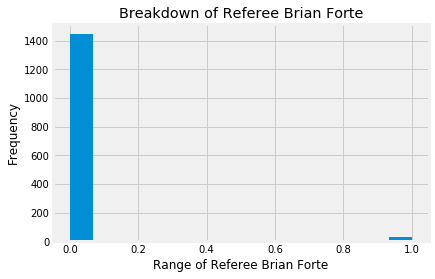

In [303]:
#Here is a histogram for Off_Name_BrianForte

clippers.loc[:,"Off_Name_BrianForte"].plot(kind='hist', bins=15)
plt.xlabel("Range of Referee Brian Forte")
plt.title("Breakdown of Referee Brian Forte");

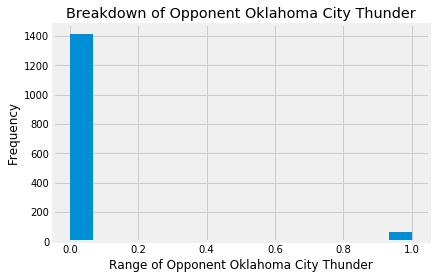

In [304]:
#Here is a histogram for opptAbbr_OKC

clippers.loc[:,"opptAbbr_OKC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Oklahoma City Thunder")
plt.title("Breakdown of Opponent Oklahoma City Thunder");

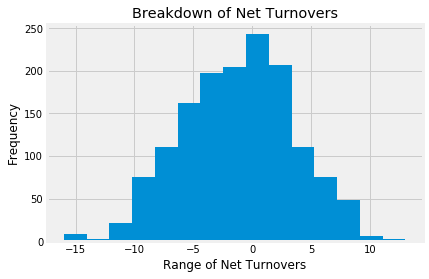

In [305]:
#Here is a histogram for Net_TO

clippers.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

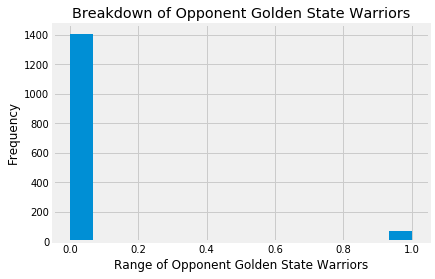

In [306]:
#Here is a histogram for opptAbbr_GS

clippers.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

#### New York Knicks

In [307]:
knicks = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'NY']

In [308]:
knicks.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
111,NY,-3,9,-7,6,-5,4,13,-0.0362,-3,...,0,0,0,0,0,0,0,0,0,0
112,NY,-3,9,-7,6,-5,4,13,-0.0362,-3,...,0,0,0,0,0,0,0,0,0,0
113,NY,-3,9,-7,6,-5,4,13,-0.0362,-3,...,0,0,0,0,0,0,0,0,0,0
213,NY,-2,4,-3,4,3,-8,-2,0.0761,-12,...,0,0,0,0,0,0,0,0,0,0
214,NY,-2,4,-3,4,3,-8,-2,0.0761,-12,...,0,0,0,0,0,0,0,1,0,0


In [309]:
knicks.shape

(1476, 130)

In [310]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Knicks

knicks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.623557
Net_3P%                          0.490459
Net_AST                          0.456978
Net_TRB                          0.279748
Net_STL                          0.264473
Net_FTA                          0.196745
Net_BLK                          0.195540
teamLoc_Home                     0.132417
opptAbbr_PHI                     0.100736
opptAbbr_LAL                     0.083748
opptAbbr_ORL                     0.081226
Net_Day_Off                      0.069645
Net_3PA                          0.062451
opptAbbr_BKN                     0.062316
Off_Name_RodneyMott              0.061319
opptAbbr_MIN                     0.056922
opptAbbr_PHO                     0.056922
opptAbbr_UTA                     0.056922
Off_Name_DavidGuthrie            0.051716
Off_Name_MichaelSmith            0.046284
Off_Name_VladimirVoyard-Tadal    0.044508
Off_Name_C.J.Washington          0.044508
Off_Name_DickBavetta             0

In [311]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the knicks subset to only those variables with .1 or greater correlation

knicks = knicks.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'opptAbbr_NY',
                                  'Off_Name_BrendaPantoja', 'opptAbbr_POR', 'Off_Name_KippKissinger', 'opptAbbr_TOR',
                                  'Off_Name_BrandonAdair','opptAbbr_GS','Net_FGA', 'opptAbbr_WAS', 'Off_Name_JoshTiven',
                                  'Off_Name_TreMaddox','Off_Name_TonyBrothers','opptAbbr_MEM', 'Off_Name_DedricTaylor', 
                                  'Off_Name_SeanCorbin', 'Off_Name_JoeDeRosa', 'Off_Name_EricDalen', 'Off_Name_JamesWilliams',
                                  'opptAbbr_IND', 'Off_Name_GediminasPetraitis', 'opptAbbr_DET', 'opptAbbr_NO',
                                  'Off_Name_KarlLane', 'Off_Name_MarkAyotte', 'Off_Name_TonyBrown', 'Off_Name_DerrickCollins',
                                  'Off_Name_DickBavetta', 'Off_Name_C.J.Washington', 'Off_Name_VladimirVoyard-Tadal', 
                                  'Off_Name_MichaelSmith', 'Off_Name_DavidGuthrie', 'opptAbbr_UTA', 'opptAbbr_PHO',
                                  'opptAbbr_MIN','Off_Name_RodneyMott','opptAbbr_BKN', 'Net_3PA', 'Net_Day_Off', 
                                  'opptAbbr_ORL', 'opptAbbr_LAL'], axis = 'columns')

In [312]:
knicks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.623557
Net_3P%                      0.490459
Net_AST                      0.456978
Net_TRB                      0.279748
Net_STL                      0.264473
Net_FTA                      0.196745
Net_BLK                      0.195540
teamLoc_Home                 0.132417
opptAbbr_PHI                 0.100736
Off_Name_DerekRichardson     0.028692
Off_Name_BennieAdams         0.027855
Off_Name_KenMauer            0.024472
Off_Name_KevinFehr           0.023904
Off_Name_MarcDavis           0.022309
opptAbbr_CHA                 0.021161
Off_Name_ScottWall           0.021150
Off_Name_JasonPhillips       0.019927
Off_Name_MontyMcCutchen      0.019641
Off_Name_DerrickStafford     0.018380
Off_Name_MaratKogut          0.017643
Off_Name_EliRoe              0.017233
Off_Name_TomWashington       0.017045
Off_Name_MattBoland          0.012031
Off_Name_LeonWood            0.012031
Off_Name_JonathanSterling    0.009923
Off_Name_Ray

In [313]:
knicks = knicks.drop(['Off_Name_JohnGoble','opptAbbr_OKC','opptAbbr_DAL', 'opptAbbr_DEN', 'Off_Name_LeroyRichardson',
                                  'Off_Name_EddieRush', 'Off_Name_CourtneyKirkland', 'Off_Name_CurtisBlair', 
                                  'Off_Name_JustinVan Duyne', 'opptAbbr_CLE', 'Off_Name_J.T.Orr', 'Off_Name_KevinCutler',
                                  'Off_Name_BillSpooner','Off_Name_DanCrawford','opptAbbr_BOS', 'Off_Name_ZachZarba',
                                  'Off_Name_StevenAnderson', 'Off_Name_KevinScott', 'Off_Name_OlandisPoole', 
                                  'Off_Name_BrettNansel', 'Off_Name_KaneFitzgerald', 'Off_Name_JacynGoble',
                                  'Off_Name_JoeCrawford','Off_Name_JasonGoldenberg','Off_Name_BenTaylor', 'Off_Name_EricLewis', 
                                  'Off_Name_RayAcosta', 'Off_Name_JonathanSterling', 'Off_Name_LeonWood', 'Off_Name_MattBoland',
                                  'Off_Name_TomWashington', 'Off_Name_EliRoe', 'Off_Name_MaratKogut', 
                                  'Off_Name_DerrickStafford', 'Off_Name_MontyMcCutchen', 'Off_Name_JasonPhillips',
                                  'Off_Name_ScottWall', 'opptAbbr_CHA', 'Off_Name_MarcDavis', 'Off_Name_KevinFehr',
                                  'Off_Name_KenMauer', 'Off_Name_BennieAdams', 'Off_Name_DerekRichardson'], axis = 'columns')

In [314]:
knicks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.623557
Net_3P%                      0.490459
Net_AST                      0.456978
Net_TRB                      0.279748
Net_STL                      0.264473
Net_FTA                      0.196745
Net_BLK                      0.195540
teamLoc_Home                 0.132417
opptAbbr_PHI                 0.100736
Off_Name_BrianForte          0.004518
Off_Name_EdMalloy            0.004518
opptAbbr_SA                  0.003271
opptAbbr_SAC                 0.003271
Off_Name_BillKennedy         0.002660
Off_Name_ScottFoster         0.002660
Off_Name_BennettSalvatore    0.001873
Off_Name_TylerFord           0.001156
Off_Name_ScottTwardoski      0.001156
opptAbbr_CHI                 0.001139
opptAbbr_MIA                 0.001139
opptAbbr_MIL                 0.001139
Off_Name_MarkLindsay         0.000648
Off_Name_HaywoodeWorkman     0.000648
Off_Name_NickBuchert         0.000251
Off_Name_MitchellErvin      -0.001094
Off_Name_Vio

In [315]:
knicks = knicks.drop(['Off_Name_RandyRichardson','Off_Name_PhenizeeRansom','Off_Name_DavidJones', 'Off_Name_GaryZielinski', 
                                  'Off_Name_BrentBarnaky', 'Off_Name_PatFraher', 'Off_Name_MikeCallahan',
                                  'Off_Name_LaurenHoltkamp', 'Off_Name_JamesCapers', 'Off_Name_RonGarretson', 
                                  'Off_Name_SeanWright', 'Off_Name_VioletPalmer', 'Off_Name_MitchellErvin', 
                                  'Off_Name_NickBuchert', 'Off_Name_HaywoodeWorkman', 'Off_Name_MarkLindsay', 
                                  'opptAbbr_MIL','opptAbbr_MIA','opptAbbr_CHI', 'Off_Name_ScottTwardoski',
                                  'Off_Name_TylerFord', 'Off_Name_BennettSalvatore', 'Off_Name_ScottFoster', 
                                  'Off_Name_BillKennedy', 'opptAbbr_SAC', 'opptAbbr_SA', 'Off_Name_EdMalloy',
                                  'Off_Name_BrianForte'], axis = 'columns')

In [316]:
knicks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.623557
Net_3P%         0.490459
Net_AST         0.456978
Net_TRB         0.279748
Net_STL         0.264473
Net_FTA         0.196745
Net_BLK         0.195540
teamLoc_Home    0.132417
opptAbbr_PHI    0.100736
opptAbbr_LAC   -0.104031
opptAbbr_HOU   -0.104031
Net_2PA        -0.107744
Net_Fouls      -0.155501
Net_TO         -0.251505
Name: teamRslt_Win, dtype: float64

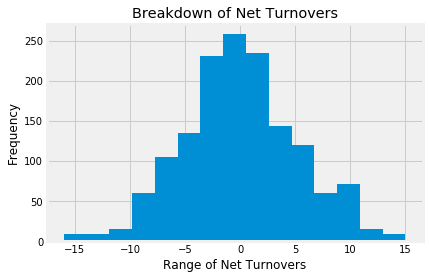

In [317]:
#Here is a histogram for Net_TO

knicks.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

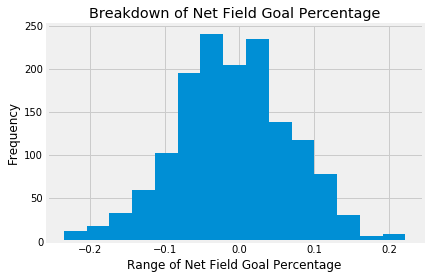

In [318]:
#Here is a histogram for Net_FG%

knicks.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

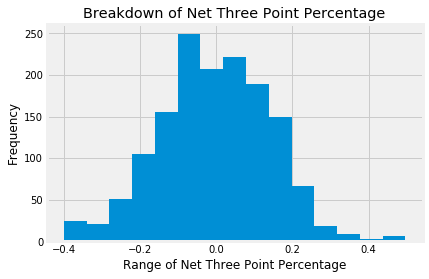

In [319]:
#Here is a histogram for Net_3P%

knicks.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

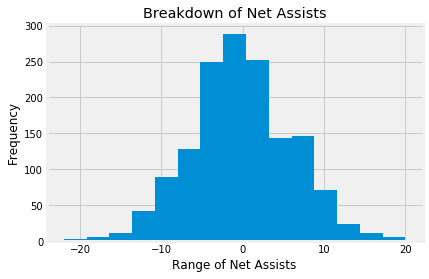

In [320]:
#Here is a histogram for Net_AST

knicks.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

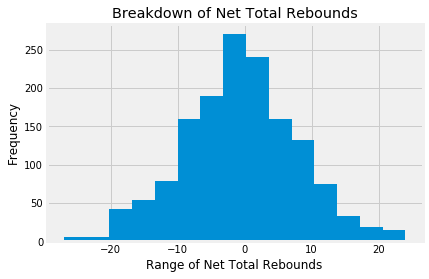

In [321]:
#Here is a histogram for Net_TRB

knicks.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

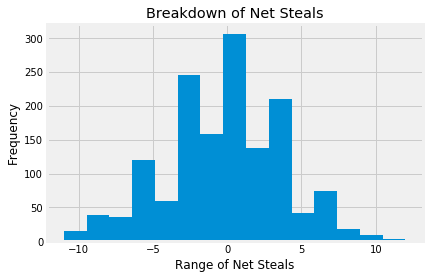

In [322]:
#Here is a histogram for Net_STl

knicks.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

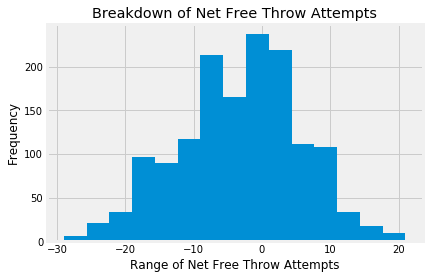

In [323]:
#Here is a histogram for Net_FTA

knicks.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

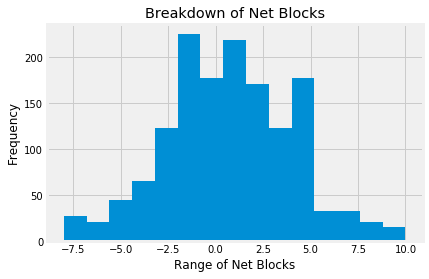

In [324]:
#Here is a histogram for Net_BLK 

knicks.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

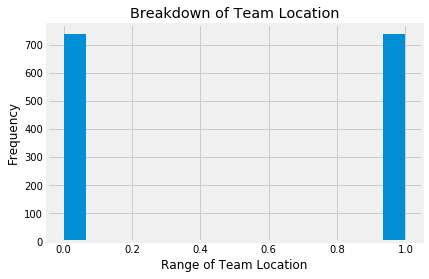

In [325]:
#Here is a histogram for teamLoc_Home

knicks.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

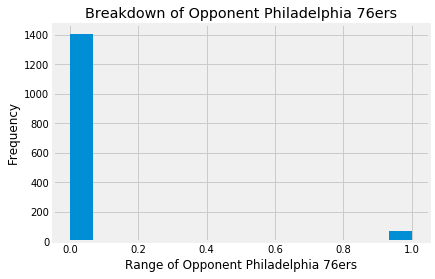

In [326]:
#Here is a histogram for opptAbbr_PHI

knicks.loc[:,"opptAbbr_PHI"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Philadelphia 76ers")
plt.title("Breakdown of Opponent Philadelphia 76ers");

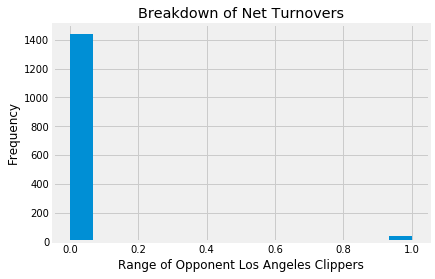

In [327]:
#Here is a histogram for opptAbbr_LAC

knicks.loc[:,"opptAbbr_LAC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Clippers")
plt.title("Breakdown of Net Turnovers");

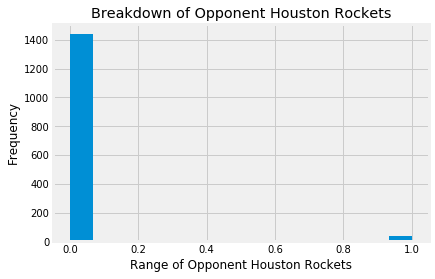

In [328]:
#Here is a histogram for opptAbbr_HOU

knicks.loc[:,"opptAbbr_HOU"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Houston Rockets")
plt.title("Breakdown of Opponent Houston Rockets");

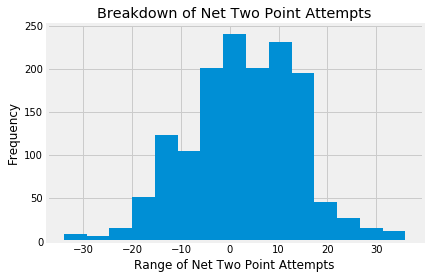

In [329]:
#Here is a histogram for Net_2PA 

knicks.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

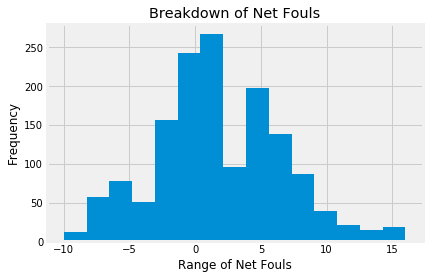

In [330]:
 #Here is a histogram for Net_Fouls 

knicks.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Brooklyn Nets

In [331]:
nets = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'BKN']

In [332]:
nets.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
171,BKN,-3,-3,3,-2,0,-12,-1,0.0056,2,...,0,0,0,0,0,0,0,0,0,0
172,BKN,-3,-3,3,-2,0,-12,-1,0.0056,2,...,0,0,0,0,0,0,0,0,0,0
173,BKN,-3,-3,3,-2,0,-12,-1,0.0056,2,...,0,0,0,0,0,0,0,0,0,0
255,BKN,1,-6,4,-2,-3,-1,-15,-0.0205,-18,...,0,0,0,0,0,0,0,0,0,0
256,BKN,1,-6,4,-2,-3,-1,-15,-0.0205,-18,...,0,0,0,0,0,0,0,0,0,0


In [333]:
nets.shape

(1476, 130)

In [334]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Nets

nets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.655285
Net_3P%                          0.425358
Net_AST                          0.422817
Net_TRB                          0.344890
Net_STL                          0.293821
Net_BLK                          0.255967
Net_FTA                          0.179519
teamLoc_Home                     0.124141
opptAbbr_PHO                     0.110573
Off_Name_BennettSalvatore        0.094035
Net_Day_Off                      0.092394
opptAbbr_ORL                     0.081226
opptAbbr_PHI                     0.062316
Off_Name_LeonWood                0.057191
opptAbbr_DEN                     0.056922
opptAbbr_SAC                     0.056922
Off_Name_EliRoe                  0.054850
Off_Name_DavidJones              0.052328
Off_Name_RayAcosta               0.046707
Off_Name_DickBavetta             0.041487
opptAbbr_DET                     0.041183
Off_Name_KevinScott              0.040654
Off_Name_MichaelSmith            0

In [335]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the nets subset to only those variables with .1 or greater correlation

nets = nets.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_VladimirVoyard-Tadal', 'Off_Name_PhenizeeRansom',
                                  'Off_Name_BrendaPantoja', 'Off_Name_BrandonAdair', 'Off_Name_KippKissinger', 'opptAbbr_BKN', 
                                  'opptAbbr_GS','opptAbbr_SA','Off_Name_TylerFord', 'Net_FGA', 'Off_Name_JonathanSterling',
                                  'opptAbbr_TOR','Off_Name_DerrickCollins','Off_Name_MikeCallahan', 'opptAbbr_HOU', 
                                  'Off_Name_PatFraher', 'Off_Name_BennieAdams', 'opptAbbr_IND', 'Off_Name_MitchellErvin',
                                  'Off_Name_JacynGoble', 'Off_Name_KevinCutler', 'Off_Name_MontyMcCutchen', 'Net_3PA',
                                  'opptAbbr_MIL', 'opptAbbr_WAS', 'Off_Name_TonyBrown', 'Off_Name_JohnGoble', 
                                  'Off_Name_DavidGuthrie', 'Off_Name_GediminasPetraitis', 'Off_Name_BillSpooner', 
                                  'Off_Name_SeanWright', 'Off_Name_TreMaddox', 'Off_Name_MichaelSmith', 'Off_Name_KevinScott',
                                  'opptAbbr_DET','Off_Name_DickBavetta','Off_Name_RayAcosta', 'Off_Name_DavidJones',
                                  'Off_Name_EliRoe', 'opptAbbr_SAC', 'opptAbbr_DEN', 'Off_Name_LeonWood', 'opptAbbr_PHI',
                                  'opptAbbr_ORL', 'Net_Day_Off', 'Off_Name_BennettSalvatore'], axis = 'columns')

In [336]:
nets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.655285
Net_3P%                     0.425358
Net_AST                     0.422817
Net_TRB                     0.344890
Net_STL                     0.293821
Net_BLK                     0.255967
Net_FTA                     0.179519
teamLoc_Home                0.124141
opptAbbr_PHO                0.110573
opptAbbr_DAL                0.030097
opptAbbr_OKC                0.030097
Off_Name_LaurenHoltkamp     0.026164
Off_Name_KevinFehr          0.023904
opptAbbr_NY                 0.023896
Off_Name_DerekRichardson    0.021150
Off_Name_DerrickStafford    0.015004
Off_Name_KaneFitzgerald     0.013451
Off_Name_JasonPhillips      0.012031
Off_Name_RodneyMott         0.012031
Off_Name_JoeCrawford        0.010562
Off_Name_LeroyRichardson    0.010544
Off_Name_BillKennedy        0.010379
Off_Name_OlandisPoole       0.009923
Off_Name_EddieRush          0.009923
opptAbbr_CHA                0.009487
Off_Name_JustinVan Duyne    0.008583
O

In [337]:
nets = nets.drop(['Off_Name_TomWashington','Off_Name_DedricTaylor','opptAbbr_LAL', 'opptAbbr_UTA', 'opptAbbr_NO',
                                  'opptAbbr_LAC', 'opptAbbr_POR', 'Off_Name_ScottBolnick', 'Off_Name_RandyRichardson', 
                                  'opptAbbr_MIA','opptAbbr_CLE','Off_Name_RonGarretson', 'Off_Name_JoeDeRosa', 
                                  'Off_Name_EricDalen', 'Off_Name_GaryZielinski', 'Off_Name_ScottFoster', 'opptAbbr_BOS',
                                  'Off_Name_JamesWilliams','Net_2PA','Off_Name_TonyBrothers', 'Off_Name_KarlLane', 
                                  'Off_Name_StevenAnderson', 'Off_Name_EricLewis', 'opptAbbr_CHI', 'Off_Name_KenMauer',
                                  'Off_Name_J.T.Orr', 'Off_Name_HaywoodeWorkman', 'Off_Name_BrianForte', 'Off_Name_NickBuchert',
                                  'Off_Name_BrentBarnaky', 'Off_Name_VioletPalmer', 'Off_Name_JustinVan Duyne', 
                                  'opptAbbr_CHA', 'Off_Name_EddieRush', 'Off_Name_OlandisPoole', 'Off_Name_BillKennedy', 
                                  'Off_Name_LeroyRichardson', 'Off_Name_JoeCrawford', 'Off_Name_RodneyMott', 
                                  'Off_Name_JasonPhillips', 'Off_Name_KaneFitzgerald', 'Off_Name_DerrickStafford', 
                                  'Off_Name_DerekRichardson', 'opptAbbr_NY', 'Off_Name_KevinFehr', 'Off_Name_LaurenHoltkamp',
                                  'opptAbbr_OKC','opptAbbr_DAL'], axis = 'columns')

In [338]:
nets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.655285
Net_3P%                      0.425358
Net_AST                      0.422817
Net_TRB                      0.344890
Net_STL                      0.293821
Net_BLK                      0.255967
Net_FTA                      0.179519
teamLoc_Home                 0.124141
opptAbbr_PHO                 0.110573
Off_Name_BenTaylor           0.007243
Off_Name_MaratKogut          0.007243
Off_Name_SeanCorbin          0.005397
Off_Name_MattBoland          0.003382
Off_Name_DanCrawford         0.003382
opptAbbr_MIN                 0.003271
opptAbbr_MEM                 0.003271
Off_Name_CurtisBlair         0.000251
Off_Name_BrettNansel        -0.000772
Off_Name_ScottTwardoski     -0.001342
Off_Name_JamesCapers        -0.001552
Off_Name_EdMalloy           -0.001738
Off_Name_MarkLindsay        -0.001738
Off_Name_MarcDavis          -0.003864
Off_Name_JoshTiven          -0.003893
Off_Name_MarkAyotte         -0.003985
Off_Name_C.J

In [339]:
nets = nets.drop(['Off_Name_ZachZarba','Off_Name_CourtneyKirkland','Off_Name_JasonGoldenberg', 'Off_Name_ScottWall', 
                                  'Off_Name_C.J.Washington', 'Off_Name_MarkAyotte', 'Off_Name_JoshTiven', 'Off_Name_MarcDavis',
                                  'Off_Name_MarkLindsay', 'Off_Name_EdMalloy', 'Off_Name_JamesCapers', 'opptAbbr_MEM', 
                                  'Off_Name_ScottTwardoski', 'Off_Name_BrettNansel', 'Off_Name_CurtisBlair', 'opptAbbr_MIN', 
                                  'Off_Name_DanCrawford','Off_Name_MattBoland','Off_Name_SeanCorbin', 'Off_Name_MaratKogut', 
                                  'Off_Name_BenTaylor'], axis = 'columns')

In [340]:
nets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.655285
Net_3P%         0.425358
Net_AST         0.422817
Net_TRB         0.344890
Net_STL         0.293821
Net_BLK         0.255967
Net_FTA         0.179519
teamLoc_Home    0.124141
opptAbbr_PHO    0.110573
Net_Fouls      -0.187728
Net_TO         -0.204652
Name: teamRslt_Win, dtype: float64

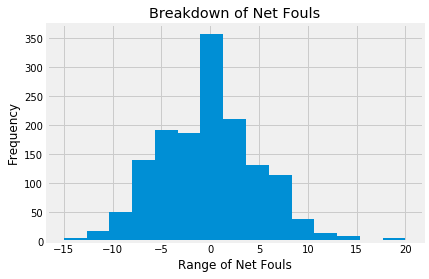

In [341]:
 #Here is a histogram for Net_Fouls 

nets.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

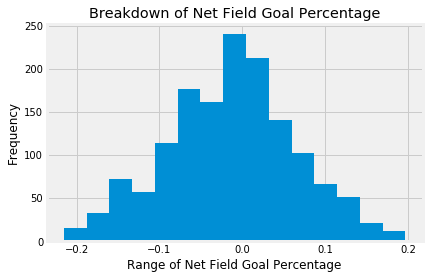

In [342]:
 #Here is a histogram for Net_FG%

nets.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

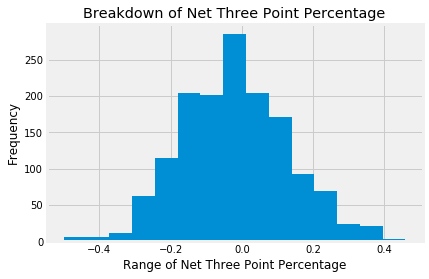

In [343]:
#Here is a histogram for Net_3P%

nets.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

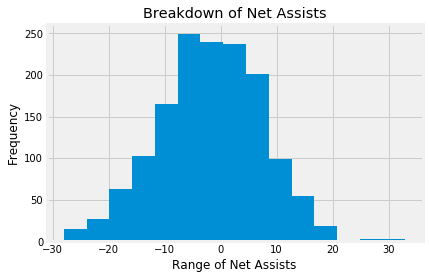

In [344]:
#Here is a histogram for Net_TRB

nets.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

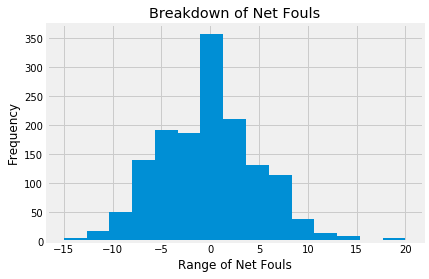

In [345]:
#Here is a histogram for Net_AST

nets.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

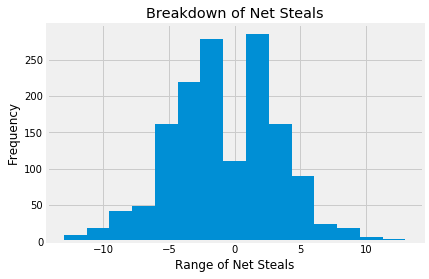

In [346]:
#Here is a histogram for Net_STL

nets.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

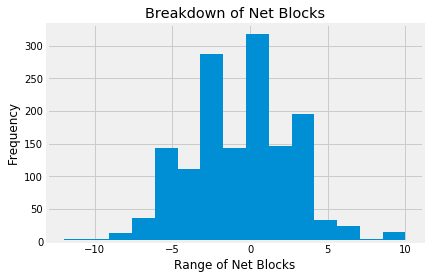

In [347]:
#Here is a histogram for Net_BLK

nets.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

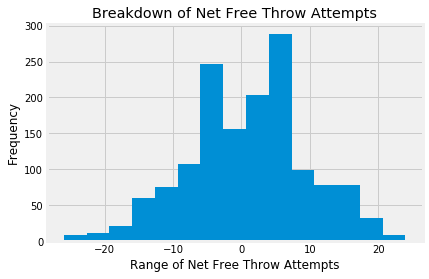

In [348]:
#Here is a histogram for Net_FTA

nets.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

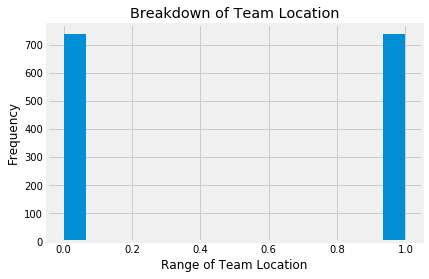

In [349]:
#Here is a histogram for teamLoc_Home

nets.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

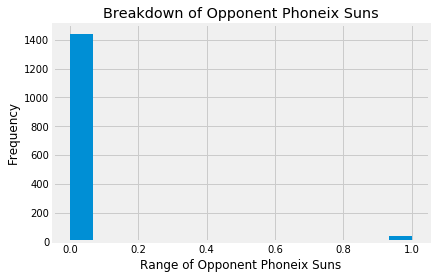

In [350]:
#Here is a histogram for opptAbbr_PHO

nets.loc[:,"opptAbbr_PHO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Phoneix Suns")
plt.title("Breakdown of Opponent Phoneix Suns");

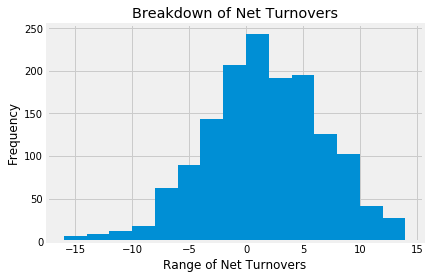

In [351]:
#Here is a histogram for Net_TO

nets.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Philadelphia 76ers

In [352]:
sixers = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'PHI']

In [353]:
sixers.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
21,PHI,0,-1,-6,4,6,-8,-3,-0.0221,-10,...,0,0,0,0,0,0,0,0,0,0
22,PHI,0,-1,-6,4,6,-8,-3,-0.0221,-10,...,0,0,0,0,1,0,0,0,0,0
23,PHI,0,-1,-6,4,6,-8,-3,-0.0221,-10,...,0,0,0,0,0,0,0,0,0,0
210,PHI,2,-4,3,-4,-3,8,2,-0.0761,12,...,0,0,0,0,0,0,0,0,0,0
211,PHI,2,-4,3,-4,-3,8,2,-0.0761,12,...,0,0,0,0,0,0,0,1,0,0


In [354]:
sixers.shape

(1476, 130)

In [355]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Sixers

sixers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.639171
Net_AST                          0.526327
Net_TRB                          0.443420
Net_3P%                          0.419023
Net_BLK                          0.320784
Net_STL                          0.180516
teamLoc_Home                     0.160278
Net_FTA                          0.100615
opptAbbr_DEN                     0.086301
opptAbbr_CHA                     0.079663
Net_Day_Off                      0.072467
opptAbbr_BKN                     0.063273
opptAbbr_DET                     0.058703
opptAbbr_SAC                     0.058219
opptAbbr_MIN                     0.058219
Off_Name_RayAcosta               0.052816
Off_Name_JoeDeRosa               0.052816
Off_Name_VladimirVoyard-Tadal    0.052816
Net_2PA                          0.046181
Off_Name_TylerFord               0.044507
Off_Name_JamesWilliams           0.043155
Off_Name_PhenizeeRansom          0.037334
Off_Name_BenTaylor               0

In [356]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the sixers subset to only those variables with .1 or greater correlation

sixers = sixers.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_RandyRichardson', 'opptAbbr_PHI',
                                  'Off_Name_BrendaPantoja', 'Off_Name_BrandonAdair', 'opptAbbr_GS', 'opptAbbr_CHI',
                                  'Net_FGA','opptAbbr_TOR','Off_Name_StevenAnderson', 'opptAbbr_MEM', 'opptAbbr_SA',
                                  'Off_Name_CurtisBlair','Off_Name_MaratKogut','Off_Name_KevinScott', 'Off_Name_EliRoe', 
                                  'Off_Name_DavidJones', 'opptAbbr_IND', 'Off_Name_KenMauer', 'Off_Name_BennieAdams',
                                  'Off_Name_DerekRichardson', 'Off_Name_MattBoland', 'Off_Name_DanCrawford', 'opptAbbr_HOU',
                                  'opptAbbr_UTA', 'opptAbbr_POR', 'Off_Name_BillKennedy', 'Off_Name_LaurenHoltkamp',
                                  'Off_Name_OlandisPoole', 'Off_Name_DerrickStafford', 'Off_Name_J.T.Orr', 'opptAbbr_MIN',
                                  'Off_Name_BenTaylor','Off_Name_PhenizeeRansom','Off_Name_JamesWilliams', 'Net_2PA', 
                                  'Off_Name_TylerFord', 'Off_Name_VladimirVoyard-Tadal', 'Off_Name_JoeDeRosa', 
                                  'Off_Name_RayAcosta', 'opptAbbr_SAC', 'opptAbbr_DET', 'opptAbbr_BKN', 'Net_Day_Off',
                                  'opptAbbr_CHA', 'opptAbbr_DEN'], axis = 'columns')

In [357]:
sixers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.639171
Net_AST                        0.526327
Net_TRB                        0.443420
Net_3P%                        0.419023
Net_BLK                        0.320784
Net_STL                        0.180516
teamLoc_Home                   0.160278
Net_FTA                        0.100615
opptAbbr_PHO                   0.030137
opptAbbr_LAL                   0.030137
opptAbbr_NO                    0.030137
Off_Name_GaryZielinski         0.028838
Off_Name_JasonPhillips         0.027756
Off_Name_ScottFoster           0.027352
opptAbbr_ORL                   0.024174
opptAbbr_NY                    0.023053
Off_Name_DedricTaylor          0.022833
Off_Name_LeonWood              0.021459
Off_Name_JacynGoble            0.019566
Off_Name_MikeCallahan          0.019448
Off_Name_JasonGoldenberg       0.019194
Off_Name_JoeCrawford           0.017256
Off_Name_KaneFitzgerald        0.017180
Off_Name_LeroyRichardson       0.017180


In [358]:
sixers = sixers.drop(['opptAbbr_LAC','Off_Name_PatFraher','opptAbbr_MIL', 'Off_Name_KevinCutler', 'Off_Name_KarlLane',
                                  'Off_Name_VioletPalmer', 'Off_Name_ScottBolnick', 'Off_Name_KevinFehr', 
                                  'Off_Name_KippKissinger', 'Off_Name_BrentBarnaky', 'opptAbbr_BOS', 'Off_Name_RonGarretson',
                                  'Off_Name_SeanWright','Off_Name_MontyMcCutchen','Off_Name_HaywoodeWorkman', 
                                  'Off_Name_MichaelSmith', 'Off_Name_GediminasPetraitis', 'Off_Name_EdMalloy',
                                  'Off_Name_MarcDavis','Off_Name_DavidGuthrie','Off_Name_MitchellErvin', 
                                  'Off_Name_DerrickCollins', 'Off_Name_BillSpooner', 'Off_Name_RodneyMott', 
                                  'Off_Name_BrettNansel', 'Off_Name_JohnGoble', 'Off_Name_JonathanSterling',
                                  'Off_Name_ScottTwardoski', 'Off_Name_MarkLindsay', 'opptAbbr_WAS', 'Off_Name_JamesCapers',
                                  'Off_Name_LeroyRichardson', 'Off_Name_KaneFitzgerald', 'Off_Name_JoeCrawford', 
                                  'Off_Name_JasonGoldenberg', 'Off_Name_MikeCallahan', 'Off_Name_JacynGoble', 'opptAbbr_ORL',
                                  'Off_Name_LeonWood', 'Off_Name_DedricTaylor', 'opptAbbr_NY', 'Off_Name_ScottFoster',
                                  'Off_Name_JasonPhillips', 'Off_Name_GaryZielinski', 'opptAbbr_NO', 'opptAbbr_LAL',
                                  'opptAbbr_PHO'], axis = 'columns')

In [359]:
sixers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.639171
Net_AST                      0.526327
Net_TRB                      0.443420
Net_3P%                      0.419023
Net_BLK                      0.320784
Net_STL                      0.180516
teamLoc_Home                 0.160278
Net_FTA                      0.100615
Off_Name_TonyBrothers        0.012105
Off_Name_JustinVan Duyne     0.010657
Off_Name_TreMaddox           0.009543
Off_Name_ScottWall           0.009166
Off_Name_EddieRush           0.009041
Off_Name_CourtneyKirkland    0.008864
Off_Name_DickBavetta         0.007515
Off_Name_TomWashington       0.005914
Off_Name_ZachZarba           0.005399
Off_Name_EricLewis           0.005399
opptAbbr_DAL                 0.002055
Off_Name_SeanCorbin          0.001671
Off_Name_EricDalen           0.001317
Off_Name_C.J.Washington      0.000830
Off_Name_BrianForte         -0.001721
Off_Name_NickBuchert        -0.002024
Off_Name_MarkAyotte         -0.002786
Off_Name_Jos

In [360]:
sixers = sixers.drop(['Off_Name_TonyBrown','opptAbbr_CLE','opptAbbr_MIA', 'Off_Name_BennettSalvatore', 'Off_Name_JoshTiven',
                                  'Off_Name_MarkAyotte', 'Off_Name_NickBuchert', 'Off_Name_BrianForte', 
                                  'Off_Name_C.J.Washington', 'Off_Name_EricDalen', 'Off_Name_SeanCorbin', 
                                  'opptAbbr_DAL', 'Off_Name_EricLewis', 'Off_Name_ZachZarba', 'Off_Name_TomWashington',
                                  'Off_Name_DickBavetta','Off_Name_CourtneyKirkland','Off_Name_EddieRush', 'Off_Name_ScottWall',
                                  'Off_Name_TreMaddox', 'Off_Name_JustinVan Duyne', 'Off_Name_TonyBrothers'
                                  ], axis = 'columns')

In [361]:
sixers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.639171
Net_AST         0.526327
Net_TRB         0.443420
Net_3P%         0.419023
Net_BLK         0.320784
Net_STL         0.180516
teamLoc_Home    0.160278
Net_FTA         0.100615
Net_TO         -0.107101
opptAbbr_OKC   -0.110273
Net_Fouls      -0.118650
Net_3PA        -0.123213
Name: teamRslt_Win, dtype: float64

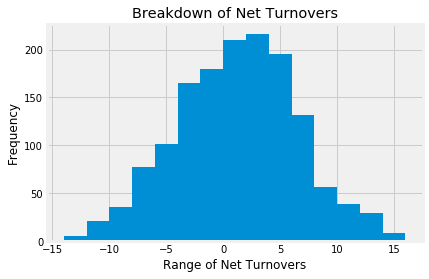

In [362]:
#Here is a histogram for Net_TO

sixers.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

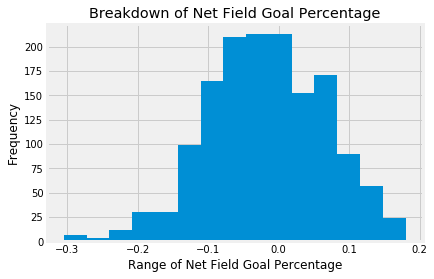

In [363]:
#Here is a histogram for Net_FG%

sixers.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

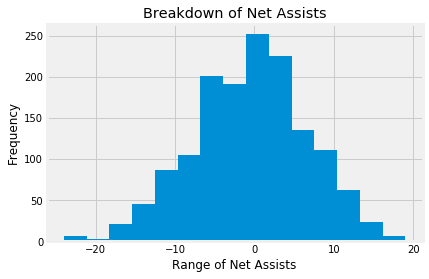

In [364]:
#Here is a histogram for Net_AST

sixers.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

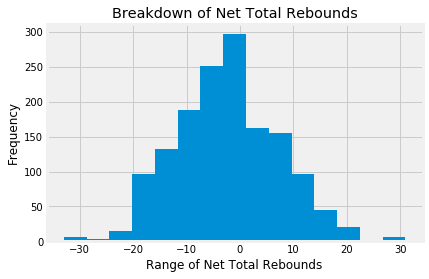

In [365]:
#Here is a histogram for Net_TRB

sixers.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

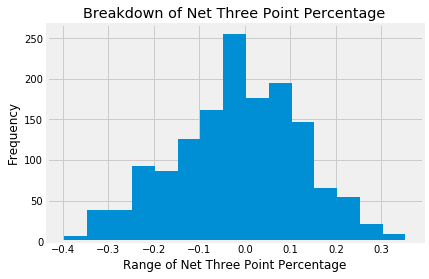

In [366]:
#Here is a histogram for Net_3P%

sixers.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

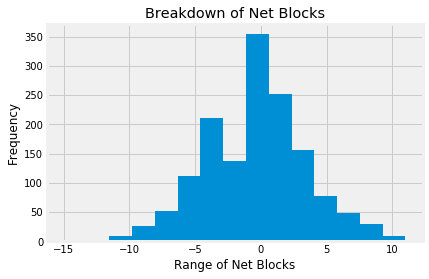

In [367]:
#Here is a histogram for Net_BLK

sixers.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

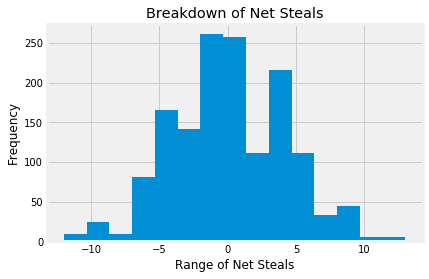

In [368]:
#Here is a histogram for Net_STL

sixers.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

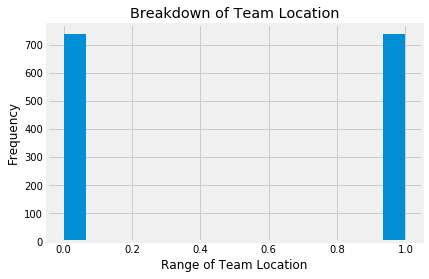

In [369]:
#Here is a histogram for teamLoc_Home

sixers.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

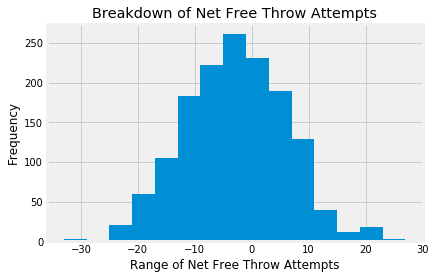

In [370]:
#Here is a histogram for Net_FTA 

sixers.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

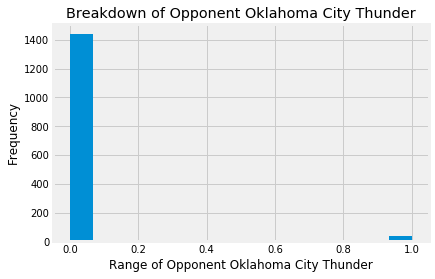

In [371]:
#Here is a histogram for opptAbbr_OKC

sixers.loc[:,"opptAbbr_OKC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Oklahoma City Thunder")
plt.title("Breakdown of Opponent Oklahoma City Thunder");

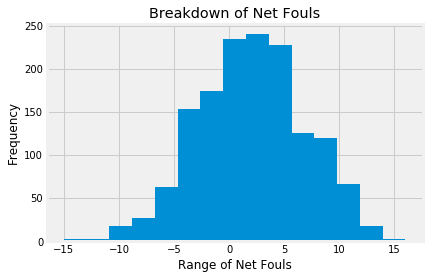

In [372]:
#Here is a histogram for Net_Fouls

sixers.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

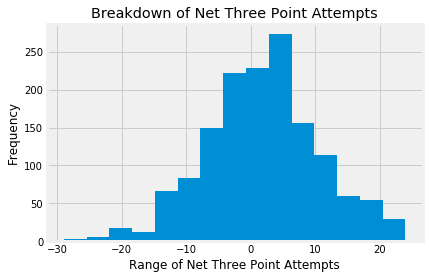

In [373]:
#Here is a histogram for Net_3PA 

sixers.loc[:,"Net_3PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Attempts")
plt.title("Breakdown of Net Three Point Attempts");

#### San Antonio Spurs

In [374]:
spurs = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'SA']

In [375]:
spurs.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
42,SA,0,-4,1,2,2,1,0,0.0375,-3,...,0,0,0,0,0,0,0,0,0,0
43,SA,0,-4,1,2,2,1,0,0.0375,-3,...,0,0,0,0,0,0,0,0,0,0
44,SA,0,-4,1,2,2,1,0,0.0375,-3,...,0,0,0,0,0,0,0,0,0,0
75,SA,1,9,-5,3,-1,1,2,0.0664,0,...,0,0,0,0,0,0,0,0,0,0
76,SA,1,9,-5,3,-1,1,2,0.0664,0,...,0,0,0,0,0,0,0,0,0,0


In [376]:
spurs.shape

(1476, 130)

In [377]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Spurs

spurs.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.644459
Net_AST                          0.441143
Net_3P%                          0.372054
Net_TRB                          0.364201
teamLoc_Home                     0.260166
Net_BLK                          0.240352
Net_STL                          0.185647
Net_FTA                          0.136386
opptAbbr_SAC                     0.116104
Net_Day_Off                      0.075295
opptAbbr_BOS                     0.071633
opptAbbr_CHA                     0.071633
opptAbbr_DAL                     0.060947
Off_Name_SeanWright              0.060433
opptAbbr_PHO                     0.050994
Net_3PA                          0.047867
opptAbbr_MIN                     0.045734
Off_Name_CurtisBlair             0.044732
Off_Name_StevenAnderson          0.044040
Off_Name_RonGarretson            0.043922
opptAbbr_PHI                     0.042554
opptAbbr_ORL                     0.042554
opptAbbr_CLE                     0

In [378]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the spurs subset to only those variables with .1 or greater correlation

spurs = spurs.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_RandyRichardson', 'Off_Name_RayAcosta',
                                  'Off_Name_BrendaPantoja', 'Off_Name_VladimirVoyard-Tadal', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','opptAbbr_SA','opptAbbr_LAC', 'opptAbbr_POR', 'opptAbbr_HOU',
                                  'Net_Fouls','opptAbbr_GS','Net_2PA', 'Off_Name_EricDalen', 'Off_Name_JoeDeRosa',
                                  'Off_Name_BrentBarnaky', 'Net_FGA', 'opptAbbr_NY', 'opptAbbr_NO', 'opptAbbr_UTA',
                                  'Off_Name_JonathanSterling', 'Off_Name_TonyBrothers', 'Off_Name_BennettSalvatore',
                                  'Off_Name_NickBuchert', 'Off_Name_MontyMcCutchen', 'opptAbbr_DEN', 'Off_Name_JoshTiven',
                                  'Off_Name_EliRoe','Off_Name_C.J.Washington','Off_Name_LeroyRichardson', 'opptAbbr_BKN',
                                  'opptAbbr_CLE', 'opptAbbr_ORL', 'opptAbbr_PHI', 'Off_Name_RonGarretson', 'opptAbbr_MIN',
                                  'Off_Name_StevenAnderson', 'Off_Name_CurtisBlair', 'Net_3PA', 'opptAbbr_PHO', 
                                  'Off_Name_SeanWright', 'opptAbbr_DAL', 'opptAbbr_CHA', 'opptAbbr_BOS', 'Net_Day_Off'
                                  ], axis = 'columns')

In [379]:
spurs.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.644459
Net_AST                        0.441143
Net_3P%                        0.372054
Net_TRB                        0.364201
teamLoc_Home                   0.260166
Net_BLK                        0.240352
Net_STL                        0.185647
Net_FTA                        0.136386
opptAbbr_SAC                   0.116104
Off_Name_DerekRichardson       0.028993
Off_Name_KarlLane              0.025671
Off_Name_PatFraher             0.025532
Off_Name_DavidJones            0.024366
Off_Name_JasonGoldenberg       0.023463
Off_Name_ScottBolnick          0.023463
Off_Name_MarkAyotte            0.022921
Off_Name_OlandisPoole          0.022206
Off_Name_LaurenHoltkamp        0.020424
Off_Name_JoeCrawford           0.019817
Off_Name_BennieAdams           0.019681
Off_Name_ScottTwardoski        0.019681
opptAbbr_MEM                   0.019300
Off_Name_CourtneyKirkland      0.017574
Off_Name_MikeCallahan          0.014759


In [380]:
spurs = spurs.drop(['Off_Name_PhenizeeRansom','Off_Name_TreMaddox','Off_Name_MichaelSmith', 'Off_Name_BrettNansel',
                                  'Off_Name_KevinFehr', 'Off_Name_JasonPhillips', 'opptAbbr_LAL', 'Off_Name_TomWashington',
                                  'Off_Name_MaratKogut','Off_Name_DedricTaylor','Off_Name_GaryZielinski', 'opptAbbr_CHI',
                                  'Off_Name_BillKennedy', 'Off_Name_KaneFitzgerald', 'opptAbbr_DET', 'opptAbbr_IND',
                                  'Off_Name_ScottWall', 'Off_Name_KevinScott', 'Off_Name_MarkLindsay', 'Off_Name_JamesWilliams',
                                  'Off_Name_DerrickCollins', 'Off_Name_LeonWood', 'Off_Name_EricLewis', 'Off_Name_DanCrawford',
                                  'Off_Name_TylerFord','Off_Name_GediminasPetraitis','Off_Name_MitchellErvin', 'opptAbbr_MIA',
                                  'Off_Name_TonyBrown', 'Off_Name_DerrickStafford', 'opptAbbr_TOR', 'opptAbbr_WAS',
                                  'opptAbbr_MIL', 'Off_Name_MikeCallahan', 'Off_Name_CourtneyKirkland', 'opptAbbr_MEM', 
                                  'Off_Name_ScottTwardoski', 'Off_Name_BennieAdams', 'Off_Name_JoeCrawford',
                                  'Off_Name_LaurenHoltkamp', 'Off_Name_OlandisPoole', 'Off_Name_MarkAyotte',
                                  'Off_Name_ScottBolnick', 'Off_Name_JasonGoldenberg', 'Off_Name_DavidJones', 
                                  'Off_Name_PatFraher', 'Off_Name_KarlLane', 'Off_Name_DerekRichardson'
                                  ], axis = 'columns')

In [381]:
spurs.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.644459
Net_AST                     0.441143
Net_3P%                     0.372054
Net_TRB                     0.364201
teamLoc_Home                0.260166
Net_BLK                     0.240352
Net_STL                     0.185647
Net_FTA                     0.136386
opptAbbr_SAC                0.116104
Off_Name_BenTaylor          0.012703
Off_Name_DickBavetta        0.011402
Off_Name_JacynGoble         0.011402
Off_Name_BillSpooner        0.009989
Off_Name_KenMauer           0.008844
Off_Name_SeanCorbin         0.007705
Off_Name_MarcDavis          0.007705
Off_Name_EdMalloy           0.005729
Off_Name_VioletPalmer       0.004443
Off_Name_RodneyMott         0.004314
Off_Name_MattBoland         0.002658
Off_Name_JamesCapers        0.000891
Off_Name_ScottFoster        0.000891
Off_Name_JustinVan Duyne    0.000627
Off_Name_J.T.Orr            0.000627
Off_Name_DavidGuthrie      -0.000865
Off_Name_BrianForte        -0.000865
O

In [382]:
spurs = spurs.drop(['Off_Name_EddieRush','Off_Name_ZachZarba','Off_Name_JohnGoble', 'Off_Name_KevinCutler',
                                  'Off_Name_HaywoodeWorkman', 'Off_Name_BrianForte', 'Off_Name_DavidGuthrie', 
                                  'Off_Name_J.T.Orr', 'Off_Name_JustinVan Duyne', 'Off_Name_ScottFoster',
                                  'Off_Name_JamesCapers','Off_Name_MattBoland','Off_Name_RodneyMott', 'Off_Name_VioletPalmer',
                                  'Off_Name_EdMalloy', 'Off_Name_MarcDavis', 'Off_Name_SeanCorbin', 'Off_Name_KenMauer',
                                  'Off_Name_BillSpooner', 'Off_Name_JacynGoble', 'Off_Name_DickBavetta', 
                                  'Off_Name_BenTaylor'], axis = 'columns')

In [383]:
spurs.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.644459
Net_AST         0.441143
Net_3P%         0.372054
Net_TRB         0.364201
teamLoc_Home    0.260166
Net_BLK         0.240352
Net_STL         0.185647
Net_FTA         0.136386
opptAbbr_SAC    0.116104
opptAbbr_OKC   -0.122633
Net_TO         -0.203028
Name: teamRslt_Win, dtype: float64

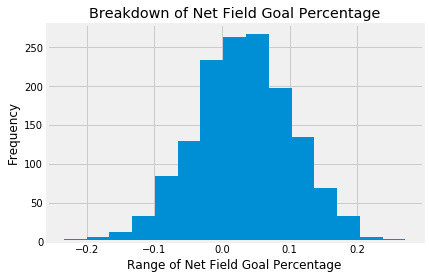

In [384]:
#Here is a histogram for Net_FG% 

spurs.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

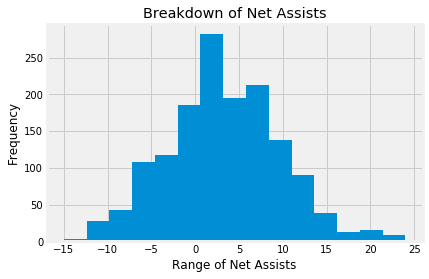

In [385]:
#Here is a histogram for Net_AST 

spurs.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

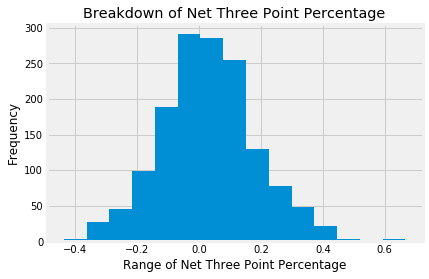

In [386]:
#Here is a histogram for Net_3P%

spurs.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

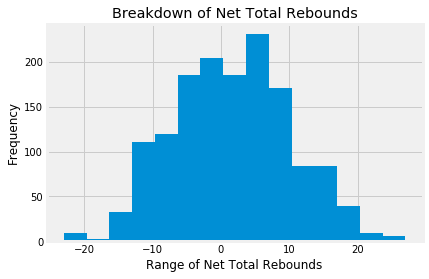

In [387]:
#Here is a histogram for Net_TRB 

spurs.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

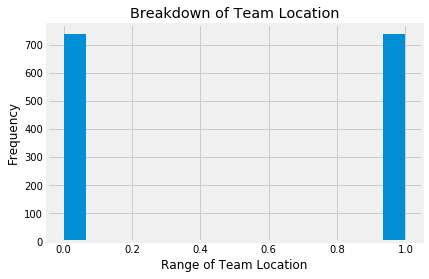

In [388]:
#Here is a histogram for teamLoc_Home 

spurs.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

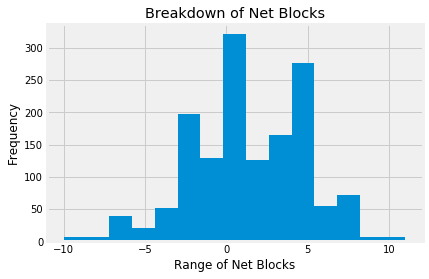

In [389]:
#Here is a histogram for Net_BLK 

spurs.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

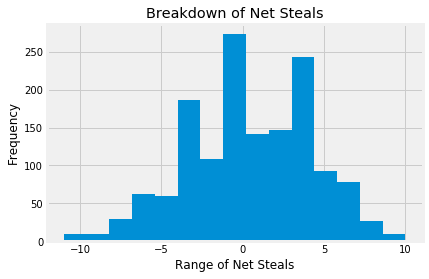

In [390]:
#Here is a histogram for Net_STL 

spurs.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

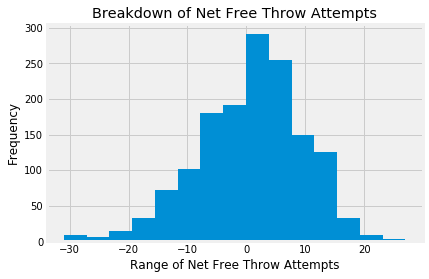

In [391]:
#Here is a histogram for Net_FTA 

spurs.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

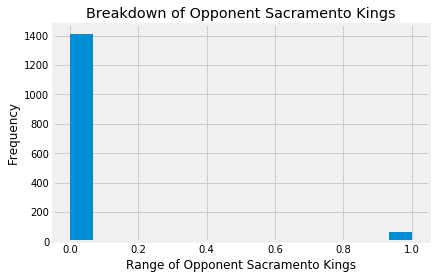

In [392]:
#Here is a histogram for opptAbbr_SAC 

spurs.loc[:,"opptAbbr_SAC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Sacramento Kings")
plt.title("Breakdown of Opponent Sacramento Kings");

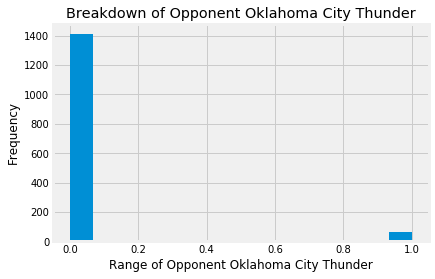

In [393]:
#Here is a histogram for opptAbbr_OKC 

spurs.loc[:,"opptAbbr_OKC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Oklahoma City Thunder")
plt.title("Breakdown of Opponent Oklahoma City Thunder");

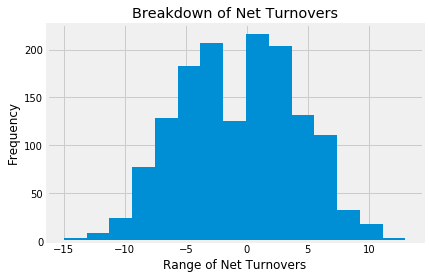

In [394]:
#Here is a histogram for Net_TO 

spurs.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Phoenix Suns

In [395]:
suns = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'PHO']

In [396]:
suns.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
57,PHO,0,-3,0,1,9,3,-6,0.0163,-10,...,0,0,0,0,0,0,0,0,0,0
58,PHO,0,-3,0,1,9,3,-6,0.0163,-10,...,0,0,0,0,0,0,0,0,0,0
59,PHO,0,-3,0,1,9,3,-6,0.0163,-10,...,0,0,0,0,0,0,0,0,0,0
135,PHO,0,-5,4,4,0,1,2,0.0237,4,...,0,0,0,0,0,0,0,0,0,0
136,PHO,0,-5,4,4,0,1,2,0.0237,4,...,0,0,0,0,0,0,0,0,0,0


In [397]:
suns.shape

(1476, 130)

In [398]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Nets

suns.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.656496
Net_3P%                      0.430363
Net_AST                      0.390422
Net_TRB                      0.371756
Net_BLK                      0.239898
Net_STL                      0.194121
Net_FTA                      0.176375
opptAbbr_LAL                 0.121837
teamLoc_Home                 0.118153
opptAbbr_PHI                 0.071390
opptAbbr_CHA                 0.071390
opptAbbr_DAL                 0.069245
Off_Name_EricDalen           0.062999
Off_Name_BennettSalvatore    0.052549
opptAbbr_DEN                 0.048369
Off_Name_JasonPhillips       0.044807
opptAbbr_ORL                 0.044035
opptAbbr_TOR                 0.044035
opptAbbr_CHI                 0.044035
Off_Name_TonyBrothers        0.042007
Off_Name_JoeCrawford         0.040878
opptAbbr_MIN                 0.039838
Off_Name_VioletPalmer        0.039717
Off_Name_C.J.Washington      0.039717
Off_Name_SeanCorbin          0.039397
Off_Name_Mar

In [399]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the nets subset to only those variables with .1 or greater correlation

suns = suns.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'opptAbbr_PHO', 'opptAbbr_BKN',
                                  'Off_Name_BrandonAdair', 'opptAbbr_LAC', 'opptAbbr_MIA', 'opptAbbr_SA', 'opptAbbr_HOU',
                                  'Off_Name_DavidGuthrie','Off_Name_JacynGoble','opptAbbr_UTA', 'opptAbbr_MIL', 
                                  'Off_Name_TylerFord', 'Off_Name_DerekRichardson', 'Off_Name_DanCrawford', 'opptAbbr_OKC',
                                  'Off_Name_LaurenHoltkamp','Off_Name_JonathanSterling','Off_Name_JoeDeRosa', 
                                  'Off_Name_MattBoland', 'Off_Name_BenTaylor', 'Off_Name_JustinVan Duyne',
                                  'Off_Name_RandyRichardson', 'Off_Name_PhenizeeRansom', 'Off_Name_RayAcosta', 
                                  'Off_Name_MarkAyotte', 'Off_Name_SeanCorbin', 'Off_Name_C.J.Washington', 'opptAbbr_MIN', 
                                  'Off_Name_VioletPalmer', 'Off_Name_JoeCrawford', 'Off_Name_TonyBrothers', 'opptAbbr_CHI',
                                  'opptAbbr_TOR', 'opptAbbr_ORL', 'Off_Name_JasonPhillips', 'opptAbbr_DEN', 'opptAbbr_PHI',
                                  'Off_Name_BennettSalvatore','Off_Name_EricDalen','opptAbbr_DAL', 'opptAbbr_CHA'
                                  ], axis = 'columns')

In [400]:
suns.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.656496
Net_3P%                          0.430363
Net_AST                          0.390422
Net_TRB                          0.371756
Net_BLK                          0.239898
Net_STL                          0.194121
Net_FTA                          0.176375
opptAbbr_LAL                     0.121837
teamLoc_Home                     0.118153
Off_Name_OlandisPoole            0.034280
Off_Name_BrendaPantoja           0.034280
Off_Name_TreMaddox               0.031801
Off_Name_J.T.Orr                 0.031106
Off_Name_LeonWood                0.031106
Off_Name_KevinFehr               0.028184
Off_Name_HaywoodeWorkman         0.027520
opptAbbr_NO                      0.027494
opptAbbr_SAC                     0.023890
opptAbbr_POR                     0.019421
Off_Name_ScottWall               0.018005
Off_Name_DerrickStafford         0.018005
opptAbbr_NY                      0.016680
opptAbbr_IND                     0

In [401]:
suns = suns.drop(['Off_Name_KippKissinger','Off_Name_JasonGoldenberg','Off_Name_EddieRush', 'Off_Name_JohnGoble', 
                                  'Off_Name_BillSpooner', 'Off_Name_KenMauer', 'Off_Name_GediminasPetraitis',
                                  'Off_Name_BennieAdams', 'Off_Name_BrettNansel', 'opptAbbr_MEM', 'Off_Name_DerrickCollins', 
                                  'Off_Name_VladimirVoyard-Tadal', 'Off_Name_MontyMcCutchen', 'Off_Name_KevinCutler',
                                  'Off_Name_RodneyMott','Off_Name_ZachZarba','Off_Name_JamesCapers', 'Off_Name_ScottFoster', 
                                  'Net_Day_Off', 'Off_Name_JoshTiven', 'Off_Name_EliRoe', 'Off_Name_DickBavetta',
                                  'opptAbbr_CLE','opptAbbr_WAS','opptAbbr_BOS', 'Off_Name_TomWashington',
                                  'Off_Name_KarlLane', 'Off_Name_KevinScott', 'Off_Name_MaratKogut', 'Off_Name_MarkLindsay',
                                  'Off_Name_SeanWright', 'opptAbbr_IND', 'opptAbbr_NY', 'Off_Name_DerrickStafford',
                                  'Off_Name_ScottWall', 'opptAbbr_POR', 'opptAbbr_SAC', 'opptAbbr_NO', 
                                  'Off_Name_HaywoodeWorkman', 'Off_Name_KevinFehr', 'Off_Name_LeonWood', 'Off_Name_J.T.Orr',
                                  'Off_Name_TreMaddox', 'Off_Name_BrendaPantoja', 'Off_Name_OlandisPoole', 
                                  ], axis = 'columns')

In [402]:
suns.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.656496
Net_3P%                      0.430363
Net_AST                      0.390422
Net_TRB                      0.371756
Net_BLK                      0.239898
Net_STL                      0.194121
Net_FTA                      0.176375
opptAbbr_LAL                 0.121837
teamLoc_Home                 0.118153
Off_Name_PatFraher           0.011042
Off_Name_EricLewis           0.011042
Off_Name_JamesWilliams       0.011042
Off_Name_DavidJones          0.009551
Off_Name_MichaelSmith        0.008309
Off_Name_MarcDavis           0.006460
Net_3PA                      0.005885
Off_Name_BrianForte          0.005216
Off_Name_BrentBarnaky        0.002441
Off_Name_ScottTwardoski      0.001804
Off_Name_BillKennedy         0.001280
Off_Name_DedricTaylor       -0.000399
Off_Name_CurtisBlair        -0.000566
Off_Name_KaneFitzgerald     -0.001595
Off_Name_CourtneyKirkland   -0.004709
Off_Name_MitchellErvin      -0.005288
Off_Name_Ste

In [403]:
suns = suns.drop(['opptAbbr_DET','Off_Name_LeroyRichardson','Off_Name_EdMalloy', 'Off_Name_TonyBrown', 
                                  'Off_Name_MikeCallahan', 'Off_Name_RonGarretson', 'Off_Name_GaryZielinski',
                                  'Off_Name_NickBuchert', 'Off_Name_StevenAnderson', 'Off_Name_MitchellErvin', 
                                  'Off_Name_CourtneyKirkland', 'Off_Name_KaneFitzgerald', 'Off_Name_CurtisBlair',
                                  'Off_Name_DedricTaylor', 'Off_Name_BillKennedy', 'Off_Name_ScottTwardoski',
                                  'Off_Name_BrentBarnaky','Off_Name_BrianForte','Net_3PA', 'Off_Name_MarcDavis', 
                                  'Off_Name_MichaelSmith', 'Off_Name_DavidJones', 'Off_Name_JamesWilliams', 
                                  'Off_Name_EricLewis', 'Off_Name_PatFraher'], axis = 'columns')

In [404]:
suns.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.656496
Net_3P%         0.430363
Net_AST         0.390422
Net_TRB         0.371756
Net_BLK         0.239898
Net_STL         0.194121
Net_FTA         0.176375
opptAbbr_LAL    0.121837
teamLoc_Home    0.118153
Net_2PA        -0.109848
opptAbbr_GS    -0.113237
Net_TO         -0.122191
Net_FGA        -0.128669
Net_Fouls      -0.228292
Name: teamRslt_Win, dtype: float64

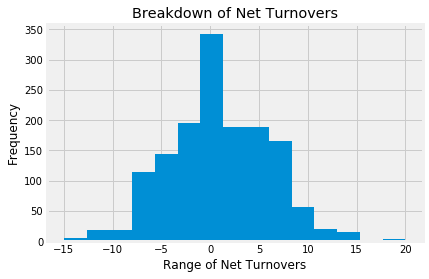

In [405]:
#Here is a histogram for Net_TO 

suns.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

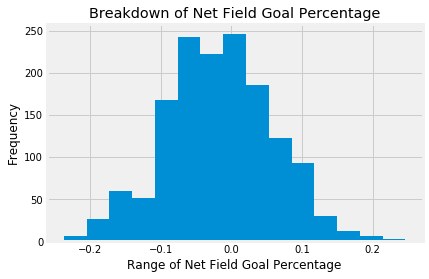

In [406]:
#Here is a histogram for Net_FG%

suns.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

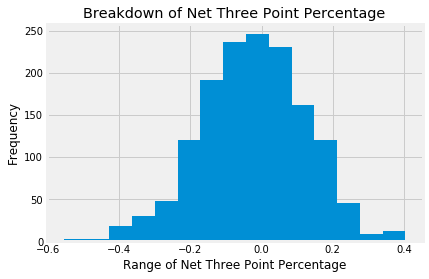

In [407]:
#Here is a histogram for Net_3P% 

suns.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

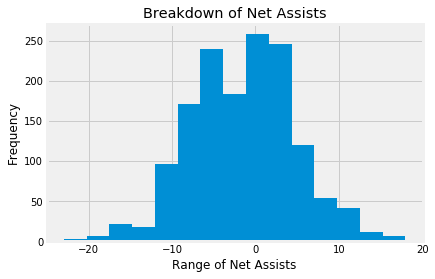

In [408]:
#Here is a histogram for Net_AST 

suns.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

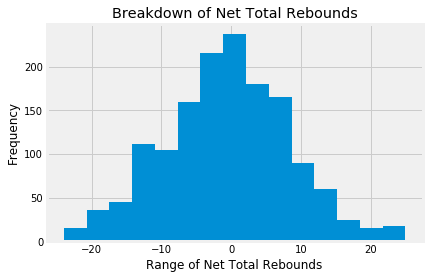

In [409]:
#Here is a histogram for Net_TRB

suns.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

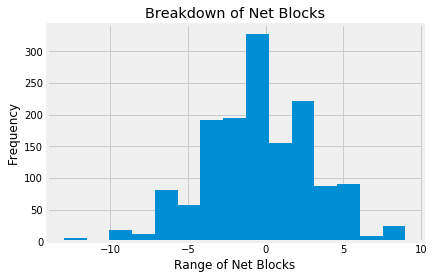

In [410]:
#Here is a histogram for Net_BLK

suns.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

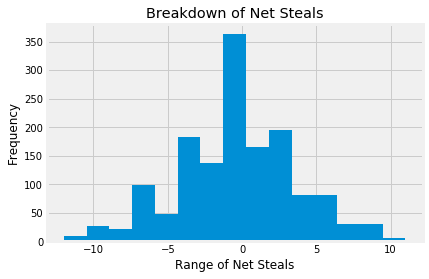

In [411]:
#Here is a histogram for Net_STL 

suns.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

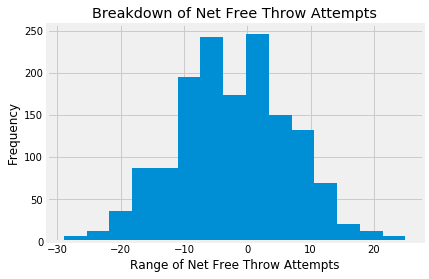

In [412]:
#Here is a histogram for Net_FTA 

suns.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

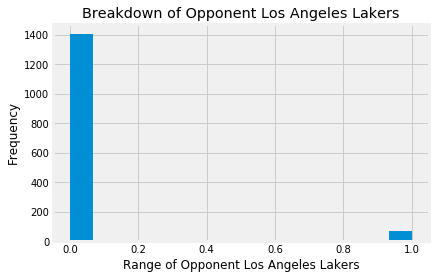

In [413]:
#Here is a histogram for opptAbbr_LAL

suns.loc[:,"opptAbbr_LAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Lakers")
plt.title("Breakdown of Opponent Los Angeles Lakers");

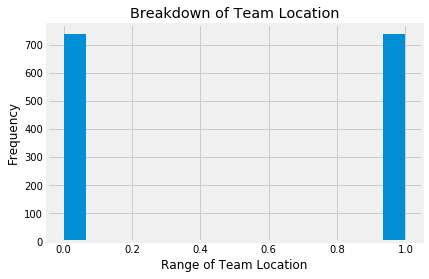

In [414]:
#Here is a histogram for teamLoc_Home

suns.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

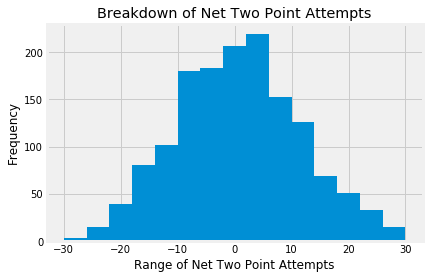

In [415]:
#Here is a histogram for Net_2PA 

suns.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

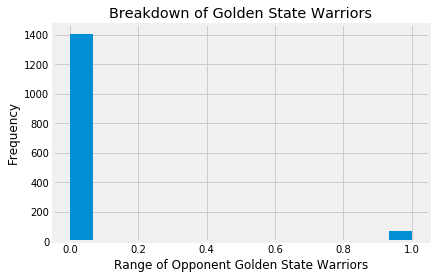

In [416]:
#Here is a histogram for opptAbbr_GS 

suns.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Golden State Warriors");

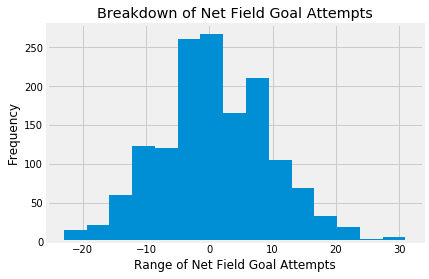

In [417]:
#Here is a histogram for Net_FGA

suns.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

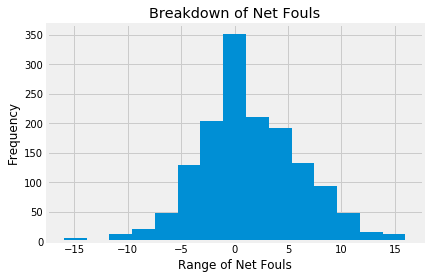

In [418]:
#Here is a histogram for Net_Fouls

suns.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Memphis Grizzlies

In [419]:
grizzlies = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'MEM']

In [420]:
grizzlies.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
60,MEM,0,-1,-1,2,-5,-2,12,-0.1298,13,...,0,0,0,0,0,0,0,0,0,0
61,MEM,0,-1,-1,2,-5,-2,12,-0.1298,13,...,0,0,0,0,0,0,0,0,0,0
62,MEM,0,-1,-1,2,-5,-2,12,-0.1298,13,...,0,0,0,0,0,0,0,0,0,0
144,MEM,0,1,-5,4,-1,-2,-3,0.0045,4,...,0,0,0,0,0,0,0,0,0,0
145,MEM,0,1,-5,4,-1,-2,-3,0.0045,4,...,0,0,0,0,0,0,0,0,0,0


In [421]:
grizzlies.shape

(1476, 130)

In [422]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Grizzlies

grizzlies.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.655160
Net_AST                          0.490580
Net_3P%                          0.439639
Net_TRB                          0.339682
Net_FTA                          0.275016
Net_BLK                          0.243635
teamLoc_Home                     0.179581
Net_STL                          0.174998
opptAbbr_SAC                     0.112281
opptAbbr_PHI                     0.091636
Net_Day_Off                      0.077448
opptAbbr_NY                      0.065178
opptAbbr_DET                     0.065178
opptAbbr_PHO                     0.059564
opptAbbr_LAL                     0.059564
Off_Name_KarlLane                0.056320
opptAbbr_MIN                     0.051708
Off_Name_RonGarretson            0.043580
Off_Name_KevinFehr               0.041259
Off_Name_BrianForte              0.041203
Off_Name_J.T.Orr                 0.040907
opptAbbr_POR                     0.039816
Off_Name_LeroyRichardson         0

In [423]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the grizzlies subset to only those variables with .1 or greater correlation

grizzlies = grizzlies.drop(['Off_Name_VladimirVoyard-Tadal','Off_Name_MattMyers','Off_Name_ScottBolnick', 
                                  'Off_Name_PhenizeeRansom', 'opptAbbr_OKC', 'Net_2PA', 'Off_Name_BillSpooner',
                                  'Off_Name_BrendaPantoja', 'opptAbbr_MEM', 'Net_3PA', 'opptAbbr_TOR', 'opptAbbr_LAC',
                                  'Off_Name_BrandonAdair','Off_Name_JacynGoble','opptAbbr_GS', 'Off_Name_LeonWood', 
                                  'Off_Name_TonyBrown','Off_Name_TylerFord','Off_Name_TonyBrothers', 'opptAbbr_CLE', 
                                  'opptAbbr_WAS', 'Off_Name_JonathanSterling', 'Off_Name_JasonGoldenberg', 'opptAbbr_DAL',
                                  'Off_Name_DickBavetta', 'Off_Name_EliRoe', 'Off_Name_KenMauer', 'Off_Name_TomWashington',
                                  'Off_Name_ScottFoster', 'Off_Name_BennettSalvatore', 'opptAbbr_ORL', 'opptAbbr_POR', 
                                  'Off_Name_LeroyRichardson', 'Off_Name_J.T.Orr', 'Off_Name_BrianForte', 'opptAbbr_PHI',
                                  'Off_Name_KevinFehr', 'Off_Name_RonGarretson', 'opptAbbr_MIN', 'Off_Name_KarlLane',
                                  'opptAbbr_LAL','opptAbbr_PHO','opptAbbr_DET', 'opptAbbr_NY', 'Net_Day_Off'
                                  ], axis = 'columns')

In [424]:
grizzlies.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.655160
Net_AST                        0.490580
Net_3P%                        0.439639
Net_TRB                        0.339682
Net_FTA                        0.275016
Net_BLK                        0.243635
teamLoc_Home                   0.179581
Net_STL                        0.174998
opptAbbr_SAC                   0.112281
Off_Name_KevinScott            0.031483
Off_Name_MaratKogut            0.027405
Off_Name_JoshTiven             0.027148
Off_Name_BillKennedy           0.025115
Off_Name_NickBuchert           0.025115
Off_Name_JustinVan Duyne       0.024813
Off_Name_SirAllenConner        0.023805
Off_Name_RandyRichardson       0.023805
Off_Name_JoeCrawford           0.023505
Off_Name_BrettNansel           0.023505
Off_Name_MontyMcCutchen        0.022184
Off_Name_EddieRush             0.021488
opptAbbr_DEN                   0.020069
Off_Name_JasonPhillips         0.016164
Off_Name_EdMalloy              0.013123


In [425]:
grizzlies = grizzlies.drop(['Off_Name_KippKissinger','Off_Name_TreMaddox','Off_Name_GediminasPetraitis', 'Off_Name_RayAcosta',
                                  'Off_Name_DavidGuthrie', 'Off_Name_HaywoodeWorkman', 'Off_Name_SeanWright', 
                                  'Off_Name_LaurenHoltkamp', 'Off_Name_C.J.Washington', 'Off_Name_KaneFitzgerald',
                                  'Off_Name_BenTaylor', 'Off_Name_JohnGoble', 'Off_Name_BennieAdams', 'opptAbbr_BOS',
                                  'Off_Name_CourtneyKirkland', 'Off_Name_MattBoland', 'Off_Name_OlandisPoole',
                                  'Off_Name_StevenAnderson', 'opptAbbr_IND', 'opptAbbr_MIA', 'opptAbbr_CHI',
                                  'opptAbbr_CHA','Off_Name_MikeCallahan','Off_Name_SeanCorbin', 'Off_Name_MarcDavis', 
                                  'Off_Name_RodneyMott','opptAbbr_UTA','opptAbbr_MIL', 'opptAbbr_BKN', 'Off_Name_BrettNansel',
                                  'Off_Name_DerrickCollins', 'Off_Name_ScottWall', 'Off_Name_EdMalloy', 'opptAbbr_DEN',
                                  'Off_Name_JasonPhillips', 'Off_Name_EddieRush', 'Off_Name_MontyMcCutchen', 
                                  'Off_Name_RandyRichardson', 'Off_Name_SirAllenConner', 'Off_Name_JustinVan Duyne', 
                                  'Off_Name_NickBuchert', 'Off_Name_BillKennedy', 'Off_Name_JoshTiven',
                                  'Off_Name_MaratKogut', 'Off_Name_KevinScott'], axis = 'columns')

In [426]:
grizzlies.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.655160
Net_AST                     0.490580
Net_3P%                     0.439639
Net_TRB                     0.339682
Net_FTA                     0.275016
Net_BLK                     0.243635
teamLoc_Home                0.179581
Net_STL                     0.174998
opptAbbr_SAC                0.112281
Off_Name_JoeCrawford        0.023505
Off_Name_EricDalen          0.011249
Off_Name_DerekRichardson    0.007850
Off_Name_ScottTwardoski     0.007459
Off_Name_DavidJones         0.007021
Off_Name_VioletPalmer       0.006472
Off_Name_DerrickStafford    0.006444
Off_Name_MichaelSmith       0.005316
Off_Name_JamesWilliams      0.005316
Off_Name_MitchellErvin      0.005249
Off_Name_DanCrawford        0.005180
Off_Name_PatFraher          0.004029
Off_Name_DedricTaylor       0.003739
Off_Name_MarkLindsay        0.002971
Off_Name_KevinCutler        0.001244
Off_Name_ZachZarba          0.000183
Off_Name_EricLewis         -0.000787
o

In [427]:
grizzlies = grizzlies.drop(['Off_Name_GaryZielinski','Off_Name_JamesCapers','Off_Name_MarkAyotte', 'Off_Name_CurtisBlair',
                                  'Off_Name_JoeDeRosa', 'Off_Name_BrentBarnaky', 'opptAbbr_NO', 'opptAbbr_HOU',
                                  'Off_Name_EricLewis', 'Off_Name_ZachZarba', 'Off_Name_KevinCutler', 'Off_Name_MarkLindsay',
                                  'Off_Name_DedricTaylor', 'Off_Name_PatFraher', 'Off_Name_DanCrawford', 
                                  'Off_Name_MitchellErvin', 'Off_Name_JamesWilliams', 'Off_Name_MichaelSmith',
                                  'Off_Name_DerrickStafford', 'Off_Name_VioletPalmer', 'Off_Name_DavidJones',
                                  'Off_Name_ScottTwardoski', 'Off_Name_DerekRichardson', 'Off_Name_EricDalen', 
                                  'Off_Name_JoeCrawford'], axis = 'columns')

In [428]:
grizzlies.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.655160
Net_AST         0.490580
Net_3P%         0.439639
Net_TRB         0.339682
Net_FTA         0.275016
Net_BLK         0.243635
teamLoc_Home    0.179581
Net_STL         0.174998
opptAbbr_SAC    0.112281
opptAbbr_SA    -0.134017
Net_FGA        -0.156047
Net_TO         -0.197749
Net_Fouls      -0.214475
Name: teamRslt_Win, dtype: float64

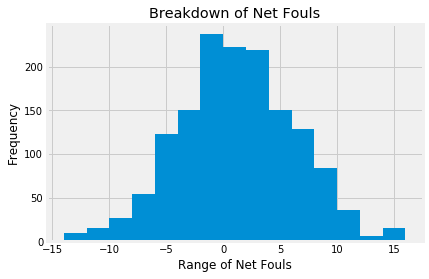

In [429]:
#Here is a histogram for Net_Fouls

grizzlies.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

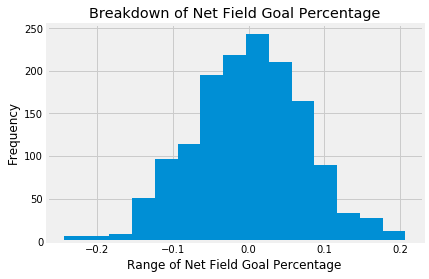

In [430]:
#Here is a histogram for Net_FG%

grizzlies.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

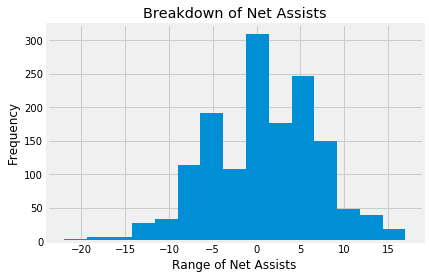

In [431]:
#Here is a histogram for Net_AST

grizzlies.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

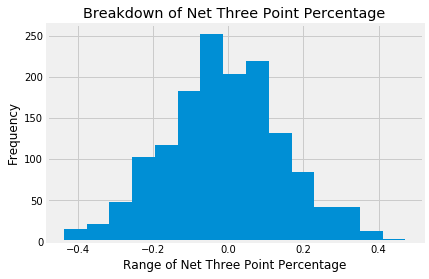

In [432]:
#Here is a histogram for Net_3P%

grizzlies.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

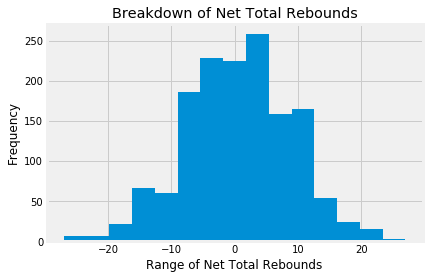

In [433]:
#Here is a histogram for Net_TRB

grizzlies.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

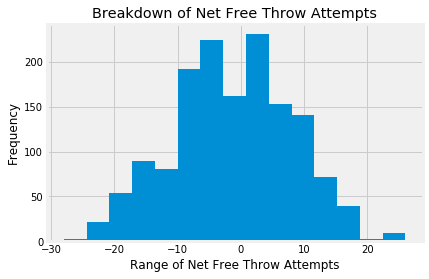

In [434]:
#Here is a histogram for Net_FTA

grizzlies.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

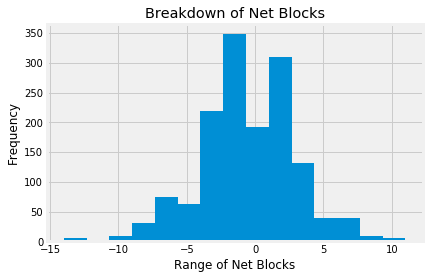

In [435]:
#Here is a histogram for Net_BLK

grizzlies.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

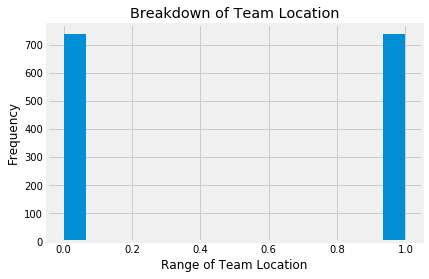

In [436]:
#Here is a histogram for teamLoc_Home

grizzlies.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

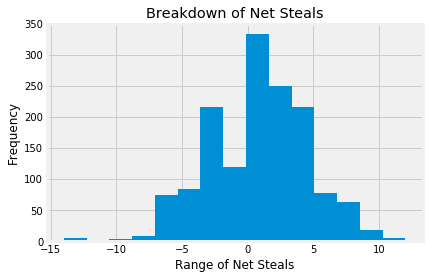

In [437]:
#Here is a histogram for Net_STL

grizzlies.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

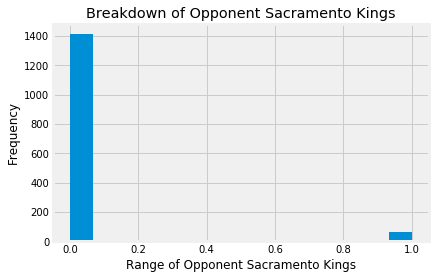

In [438]:
#Here is a histogram for opptAbbr_SAC

grizzlies.loc[:,"opptAbbr_SAC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Sacramento Kings")
plt.title("Breakdown of Opponent Sacramento Kings");

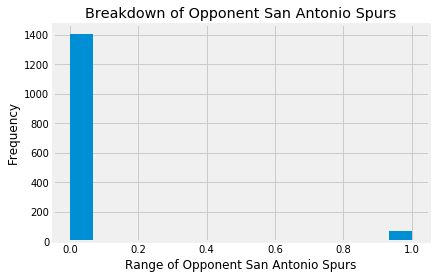

In [439]:
#Here is a histogram for opptAbbr_SA

grizzlies.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

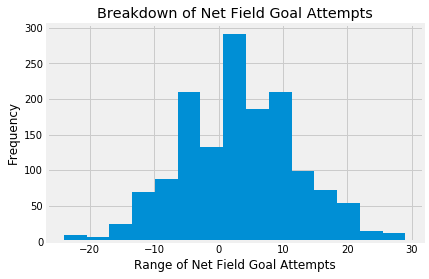

In [440]:
#Here is a histogram for Net_FGA

grizzlies.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

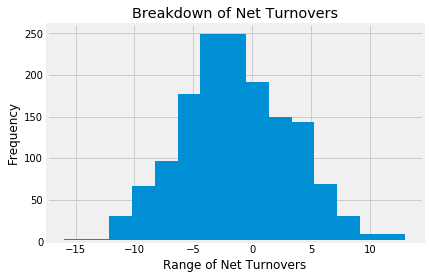

In [441]:
#Here is a histogram for Net_TO

grizzlies.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Sacramento Kings

In [442]:
kings = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'SAC']

In [443]:
kings.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
36,SAC,0,-7,3,2,-5,10,5,-0.0129,-3,...,0,0,0,0,0,0,0,0,0,0
37,SAC,0,-7,3,2,-5,10,5,-0.0129,-3,...,0,0,0,0,0,0,0,1,0,0
38,SAC,0,-7,3,2,-5,10,5,-0.0129,-3,...,0,0,0,0,0,0,0,0,0,0
120,SAC,2,0,1,3,-6,17,2,-0.0082,3,...,0,0,0,0,0,0,0,0,0,0
121,SAC,2,0,1,3,-6,17,2,-0.0082,3,...,0,0,1,0,0,0,0,0,0,0


In [444]:
kings.shape

(1476, 130)

In [445]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Kings

kings.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.641865
Net_AST                      0.424618
Net_3P%                      0.353167
Net_TRB                      0.306718
Net_BLK                      0.209784
Net_FTA                      0.208528
Net_STL                      0.180898
teamLoc_Home                 0.131286
opptAbbr_PHO                 0.105495
opptAbbr_ORL                 0.101113
opptAbbr_LAL                 0.085835
opptAbbr_NY                  0.073658
opptAbbr_TOR                 0.073658
Off_Name_DickBavetta         0.063042
Off_Name_JacynGoble          0.049140
Off_Name_MaratKogut          0.048731
Off_Name_EricLewis           0.048731
opptAbbr_CLE                 0.046204
opptAbbr_PHI                 0.046204
opptAbbr_DEN                 0.042731
Off_Name_GaryZielinski       0.042464
Off_Name_HaywoodeWorkman     0.042464
Off_Name_MichaelSmith        0.039631
Off_Name_ScottTwardoski      0.036283
Off_Name_KevinScott          0.032086
opptAbbr_MIN

In [446]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the kings subset to only those variables with .1 or greater correlation

kings = kings.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'Off_Name_RayAcosta',
                                  'Off_Name_RandyRichardson', 'Off_Name_JonathanSterling', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','opptAbbr_SAC','opptAbbr_LAC', 'opptAbbr_MEM', 'Off_Name_KarlLane',
                                  'Net_3PA', 'opptAbbr_OKC', 'opptAbbr_HOU', 'Net_2PA', 'opptAbbr_GS', 'opptAbbr_POR',
                                  'Off_Name_BenTaylor','opptAbbr_MIA','Off_Name_LeonWood', 'Off_Name_JasonGoldenberg', 
                                  'Off_Name_KaneFitzgerald', 'Off_Name_MarkLindsay', 'Off_Name_JasonPhillips',
                                  'Off_Name_PhenizeeRansom', 'Off_Name_JamesWilliams', 'Net_Day_Off', 'Off_Name_JoshTiven',
                                  'opptAbbr_MIN', 'Off_Name_KevinScott', 'Off_Name_ScottTwardoski', 'Off_Name_MichaelSmith',
                                  'Off_Name_HaywoodeWorkman', 'Off_Name_GaryZielinski', 'opptAbbr_DEN', 'opptAbbr_PHI',
                                  'opptAbbr_CLE','Off_Name_EricLewis','Off_Name_MaratKogut', 'Off_Name_JacynGoble',
                                  'Off_Name_DickBavetta', 'opptAbbr_TOR', 'opptAbbr_NY', 'opptAbbr_LAL'
                                  ], axis = 'columns')

In [447]:
kings.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.641865
Net_AST                          0.424618
Net_3P%                          0.353167
Net_TRB                          0.306718
Net_BLK                          0.209784
Net_FTA                          0.208528
Net_STL                          0.180898
teamLoc_Home                     0.131286
opptAbbr_PHO                     0.105495
opptAbbr_ORL                     0.101113
Off_Name_PatFraher               0.024088
opptAbbr_NO                      0.022240
Off_Name_JustinVan Duyne         0.022038
Off_Name_JoeCrawford             0.021572
opptAbbr_WAS                     0.018749
opptAbbr_CHA                     0.018749
opptAbbr_CHI                     0.018749
opptAbbr_BKN                     0.018749
Off_Name_BillKennedy             0.018189
Off_Name_DanCrawford             0.017226
Off_Name_TonyBrothers            0.017226
Off_Name_EliRoe                  0.016958
Off_Name_JoeDeRosa               0

In [448]:
kings = kings.drop(['Off_Name_SeanCorbin','Off_Name_JohnGoble','Off_Name_StevenAnderson', 'Off_Name_CourtneyKirkland',
                                  'Off_Name_TonyBrown', 'Off_Name_EdMalloy', 'Off_Name_DerrickCollins',
                                  'Off_Name_TomWashington','Off_Name_KenMauer','Off_Name_RonGarretson', 'Off_Name_J.T.Orr', 
                                  'Off_Name_EddieRush', 'Off_Name_BrendaPantoja', 'Off_Name_VladimirVoyard-Tadal',
                                  'Off_Name_MikeCallahan', 'Off_Name_ZachZarba', 'Off_Name_CurtisBlair', 'Off_Name_TreMaddox', 
                                  'Off_Name_ScottWall', 'Off_Name_LeroyRichardson', 'opptAbbr_UTA', 'Off_Name_LaurenHoltkamp',
                                  'Off_Name_DavidJones','opptAbbr_BOS','opptAbbr_IND', 'opptAbbr_DET', 
                                  'Off_Name_BillSpooner', 'Off_Name_JamesCapers', 'Off_Name_BennieAdams',
                                  'Off_Name_BrettNansel', 'Off_Name_KevinFehr', 'Off_Name_OlandisPoole', 'Off_Name_JoeDeRosa',
                                  'Off_Name_EliRoe', 'Off_Name_TonyBrothers', 'Off_Name_DanCrawford', 'Off_Name_BillKennedy',
                                  'opptAbbr_BKN', 'opptAbbr_CHI', 'opptAbbr_CHA', 'opptAbbr_WAS', 'Off_Name_JoeCrawford',
                                  'Off_Name_JustinVan Duyne','opptAbbr_NO','Off_Name_PatFraher'
                                  ], axis = 'columns')

In [449]:
kings.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.641865
Net_AST                        0.424618
Net_3P%                        0.353167
Net_TRB                        0.306718
Net_BLK                        0.209784
Net_FTA                        0.208528
Net_STL                        0.180898
teamLoc_Home                   0.131286
opptAbbr_PHO                   0.105495
opptAbbr_ORL                   0.101113
Off_Name_RodneyMott            0.011007
Off_Name_MitchellErvin         0.010736
Off_Name_DedricTaylor          0.008497
Off_Name_MarcDavis             0.006936
Off_Name_GediminasPetraitis    0.006926
Off_Name_NickBuchert           0.006745
Off_Name_MarkAyotte            0.005768
Off_Name_VioletPalmer          0.004883
Off_Name_BrianForte            0.004084
Off_Name_DerekRichardson       0.004084
Off_Name_EricDalen             0.003325
Off_Name_SeanWright            0.003019
Off_Name_TylerFord             0.002345
Off_Name_MattBoland            0.002074


In [450]:
kings = kings.drop(['opptAbbr_MIL','Off_Name_BrentBarnaky','Off_Name_BennettSalvatore', 'Off_Name_DavidGuthrie',
                                  'Off_Name_ScottFoster', 'Off_Name_C.J.Washington', 'Off_Name_MontyMcCutchen',
                                  'Off_Name_DerrickStafford','opptAbbr_DAL','Off_Name_KevinCutler', 'Off_Name_MattBoland', 
                                  'Off_Name_TylerFord', 'Off_Name_SeanWright', 'Off_Name_EricDalen', 'Off_Name_DerekRichardson',
                                  'Off_Name_BrianForte', 'Off_Name_VioletPalmer', 'Off_Name_MarkAyotte', 
                                  'Off_Name_NickBuchert', 'Off_Name_GediminasPetraitis', 'Off_Name_MarcDavis',
                                  'Off_Name_DedricTaylor', 'Off_Name_MitchellErvin', 'Off_Name_RodneyMott' 
                                  ], axis = 'columns')

In [451]:
kings.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.641865
Net_AST         0.424618
Net_3P%         0.353167
Net_TRB         0.306718
Net_BLK         0.209784
Net_FTA         0.208528
Net_STL         0.180898
teamLoc_Home    0.131286
opptAbbr_PHO    0.105495
opptAbbr_ORL    0.101113
Net_FGA        -0.115033
opptAbbr_SA    -0.141688
Net_TO         -0.153149
Net_Fouls      -0.242296
Name: teamRslt_Win, dtype: float64

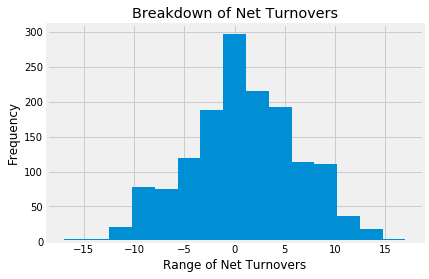

In [452]:
#Here is a histogram for Net_TO

kings.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

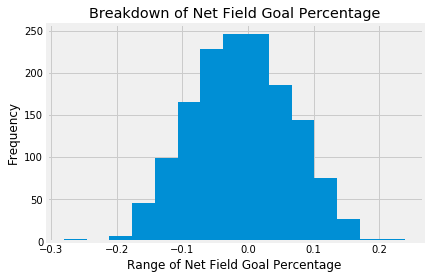

In [453]:
#Here is a histogram for Net_FG%

kings.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

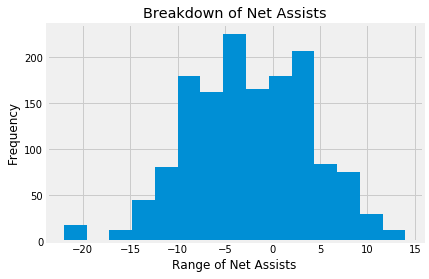

In [454]:
#Here is a histogram for Net_AST

kings.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

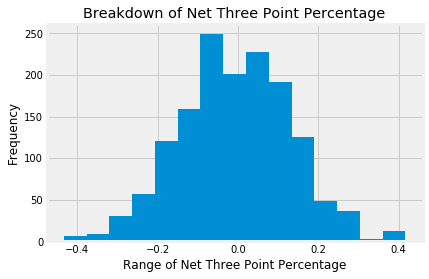

In [455]:
#Here is a histogram for Net_3P%

kings.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

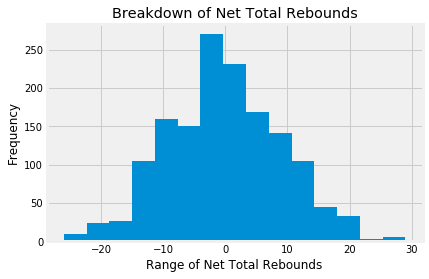

In [456]:
#Here is a histogram for Net_TRB

kings.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

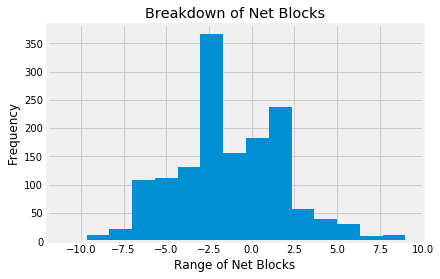

In [457]:
#Here is a histogram for Net_BLK

kings.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

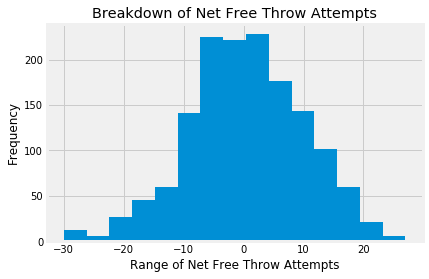

In [458]:
#Here is a histogram for Net_FTA

kings.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

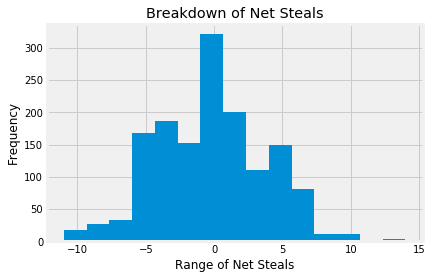

In [459]:
#Here is a histogram for Net_STL

kings.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

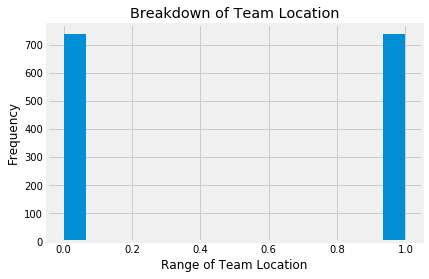

In [460]:
#Here is a histogram for teamLoc_Home

kings.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

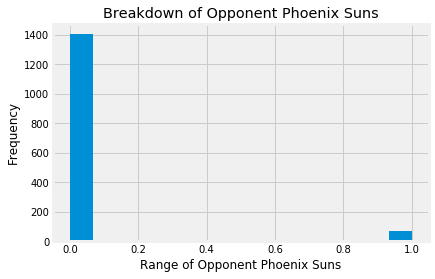

In [461]:
#Here is a histogram for opptAbbr_PHO

kings.loc[:,"opptAbbr_PHO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Phoenix Suns")
plt.title("Breakdown of Opponent Phoenix Suns");

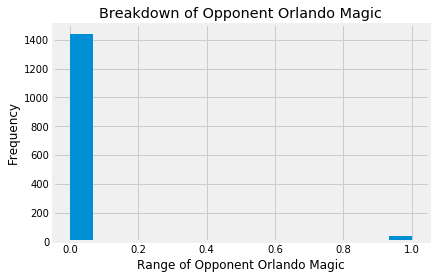

In [462]:
#Here is a histogram for opptAbbr_ORL

kings.loc[:,"opptAbbr_ORL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Orlando Magic")
plt.title("Breakdown of Opponent Orlando Magic");

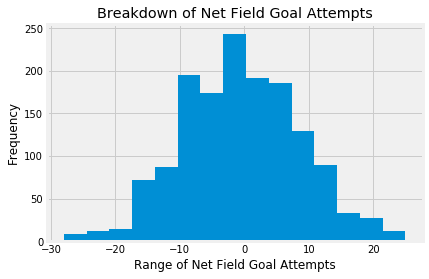

In [463]:
#Here is a histogram for Net_FGA

kings.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

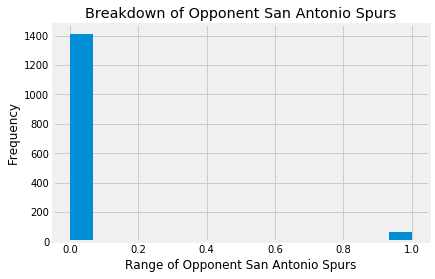

In [464]:
#Here is a histogram for opptAbbr_SA

kings.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

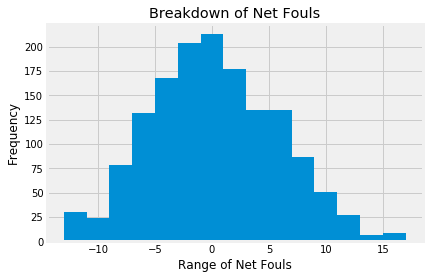

In [465]:
#Here is a histogram for Net_Fouls

kings.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Atlanta Hawks

In [466]:
hawks = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'ATL']

In [467]:
hawks.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
105,ATL,-2,1,-8,4,2,8,-5,0.0484,3,...,0,0,0,0,0,0,0,0,0,0
106,ATL,-2,1,-8,4,2,8,-5,0.0484,3,...,0,0,0,0,0,0,0,0,0,0
107,ATL,-2,1,-8,4,2,8,-5,0.0484,3,...,0,0,0,0,0,0,0,0,0,0
228,ATL,0,-7,-10,8,-8,-1,12,0.0292,9,...,0,0,0,0,0,0,0,0,0,0
229,ATL,0,-7,-10,8,-8,-1,12,0.0292,9,...,0,0,0,0,0,0,0,0,0,0


In [468]:
hawks.shape

(1476, 130)

In [469]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Hawks

hawks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.652947
Net_AST                          0.512912
Net_3P%                          0.430148
Net_TRB                          0.328715
Net_STL                          0.278027
Net_BLK                          0.219020
teamLoc_Home                     0.174972
Net_FTA                          0.132755
opptAbbr_DAL                     0.098438
opptAbbr_PHI                     0.081134
opptAbbr_UTA                     0.072059
opptAbbr_SAC                     0.072059
opptAbbr_MIL                     0.061004
Net_Day_Off                      0.052356
opptAbbr_ORL                     0.046534
opptAbbr_DEN                     0.045680
Off_Name_DerrickCollins          0.043489
Off_Name_KaneFitzgerald          0.039437
Off_Name_LeroyRichardson         0.039269
Off_Name_KevinCutler             0.037143
Off_Name_JasonPhillips           0.034709
Off_Name_JasonGoldenberg         0.032406
Off_Name_DanCrawford             0

In [470]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the hawks subset to only those variables with .1 or greater correlation

hawks = hawks.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_RandyRichardson', 'opptAbbr_TOR',
                                  'Off_Name_JonathanSterling', 'Off_Name_BrandonAdair', 'Off_Name_KippKissinger',
                                  'Off_Name_RayAcosta','opptAbbr_OKC','Off_Name_RodneyMott', 'opptAbbr_MIA', 
                                  'Off_Name_DickBavetta', 'Off_Name_JoshTiven', 'Off_Name_J.T.Orr', 'Off_Name_ScottFoster',
                                  'Off_Name_EricLewis','Off_Name_NickBuchert','opptAbbr_MIN', 'opptAbbr_LAL', 'opptAbbr_LAC',
                                  'Off_Name_OlandisPoole', 'Off_Name_MichaelSmith', 'Off_Name_RonGarretson', 
                                  'Off_Name_VladimirVoyard-Tadal', 'Off_Name_LeonWood', 'Off_Name_BrentBarnaky',
                                  'Off_Name_TonyBrothers', 'Off_Name_ScottBolnick', 'Off_Name_EdMalloy', 'Net_2PA',
                                  'Off_Name_TonyBrown','Off_Name_PatFraher','Off_Name_DanCrawford', 
                                  'Off_Name_JasonGoldenberg', 'Off_Name_JasonPhillips', 'Off_Name_KevinCutler', 
                                  'Off_Name_LeroyRichardson', 'Off_Name_KaneFitzgerald', 'Off_Name_DerrickCollins',
                                  'opptAbbr_DEN', 'opptAbbr_ORL', 'Net_Day_Off', 'opptAbbr_MIL', 'opptAbbr_SAC',
                                  'opptAbbr_UTA', 'opptAbbr_PHI', 'opptAbbr_DAL'], axis = 'columns')

In [471]:
hawks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.652947
Net_AST                        0.512912
Net_3P%                        0.430148
Net_TRB                        0.328715
Net_STL                        0.278027
Net_BLK                        0.219020
teamLoc_Home                   0.174972
Net_FTA                        0.132755
Off_Name_JohnGoble             0.023604
Off_Name_DerrickStafford       0.023255
Off_Name_MikeCallahan          0.020403
Off_Name_JoeCrawford           0.019777
Off_Name_TylerFord             0.019777
opptAbbr_HOU                   0.019301
opptAbbr_POR                   0.019301
opptAbbr_MEM                   0.019301
Off_Name_MontyMcCutchen        0.018218
Off_Name_LaurenHoltkamp        0.017556
Off_Name_KarlLane              0.016881
Off_Name_MarkLindsay           0.015694
Off_Name_ScottWall             0.015694
Off_Name_BennettSalvatore      0.015170
Net_FGA                        0.014079
Off_Name_MitchellErvin         0.012838


In [472]:
hawks = hawks.drop(['Off_Name_KenMauer','Off_Name_JacynGoble','Off_Name_BillKennedy', 'opptAbbr_CHI', 'Net_3PA',
                                  'Off_Name_BillSpooner', 'Off_Name_SeanWright', 'Off_Name_MarcDavis',
                                  'Off_Name_GaryZielinski','Off_Name_JustinVan Duyne','Off_Name_JamesCapers', 
                                  'Off_Name_ScottTwardoski', 'Off_Name_BrianForte', 'Off_Name_SeanCorbin',
                                  'opptAbbr_WAS', 'opptAbbr_BOS', 'opptAbbr_IND', 'opptAbbr_PHO', 'opptAbbr_NO',
                                  'Off_Name_HaywoodeWorkman','Off_Name_DavidGuthrie','Off_Name_MattBoland', 
                                  'Off_Name_GediminasPetraitis', 'Off_Name_VioletPalmer', 'Off_Name_PhenizeeRansom',
                                  'Off_Name_BrendaPantoja', 'opptAbbr_BKN', 'opptAbbr_CLE', 'Off_Name_TomWashington',
                                  'Off_Name_BennieAdams', 'Off_Name_ZachZarba', 'Off_Name_MitchellErvin', 'Net_FGA',
                                  'Off_Name_BennettSalvatore', 'Off_Name_ScottWall', 'Off_Name_MarkLindsay', 
                                  'Off_Name_KarlLane', 'Off_Name_LaurenHoltkamp', 'Off_Name_MontyMcCutchen',
                                  'opptAbbr_MEM','opptAbbr_POR','opptAbbr_HOU', 'Off_Name_TylerFord', 'Off_Name_JohnGoble',
                                  'Off_Name_JoeCrawford', 'Off_Name_MikeCallahan', 'Off_Name_DerrickStafford'
                                  ], axis = 'columns')

In [473]:
hawks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.652947
Net_AST                      0.512912
Net_3P%                      0.430148
Net_TRB                      0.328715
Net_STL                      0.278027
Net_BLK                      0.219020
teamLoc_Home                 0.174972
Net_FTA                      0.132755
opptAbbr_DET                 0.010004
Off_Name_MarkAyotte          0.009892
Off_Name_CourtneyKirkland    0.009892
Off_Name_DavidJones          0.009613
Off_Name_DedricTaylor        0.009613
Off_Name_BrettNansel         0.009062
Off_Name_JoeDeRosa           0.009062
Off_Name_KevinFehr           0.009062
opptAbbr_CHA                 0.008754
Off_Name_JamesWilliams       0.008323
Off_Name_EricDalen           0.007385
Off_Name_MaratKogut          0.006486
Off_Name_C.J.Washington      0.005206
Off_Name_EliRoe              0.002226
Off_Name_BenTaylor           0.002226
Off_Name_StevenAnderson      0.001524
Off_Name_DerekRichardson     0.000905
Off_Name_Cur

In [474]:
hawks = hawks.drop(['Off_Name_EddieRush','Off_Name_KevinScott','Off_Name_TreMaddox', 'opptAbbr_NY', 'Off_Name_CurtisBlair',
                                  'Off_Name_DerekRichardson', 'Off_Name_StevenAnderson', 'Off_Name_BenTaylor',
                                  'Off_Name_EliRoe','Off_Name_C.J.Washington','Off_Name_MaratKogut', 'Off_Name_EricDalen',
                                  'Off_Name_JamesWilliams', 'opptAbbr_CHA', 'Off_Name_KevinFehr', 'Off_Name_JoeDeRosa',
                                  'Off_Name_BrettNansel', 'Off_Name_DedricTaylor', 'Off_Name_DavidJones', 
                                  'Off_Name_CourtneyKirkland', 'Off_Name_MarkAyotte', 'opptAbbr_DET'
                                  ], axis = 'columns')

In [475]:
hawks.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.652947
Net_AST         0.512912
Net_3P%         0.430148
Net_TRB         0.328715
Net_STL         0.278027
Net_BLK         0.219020
teamLoc_Home    0.174972
Net_FTA         0.132755
opptAbbr_SA    -0.112592
opptAbbr_GS    -0.138971
Net_Fouls      -0.161468
Net_TO         -0.250155
Name: teamRslt_Win, dtype: float64

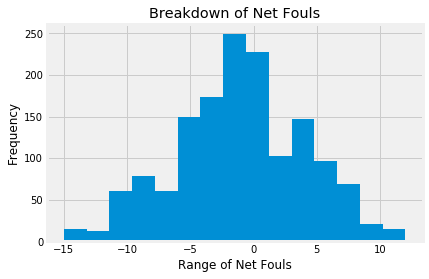

In [476]:
#Here is a histogram for Net_Fouls

hawks.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

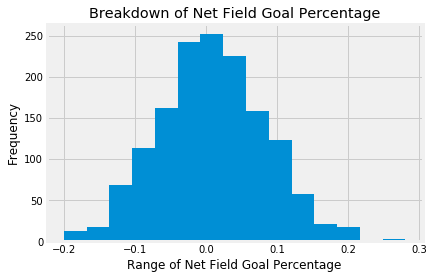

In [477]:
#Here is a histogram for Net_FG%

hawks.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

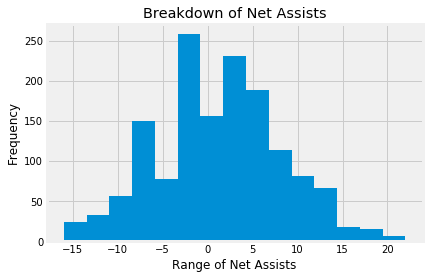

In [478]:
#Here is a histogram for Net_AST

hawks.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

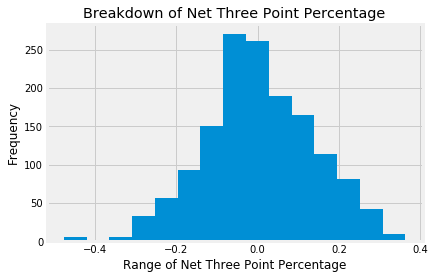

In [479]:
#Here is a histogram for Net_3P% 

hawks.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

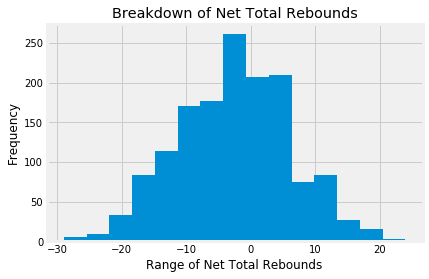

In [480]:
#Here is a histogram for Net_TRB

hawks.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

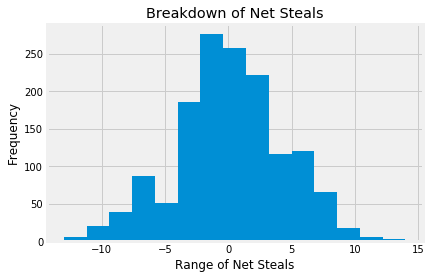

In [481]:
#Here is a histogram for Net_STL

hawks.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

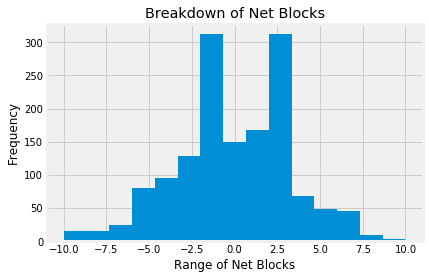

In [482]:
#Here is a histogram for Net_BLK

hawks.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

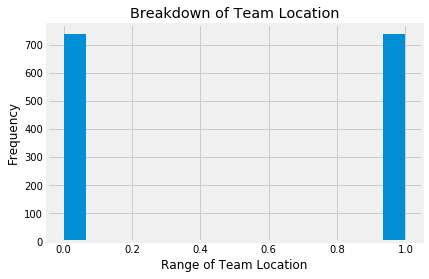

In [483]:
#Here is a histogram for teamLoc_Home

hawks.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

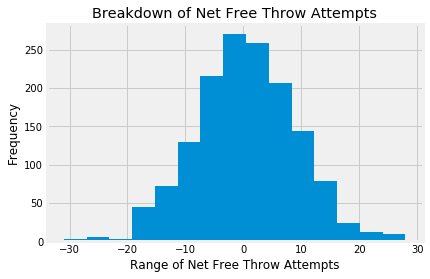

In [484]:
#Here is a histogram for Net_FTA

hawks.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

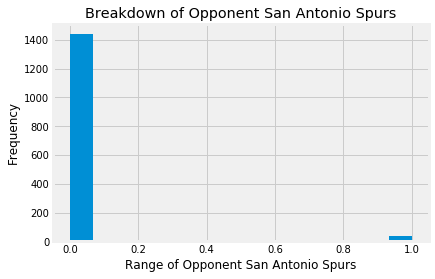

In [485]:
#Here is a histogram for opptAbbr_SA

hawks.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

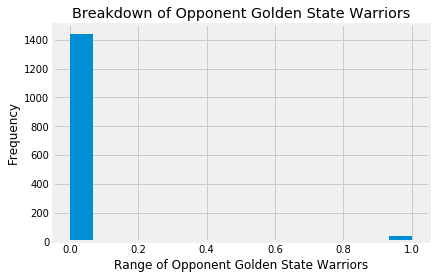

In [486]:
#Here is a histogram for opptAbbr_GS

hawks.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

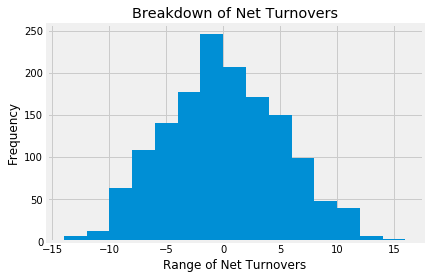

In [487]:
#Here is a histogram for Net_TO

hawks.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Toronto Raptors

In [488]:
raptors = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'TOR']

In [489]:
raptors.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
27,TOR,0,-4,-9,9,-2,2,13,-0.1118,7,...,0,0,0,0,0,0,0,0,0,0
28,TOR,0,-4,-9,9,-2,2,13,-0.1118,7,...,0,0,0,0,0,0,0,0,0,0
29,TOR,0,-4,-9,9,-2,2,13,-0.1118,7,...,0,0,0,0,0,0,0,0,0,0
168,TOR,3,3,-3,2,0,12,1,-0.0056,-2,...,0,0,0,0,0,0,0,0,0,0
169,TOR,3,3,-3,2,0,12,1,-0.0056,-2,...,0,0,0,0,0,0,0,0,0,0


In [490]:
raptors.shape

(1476, 130)

In [491]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Raptors

raptors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.576357
Net_3P%                          0.429021
Net_AST                          0.384038
Net_TRB                          0.338216
Net_FTA                          0.267255
Net_BLK                          0.194928
teamLoc_Home                     0.162057
opptAbbr_ORL                     0.109426
Net_STL                          0.106006
opptAbbr_PHI                     0.087042
opptAbbr_NO                      0.074243
opptAbbr_WAS                     0.054676
opptAbbr_DET                     0.054676
Off_Name_CurtisBlair             0.048592
opptAbbr_BKN                     0.048461
opptAbbr_NY                      0.048461
opptAbbr_MIL                     0.047756
Off_Name_SeanCorbin              0.047586
opptAbbr_LAL                     0.047305
opptAbbr_MIN                     0.047305
Off_Name_JasonGoldenberg         0.042239
Off_Name_BenTaylor               0.039552
Off_Name_MikeCallahan            0

In [492]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the raptors subset to only those variables with .1 or greater correlation

raptors = raptors.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'Off_Name_VladimirVoyard-Tadal',
                                  'Off_Name_BrendaPantoja', 'Off_Name_EddieRush', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','Off_Name_PhenizeeRansom','opptAbbr_TOR', 'opptAbbr_OKC', 
                                  'Net_FGA', 'opptAbbr_CHI', 'opptAbbr_CLE', 'opptAbbr_MIA', 'Net_2PA', 'Off_Name_JohnGoble',
                                  'opptAbbr_SAC','Off_Name_MaratKogut','Off_Name_CourtneyKirkland', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_DerrickCollins', 'Off_Name_MitchellErvin', 'Off_Name_TomWashington',
                                  'opptAbbr_HOU', 'opptAbbr_PHO', 'opptAbbr_LAC', 'Off_Name_JacynGoble', 'opptAbbr_IND',
                                  'Off_Name_KevinFehr', 'Off_Name_BillKennedy', 'Off_Name_TylerFord', 'Net_Day_Off',
                                  'Off_Name_MikeCallahan', 'Off_Name_BenTaylor', 'Off_Name_JasonGoldenberg', 'opptAbbr_MIL',
                                  'opptAbbr_MIN', 'opptAbbr_LAL', 'Off_Name_SeanCorbin', 'opptAbbr_NY', 'opptAbbr_BKN',
                                  'Off_Name_CurtisBlair','opptAbbr_DET','opptAbbr_WAS', 'opptAbbr_NO', 'opptAbbr_PHI'
                                  ], axis = 'columns')

In [493]:
raptors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.576357
Net_3P%                        0.429021
Net_AST                        0.384038
Net_TRB                        0.338216
Net_FTA                        0.267255
Net_BLK                        0.194928
teamLoc_Home                   0.162057
opptAbbr_ORL                   0.109426
Net_STL                        0.106006
Off_Name_DedricTaylor          0.027171
Off_Name_JamesCapers           0.023662
Off_Name_MichaelSmith          0.022087
Off_Name_RandyRichardson       0.021098
opptAbbr_DAL                   0.020367
opptAbbr_MEM                   0.020367
opptAbbr_UTA                   0.020367
Off_Name_LeonWood              0.019655
Off_Name_NickBuchert           0.019655
Off_Name_EricDalen             0.018806
Off_Name_JoshTiven             0.018554
Off_Name_BrianForte            0.018554
Off_Name_StevenAnderson        0.017084
Off_Name_PatFraher             0.016561
Off_Name_MarkAyotte            0.016561


In [494]:
raptors = raptors.drop(['Off_Name_ScottTwardoski','Off_Name_JonathanSterling','Off_Name_GaryZielinski', 
                                  'Off_Name_DerrickStafford', 'Off_Name_BennettSalvatore', 'opptAbbr_CHA',
                                  'Off_Name_RayAcosta', 'Off_Name_EdMalloy', 'Off_Name_BillSpooner',
                                  'Off_Name_GediminasPetraitis','Off_Name_BrentBarnaky','Off_Name_KenMauer', 
                                  'Off_Name_KarlLane', 'Off_Name_LeroyRichardson', 'Off_Name_SeanWright',
                                  'Off_Name_JasonPhillips', 'Off_Name_DavidGuthrie', 'Off_Name_ZachZarba', 'opptAbbr_BOS', 
                                  'Off_Name_EricLewis', 'Off_Name_ScottFoster', 'Off_Name_OlandisPoole',
                                  'Off_Name_JoeCrawford','Off_Name_MattBoland','opptAbbr_POR', 'opptAbbr_DEN',
                                  'Off_Name_KaneFitzgerald', 'Off_Name_MarkLindsay', 'Off_Name_DanCrawford',
                                  'Off_Name_BennieAdams', 'Off_Name_C.J.Washington', 'Off_Name_MarkAyotte', 
                                  'Off_Name_PatFraher', 'Off_Name_StevenAnderson', 'Off_Name_BrianForte',
                                  'Off_Name_JoshTiven', 'Off_Name_EricDalen', 'Off_Name_NickBuchert', 'Off_Name_LeonWood',
                                  'opptAbbr_UTA', 'opptAbbr_MEM', 'opptAbbr_DAL', 'Off_Name_RandyRichardson',
                                  'Off_Name_MichaelSmith', 'Off_Name_JamesCapers', 'Off_Name_DedricTaylor' 
                                  ], axis = 'columns')

In [495]:
raptors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.576357
Net_3P%                     0.429021
Net_AST                     0.384038
Net_TRB                     0.338216
Net_FTA                     0.267255
Net_BLK                     0.194928
teamLoc_Home                0.162057
opptAbbr_ORL                0.109426
Net_STL                     0.106006
Off_Name_LaurenHoltkamp     0.009578
Off_Name_BrettNansel        0.008230
Off_Name_TonyBrown          0.007248
Off_Name_TreMaddox          0.006518
Off_Name_JoeDeRosa          0.005813
Off_Name_MarcDavis          0.005609
Off_Name_KevinScott         0.005609
Off_Name_TonyBrothers       0.004929
Off_Name_KevinCutler        0.004567
Off_Name_EliRoe             0.004567
Off_Name_RodneyMott         0.002260
Off_Name_J.T.Orr            0.001693
Off_Name_RonGarretson       0.001296
Off_Name_DerekRichardson    0.000991
Off_Name_JamesWilliams      0.000991
Off_Name_VioletPalmer      -0.000618
Off_Name_JustinVan Duyne   -0.000618
N

In [496]:
raptors = raptors.drop(['Off_Name_DavidJones','Off_Name_MontyMcCutchen','Off_Name_DickBavetta', 'Off_Name_JamesWilliams',
                                  'Off_Name_ScottWall', 'Net_3PA', 'Off_Name_JustinVan Duyne', 'Off_Name_VioletPalmer',
                                  'Off_Name_DerekRichardson', 'Off_Name_RonGarretson', 'Off_Name_J.T.Orr',
                                  'Off_Name_RodneyMott','Off_Name_EliRoe','Off_Name_KevinCutler', 'Off_Name_JoeDeRosa',
                                  'Off_Name_TonyBrothers', 'Off_Name_KevinScott', 'Off_Name_MarcDavis',
                                  'Off_Name_TreMaddox', 'Off_Name_TonyBrown', 'Off_Name_BrettNansel', 
                                  'Off_Name_LaurenHoltkamp'], axis = 'columns')

In [497]:
raptors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.576357
Net_3P%         0.429021
Net_AST         0.384038
Net_TRB         0.338216
Net_FTA         0.267255
Net_BLK         0.194928
teamLoc_Home    0.162057
opptAbbr_ORL    0.109426
Net_STL         0.106006
opptAbbr_SA    -0.114320
Net_TO         -0.154468
opptAbbr_GS    -0.168196
Net_Fouls      -0.248197
Name: teamRslt_Win, dtype: float64

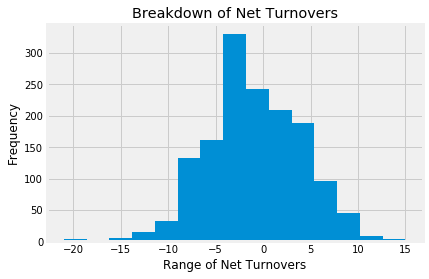

In [498]:
#Here is a histogram for Net_TO

raptors.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

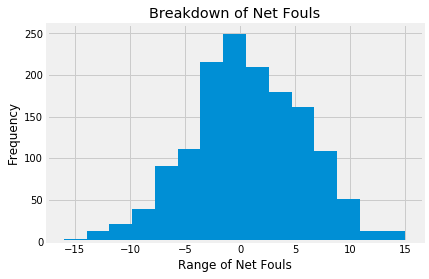

In [499]:
#Here is a histogram for Net_Fouls

raptors.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

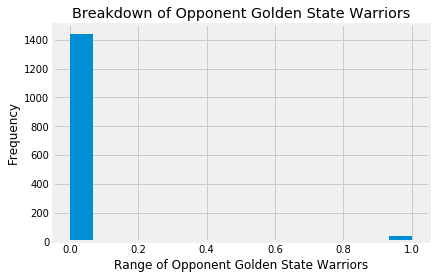

In [500]:
#Here is a histogram for opptAbbr_GS 

raptors.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

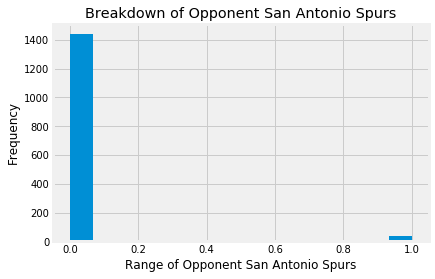

In [501]:
#Here is a histogram for opptAbbr_SA

raptors.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

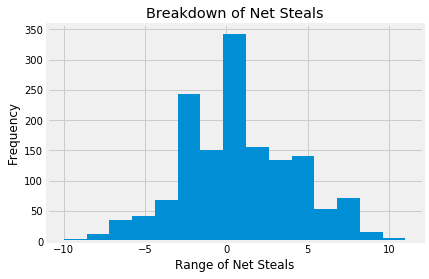

In [502]:
#Here is a histogram for Net_STL

raptors.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

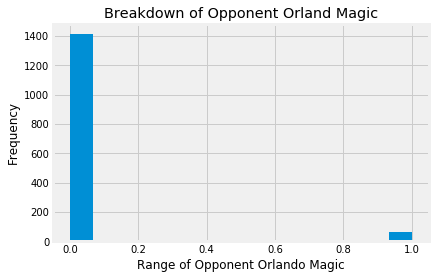

In [503]:
#Here is a histogram for opptAbbr_ORL

raptors.loc[:,"opptAbbr_ORL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Orlando Magic")
plt.title("Breakdown of Opponent Orland Magic");

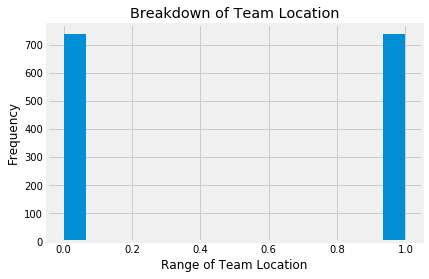

In [504]:
#Here is a histogram for teamLoc_Home

raptors.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

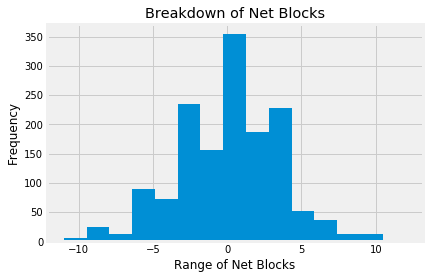

In [505]:
#Here is a histogram for Net_BLK

raptors.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

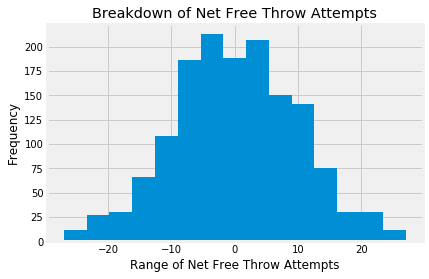

In [506]:
#Here is a histogram for Net_FTA

raptors.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

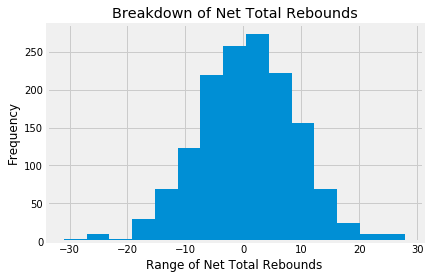

In [507]:
#Here is a histogram for Net_TRB

raptors.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

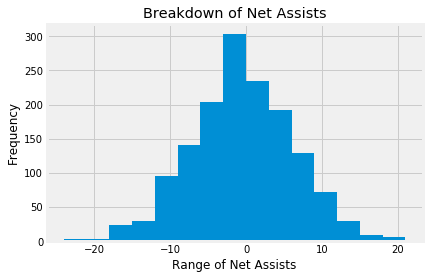

In [508]:
#Here is a histogram for Net_AST

raptors.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

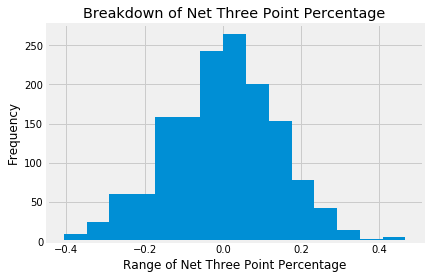

In [509]:
#Here is a histogram for Net_3P%

raptors.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

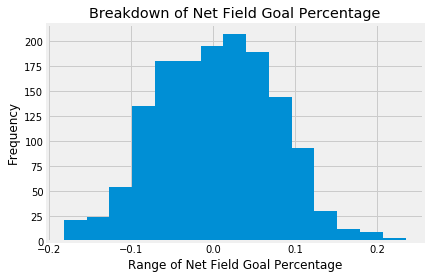

In [510]:
#Here is a histogram for Net_FG%

raptors.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

#### Orlando Magic

In [511]:
magic = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'ORL']

In [512]:
magic.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
81,ORL,-2,2,-1,3,3,7,2,0.1074,13,...,0,0,0,0,0,0,0,0,0,0
82,ORL,-2,2,-1,3,3,7,2,0.1074,13,...,0,0,0,0,0,0,0,0,0,0
83,ORL,-2,2,-1,3,3,7,2,0.1074,13,...,0,0,0,0,0,0,0,0,0,0
219,ORL,0,7,-5,4,-9,0,1,0.0605,9,...,0,0,0,0,0,0,0,0,0,0
220,ORL,0,7,-5,4,-9,0,1,0.0605,9,...,0,0,0,0,0,0,0,0,0,0


In [513]:
magic.shape

(1476, 130)

In [514]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Magic

magic.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.621936
Net_AST                      0.455267
Net_3P%                      0.392245
Net_TRB                      0.369154
Net_STL                      0.218827
teamLoc_Home                 0.187498
Net_FTA                      0.171899
Net_BLK                      0.169056
opptAbbr_PHI                 0.135872
opptAbbr_MIN                 0.089627
opptAbbr_NO                  0.089627
opptAbbr_DET                 0.071158
Off_Name_MitchellErvin       0.067489
opptAbbr_LAL                 0.061360
opptAbbr_PHO                 0.061360
Off_Name_SeanWright          0.056571
Off_Name_ScottWall           0.051773
Off_Name_CourtneyKirkland    0.046568
opptAbbr_NY                  0.041766
opptAbbr_BKN                 0.041766
opptAbbr_MIL                 0.041766
Off_Name_BrendaPantoja       0.038034
Off_Name_MarkAyotte          0.035741
Off_Name_BennettSalvatore    0.035135
Off_Name_BenTaylor           0.034044
Off_Name_Pat

In [515]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the magic subset to only those variables with .1 or greater correlation

magic = magic.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'opptAbbr_ORL', 'opptAbbr_HOU',
                                  'opptAbbr_CLE', 'Net_FGA', 'Off_Name_KippKissinger', 'opptAbbr_TOR', 'opptAbbr_WAS',
                                  'Off_Name_BrandonAdair','opptAbbr_IND','Off_Name_ScottTwardoski', 'opptAbbr_GS',
                                  'Off_Name_JoshTiven', 'opptAbbr_SA', 'opptAbbr_LAC', 'Off_Name_CurtisBlair',
                                  'Off_Name_DavidJones','Net_2PA','Off_Name_RayAcosta', 'opptAbbr_CHA', 
                                  'Off_Name_LeonWood', 'Off_Name_TonyBrothers', 'Net_3PA', 'Off_Name_KaneFitzgerald',
                                  'Off_Name_NickBuchert', 'Off_Name_EdMalloy', 'Off_Name_DerrickCollins', 
                                  'Off_Name_DanCrawford', 'opptAbbr_POR', 'Off_Name_PatFraher', 'Off_Name_BenTaylor',
                                  'Off_Name_BennettSalvatore', 'Off_Name_MarkAyotte', 'Off_Name_BrendaPantoja', 
                                  'opptAbbr_MIL', 'opptAbbr_BKN', 'opptAbbr_NY', 'Off_Name_CourtneyKirkland',
                                  'Off_Name_ScottWall','Off_Name_SeanWright','opptAbbr_PHO', 'opptAbbr_LAL',
                                  'Off_Name_MitchellErvin', 'opptAbbr_DET', 'opptAbbr_NO', 'opptAbbr_MIN'
                                  ], axis = 'columns')

In [516]:
magic.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.621936
Net_AST                          0.455267
Net_3P%                          0.392245
Net_TRB                          0.369154
Net_STL                          0.218827
teamLoc_Home                     0.187498
Net_FTA                          0.171899
Net_BLK                          0.169056
opptAbbr_PHI                     0.135872
Off_Name_StevenAnderson          0.028804
Off_Name_DedricTaylor            0.026909
Off_Name_MontyMcCutchen          0.024975
Off_Name_DavidGuthrie            0.024975
Off_Name_MichaelSmith            0.022002
Off_Name_KenMauer                0.019487
Off_Name_BrentBarnaky            0.018819
Off_Name_TonyBrown               0.018285
Off_Name_DerekRichardson         0.017585
Off_Name_JustinVan Duyne         0.017585
Off_Name_BrettNansel             0.016211
Off_Name_MattBoland              0.015940
Off_Name_BrianForte              0.015013
Net_Day_Off                      0

In [517]:
magic = magic.drop(['Off_Name_DerrickStafford','Off_Name_LaurenHoltkamp','Off_Name_BillSpooner', 'Off_Name_MikeCallahan', 
                                  'Off_Name_PhenizeeRansom', 'opptAbbr_DAL', 'opptAbbr_OKC', 'opptAbbr_UTA', 'opptAbbr_DEN',
                                  'Off_Name_ScottFoster', 'opptAbbr_BOS', 'opptAbbr_CHI', 'Off_Name_JonathanSterling', 
                                  'Off_Name_JasonPhillips','Off_Name_JamesWilliams', 'Off_Name_KevinScott',
                                  'Off_Name_VladimirVoyard-Tadal','Off_Name_RandyRichardson','Off_Name_JamesCapers', 
                                  'Off_Name_JohnGoble', 'Off_Name_BennieAdams', 'Off_Name_EricDalen', 'Off_Name_RodneyMott',
                                  'opptAbbr_MIA', 'Off_Name_ZachZarba', 'Off_Name_EliRoe', 'Off_Name_MaratKogut',
                                  'Off_Name_KevinFehr','Off_Name_JasonGoldenberg','Off_Name_JacynGoble',
                                  'Off_Name_TomWashington', 'Off_Name_TreMaddox', 'Off_Name_KevinCutler',
                                  'Off_Name_GediminasPetraitis', 'Net_Day_Off', 'Off_Name_BrianForte', 
                                  'Off_Name_MattBoland', 'Off_Name_BrettNansel', 'Off_Name_JustinVan Duyne',
                                  'Off_Name_DerekRichardson', 'Off_Name_TonyBrown', 'Off_Name_BrentBarnaky', 
                                  'Off_Name_KenMauer', 'Off_Name_MichaelSmith', 'Off_Name_DavidGuthrie', 
                                  'Off_Name_MontyMcCutchen', 'Off_Name_DedricTaylor', 'Off_Name_StevenAnderson'
                                  ], axis = 'columns')

In [518]:
magic.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.621936
Net_AST                     0.455267
Net_3P%                     0.392245
Net_TRB                     0.369154
Net_STL                     0.218827
teamLoc_Home                0.187498
Net_FTA                     0.171899
Net_BLK                     0.169056
opptAbbr_PHI                0.135872
Off_Name_OlandisPoole       0.008852
Off_Name_TylerFord          0.007985
Off_Name_KarlLane           0.007752
Off_Name_BillKennedy        0.007752
opptAbbr_SAC                0.004826
opptAbbr_MEM                0.004826
Off_Name_GaryZielinski      0.003667
Off_Name_VioletPalmer       0.002763
Off_Name_DickBavetta        0.002763
Off_Name_C.J.Washington     0.002763
Off_Name_EddieRush          0.001377
Off_Name_JoeDeRosa          0.001377
Off_Name_SeanCorbin         0.000693
Off_Name_RonGarretson      -0.000244
Off_Name_HaywoodeWorkman   -0.003279
Off_Name_J.T.Orr           -0.005787
Off_Name_LeroyRichardson   -0.006680
O

In [519]:
magic = magic.drop(['Off_Name_MarkLindsay','Off_Name_MarcDavis','Off_Name_JoeCrawford', 'Off_Name_EricLewis', 
                                  'Off_Name_LeroyRichardson', 'Off_Name_J.T.Orr', 'Off_Name_HaywoodeWorkman', 
                                  'Off_Name_RonGarretson', 'Off_Name_SeanCorbin', 'Off_Name_JoeDeRosa',
                                  'Off_Name_EddieRush', 'Off_Name_C.J.Washington', 'Off_Name_DickBavetta', 
                                  'Off_Name_VioletPalmer', 'Off_Name_GaryZielinski', 'opptAbbr_MEM', 'opptAbbr_SAC',
                                  'Off_Name_BillKennedy','Off_Name_KarlLane', 'Off_Name_TylerFord', 'Off_Name_OlandisPoole',
                                  ], axis = 'columns')

In [520]:
magic.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.621936
Net_AST         0.455267
Net_3P%         0.392245
Net_TRB         0.369154
Net_STL         0.218827
teamLoc_Home    0.187498
Net_FTA         0.171899
Net_BLK         0.169056
opptAbbr_PHI    0.135872
Net_TO         -0.140048
Net_Fouls      -0.201168
Name: teamRslt_Win, dtype: float64

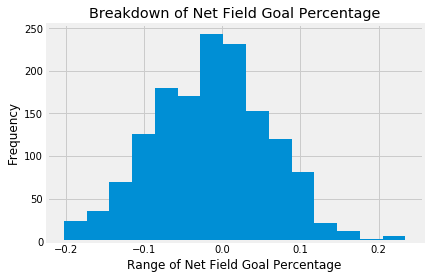

In [521]:
#Here is a histogram for Net_FG%

magic.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

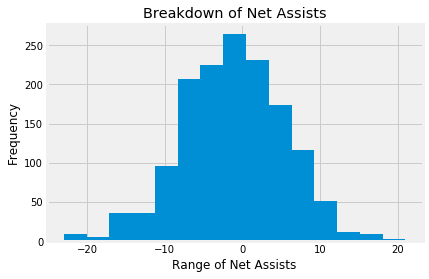

In [522]:
#Here is a histogram for Net_AST

magic.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

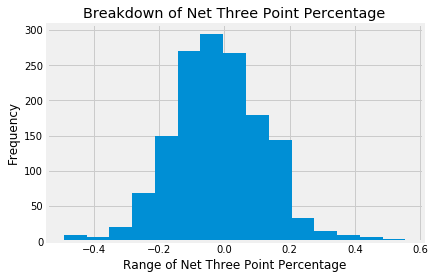

In [523]:
#Here is a histogram for Net_3P%

magic.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

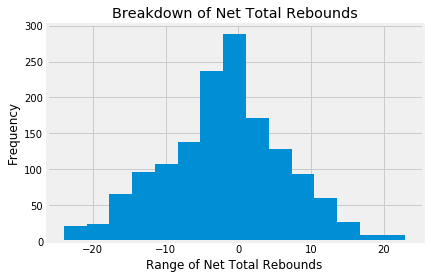

In [524]:
#Here is a histogram for Net_TRB

magic.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

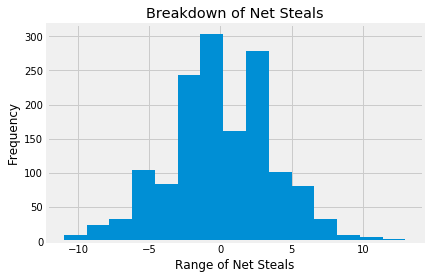

In [525]:
#Here is a histogram for Net_STL

magic.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

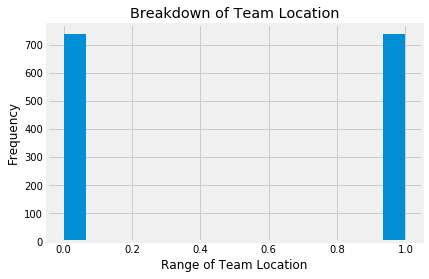

In [526]:
#Here is a histogram for teamLoc_Home

magic.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

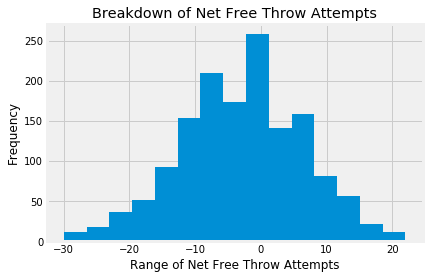

In [527]:
#Here is a histogram for Net_FTA

magic.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

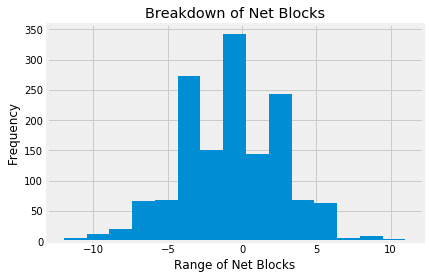

In [528]:
#Here is a histogram for Net_BLK

magic.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

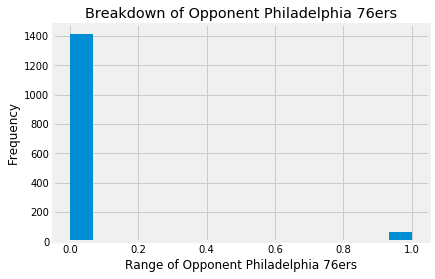

In [529]:
#Here is a histogram for opptAbbr_PHI

magic.loc[:,"opptAbbr_PHI"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Philadelphia 76ers")
plt.title("Breakdown of Opponent Philadelphia 76ers");

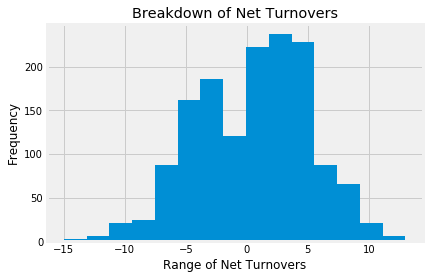

In [530]:
#Here is a histogram for Net_TO

magic.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

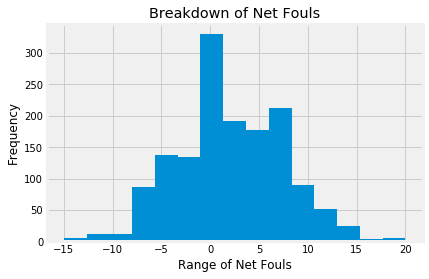

In [531]:
#Here is a histogram for Net_Fouls

magic.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Houston Rockets

In [532]:
rockets = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'HOU']

In [533]:
rockets.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
30,HOU,0,7,4,0,-1,9,0,0.0507,-11,...,0,0,0,0,0,0,0,0,0,0
31,HOU,0,7,4,0,-1,9,0,0.0507,-11,...,0,0,0,0,0,0,0,0,0,0
32,HOU,0,7,4,0,-1,9,0,0.0507,-11,...,0,0,0,0,0,0,0,0,0,0
102,HOU,2,-1,8,-4,-2,-8,5,-0.0484,-3,...,0,0,0,0,0,0,0,0,0,0
103,HOU,2,-1,8,-4,-2,-8,5,-0.0484,-3,...,0,0,0,0,0,0,0,0,0,0


In [534]:
rockets.shape

(1476, 130)

In [535]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Rockets

rockets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.633817
Net_3P%                          0.433969
Net_AST                          0.424405
Net_TRB                          0.357448
Net_BLK                          0.229991
Net_FTA                          0.219574
teamLoc_Home                     0.176755
Net_STL                          0.170383
opptAbbr_MIN                     0.101364
opptAbbr_NY                      0.090326
opptAbbr_CHA                     0.090326
Net_3PA                          0.063086
opptAbbr_CLE                     0.062826
opptAbbr_ORL                     0.062826
opptAbbr_PHO                     0.058600
Off_Name_TylerFord               0.055112
opptAbbr_SAC                     0.052422
Off_Name_GediminasPetraitis      0.048132
Off_Name_DedricTaylor            0.047311
Off_Name_CourtneyKirkland        0.040120
opptAbbr_LAL                     0.038075
Net_Day_Off                      0.037378
opptAbbr_MIL                     0

In [536]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the rockets subset to only those variables with .1 or greater correlation

rockets = rockets.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_VladimirVoyard-Tadal', 'opptAbbr_HOU',
                                  'Off_Name_BrendaPantoja', 'Off_Name_JoeDeRosa', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','Off_Name_PhenizeeRansom','Off_Name_RandyRichardson', 
                                  'opptAbbr_SA', 'opptAbbr_MEM', 'Off_Name_BennieAdams', 'Off_Name_JohnGoble',
                                  'opptAbbr_OKC','opptAbbr_TOR','opptAbbr_IND', 'opptAbbr_MIA', 'Off_Name_EliRoe',
                                  'Off_Name_KevinCutler', 'Off_Name_DanCrawford', 'Off_Name_MarkAyotte', 
                                  'Off_Name_HaywoodeWorkman', 'Off_Name_ScottFoster', 'Off_Name_KaneFitzgerald',
                                  'Off_Name_MaratKogut', 'opptAbbr_BKN', 'opptAbbr_PHI', 'opptAbbr_MIL',
                                  'Net_Day_Off','opptAbbr_LAL','Off_Name_CourtneyKirkland', 'Off_Name_DedricTaylor',
                                  'Off_Name_GediminasPetraitis', 'opptAbbr_SAC', 'Off_Name_TylerFord', 'opptAbbr_PHO',
                                  'opptAbbr_ORL', 'opptAbbr_CLE', 'Net_3PA', 'opptAbbr_CHA', 'opptAbbr_NY'
                                  ], axis = 'columns')

In [537]:
rockets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.633817
Net_3P%                      0.433969
Net_AST                      0.424405
Net_TRB                      0.357448
Net_BLK                      0.229991
Net_FTA                      0.219574
teamLoc_Home                 0.176755
Net_STL                      0.170383
opptAbbr_MIN                 0.101364
opptAbbr_NO                  0.030901
Off_Name_CurtisBlair         0.028724
Off_Name_NickBuchert         0.027860
Off_Name_BrentBarnaky        0.025255
Off_Name_BillKennedy         0.023987
Off_Name_BenTaylor           0.022377
Off_Name_KevinScott          0.021107
Off_Name_ScottBolnick        0.019403
opptAbbr_UTA                 0.017549
Off_Name_LeonWood            0.017543
Off_Name_SeanWright          0.017308
Off_Name_BrettNansel         0.016493
Off_Name_RodneyMott          0.013954
opptAbbr_BOS                 0.013909
Off_Name_DerrickCollins      0.013840
Off_Name_SeanCorbin          0.013793
opptAbbr_DAL

In [538]:
rockets = rockets.drop(['Off_Name_RayAcosta','Off_Name_JonathanSterling','Off_Name_StevenAnderson', 'Off_Name_DickBavetta',
                                  'Off_Name_MarkLindsay', 'Off_Name_TomWashington', 'Off_Name_KarlLane',
                                  'Off_Name_PatFraher','Off_Name_LeroyRichardson','Off_Name_BillSpooner', 
                                  'opptAbbr_DET', 'Off_Name_MitchellErvin', 'Off_Name_JustinVan Duyne', 
                                  'Off_Name_JoshTiven', 'Off_Name_JasonPhillips', 'Off_Name_DavidGuthrie',
                                  'Off_Name_DavidJones','Off_Name_JoeCrawford','Off_Name_MattBoland', 'Off_Name_EddieRush', 
                                  'opptAbbr_DEN', 'Off_Name_RonGarretson', 'Off_Name_LaurenHoltkamp',
                                  'Off_Name_MarcDavis', 'Off_Name_TreMaddox', 'Off_Name_JamesWilliams', 
                                  'Off_Name_VioletPalmer', 'opptAbbr_DAL', 'Off_Name_SeanCorbin', 'Off_Name_DerrickCollins',
                                  'opptAbbr_BOS', 'Off_Name_RodneyMott', 'Off_Name_BrettNansel', 'Off_Name_SeanWright',
                                  'Off_Name_LeonWood','opptAbbr_UTA','Off_Name_ScottBolnick', 'Off_Name_KevinScott',
                                  'Off_Name_BenTaylor', 'Off_Name_BillKennedy', 'Off_Name_BrentBarnaky', 'Off_Name_NickBuchert',
                                  'Off_Name_CurtisBlair', 'opptAbbr_NO'
                                  ], axis = 'columns')

In [539]:
rockets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.633817
Net_3P%                      0.433969
Net_AST                      0.424405
Net_TRB                      0.357448
Net_BLK                      0.229991
Net_FTA                      0.219574
teamLoc_Home                 0.176755
Net_STL                      0.170383
opptAbbr_MIN                 0.101364
Off_Name_EricDalen           0.009833
opptAbbr_CHI                 0.007825
opptAbbr_WAS                 0.007825
Off_Name_JamesCapers         0.006756
Off_Name_KenMauer            0.006756
Off_Name_EricLewis           0.006756
Off_Name_TonyBrothers        0.006363
Off_Name_BennettSalvatore    0.003162
Off_Name_MikeCallahan        0.003044
Off_Name_BrianForte          0.003044
Off_Name_MichaelSmith        0.003044
Off_Name_GaryZielinski       0.002421
Off_Name_KevinFehr           0.002234
Off_Name_JacynGoble          0.002234
Off_Name_JasonGoldenberg     0.002234
Off_Name_ScottWall           0.001724
Off_Name_Der

In [540]:
rockets = rockets.drop(['Off_Name_MontyMcCutchen','Off_Name_ScottTwardoski','Off_Name_C.J.Washington', 'Off_Name_EdMalloy',
                                  'Off_Name_J.T.Orr', 'opptAbbr_POR', 'Off_Name_OlandisPoole', 'Off_Name_TonyBrown',
                                  'Off_Name_DerrickStafford','Off_Name_ZachZarba','Off_Name_DerekRichardson', 
                                  'Off_Name_ScottWall', 'Off_Name_JasonGoldenberg', 'Off_Name_JacynGoble', 
                                  'Off_Name_KevinFehr', 'Off_Name_GaryZielinski', 'Off_Name_MichaelSmith',
                                  'Off_Name_BrianForte','Off_Name_MikeCallahan','Off_Name_BennettSalvatore',
                                  'Off_Name_TonyBrothers', 'Off_Name_EricLewis', 'Off_Name_KenMauer',
                                  'Off_Name_JamesCapers', 'opptAbbr_WAS', 'opptAbbr_CHI', 'Off_Name_EricDalen'
                                  ], axis = 'columns')

In [541]:
rockets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.633817
Net_3P%         0.433969
Net_AST         0.424405
Net_TRB         0.357448
Net_BLK         0.229991
Net_FTA         0.219574
teamLoc_Home    0.176755
Net_STL         0.170383
opptAbbr_MIN    0.101364
opptAbbr_LAC   -0.105602
opptAbbr_GS    -0.115465
Net_FGA        -0.121446
Net_TO         -0.123536
Net_2PA        -0.158912
Net_Fouls      -0.205258
Name: teamRslt_Win, dtype: float64

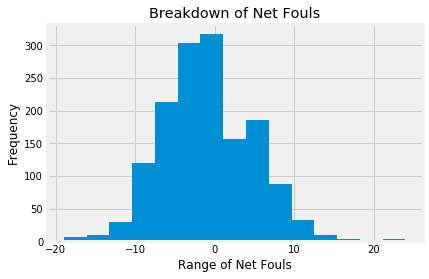

In [542]:
#Here is a histogram for Net_Fouls

rockets.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

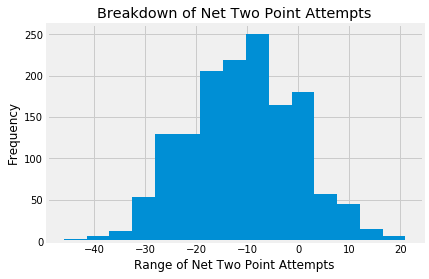

In [543]:
#Here is a histogram for Net_2PA

rockets.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

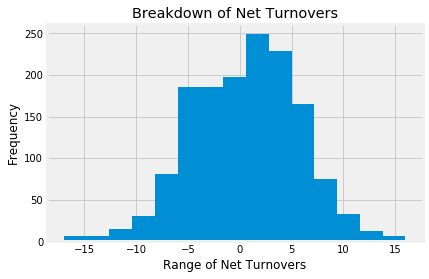

In [544]:
#Here is a histogram for Net_TO

rockets.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

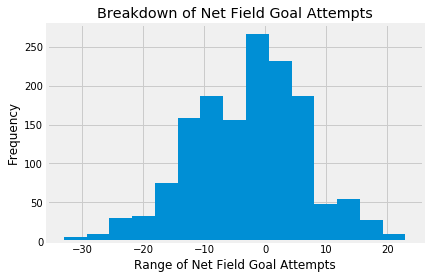

In [545]:
#Here is a histogram for Net_FGA

rockets.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

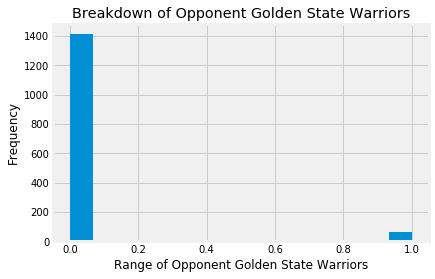

In [546]:
#Here is a histogram for opptAbbr_GS

rockets.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

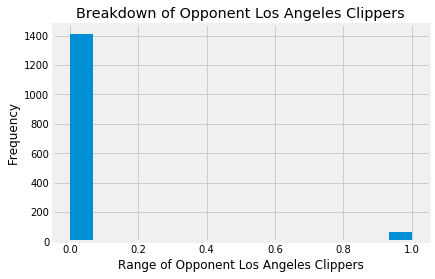

In [547]:
#Here is a histogram for opptAbbr_LAC

rockets.loc[:,"opptAbbr_LAC"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Los Angeles Clippers")
plt.title("Breakdown of Opponent Los Angeles Clippers");

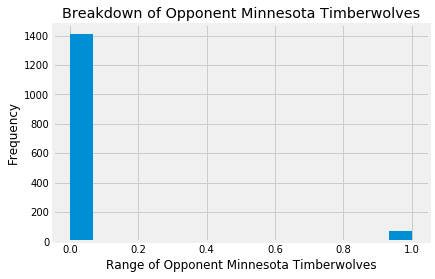

In [548]:
#Here is a histogram for opptAbbr_MIN

rockets.loc[:,"opptAbbr_MIN"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Minnesota Timberwolves")
plt.title("Breakdown of Opponent Minnesota Timberwolves");

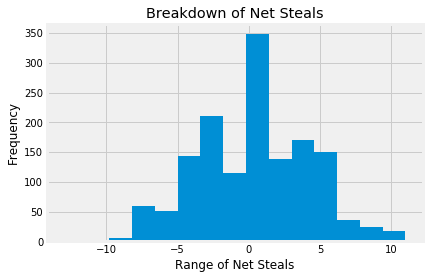

In [549]:
#Here is a histogram for Net_STL

rockets.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

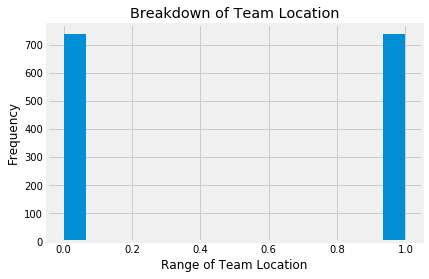

In [550]:
#Here is a histogram for teamLoc_Home

rockets.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

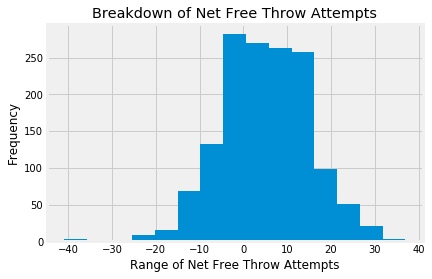

In [551]:
#Here is a histogram for Net_FTA 

rockets.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

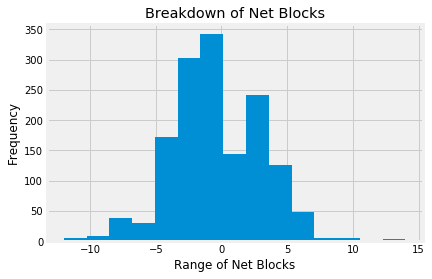

In [552]:
#Here is a histogram for Net_BLK

rockets.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

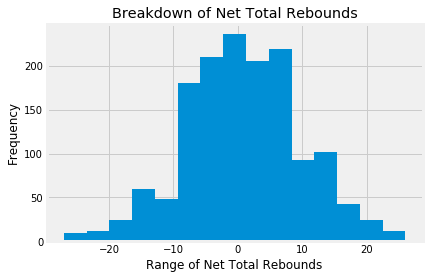

In [553]:
#Here is a histogram for Net_TRB

rockets.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

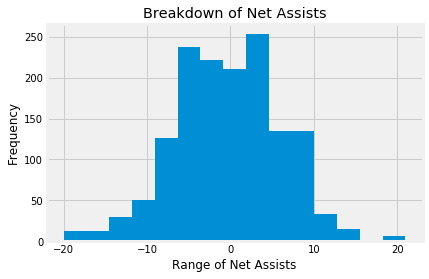

In [554]:
#Here is a histogram for Net_AST 

rockets.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

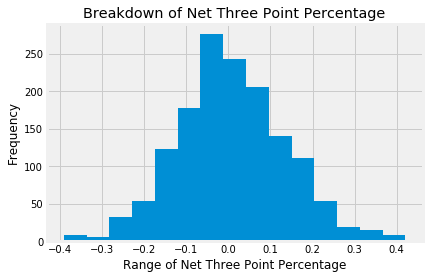

In [555]:
#Here is a histogram for Net_3P% 

rockets.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

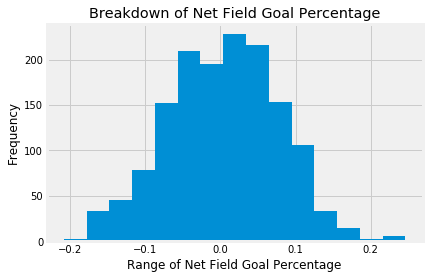

In [556]:
#Here is a histogram for Net_FG% 

rockets.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

#### Golden State Warriors

In [557]:
warriors = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'GS']

In [558]:
warriors.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
54,GS,0,3,0,-1,-9,-3,6,-0.0163,10,...,0,0,0,0,0,0,0,0,0,0
55,GS,0,3,0,-1,-9,-3,6,-0.0163,10,...,0,0,0,0,0,0,0,0,0,0
56,GS,0,3,0,-1,-9,-3,6,-0.0163,10,...,0,0,0,0,0,0,0,0,0,0
147,GS,0,-1,5,-4,1,2,3,-0.0045,-4,...,0,0,0,0,0,0,0,0,0,0
148,GS,0,-1,5,-4,1,2,3,-0.0045,-4,...,0,0,0,0,0,0,0,0,0,0


In [559]:
warriors.shape

(1476, 130)

In [560]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Warriors

warriors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.583372
Net_AST                          0.512346
Net_3P%                          0.436497
Net_TRB                          0.329027
Net_STL                          0.241843
Net_BLK                          0.199912
Net_3PA                          0.174686
teamLoc_Home                     0.152499
Net_FTA                          0.093792
opptAbbr_NO                      0.084256
Net_Day_Off                      0.078518
opptAbbr_PHO                     0.070638
opptAbbr_PHI                     0.064299
opptAbbr_TOR                     0.064299
Off_Name_BrentBarnaky            0.062565
opptAbbr_DAL                     0.061897
Off_Name_GediminasPetraitis      0.049235
Off_Name_JamesWilliams           0.046890
Net_FGA                          0.044208
Off_Name_MarkLindsay             0.042436
Off_Name_C.J.Washington          0.041151
Off_Name_DerrickStafford         0.040745
Off_Name_HaywoodeWorkman         0

In [561]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the warriors subset to only those variables with .1 or greater correlation

warriors = warriors.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'opptAbbr_GS',
                                  'Off_Name_VladimirVoyard-Tadal', 'Off_Name_JoeDeRosa', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','Off_Name_JonathanSterling','opptAbbr_DEN', 'opptAbbr_MEM', 
                                  'Off_Name_JoshTiven', 'Off_Name_PatFraher', 'opptAbbr_HOU', 'opptAbbr_CHI', 'opptAbbr_IND',
                                  'Off_Name_VioletPalmer','opptAbbr_OKC','Off_Name_TonyBrothers', 'Off_Name_JoeCrawford', 
                                  'Off_Name_RayAcosta', 'Off_Name_MikeCallahan', 'Off_Name_BennettSalvatore',
                                  'Off_Name_ZachZarba', 'opptAbbr_BKN', 'opptAbbr_NY', 'opptAbbr_MIN', 'Off_Name_BrettNansel',
                                  'Off_Name_MitchellErvin', 'Off_Name_RodneyMott', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_DerrickStafford', 'Off_Name_C.J.Washington', 'Off_Name_MarkLindsay', 
                                  'Net_FGA', 'Off_Name_JamesWilliams', 'Off_Name_GediminasPetraitis', 'opptAbbr_DAL',
                                  'Off_Name_BrentBarnaky','Off_Name_JamesWilliams','Off_Name_HaywoodeWorkman', 
                                  'Off_Name_TomWashington', 'Off_Name_BennieAdams', 'Off_Name_KevinCutler', 'opptAbbr_CHA',
                                  'Off_Name_BrentBarnaky', 'opptAbbr_TOR', 'opptAbbr_PHI', 'opptAbbr_PHO', 
                                  'Net_Day_Off', 'opptAbbr_NO', 'Net_FTA'], axis = 'columns')

In [562]:
warriors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.583372
Net_AST                      0.512346
Net_3P%                      0.436497
Net_TRB                      0.329027
Net_STL                      0.241843
Net_BLK                      0.199912
Net_3PA                      0.174686
teamLoc_Home                 0.152499
opptAbbr_ORL                 0.034342
opptAbbr_WAS                 0.034342
opptAbbr_DET                 0.034342
Off_Name_LeroyRichardson     0.029897
opptAbbr_LAC                 0.027732
Off_Name_EricDalen           0.024133
Off_Name_JasonGoldenberg     0.021959
Off_Name_JohnGoble           0.020368
Off_Name_EliRoe              0.019664
Off_Name_StevenAnderson      0.019664
Off_Name_GaryZielinski       0.019660
Off_Name_CourtneyKirkland    0.017799
Off_Name_BillSpooner         0.016573
Off_Name_EddieRush           0.015522
Off_Name_MarcDavis           0.015147
Off_Name_BenTaylor           0.012816
Off_Name_MarkAyotte          0.011914
Off_Name_Jus

In [563]:
warriors = warriors.drop(['Off_Name_RandyRichardson','Off_Name_PhenizeeRansom','Off_Name_OlandisPoole', 'Off_Name_KevinFehr',
                                  'Off_Name_MaratKogut', 'opptAbbr_UTA', 'Off_Name_NickBuchert', 'Off_Name_TylerFord',
                                  'opptAbbr_BOS','opptAbbr_MIL','Off_Name_EdMalloy', 'Off_Name_BrianForte', 
                                  'Off_Name_KevinScott', 'Off_Name_TonyBrown', 'Off_Name_JacynGoble', 'Off_Name_DickBavetta', 
                                  'Off_Name_DerekRichardson', 'opptAbbr_LAL', 'Off_Name_DavidGuthrie', 'Off_Name_KenMauer',
                                  'Off_Name_MattBoland','Off_Name_KaneFitzgerald','Off_Name_KarlLane', 'opptAbbr_WAS',
                                  'Off_Name_BrendaPantoja', 'Off_Name_SeanWright', 'Off_Name_BillKennedy', 'opptAbbr_ORL',
                                  'Off_Name_ScottFoster', 'opptAbbr_POR', 'Off_Name_DavidJones', 'Off_Name_JustinVan Duyne',
                                  'Off_Name_MarkAyotte', 'Off_Name_BenTaylor', 'Off_Name_MarcDavis', 'Off_Name_EddieRush', 
                                  'Off_Name_BillSpooner', 'Off_Name_CourtneyKirkland', 'Off_Name_GaryZielinski',
                                  'Off_Name_StevenAnderson', 'Off_Name_EliRoe', 'Off_Name_JohnGoble', 'opptAbbr_DET',
                                  'Off_Name_JasonGoldenberg', 'Off_Name_EricDalen', 'opptAbbr_LAC', 'Off_Name_LeroyRichardson'
                                   ], axis = 'columns')

In [564]:
warriors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win               1.000000
Net_FG%                    0.583372
Net_AST                    0.512346
Net_3P%                    0.436497
Net_TRB                    0.329027
Net_STL                    0.241843
Net_BLK                    0.199912
Net_3PA                    0.174686
teamLoc_Home               0.152499
Off_Name_RonGarretson      0.006798
Off_Name_DedricTaylor      0.006735
Off_Name_JamesCapers       0.006700
Off_Name_MontyMcCutchen    0.006624
Off_Name_MichaelSmith      0.006583
opptAbbr_SAC               0.006279
opptAbbr_MIA               0.004384
opptAbbr_CLE               0.004384
Off_Name_J.T.Orr           0.003856
Off_Name_JasonPhillips     0.003856
Off_Name_DanCrawford       0.003565
Off_Name_LaurenHoltkamp    0.002510
Off_Name_LeonWood          0.001376
Off_Name_EricLewis         0.000911
Off_Name_CurtisBlair      -0.000250
Off_Name_TreMaddox        -0.001464
Off_Name_ScottTwardoski   -0.002946
Off_Name_ScottWall        -0.003937
Off_Name_SeanCorbin       -0

In [565]:
warriors = warriors.drop(['Off_Name_DerrickCollins','Off_Name_SeanCorbin','Off_Name_ScottWall', 'Off_Name_ScottTwardoski',
                                  'Off_Name_TreMaddox', 'Off_Name_CurtisBlair', 'Off_Name_EricLewis', 'Off_Name_LeonWood',
                                  'Off_Name_LaurenHoltkamp','Off_Name_DanCrawford','Off_Name_JasonPhillips', 'opptAbbr_CLE',
                                  'Off_Name_J.T.Orr', 'opptAbbr_MIA', 'opptAbbr_SAC', 'Off_Name_MichaelSmith',
                                  'Off_Name_MontyMcCutchen', 'Off_Name_JamesCapers', 'Off_Name_DedricTaylor', 
                                  'Off_Name_RonGarretson'], axis = 'columns')

In [566]:
warriors.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.583372
Net_AST         0.512346
Net_3P%         0.436497
Net_TRB         0.329027
Net_STL         0.241843
Net_BLK         0.199912
Net_3PA         0.174686
teamLoc_Home    0.152499
Net_2PA        -0.104602
Net_Fouls      -0.131757
opptAbbr_SA    -0.139336
Net_TO         -0.217798
Name: teamRslt_Win, dtype: float64

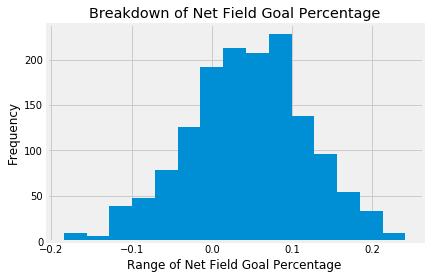

In [567]:
#Here is a histogram for Net_FG% 

warriors.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

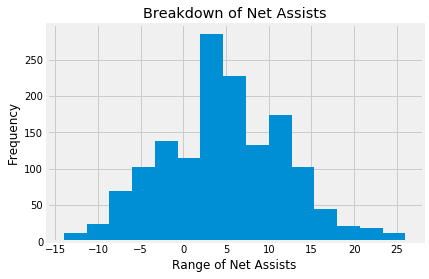

In [568]:
#Here is a histogram for Net_AST

warriors.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

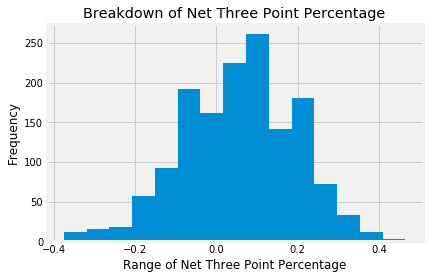

In [569]:
#Here is a histogram for Net_3P%

warriors.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

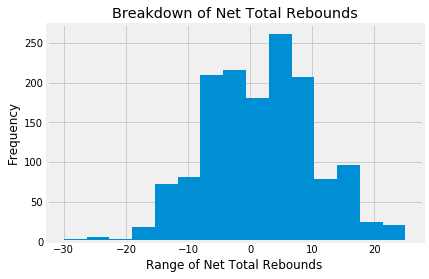

In [570]:
#Here is a histogram for Net_TRB

warriors.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

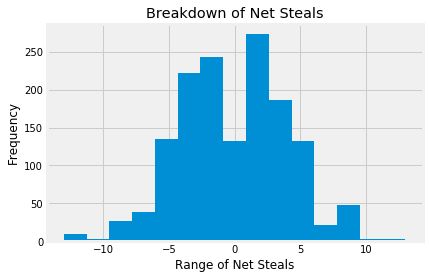

In [571]:
#Here is a histogram for Net_STL

warriors.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

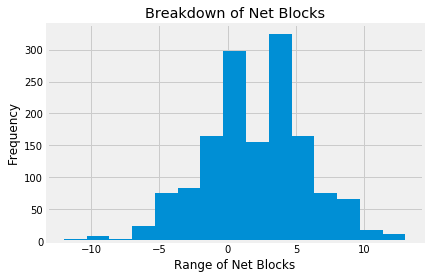

In [572]:
#Here is a histogram for Net_BLK 

warriors.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

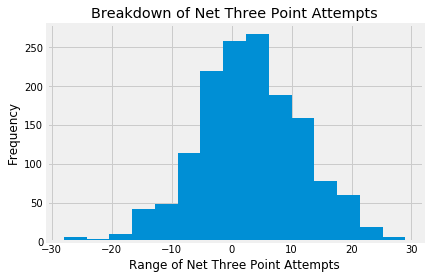

In [573]:
#Here is a histogram for Net_3PA 

warriors.loc[:,"Net_3PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Attempts")
plt.title("Breakdown of Net Three Point Attempts");

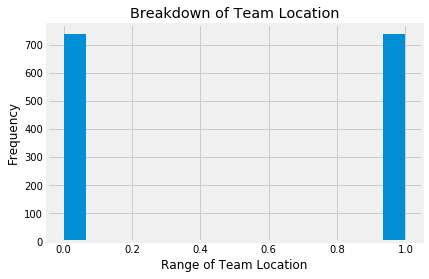

In [574]:
#Here is a histogram for teamLoc_Home 

warriors.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

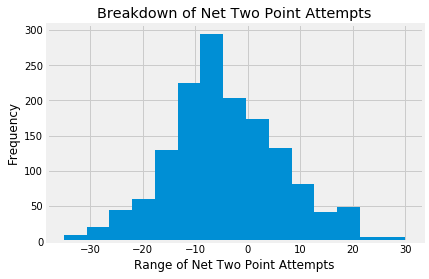

In [575]:
#Here is a histogram for Net_2PA 

warriors.loc[:,"Net_2PA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Two Point Attempts")
plt.title("Breakdown of Net Two Point Attempts");

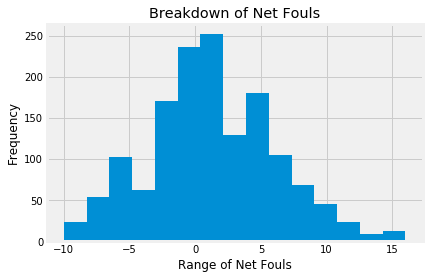

In [576]:
#Here is a histogram for Net_Fouls 

warriors.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

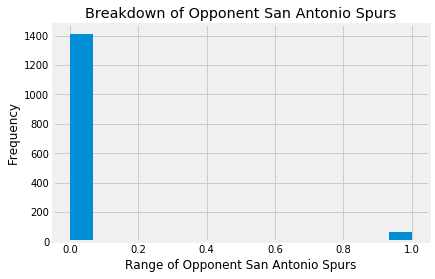

In [577]:
#Here is a histogram for opptAbbr_SA 

warriors.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

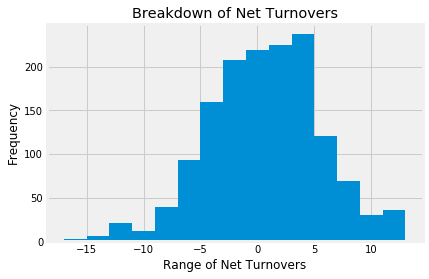

In [578]:
#Here is a histogram for Net_TO 

warriors.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Washington Wizards

In [579]:
wizards = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'WAS']

In [580]:
wizards.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
0,WAS,0,4,-8,4,5,-2,11,-0.1001,-1,...,0,0,0,1,0,0,0,0,0,0
1,WAS,0,4,-8,4,5,-2,11,-0.1001,-1,...,0,0,0,0,0,0,0,0,0,0
2,WAS,0,4,-8,4,5,-2,11,-0.1001,-1,...,0,0,0,0,0,0,0,0,0,0
153,WAS,3,-4,6,-1,0,2,-6,0.0073,-5,...,0,0,0,0,0,0,0,0,0,0
154,WAS,3,-4,6,-1,0,2,-6,0.0073,-5,...,0,0,0,0,0,0,0,0,0,0


In [581]:
wizards.shape

(1476, 130)

In [582]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Wizards

wizards.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.667148
Net_AST                      0.470942
Net_3P%                      0.450853
Net_TRB                      0.335264
Net_BLK                      0.281182
Net_STL                      0.203723
teamLoc_Home                 0.178915
opptAbbr_NO                  0.127943
opptAbbr_ORL                 0.126613
Net_FTA                      0.111713
opptAbbr_NY                  0.105486
Net_Day_Off                  0.102049
opptAbbr_LAL                 0.075223
opptAbbr_MIL                 0.073419
opptAbbr_BKN                 0.065254
opptAbbr_PHI                 0.053744
Off_Name_JonathanSterling    0.050872
opptAbbr_PHO                 0.048863
opptAbbr_CHI                 0.045138
Off_Name_HaywoodeWorkman     0.037947
Off_Name_RayAcosta           0.035948
Off_Name_JacynGoble          0.033569
Off_Name_ScottWall           0.030728
Off_Name_JustinVan Duyne     0.029124
Off_Name_TonyBrown           0.029014
Off_Name_Dav

In [583]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the wizards subset to only those variables with .1 or greater correlation

wizards = wizards.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_RandyRichardson', 'opptAbbr_WAS',
                                  'Off_Name_BrendaPantoja', 'Off_Name_BrandonAdair', 'Off_Name_KippKissinger',
                                  'Net_FGA','opptAbbr_CLE','opptAbbr_SA', 'Net_2PA', 'Off_Name_JoeCrawford',
                                  'opptAbbr_HOU','opptAbbr_LAC','opptAbbr_UTA', 'opptAbbr_OKC', 'Off_Name_DerrickCollins',
                                  'Off_Name_KevinFehr', 'opptAbbr_CHA', 'opptAbbr_MIA', 'Off_Name_MichaelSmith',
                                  'Off_Name_MarcDavis', 'Off_Name_OlandisPoole', 'Off_Name_KevinCutler', 'Off_Name_EricDalen',
                                  'Off_Name_JasonPhillips', 'Off_Name_MarkLindsay', 'Off_Name_DavidGuthrie', 
                                  'Off_Name_DavidJones', 'Off_Name_TonyBrown', 'Off_Name_JustinVan Duyne',
                                  'Off_Name_ScottWall','Off_Name_JacynGoble','Off_Name_RayAcosta', 'Off_Name_HaywoodeWorkman',
                                  'opptAbbr_CHI', 'opptAbbr_PHO', 'Off_Name_JonathanSterling', 'opptAbbr_PHI', 'opptAbbr_BKN',
                                  'opptAbbr_MIL', 'opptAbbr_LAL'], axis = 'columns')

In [584]:
wizards.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.667148
Net_AST                          0.470942
Net_3P%                          0.450853
Net_TRB                          0.335264
Net_BLK                          0.281182
Net_STL                          0.203723
teamLoc_Home                     0.178915
opptAbbr_NO                      0.127943
opptAbbr_ORL                     0.126613
Net_FTA                          0.111713
opptAbbr_NY                      0.105486
Net_Day_Off                      0.102049
Off_Name_DerekRichardson         0.025682
Off_Name_PhenizeeRansom          0.025410
Off_Name_JamesWilliams           0.024290
Off_Name_ZachZarba               0.023359
Off_Name_PatFraher               0.023058
opptAbbr_MEM                     0.022503
opptAbbr_POR                     0.022503
opptAbbr_SAC                     0.022503
opptAbbr_DEN                     0.022503
Off_Name_ScottTwardoski          0.018297
Off_Name_TreMaddox               0

In [585]:
wizards = wizards.drop(['Off_Name_DickBavetta','Off_Name_StevenAnderson','Off_Name_LaurenHoltkamp', 'Off_Name_EddieRush',
                                  'Off_Name_VladimirVoyard-Tadal', 'Off_Name_SeanWright', 'Off_Name_GaryZielinski',
                                  'opptAbbr_BOS','Off_Name_TomWashington','Off_Name_KevinScott', 'Off_Name_BenTaylor', 
                                  'Off_Name_VioletPalmer', 'Off_Name_EricLewis', 'Off_Name_TylerFord',
                                  'Off_Name_GediminasPetraitis','opptAbbr_IND','Off_Name_BrentBarnaky', 'Off_Name_RodneyMott', 
                                  'Off_Name_DanCrawford', 'Off_Name_CurtisBlair', 'Off_Name_NickBuchert',
                                  'Off_Name_BillKennedy', 'Off_Name_SeanCorbin', 'Off_Name_KaneFitzgerald', 'opptAbbr_MIN',
                                  'Off_Name_BrettNansel', 'Off_Name_JoeDeRosa', 'opptAbbr_DET', 'Off_Name_BrianForte',
                                  'Off_Name_BillSpooner', 'Off_Name_J.T.Orr', 'Off_Name_TreMaddox', 'Off_Name_ScottTwardoski',
                                  'opptAbbr_DEN', 'opptAbbr_SAC', 'opptAbbr_POR', 'opptAbbr_MEM', 'Off_Name_PatFraher',
                                  'Off_Name_ZachZarba', 'Off_Name_JamesWilliams', 'Off_Name_PhenizeeRansom',
                                  'Off_Name_DerekRichardson'], axis = 'columns')

In [586]:
wizards.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.667148
Net_AST                      0.470942
Net_3P%                      0.450853
Net_TRB                      0.335264
Net_BLK                      0.281182
Net_STL                      0.203723
teamLoc_Home                 0.178915
opptAbbr_NO                  0.127943
opptAbbr_ORL                 0.126613
Net_FTA                      0.111713
opptAbbr_NY                  0.105486
Net_Day_Off                  0.102049
Off_Name_CourtneyKirkland    0.013346
Off_Name_MitchellErvin       0.012885
Off_Name_TonyBrothers        0.012554
Off_Name_RonGarretson        0.008864
Off_Name_EdMalloy            0.008864
Off_Name_MattBoland          0.008185
Off_Name_MarkAyotte          0.007580
Off_Name_ScottFoster         0.007037
Off_Name_LeonWood            0.007037
Off_Name_C.J.Washington      0.006795
Off_Name_MaratKogut          0.006543
Off_Name_JohnGoble           0.006543
Off_Name_KenMauer            0.006543
Off_Name_Eli

In [587]:
wizards = wizards.drop(['Off_Name_DerrickStafford','Off_Name_MikeCallahan','Off_Name_MontyMcCutchen', 'Off_Name_JoshTiven',
                                  'Off_Name_JamesCapers', 'Off_Name_BennieAdams', 'Off_Name_BennettSalvatore',
                                  'Off_Name_ScottBolnick','Off_Name_JasonGoldenberg','Off_Name_KarlLane', 'Net_3PA',
                                  'Off_Name_LeroyRichardson', 'Off_Name_DedricTaylor', 'Off_Name_EliRoe',
                                  'Off_Name_KenMauer', 'Off_Name_JohnGoble', 'Off_Name_MaratKogut',
                                  'Off_Name_C.J.Washington','Off_Name_LeonWood','Off_Name_ScottFoster', 'Off_Name_MarkAyotte', 
                                  'Off_Name_MattBoland', 'Off_Name_EdMalloy', 'Off_Name_RonGarretson', 'Off_Name_TonyBrothers',
                                  'Off_Name_MitchellErvin', 'Off_Name_CourtneyKirkland'], axis = 'columns')

In [588]:
wizards.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.667148
Net_AST         0.470942
Net_3P%         0.450853
Net_TRB         0.335264
Net_BLK         0.281182
Net_STL         0.203723
teamLoc_Home    0.178915
opptAbbr_NO     0.127943
opptAbbr_ORL    0.126613
Net_FTA         0.111713
opptAbbr_NY     0.105486
Net_Day_Off     0.102049
opptAbbr_TOR   -0.103650
opptAbbr_GS    -0.109298
Net_Fouls      -0.120233
opptAbbr_DAL   -0.135658
Net_TO         -0.145349
Name: teamRslt_Win, dtype: float64

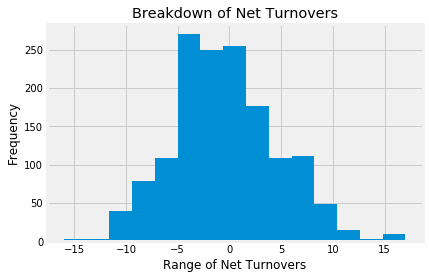

In [589]:
#Here is a histogram for Net_TO 

wizards.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

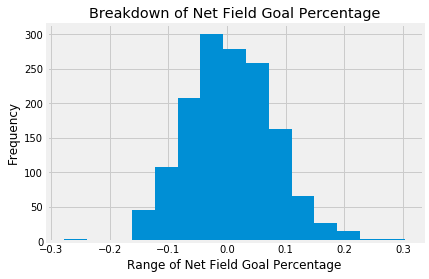

In [590]:
#Here is a histogram for Net_FG% 

wizards.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

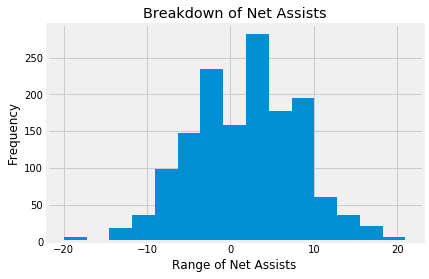

In [591]:
#Here is a histogram for Net_AST 

wizards.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

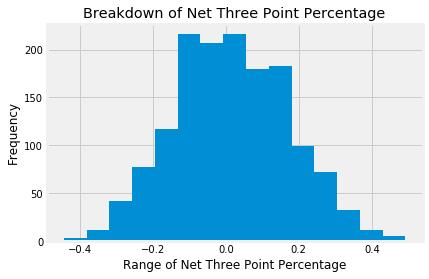

In [592]:
#Here is a histogram for Net_3P% 

wizards.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

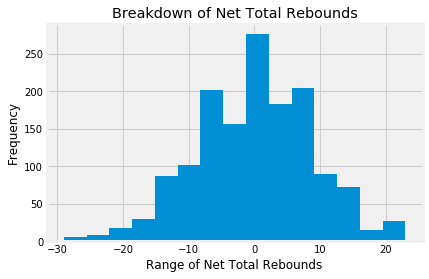

In [593]:
#Here is a histogram for Net_TRB 

wizards.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

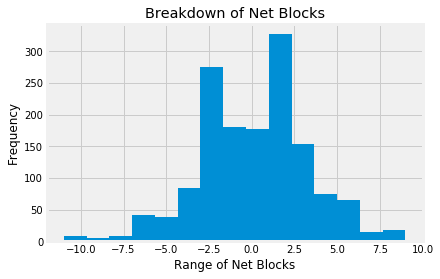

In [594]:
#Here is a histogram for Net_BLK 

wizards.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

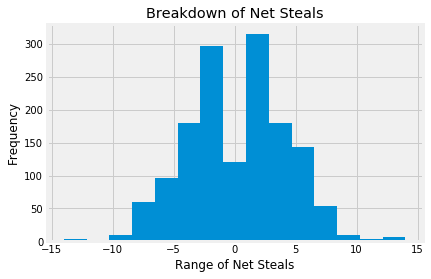

In [595]:
#Here is a histogram for Net_STL 

wizards.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

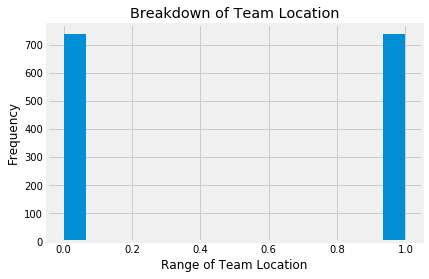

In [596]:
#Here is a histogram for teamLoc_Home 

wizards.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

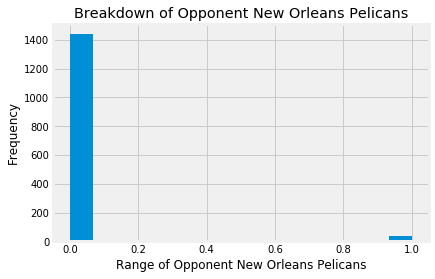

In [597]:
#Here is a histogram for opptAbbr_NO 

wizards.loc[:,"opptAbbr_NO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent New Orleans Pelicans")
plt.title("Breakdown of Opponent New Orleans Pelicans");

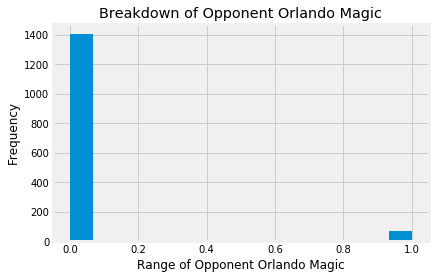

In [598]:
#Here is a histogram for opptAbbr_ORL 

wizards.loc[:,"opptAbbr_ORL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Orlando Magic")
plt.title("Breakdown of Opponent Orlando Magic");

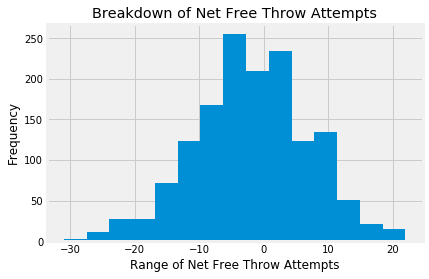

In [599]:
#Here is a histogram for Net_FTA

wizards.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

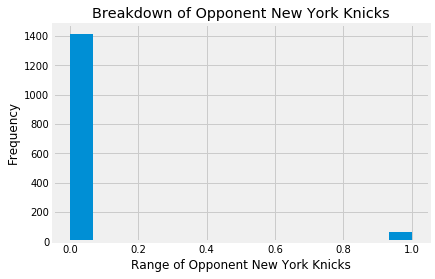

In [600]:
#Here is a histogram for opptAbbr_NY  

wizards.loc[:,"opptAbbr_NY"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent New York Knicks")
plt.title("Breakdown of Opponent New York Knicks");

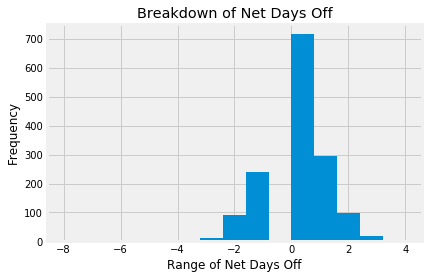

In [601]:
#Here is a histogram for Net_Day_Off 

wizards.loc[:,"Net_Day_Off"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Days Off")
plt.title("Breakdown of Net Days Off");

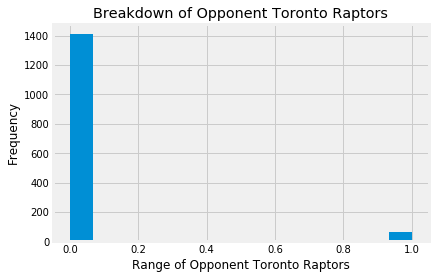

In [602]:
#Here is a histogram for opptAbbr_TOR 

wizards.loc[:,"opptAbbr_TOR"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Toronto Raptors")
plt.title("Breakdown of Opponent Toronto Raptors");

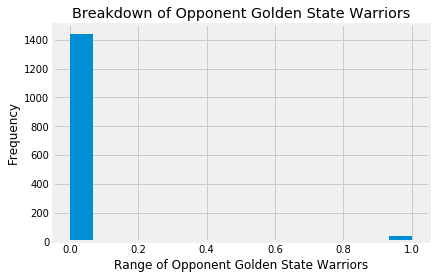

In [603]:
#Here is a histogram for opptAbbr_GS 

wizards.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

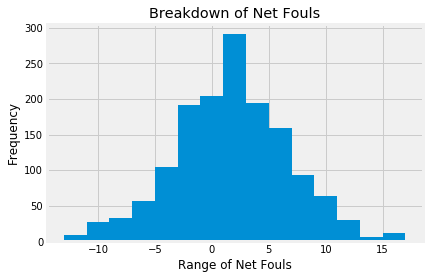

In [604]:
#Here is a histogram for Net_Fouls 

wizards.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

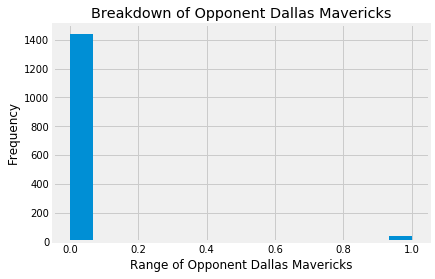

In [605]:
#Here is a histogram for opptAbbr_DAL 

wizards.loc[:,"opptAbbr_DAL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Dallas Mavericks")
plt.title("Breakdown of Opponent Dallas Mavericks");

#### Oklahoma City Thunder

In [606]:
thunder = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'OKC']

In [607]:
thunder.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
72,OKC,-1,-9,5,-3,1,-1,-2,-0.0664,0,...,0,0,0,0,0,0,0,0,0,0
73,OKC,-1,-9,5,-3,1,-1,-2,-0.0664,0,...,0,0,0,0,0,0,0,0,0,0
74,OKC,-1,-9,5,-3,1,-1,-2,-0.0664,0,...,0,0,0,0,0,0,0,0,0,0
129,OKC,-1,1,0,-2,10,-3,-13,0.1536,4,...,0,0,0,0,0,0,0,0,0,0
130,OKC,-1,1,0,-2,10,-3,-13,0.1536,4,...,0,0,0,0,0,0,0,0,0,0


In [608]:
thunder.shape

(1476, 130)

In [609]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Thunder

thunder.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.605858
Net_AST                          0.468689
Net_3P%                          0.418737
Net_TRB                          0.358162
Net_BLK                          0.234021
teamLoc_Home                     0.228412
Net_FTA                          0.163306
Net_STL                          0.142514
opptAbbr_PHI                     0.119046
Net_Day_Off                      0.075051
opptAbbr_LAL                     0.060566
opptAbbr_SAC                     0.060566
opptAbbr_UTA                     0.052683
Off_Name_TreMaddox               0.051657
Off_Name_TonyBrothers            0.046070
Off_Name_CurtisBlair             0.045118
Off_Name_BrettNansel             0.043896
Off_Name_EricDalen               0.037808
opptAbbr_ORL                     0.036784
opptAbbr_CHA                     0.036784
Off_Name_LeroyRichardson         0.036511
Off_Name_MichaelSmith            0.034434
Off_Name_OlandisPoole            0

In [610]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the thunder subset to only those variables with .1 or greater correlation

thunder = thunder.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_ScottBolnick', 'Off_Name_VladimirVoyard-Tadal',
                                  'Off_Name_RandyRichardson', 'Off_Name_PhenizeeRansom', 'Off_Name_KippKissinger',
                                  'Off_Name_BrandonAdair','Off_Name_JasonGoldenberg','opptAbbr_OKC', 'opptAbbr_CLE',
                                  'opptAbbr_HOU', 'Net_3PA', 'Off_Name_KevinCutler', 'Off_Name_DerrickCollins',
                                  'Off_Name_DedricTaylor','opptAbbr_BKN','Net_FGA', 'Off_Name_JustinVan Duyne', 
                                  'opptAbbr_SA', 'Off_Name_TonyBrown', 'Off_Name_MarkLindsay', 'Off_Name_BrendaPantoja',
                                  'Off_Name_JoshTiven', 'Off_Name_ScottFoster', 'Off_Name_SeanWright', 
                                  'Off_Name_EddieRush', 'Off_Name_ScottTwardoski', 'Off_Name_RodneyMott', 'Off_Name_EliRoe',
                                  'Off_Name_BennettSalvatore', 'opptAbbr_PHO', 'Off_Name_OlandisPoole', 'Off_Name_MichaelSmith',
                                  'Off_Name_LeroyRichardson','opptAbbr_CHA','opptAbbr_ORL', 'Off_Name_EricDalen',
                                  'Off_Name_BrettNansel', 'Off_Name_CurtisBlair', 'Off_Name_TonyBrothers', 
                                  'Off_Name_TreMaddox', 'opptAbbr_UTA', 'opptAbbr_SAC', 'opptAbbr_LAL', 'Net_Day_Off'
                                  ], axis = 'columns')

In [611]:
thunder.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.605858
Net_AST                        0.468689
Net_3P%                        0.418737
Net_TRB                        0.358162
Net_BLK                        0.234021
teamLoc_Home                   0.228412
Net_FTA                        0.163306
Net_STL                        0.142514
opptAbbr_PHI                   0.119046
Off_Name_C.J.Washington        0.025943
Off_Name_BennieAdams           0.025793
Off_Name_JohnGoble             0.021784
Off_Name_DickBavetta           0.019630
Off_Name_JoeDeRosa             0.019604
Off_Name_LeonWood              0.018521
Off_Name_VioletPalmer          0.017174
Off_Name_DerrickStafford       0.015156
Off_Name_EricLewis             0.015156
Off_Name_BillKennedy           0.015071
Off_Name_KevinScott            0.015071
opptAbbr_MIN                   0.013410
Net_2PA                        0.012988
opptAbbr_NO                    0.012504
opptAbbr_LAC                   0.012504


In [612]:
thunder = thunder.drop(['Off_Name_GediminasPetraitis','Off_Name_MarcDavis','Off_Name_JamesCapers', 'Off_Name_PatFraher',
                                  'Off_Name_DerekRichardson', 'opptAbbr_IND', 'Off_Name_DanCrawford',
                                  'Off_Name_DavidGuthrie','Off_Name_BrentBarnaky','Off_Name_TylerFord', 'Off_Name_BenTaylor',
                                  'Off_Name_MikeCallahan', 'Off_Name_KevinFehr', 'Off_Name_MontyMcCutchen', 
                                  'Off_Name_KarlLane', 'Off_Name_RayAcosta', 'Off_Name_J.T.Orr', 'Off_Name_ScottWall',
                                  'Off_Name_EdMalloy','Off_Name_CourtneyKirkland','opptAbbr_DEN', 'Off_Name_DavidJones', 
                                  'Off_Name_MaratKogut', 'Off_Name_HaywoodeWorkman', 'Off_Name_BrianForte', 'opptAbbr_NO',
                                  'Off_Name_KaneFitzgerald', 'Off_Name_JoeCrawford', 'Off_Name_LaurenHoltkamp', 'Net_2PA',
                                  'Off_Name_JacynGoble', 'Off_Name_MarkAyotte', 'Off_Name_ZachZarba', 'opptAbbr_LAC',
                                  'opptAbbr_MIN', 'Off_Name_KevinScott', 'Off_Name_BillKennedy', 'Off_Name_EricLewis',
                                  'Off_Name_DerrickStafford', 'Off_Name_VioletPalmer', 'Off_Name_LeonWood', 
                                  'Off_Name_JoeDeRosa', 'Off_Name_DickBavetta', 'Off_Name_JohnGoble', 'Off_Name_BennieAdams',
                                  'Off_Name_C.J.Washington'], axis = 'columns')

In [613]:
thunder.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.605858
Net_AST                      0.468689
Net_3P%                      0.418737
Net_TRB                      0.358162
Net_BLK                      0.234021
teamLoc_Home                 0.228412
Net_FTA                      0.163306
Net_STL                      0.142514
opptAbbr_PHI                 0.119046
opptAbbr_CHI                 0.009363
opptAbbr_TOR                 0.009363
opptAbbr_WAS                 0.009363
opptAbbr_DET                 0.009363
opptAbbr_NY                  0.009363
opptAbbr_MIL                 0.009363
opptAbbr_BOS                 0.009363
opptAbbr_MIA                 0.009363
Off_Name_JasonPhillips       0.008084
Off_Name_JamesWilliams       0.007613
Off_Name_SeanCorbin          0.007613
Off_Name_NickBuchert         0.004997
Off_Name_StevenAnderson      0.004638
Off_Name_MattBoland          0.004357
Off_Name_GaryZielinski       0.004357
Off_Name_JonathanSterling    0.002672
Off_Name_Ken

In [614]:
thunder = thunder.drop(['Off_Name_MitchellErvin','opptAbbr_MEM','opptAbbr_DAL', 'Off_Name_RonGarretson',
                                  'Off_Name_TomWashington', 'Off_Name_BillSpooner', 'Off_Name_KenMauer',
                                  'Off_Name_JonathanSterling','Off_Name_GaryZielinski','Off_Name_MattBoland', 
                                  'Off_Name_StevenAnderson', 'Off_Name_NickBuchert', 'Off_Name_SeanCorbin',
                                  'Off_Name_JamesWilliams', 'Off_Name_JasonPhillips', 'opptAbbr_MIA', 'opptAbbr_BOS',
                                  'opptAbbr_MIL', 'opptAbbr_NY', 'opptAbbr_DET', 'opptAbbr_WAS', 'opptAbbr_TOR',
                                  'opptAbbr_CHI'], axis = 'columns')

In [615]:
thunder.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.605858
Net_AST         0.468689
Net_3P%         0.418737
Net_TRB         0.358162
Net_BLK         0.234021
teamLoc_Home    0.228412
Net_FTA         0.163306
Net_STL         0.142514
opptAbbr_PHI    0.119046
opptAbbr_POR   -0.104408
opptAbbr_GS    -0.123627
Net_Fouls      -0.157836
Net_TO         -0.178392
Name: teamRslt_Win, dtype: float64

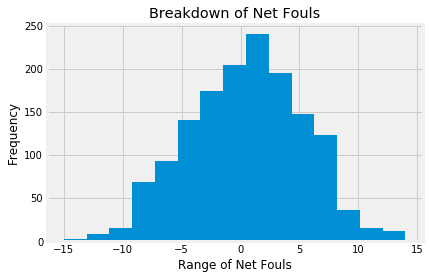

In [616]:
#Here is a histogram for Net_Fouls 

thunder.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

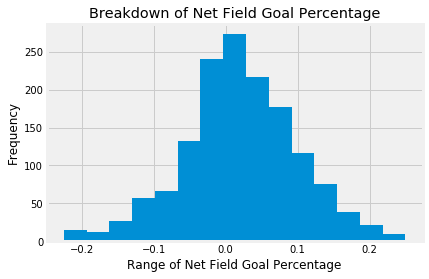

In [617]:
#Here is a histogram for Net_FG% 

thunder.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

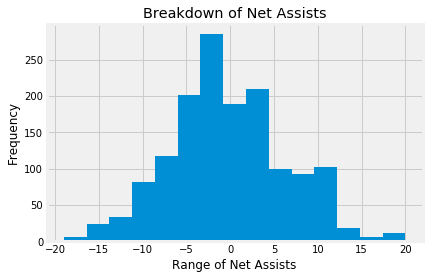

In [618]:
#Here is a histogram for Net_AST 

thunder.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

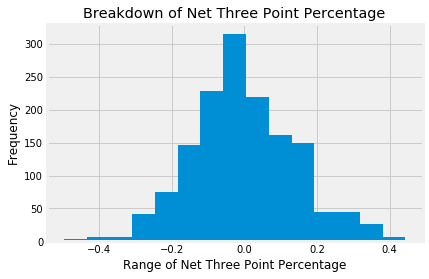

In [619]:
#Here is a histogram for Net_3P% 

thunder.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

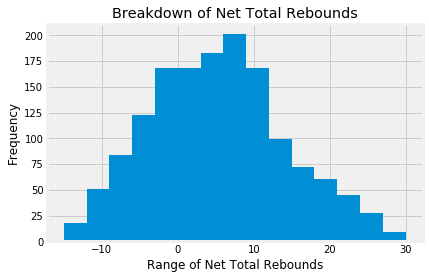

In [620]:
#Here is a histogram for Net_TRB

thunder.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

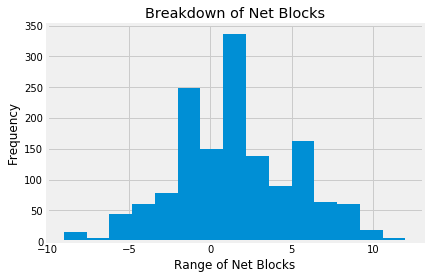

In [621]:
#Here is a histogram for Net_BLK 

thunder.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

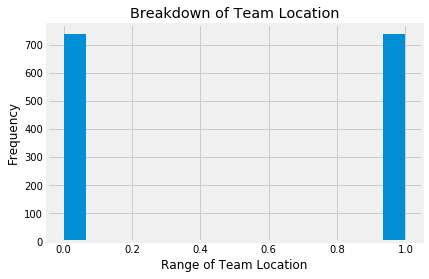

In [622]:
#Here is a histogram for teamLoc_Home 

thunder.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

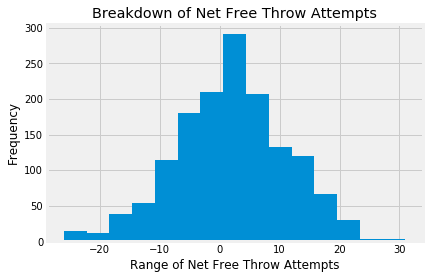

In [623]:
#Here is a histogram for Net_FTA 

thunder.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

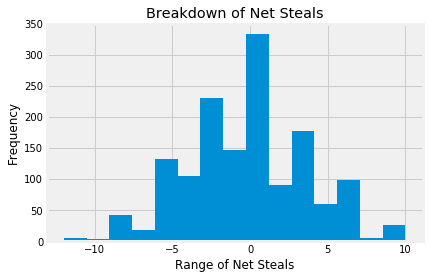

In [624]:
#Here is a histogram for Net_STL 

thunder.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

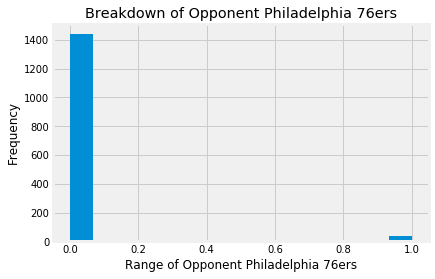

In [625]:
#Here is a histogram for opptAbbr_PHI 

thunder.loc[:,"opptAbbr_PHI"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Philadelphia 76ers")
plt.title("Breakdown of Opponent Philadelphia 76ers");

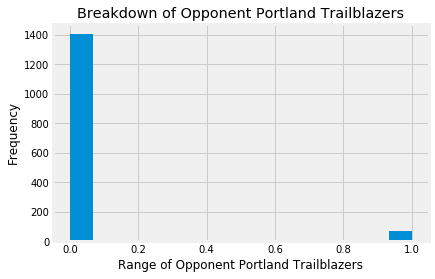

In [626]:
#Here is a histogram for opptAbbr_POR 

thunder.loc[:,"opptAbbr_POR"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Portland Trailblazers")
plt.title("Breakdown of Opponent Portland Trailblazers");

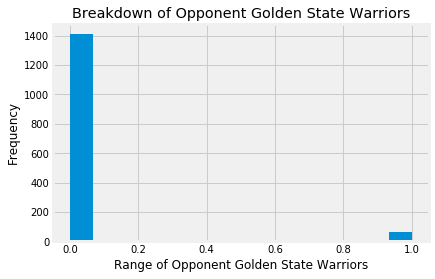

In [627]:
#Here is a histogram for opptAbbr_GS

thunder.loc[:,"opptAbbr_GS"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Golden State Warriors")
plt.title("Breakdown of Opponent Golden State Warriors");

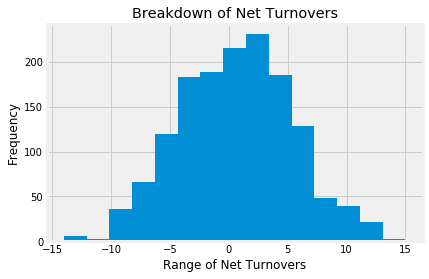

In [628]:
#Here is a histogram for Net_TO 

thunder.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

#### Detroit Pistons

In [629]:
pistons = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'DET']

In [630]:
pistons.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
33,DET,0,-7,-4,0,1,-9,0,-0.0507,11,...,0,0,0,0,0,0,0,0,0,0
34,DET,0,-7,-4,0,1,-9,0,-0.0507,11,...,0,0,0,0,0,0,0,0,0,0
35,DET,0,-7,-4,0,1,-9,0,-0.0507,11,...,0,0,0,0,0,0,0,0,0,0
132,DET,0,5,-4,-4,0,-1,-2,-0.0237,-4,...,0,0,0,0,0,0,0,0,0,0
133,DET,0,5,-4,-4,0,-1,-2,-0.0237,-4,...,0,0,0,0,0,0,0,0,0,0


In [631]:
pistons.shape

(1475, 130)

In [632]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Pistons

pistons.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.635938
Net_3P%                      0.489641
Net_AST                      0.464429
Net_TRB                      0.440970
Net_STL                      0.257593
Net_FTA                      0.229900
teamLoc_Home                 0.189724
Net_BLK                      0.159943
opptAbbr_PHO                 0.076596
opptAbbr_SAC                 0.076596
Net_Day_Off                  0.076326
Off_Name_MattBoland          0.052826
opptAbbr_MIL                 0.052459
Off_Name_KevinFehr           0.052284
opptAbbr_PHI                 0.051776
Off_Name_JonathanSterling    0.042675
Off_Name_ScottFoster         0.041343
opptAbbr_ORL                 0.041289
opptAbbr_NY                  0.041289
Off_Name_DavidGuthrie        0.040615
Off_Name_NickBuchert         0.035673
Off_Name_CurtisBlair         0.035137
Off_Name_KevinCutler         0.035060
Off_Name_JoeDeRosa           0.034038
opptAbbr_CLE                 0.033377
opptAbbr_CHI

In [633]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the pistons subset to only those variables with .1 or greater correlation

pistons = pistons.drop(['Off_Name_RandyRichardson','Off_Name_MattMyers','Off_Name_ScottBolnick', 'Off_Name_PhenizeeRansom',
                                  'Off_Name_BrendaPantoja', 'opptAbbr_DET', 'Off_Name_KippKissinger', 'opptAbbr_IND',
                                  'Off_Name_BrandonAdair','opptAbbr_LAC','opptAbbr_GS', 'Net_FGA', 'opptAbbr_TOR',
                                  'opptAbbr_MEM','opptAbbr_UTA','Off_Name_JoeCrawford', 'Off_Name_MontyMcCutchen', 
                                  'Net_2PA', 'Off_Name_TonyBrown', 'Off_Name_RonGarretson', 'Off_Name_TreMaddox',
                                  'Off_Name_MikeCallahan', 'Off_Name_BenTaylor', 'Off_Name_JacynGoble', 'Off_Name_TylerFord',
                                  'Off_Name_EricLewis', 'opptAbbr_LAL', 'Off_Name_JasonGoldenberg', 'Off_Name_C.J.Washington',
                                  'opptAbbr_BKN', 'opptAbbr_CHI', 'opptAbbr_CLE', 'Off_Name_JoeDeRosa',
                                  'Off_Name_KevinCutler','Off_Name_CurtisBlair','Off_Name_NickBuchert', 
                                  'Off_Name_DavidGuthrie', 'opptAbbr_NY', 'opptAbbr_ORL', 'Off_Name_ScottFoster',
                                  'Off_Name_JonathanSterling', 'opptAbbr_PHI', 'Off_Name_KevinFehr', 'opptAbbr_MIL', 
                                  'Off_Name_MattBoland', 'Net_Day_Off', 'opptAbbr_SAC', 'opptAbbr_PHO',
                                  ], axis = 'columns')

In [634]:
pistons.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.635938
Net_3P%                          0.489641
Net_AST                          0.464429
Net_TRB                          0.440970
Net_STL                          0.257593
Net_FTA                          0.229900
teamLoc_Home                     0.189724
Net_BLK                          0.159943
Off_Name_SirAllenConner          0.030165
Off_Name_VladimirVoyard-Tadal    0.030165
Off_Name_EdMalloy                0.029782
Off_Name_JustinVan Duyne         0.029437
Off_Name_MarkAyotte              0.029125
Off_Name_StevenAnderson          0.028875
Off_Name_LaurenHoltkamp          0.028860
Off_Name_KarlLane                0.024655
opptAbbr_CHA                     0.024033
opptAbbr_MIN                     0.023304
opptAbbr_POR                     0.023304
opptAbbr_BOS                     0.020955
Off_Name_BrettNansel             0.020145
Off_Name_DerrickCollins          0.019736
Off_Name_CourtneyKirkland        0

In [635]:
pistons = pistons.drop(['opptAbbr_SA','opptAbbr_DEN','opptAbbr_OKC', 'Off_Name_SeanWright', 'Off_Name_JoshTiven',
                                  'Off_Name_OlandisPoole', 'Off_Name_MarkLindsay', 'Off_Name_DerekRichardson', 
                                  'Off_Name_MaratKogut', 'Off_Name_MarcDavis', 'Off_Name_EddieRush',
                                  'Off_Name_ScottTwardoski','Off_Name_J.T.Orr','Off_Name_ZachZarba', 'Off_Name_VioletPalmer',
                                  'Off_Name_MichaelSmith', 'Off_Name_BrianForte', 'Off_Name_KevinScott',
                                  'Off_Name_DerrickStafford','Off_Name_EliRoe','Off_Name_MitchellErvin',
                                  'Off_Name_BillSpooner', 'Off_Name_ScottWall', 'Off_Name_DavidJones',
                                  'Net_3PA', 'Off_Name_TomWashington', 'opptAbbr_DAL', 'Off_Name_JamesWilliams',
                                  'Off_Name_EricDalen', 'Off_Name_KaneFitzgerald', 'Off_Name_SeanCorbin', 'Off_Name_KenMauer',
                                  'Off_Name_BrentBarnaky', 'Off_Name_CourtneyKirkland', 'Off_Name_DerrickCollins', 
                                  'Off_Name_BrettNansel', 'opptAbbr_BOS', 'opptAbbr_POR', 'opptAbbr_MIN',
                                  'opptAbbr_CHA', 'Off_Name_KarlLane', 'Off_Name_LaurenHoltkamp', 'Off_Name_StevenAnderson',
                                  'Off_Name_MarkAyotte','Off_Name_JustinVan Duyne','Off_Name_EdMalloy', 
                                  'Off_Name_VladimirVoyard-Tadal', 'Off_Name_SirAllenConner'
                                  ], axis = 'columns')

In [636]:
pistons.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.635938
Net_3P%                        0.489641
Net_AST                        0.464429
Net_TRB                        0.440970
Net_STL                        0.257593
Net_FTA                        0.229900
teamLoc_Home                   0.189724
Net_BLK                        0.159943
opptAbbr_MIA                   0.012000
opptAbbr_WAS                   0.012000
Off_Name_DickBavetta           0.010880
Off_Name_RodneyMott            0.009321
Off_Name_DanCrawford           0.006823
Off_Name_JamesCapers           0.006823
Off_Name_BennettSalvatore      0.006561
Off_Name_JohnGoble             0.004365
Off_Name_JasonPhillips         0.003893
Off_Name_GediminasPetraitis    0.002744
Off_Name_BennieAdams           0.002198
Off_Name_LeonWood              0.000353
Off_Name_PatFraher             0.000353
Off_Name_TonyBrothers          0.000353
Off_Name_DedricTaylor          0.000287
Off_Name_LeroyRichardson      -0.001094


In [637]:
pistons = pistons.drop(['opptAbbr_HOU','Off_Name_RayAcosta','Off_Name_HaywoodeWorkman', 'Off_Name_GaryZielinski', 
                                  'Off_Name_BillKennedy', 'Off_Name_LeroyRichardson', 'Off_Name_DedricTaylor',
                                  'Off_Name_TonyBrothers', 'Off_Name_PatFraher', 'Off_Name_LeonWood', 
                                  'Off_Name_BennieAdams', 'Off_Name_GediminasPetraitis', 'Off_Name_JasonPhillips',
                                  'Off_Name_JohnGoble','Off_Name_BennettSalvatore','Off_Name_JamesCapers', 
                                  'Off_Name_DanCrawford', 'Off_Name_RodneyMott', 'Off_Name_DickBavetta',
                                  'opptAbbr_WAS', 'opptAbbr_MIA'
                                  ], axis = 'columns')

In [638]:
pistons.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.635938
Net_3P%         0.489641
Net_AST         0.464429
Net_TRB         0.440970
Net_STL         0.257593
Net_FTA         0.229900
teamLoc_Home    0.189724
Net_BLK         0.159943
opptAbbr_NO    -0.109926
Net_TO         -0.168995
Net_Fouls      -0.224282
Name: teamRslt_Win, dtype: float64

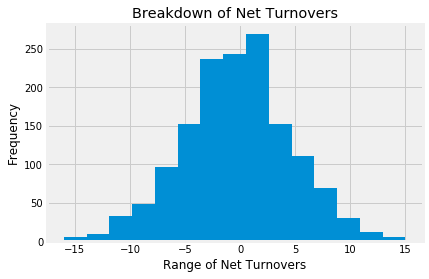

In [639]:
#Here is a histogram for Net_TO 

pistons.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

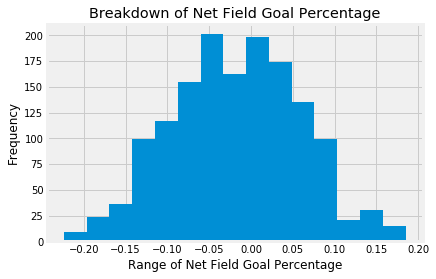

In [640]:
#Here is a histogram for Net_FG% 

pistons.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

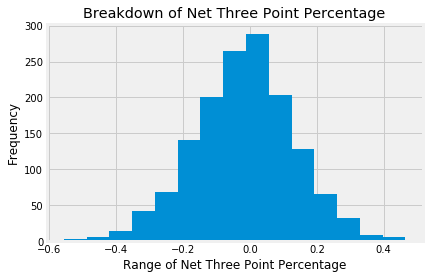

In [641]:
#Here is a histogram for Net_3P% 

pistons.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

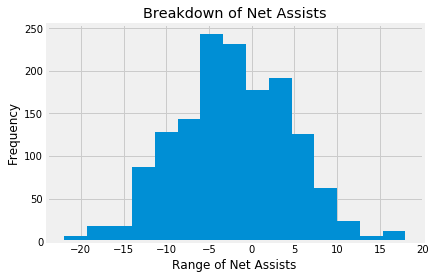

In [642]:
#Here is a histogram for Net_AST 

pistons.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

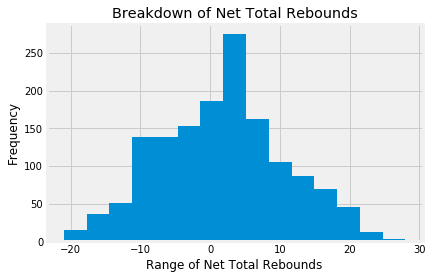

In [643]:
#Here is a histogram for Net_TRB 

pistons.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

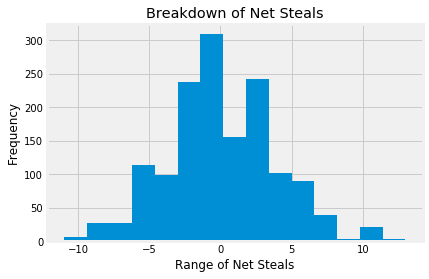

In [644]:
#Here is a histogram for Net_STL

pistons.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

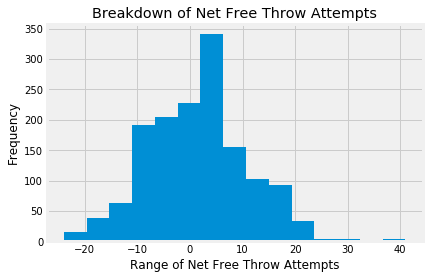

In [645]:
#Here is a histogram for Net_FTA 

pistons.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

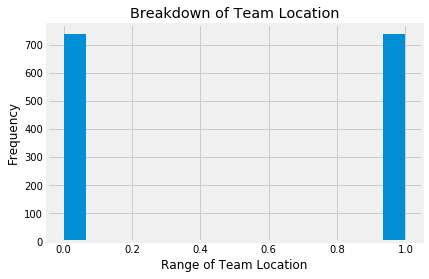

In [646]:
#Here is a histogram for teamLoc_Home

pistons.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

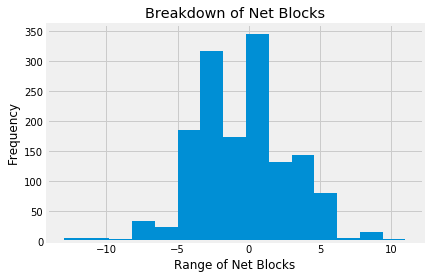

In [647]:
#Here is a histogram for Net_BLK 

pistons.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

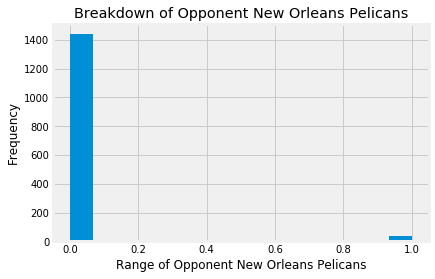

In [648]:
#Here is a histogram for opptAbbr_NO

pistons.loc[:,"opptAbbr_NO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent New Orleans Pelicans")
plt.title("Breakdown of Opponent New Orleans Pelicans");

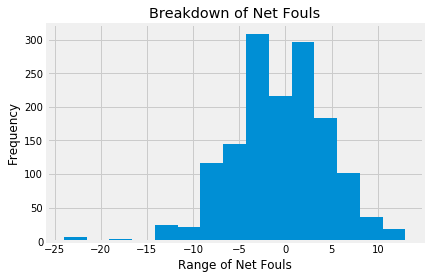

In [649]:
#Here is a histogram for Net_Fouls 

pistons.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Charlotte Hornets

In [650]:
hornets = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'CHA']

In [651]:
hornets.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
87,CHA,-2,-1,-8,5,4,7,2,-0.0329,9,...,0,0,0,0,0,0,0,0,0,0
88,CHA,-2,-1,-8,5,4,7,2,-0.0329,9,...,0,0,0,0,0,0,0,0,0,0
89,CHA,-2,-1,-8,5,4,7,2,-0.0329,9,...,0,0,0,0,0,0,0,0,0,0
186,CHA,-2,-12,-10,7,-5,-9,11,-0.1839,19,...,0,0,0,1,0,0,0,0,0,0
187,CHA,-2,-12,-10,7,-5,-9,11,-0.1839,19,...,0,0,0,0,1,0,0,0,0,0


In [652]:
hornets.shape

(1475, 130)

In [653]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Hornets

hornets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.654961
Net_TRB                          0.454109
Net_AST                          0.450809
Net_3P%                          0.411783
Net_BLK                          0.237007
Net_FTA                          0.196183
teamLoc_Home                     0.193310
Net_STL                          0.153418
opptAbbr_ORL                     0.141142
opptAbbr_MIN                     0.098546
opptAbbr_MIL                     0.085307
opptAbbr_WAS                     0.065093
Off_Name_StevenAnderson          0.057681
opptAbbr_BKN                     0.055629
Off_Name_CourtneyKirkland        0.053616
Net_3PA                          0.051684
Off_Name_GediminasPetraitis      0.050546
Off_Name_TreMaddox               0.049432
opptAbbr_NY                      0.045676
opptAbbr_DEN                     0.045448
opptAbbr_LAL                     0.045448
opptAbbr_SAC                     0.045448
Off_Name_ScottFoster             0

In [654]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the hornets subset to only those variables with .1 or greater correlation

hornets = hornets.drop(['Off_Name_SirAllenConner','Off_Name_VladimirVoyard-Tadal','Off_Name_RandyRichardson', 'opptAbbr_CHA',
                                  'Net_2PA', 'Off_Name_JonathanSterling', 'Off_Name_KippKissinger', 'opptAbbr_LAC', 
                                  'opptAbbr_MIA','Net_TO','Off_Name_BennettSalvatore', 'opptAbbr_CLE', 'opptAbbr_BOS',
                                  'Net_FGA','opptAbbr_OKC','opptAbbr_NO', 'opptAbbr_GS', 'opptAbbr_POR',
                                  'Off_Name_GaryZielinski', 'Off_Name_BrettNansel', 'Off_Name_TomWashington', 
                                  'Off_Name_EricDalen', 'Off_Name_LeonWood', 'Off_Name_KevinFehr', 'Off_Name_TonyBrown',
                                  'Off_Name_MarkAyotte', 'opptAbbr_UTA', 'Off_Name_EricLewis', 'opptAbbr_DET',
                                  'Off_Name_JasonGoldenberg','Off_Name_ZachZarba','Off_Name_MarkLindsay', 
                                  'Off_Name_JacynGoble', 'Off_Name_ScottFoster', 'opptAbbr_SAC', 'opptAbbr_LAL',
                                  'opptAbbr_DEN', 'opptAbbr_NY', 'Off_Name_TreMaddox', 'Off_Name_GediminasPetraitis', 
                                  'Net_3PA', 'Off_Name_CourtneyKirkland', 'opptAbbr_BKN', 'Off_Name_StevenAnderson',
                                  'opptAbbr_WAS', 'opptAbbr_MIL', 'opptAbbr_MIN'], axis = 'columns')

In [655]:
hornets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.654961
Net_TRB                     0.454109
Net_AST                     0.450809
Net_3P%                     0.411783
Net_BLK                     0.237007
Net_FTA                     0.196183
teamLoc_Home                0.193310
Net_STL                     0.153418
opptAbbr_ORL                0.141142
Off_Name_PhenizeeRansom     0.029344
Off_Name_BrandonAdair       0.029344
Off_Name_KarlLane           0.025969
opptAbbr_PHI                0.025861
Off_Name_TonyBrothers       0.025817
Off_Name_DerekRichardson    0.025719
Net_Day_Off                 0.023523
Off_Name_BrentBarnaky       0.021410
Off_Name_BillSpooner        0.020550
Off_Name_ScottWall          0.020123
Off_Name_JustinVan Duyne    0.019299
opptAbbr_MEM                0.018899
opptAbbr_DAL                0.018899
Off_Name_TylerFord          0.018294
Off_Name_RonGarretson       0.015367
Off_Name_DerrickCollins     0.015367
Off_Name_BenTaylor          0.013281
O

In [656]:
hornets = hornets.drop(['Off_Name_JoeDeRosa','Off_Name_CurtisBlair','Off_Name_DickBavetta', 'Off_Name_MikeCallahan',
                                  'Off_Name_SeanWright', 'Off_Name_J.T.Orr', 'Off_Name_JamesWilliams', 
                                  'Off_Name_BrendaPantoja', 'Off_Name_ScottBolnick', 'Off_Name_MattMyers',
                                  'Off_Name_MattBoland','Off_Name_JasonPhillips','Off_Name_MaratKogut', 'Off_Name_RodneyMott',
                                  'Off_Name_EddieRush', 'opptAbbr_CHI', 'Off_Name_HaywoodeWorkman',
                                  'Off_Name_DerrickStafford','Off_Name_DedricTaylor','Off_Name_OlandisPoole', 
                                  'Off_Name_MarcDavis', 'Off_Name_KaneFitzgerald', 'opptAbbr_PHO', 'Off_Name_MichaelSmith',
                                  'Off_Name_DanCrawford', 'Off_Name_EliRoe', 'Off_Name_BennieAdams', 'Off_Name_PatFraher',
                                  'Off_Name_EdMalloy', 'Off_Name_LaurenHoltkamp', 'Off_Name_BenTaylor', 'opptAbbr_DAL',
                                  'Off_Name_DerrickCollins', 'Off_Name_RonGarretson', 'Off_Name_TylerFord', 'opptAbbr_MEM',
                                  'Off_Name_JustinVan Duyne', 'Off_Name_ScottWall', 'Off_Name_BillSpooner', 
                                  'Off_Name_BrentBarnaky', 'Net_Day_Off', 'Off_Name_DerekRichardson',
                                  'Off_Name_TonyBrothers','opptAbbr_PHI','Off_Name_KarlLane', 'Off_Name_BrandonAdair',
                                  'Off_Name_PhenizeeRansom'], axis = 'columns')

In [657]:
hornets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                1.000000
Net_FG%                     0.654961
Net_TRB                     0.454109
Net_AST                     0.450809
Net_3P%                     0.411783
Net_BLK                     0.237007
Net_FTA                     0.196183
teamLoc_Home                0.193310
Net_STL                     0.153418
opptAbbr_ORL                0.141142
Off_Name_KenMauer           0.009528
Off_Name_KevinScott         0.009528
Off_Name_NickBuchert        0.008596
Off_Name_C.J.Washington     0.007636
opptAbbr_IND                0.006045
opptAbbr_TOR                0.006045
Off_Name_BillKennedy        0.005628
Off_Name_LeroyRichardson    0.004574
Off_Name_DavidGuthrie       0.004574
Off_Name_RayAcosta          0.004403
Off_Name_JamesCapers        0.003437
Off_Name_MontyMcCutchen     0.002201
Off_Name_JoshTiven          0.001036
Off_Name_DavidJones         0.000843
Off_Name_JoeCrawford        0.000594
Off_Name_JohnGoble          0.000154
Off_Name_KevinCutler       -0.001495
O

In [658]:
hornets = hornets.drop(['Off_Name_ScottTwardoski','Off_Name_BrianForte','Off_Name_MitchellErvin', 'Off_Name_VioletPalmer',
                                  'Off_Name_SeanCorbin', 'Off_Name_KevinCutler', 'Off_Name_JohnGoble', 
                                  'Off_Name_JoeCrawford', 'Off_Name_DavidJones', 'Off_Name_JoshTiven',
                                  'Off_Name_MontyMcCutchen','Off_Name_JamesCapers','Off_Name_RayAcosta', 
                                  'Off_Name_DavidGuthrie', 'Off_Name_LeroyRichardson', 'Off_Name_BillKennedy',
                                  'opptAbbr_TOR', 'opptAbbr_IND', 'Off_Name_C.J.Washington', 'Off_Name_NickBuchert', 
                                  'Off_Name_KevinScott','Off_Name_KenMauer'], axis = 'columns')

In [659]:
hornets.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.654961
Net_TRB         0.454109
Net_AST         0.450809
Net_3P%         0.411783
Net_BLK         0.237007
Net_FTA         0.196183
teamLoc_Home    0.193310
Net_STL         0.153418
opptAbbr_ORL    0.141142
opptAbbr_HOU   -0.113846
opptAbbr_SA    -0.113846
Net_Fouls      -0.203872
Name: teamRslt_Win, dtype: float64

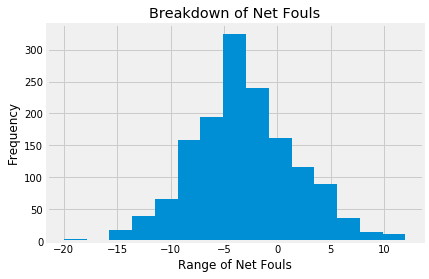

In [660]:
#Here is a histogram for Net_Fouls 

hornets.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

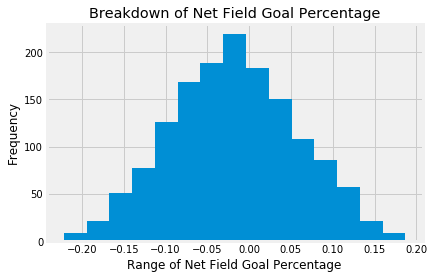

In [661]:
#Here is a histogram for Net_FG% 

hornets.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

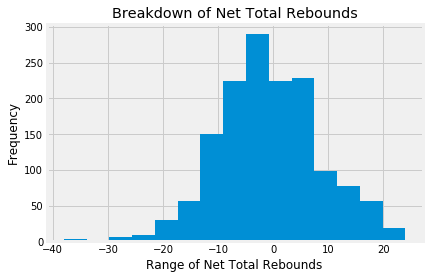

In [662]:
#Here is a histogram for Net_TRB 

hornets.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

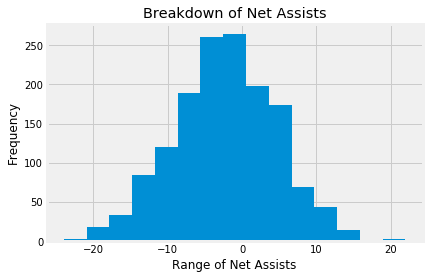

In [663]:
#Here is a histogram for Net_AST 

hornets.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

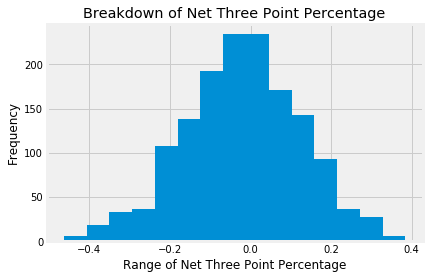

In [664]:
#Here is a histogram for Net_3P% 

hornets.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

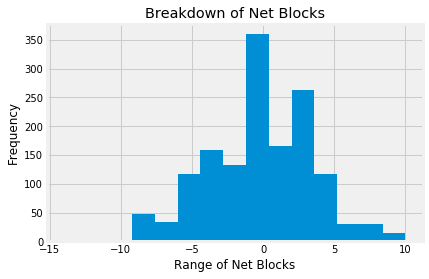

In [665]:
#Here is a histogram for Net_BLK 

hornets.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

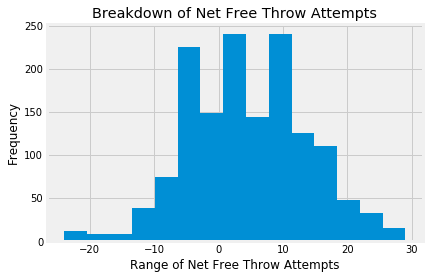

In [666]:
#Here is a histogram for Net_FTA 

hornets.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

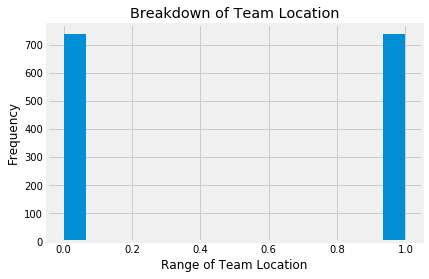

In [667]:
#Here is a histogram for teamLoc_Home 

hornets.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

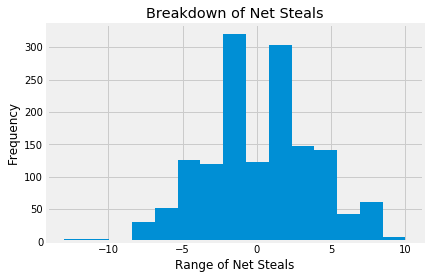

In [668]:
#Here is a histogram for Net_STL 

hornets.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

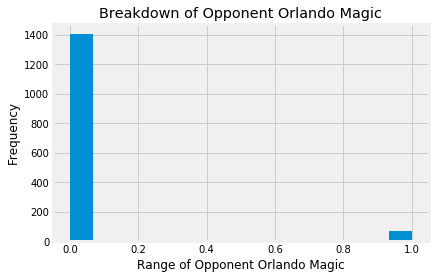

In [669]:
#Here is a histogram for opptAbbr_ORL 

hornets.loc[:,"opptAbbr_ORL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Orlando Magic")
plt.title("Breakdown of Opponent Orlando Magic");

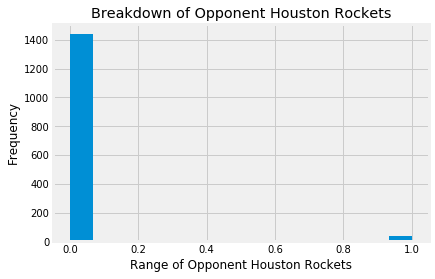

In [670]:
#Here is a histogram for opptAbbr_HOU 

hornets.loc[:,"opptAbbr_HOU"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Houston Rockets")
plt.title("Breakdown of Opponent Houston Rockets");

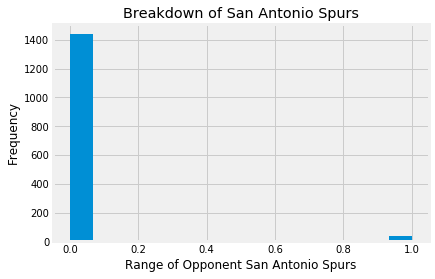

In [671]:
#Here is a histogram for opptAbbr_SA 

hornets.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of San Antonio Spurs");

#### Indiana Pacers

In [672]:
pacers = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'IND']

In [673]:
pacers.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
24,IND,0,4,9,-9,2,-2,-13,0.1118,-7,...,0,0,0,0,0,0,0,0,0,0
25,IND,0,4,9,-9,2,-2,-13,0.1118,-7,...,0,0,0,0,0,0,0,0,0,0
26,IND,0,4,9,-9,2,-2,-13,0.1118,-7,...,0,0,0,0,0,0,0,0,0,0
84,IND,2,1,8,-5,-4,-7,-2,0.0329,-9,...,0,0,0,0,0,0,0,0,0,0
85,IND,2,1,8,-5,-4,-7,-2,0.0329,-9,...,0,0,0,0,0,0,0,0,0,0


In [674]:
pacers.shape

(1473, 130)

In [675]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Pacers

pacers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.674517
Net_AST                          0.469612
Net_TRB                          0.404470
Net_3P%                          0.394588
teamLoc_Home                     0.252462
Net_FTA                          0.251541
Net_STL                          0.223238
Net_BLK                          0.170721
opptAbbr_ORL                     0.124094
Net_Day_Off                      0.115295
opptAbbr_PHI                     0.083474
opptAbbr_DET                     0.065019
opptAbbr_NO                      0.058703
opptAbbr_BKN                     0.050530
Off_Name_BrentBarnaky            0.047732
opptAbbr_NY                      0.042854
Off_Name_EddieRush               0.039543
Off_Name_BillSpooner             0.035936
Off_Name_TylerFord               0.034208
Off_Name_BrettNansel             0.033474
Off_Name_BillKennedy             0.032899
Off_Name_JasonGoldenberg         0.032276
opptAbbr_LAC                     0

In [676]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the pacers subset to only those variables with .1 or greater correlation

pacers = pacers.drop(['Off_Name_RandyRichardson','Off_Name_MattMyers','Off_Name_BrendaPantoja', 'opptAbbr_IND',
                                  'opptAbbr_SA', 'Off_Name_SeanWright', 'Net_2PA', 'Off_Name_StevenAnderson',
                                  'Off_Name_ScottWall','Off_Name_MichaelSmith','opptAbbr_OKC', 'opptAbbr_GS', 
                                  'Off_Name_C.J.Washington', 'Net_3PA', 'Off_Name_LeonWood', 'Off_Name_JamesCapers',
                                  'opptAbbr_BOS','Off_Name_MikeCallahan','Off_Name_KenMauer', 'Off_Name_ScottBolnick',
                                  'Off_Name_BrandonAdair', 'Off_Name_PhenizeeRansom', 'Off_Name_VladimirVoyard-Tadal',
                                  'Off_Name_HaywoodeWorkman', 'Off_Name_JonathanSterling', 'Off_Name_SeanCorbin', 
                                  'Off_Name_TomWashington', 'Off_Name_EdMalloy', 'opptAbbr_LAL', 'opptAbbr_SAC',
                                  'opptAbbr_LAC', 'Off_Name_JasonGoldenberg', 'Off_Name_BillKennedy', 'Off_Name_BrettNansel',
                                  'Off_Name_TylerFord','Off_Name_BillSpooner','Off_Name_EddieRush', 'opptAbbr_NY',
                                  'Off_Name_BrentBarnaky', 'opptAbbr_BKN', 'opptAbbr_NO', 'opptAbbr_DET', 'opptAbbr_PHI'
                                  ], axis = 'columns')

In [677]:
pacers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.674517
Net_AST                        0.469612
Net_TRB                        0.404470
Net_3P%                        0.394588
teamLoc_Home                   0.252462
Net_FTA                        0.251541
Net_STL                        0.223238
Net_BLK                        0.170721
opptAbbr_ORL                   0.124094
Net_Day_Off                    0.115295
Off_Name_JoeDeRosa             0.027533
Off_Name_BenTaylor             0.027222
opptAbbr_MIL                   0.026900
Off_Name_RonGarretson          0.026092
Off_Name_MaratKogut            0.025444
Off_Name_DavidJones            0.024012
Off_Name_KippKissinger         0.022815
Off_Name_SirAllenConner        0.022815
Off_Name_KevinFehr             0.022815
Off_Name_RayAcosta             0.022815
Off_Name_DickBavetta           0.020649
Off_Name_EliRoe                0.020563
Off_Name_J.T.Orr               0.019840
Off_Name_DerrickCollins        0.019569


In [678]:
pacers = pacers.drop(['Off_Name_KevinScott','opptAbbr_MEM','opptAbbr_HOU', 'Off_Name_TreMaddox', 'Off_Name_JoeCrawford',
                                  'Off_Name_VioletPalmer', 'opptAbbr_WAS', 'Off_Name_LeroyRichardson', 
                                  'Off_Name_CourtneyKirkland', 'Off_Name_TonyBrothers', 'Off_Name_DerekRichardson',
                                  'Off_Name_GediminasPetraitis','Off_Name_DerrickStafford','Off_Name_KarlLane', 
                                  'opptAbbr_CHI', 'Off_Name_NickBuchert', 'Off_Name_DanCrawford', 'opptAbbr_CHA',
                                  'opptAbbr_MIA', 'Off_Name_TonyBrown', 'Off_Name_RodneyMott', 'Off_Name_JustinVan Duyne',
                                  'Off_Name_MarkAyotte','Off_Name_JasonPhillips','Off_Name_JoshTiven', 'Off_Name_ZachZarba',
                                  'Off_Name_BennieAdams', 'Off_Name_OlandisPoole', 'Off_Name_JacynGoble',
                                  'Off_Name_DerrickCollins', 'Off_Name_J.T.Orr', 'Off_Name_EliRoe', 
                                  'Off_Name_DickBavetta', 'Off_Name_RayAcosta', 'Off_Name_KevinFehr', 'Off_Name_MaratKogut',
                                  'Off_Name_SirAllenConner', 'Off_Name_KippKissinger', 'Off_Name_DavidJones',
                                  'Off_Name_RonGarretson', 'opptAbbr_MIL', 'Off_Name_BenTaylor', 'Off_Name_JoeDeRosa',
                                  ], axis = 'columns')

In [679]:
pacers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.674517
Net_AST                      0.469612
Net_TRB                      0.404470
Net_3P%                      0.394588
teamLoc_Home                 0.252462
Net_FTA                      0.251541
Net_STL                      0.223238
Net_BLK                      0.170721
opptAbbr_ORL                 0.124094
Net_Day_Off                  0.115295
Off_Name_EricDalen           0.012435
Off_Name_MattBoland          0.010801
Off_Name_MontyMcCutchen      0.010801
Off_Name_PatFraher           0.008286
opptAbbr_CLE                 0.007841
Off_Name_MarcDavis           0.007279
Off_Name_ScottTwardoski      0.006919
Off_Name_JamesWilliams       0.006919
Off_Name_JohnGoble           0.005723
opptAbbr_MIN                 0.005475
opptAbbr_UTA                 0.005475
opptAbbr_PHO                 0.005475
opptAbbr_DAL                 0.005475
Off_Name_LaurenHoltkamp      0.004806
Off_Name_MarkLindsay         0.004276
Off_Name_Bri

In [680]:
pacers = pacers.drop(['Off_Name_DedricTaylor','Off_Name_EricDalen','Off_Name_MattBoland', 'Off_Name_MontyMcCutchen',
                                  'Off_Name_PatFraher', 'opptAbbr_CLE', 'Off_Name_MarcDavis', 'Off_Name_ScottTwardoski',
                                  'Off_Name_JamesWilliams', 'Off_Name_JohnGoble', 'opptAbbr_MIN', 'opptAbbr_UTA',
                                  'opptAbbr_PHO', 'opptAbbr_DAL', 'Off_Name_LaurenHoltkamp', 'Off_Name_MarkLindsay',
                                  'Off_Name_BrianForte','Off_Name_ScottFoster','Off_Name_DavidGuthrie', 
                                  'Off_Name_CurtisBlair', 'Off_Name_KaneFitzgerald', 'Off_Name_EricLewis', 
                                  'Off_Name_GaryZielinski', 'Off_Name_KevinCutler', 'Off_Name_BennettSalvatore',
                                  'Off_Name_MitchellErvin'], axis = 'columns')

In [681]:
pacers.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.674517
Net_AST         0.469612
Net_TRB         0.404470
Net_3P%         0.394588
teamLoc_Home    0.252462
Net_FTA         0.251541
Net_STL         0.223238
Net_BLK         0.170721
opptAbbr_ORL    0.124094
Net_Day_Off     0.115295
opptAbbr_POR   -0.100982
opptAbbr_DEN   -0.100982
Net_FGA        -0.108352
opptAbbr_TOR   -0.108383
Net_TO         -0.182982
Net_Fouls      -0.217830
Name: teamRslt_Win, dtype: float64

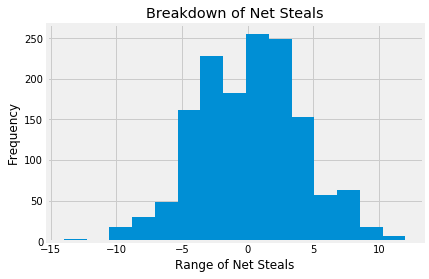

In [682]:
#Here is a histogram for Net_STL 

pacers.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

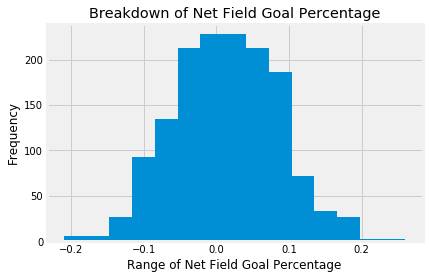

In [683]:
#Here is a histogram for Net_FG%

pacers.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

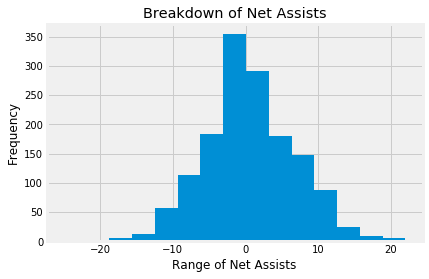

In [684]:
#Here is a histogram for Net_AST 

pacers.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

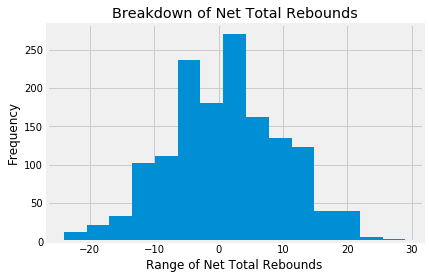

In [685]:
#Here is a histogram for Net_TRB 

pacers.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

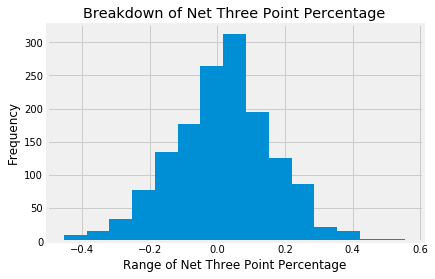

In [686]:
#Here is a histogram for Net_3P% 

pacers.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

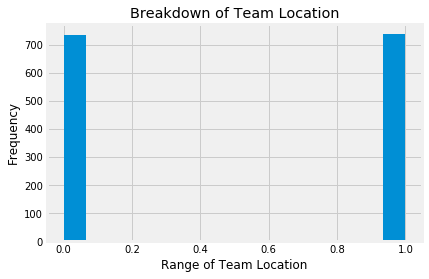

In [687]:
#Here is a histogram for teamLoc_Home 

pacers.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

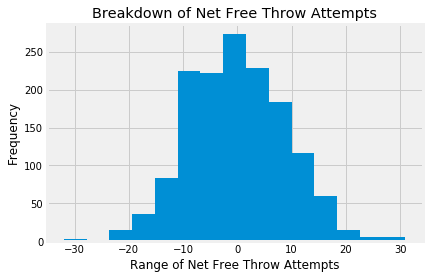

In [688]:
#Here is a histogram for Net_FTA 

pacers.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

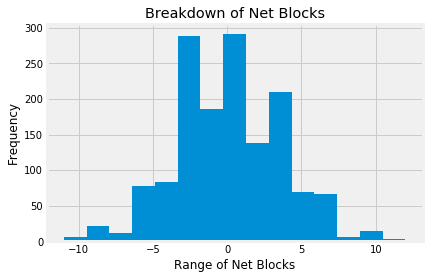

In [689]:
#Here is a histogram for Net_BLK 

pacers.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

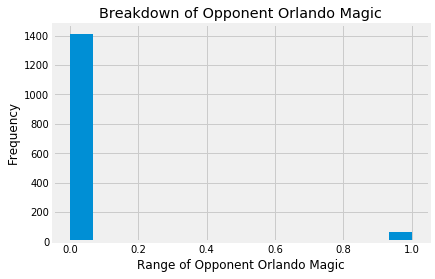

In [690]:
#Here is a histogram for opptAbbr_ORL 

pacers.loc[:,"opptAbbr_ORL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Orlando Magic")
plt.title("Breakdown of Opponent Orlando Magic");

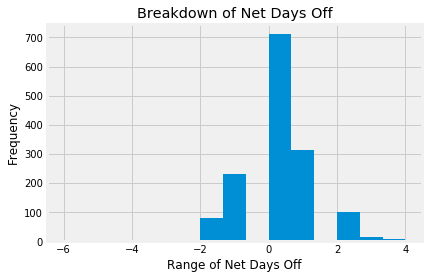

In [691]:
#Here is a histogram for Net_Day_Off 

pacers.loc[:,"Net_Day_Off"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Days Off")
plt.title("Breakdown of Net Days Off");

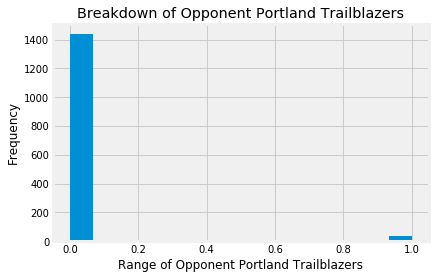

In [692]:
#Here is a histogram for opptAbbr_POR 

pacers.loc[:,"opptAbbr_POR"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Portland Trailblazers")
plt.title("Breakdown of Opponent Portland Trailblazers");

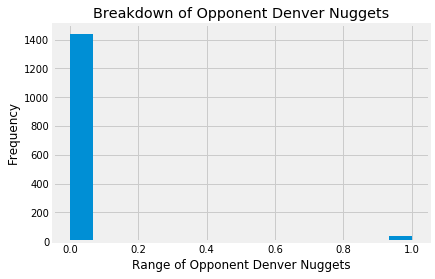

In [693]:
#Here is a histogram for opptAbbr_DEN 

pacers.loc[:,"opptAbbr_DEN"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Denver Nuggets")
plt.title("Breakdown of Opponent Denver Nuggets");

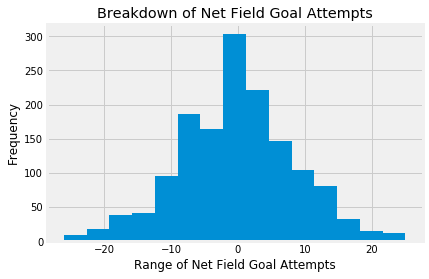

In [694]:
#Here is a histogram for Net_FGA 

pacers.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

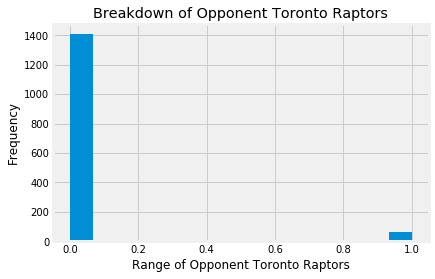

In [695]:
#Here is a histogram for opptAbbr_TOR

pacers.loc[:,"opptAbbr_TOR"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent Toronto Raptors")
plt.title("Breakdown of Opponent Toronto Raptors");

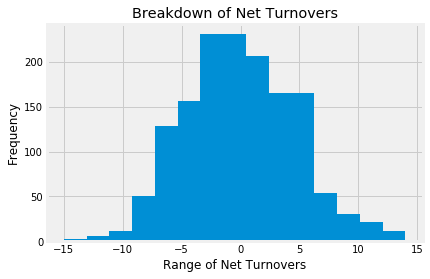

In [696]:
#Here is a histogram for Net_TO 

pacers.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

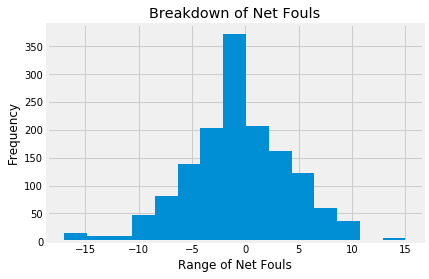

In [697]:
#Here is a histogram for Net_Fouls 

pacers.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

#### Boston Celtics

In [698]:
celtics = box_score.loc[box_score.loc[:, 'teamAbbr'] == 'BOS']

In [699]:
celtics.head()

,teamAbbr,Net_Day_Off,Net_AST,Net_TO,Net_STL,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,...,Off_Name_SirAllenConner,Off_Name_StevenAnderson,Off_Name_TomWashington,Off_Name_TonyBrothers,Off_Name_TonyBrown,Off_Name_TreMaddox,Off_Name_TylerFord,Off_Name_VioletPalmer,Off_Name_VladimirVoyard-Tadal,Off_Name_ZachZarba
6,BOS,0,-1,8,-4,-3,3,-4,-0.0243,-1,...,0,0,0,0,0,0,0,0,0,0
7,BOS,0,-1,8,-4,-3,3,-4,-0.0243,-1,...,0,0,0,0,0,0,0,0,0,0
8,BOS,0,-1,8,-4,-3,3,-4,-0.0243,-1,...,0,0,0,0,0,0,0,0,0,0
93,BOS,3,-4,-1,-3,-1,1,-12,-0.0192,-8,...,0,0,0,0,0,0,0,0,0,0
94,BOS,3,-4,-1,-3,-1,1,-12,-0.0192,-8,...,0,0,0,0,0,0,0,1,0,0


In [700]:
celtics.shape

(1473, 130)

In [701]:
#Here is how each of the independent variables in my dataset correlate to wins and losses for the Celtics

celtics.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                     1.000000
Net_FG%                          0.641771
Net_AST                          0.449716
Net_3P%                          0.424622
Net_TRB                          0.332919
Net_BLK                          0.201706
Net_FTA                          0.160959
teamLoc_Home                     0.147774
Net_STL                          0.141483
opptAbbr_ORL                     0.084368
opptAbbr_PHI                     0.079702
opptAbbr_CHA                     0.076838
opptAbbr_UTA                     0.068866
Off_Name_BrianForte              0.060566
Off_Name_PatFraher               0.059184
Off_Name_EliRoe                  0.058781
opptAbbr_DEN                     0.042429
opptAbbr_MIN                     0.042429
opptAbbr_SAC                     0.042429
opptAbbr_PHO                     0.042429
Off_Name_C.J.Washington          0.042292
opptAbbr_BKN                     0.041837
opptAbbr_NY                      0.041837
Off_Name_TreMaddox               0

In [702]:
#My cutoff rate is going to be variables less than .1 correlated (positive or negative) with wins

#Here I am adjusting the celtics subset to only those variables with .1 or greater correlation

celtics = celtics.drop(['Off_Name_SirAllenConner','Off_Name_MattMyers','Off_Name_RandyRichardson', 'Off_Name_PhenizeeRansom',
                                  'Off_Name_BrendaPantoja', 'Off_Name_KippKissinger', 'Off_Name_JonathanSterling',
                                  'opptAbbr_BOS','Net_2PA','opptAbbr_HOU', 'Off_Name_SeanWright', 'opptAbbr_OKC',
                                  'opptAbbr_LAC','opptAbbr_GS','Off_Name_RonGarretson', 'opptAbbr_TOR', 'Net_Day_Off',
                                  'Off_Name_ScottWall', 'Off_Name_KevinFehr', 'opptAbbr_NO', 'opptAbbr_DAL', 'Net_3PA',
                                  'Off_Name_MarkAyotte', 'Off_Name_MarcDavis', 'Off_Name_VioletPalmer', 'opptAbbr_CHI',
                                  'Off_Name_StevenAnderson', 'Off_Name_MikeCallahan', 'Off_Name_JamesWilliams', 
                                  'Off_Name_JacynGoble', 'Off_Name_EddieRush', 'Off_Name_VladimirVoyard-Tadal',
                                  'Off_Name_TreMaddox','opptAbbr_NY','opptAbbr_BKN', 'Off_Name_C.J.Washington', 'opptAbbr_PHO',
                                  'opptAbbr_SAC', 'opptAbbr_MIN', 'opptAbbr_DEN', 'Off_Name_EliRoe', 'Off_Name_PatFraher',
                                  'Off_Name_BrianForte', 'opptAbbr_UTA', 'opptAbbr_CHA', 'opptAbbr_PHI', 'opptAbbr_ORL',
                                  ], axis = 'columns')

In [703]:
celtics.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                 1.000000
Net_FG%                      0.641771
Net_AST                      0.449716
Net_3P%                      0.424622
Net_TRB                      0.332919
Net_BLK                      0.201706
Net_FTA                      0.160959
teamLoc_Home                 0.147774
Net_STL                      0.141483
Off_Name_JoeDeRosa           0.024401
Off_Name_ScottBolnick        0.024401
Off_Name_BennieAdams         0.022604
Off_Name_JohnGoble           0.022155
Off_Name_BennettSalvatore    0.021018
Off_Name_DerekRichardson     0.017430
Off_Name_NickBuchert         0.017430
Off_Name_GaryZielinski       0.017430
Off_Name_J.T.Orr             0.016342
opptAbbr_MIA                 0.016313
Off_Name_MaratKogut          0.014024
Off_Name_JoshTiven           0.013003
Off_Name_MontyMcCutchen      0.013003
Off_Name_DickBavetta         0.011115
Off_Name_MarkLindsay         0.010743
Off_Name_LeonWood            0.010545
Off_Name_BrentBarnaky        0.008152
Off_Name_Bil

In [704]:
celtics = celtics.drop(['Off_Name_KevinCutler','Off_Name_JasonGoldenberg','Off_Name_BrandonAdair', 'Off_Name_DavidJones',
                                  'Off_Name_RodneyMott', 'Off_Name_EdMalloy', 'Off_Name_EricDalen', 'opptAbbr_CLE',
                                  'Off_Name_SeanCorbin','Off_Name_HaywoodeWorkman','Off_Name_EricLewis', 'opptAbbr_MIL',
                                  'Off_Name_JamesCapers', 'opptAbbr_POR', 'Off_Name_KaneFitzgerald', 'Off_Name_KevinScott',
                                  'Off_Name_CourtneyKirkland','Off_Name_MattBoland','Off_Name_JustinVan Duyne', 
                                  'Off_Name_JoeCrawford', 'opptAbbr_LAL', 'opptAbbr_MEM', 'Off_Name_TomWashington',
                                  'Off_Name_ScottFoster', 'Off_Name_JasonPhillips', 'Off_Name_KarlLane', 
                                  'Off_Name_TonyBrothers', 'Off_Name_DerrickCollins', 'Off_Name_DavidGuthrie',
                                  'Off_Name_BillKennedy', 'Off_Name_BrentBarnaky', 'Off_Name_LeonWood', 'Off_Name_MarkLindsay',
                                  'Off_Name_DickBavetta', 'Off_Name_MontyMcCutchen', 'Off_Name_JoshTiven', 
                                  'Off_Name_MaratKogut', 'opptAbbr_MIA', 'Off_Name_J.T.Orr', 'Off_Name_GaryZielinski',
                                  'Off_Name_NickBuchert', 'Off_Name_DerekRichardson', 'Off_Name_BennettSalvatore', 
                                  'Off_Name_JohnGoble', 'Off_Name_BennieAdams', 'Off_Name_ScottBolnick', 'Off_Name_JoeDeRosa'
                                  ], axis = 'columns')

In [705]:
celtics.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win                   1.000000
Net_FG%                        0.641771
Net_AST                        0.449716
Net_3P%                        0.424622
Net_TRB                        0.332919
Net_BLK                        0.201706
Net_FTA                        0.160959
teamLoc_Home                   0.147774
Net_STL                        0.141483
opptAbbr_WAS                   0.005439
Off_Name_TonyBrown             0.005340
Off_Name_ScottTwardoski        0.004015
Off_Name_DerrickStafford       0.003092
Off_Name_GediminasPetraitis    0.002178
Off_Name_OlandisPoole          0.002178
Off_Name_KenMauer              0.001487
Off_Name_TylerFord             0.001047
Off_Name_DedricTaylor          0.001047
Off_Name_MitchellErvin         0.001047
Off_Name_LeroyRichardson       0.000778
Off_Name_BillSpooner          -0.002197
Off_Name_BrettNansel          -0.002433
Off_Name_RayAcosta            -0.002433
Off_Name_BenTaylor            -0.002824
Off_Name_CurtisBlair          -0.002824


In [706]:
celtics = celtics.drop(['opptAbbr_WAS','Off_Name_TonyBrown','Off_Name_ScottTwardoski', 'Off_Name_DerrickStafford',
                                  'Off_Name_GediminasPetraitis', 'Off_Name_OlandisPoole', 'Off_Name_KenMauer', 
                                  'Off_Name_TylerFord', 'Off_Name_DedricTaylor', 'Off_Name_MitchellErvin', 'Off_Name_ZachZarba',
                                  'Off_Name_LeroyRichardson','Off_Name_BillSpooner','Off_Name_BrettNansel', 'opptAbbr_IND',
                                  'Off_Name_RayAcosta', 'Off_Name_BenTaylor', 'Off_Name_CurtisBlair', 'opptAbbr_DET',
                                  'Off_Name_LaurenHoltkamp', 'Off_Name_DanCrawford', 'Off_Name_MichaelSmith' 
                                  ], axis = 'columns')

In [707]:
celtics.corr().loc[:, 'teamRslt_Win'].sort_values(ascending=False)

teamRslt_Win    1.000000
Net_FG%         0.641771
Net_AST         0.449716
Net_3P%         0.424622
Net_TRB         0.332919
Net_BLK         0.201706
Net_FTA         0.160959
teamLoc_Home    0.147774
Net_STL         0.141483
Net_FGA        -0.117794
opptAbbr_SA    -0.142632
Net_TO         -0.167974
Net_Fouls      -0.174323
Name: teamRslt_Win, dtype: float64

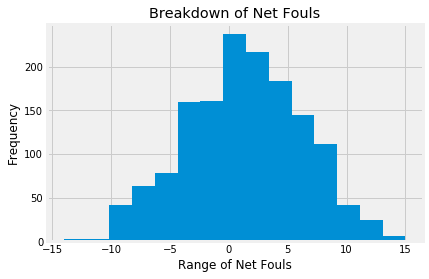

In [708]:
#Here is a histogram for Net_Fouls 

celtics.loc[:,"Net_Fouls"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Fouls")
plt.title("Breakdown of Net Fouls");

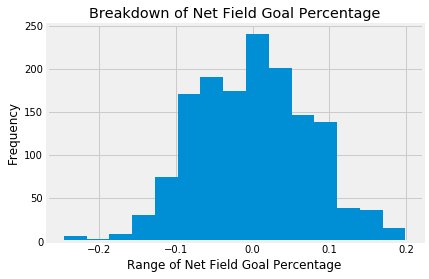

In [709]:
#Here is a histogram for Net_FG%

celtics.loc[:,"Net_FG%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Percentage")
plt.title("Breakdown of Net Field Goal Percentage");

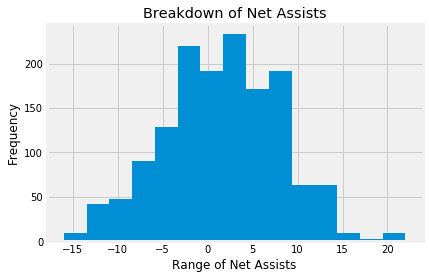

In [710]:
#Here is a histogram for Net_AST 

celtics.loc[:,"Net_AST"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Assists")
plt.title("Breakdown of Net Assists");

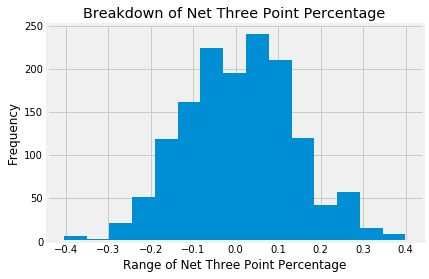

In [711]:
#Here is a histogram for Net_3P% 

celtics.loc[:,"Net_3P%"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Three Point Percentage")
plt.title("Breakdown of Net Three Point Percentage");

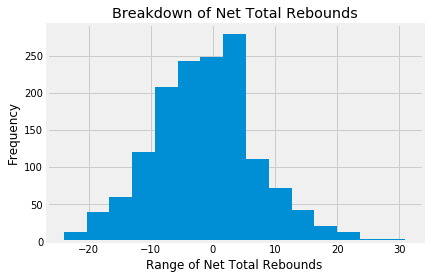

In [712]:
#Here is a histogram for Net_TRB 

celtics.loc[:,"Net_TRB"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Total Rebounds")
plt.title("Breakdown of Net Total Rebounds");

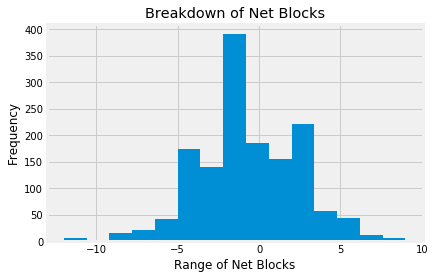

In [713]:
#Here is a histogram for Net_BLK 

celtics.loc[:,"Net_BLK"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Blocks")
plt.title("Breakdown of Net Blocks");

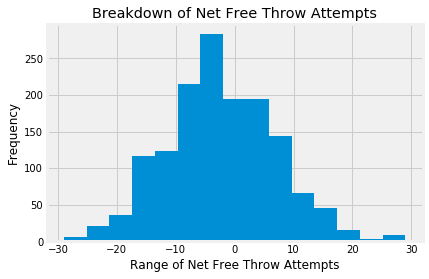

In [714]:
#Here is a histogram for Net_FTA 

celtics.loc[:,"Net_FTA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Free Throw Attempts")
plt.title("Breakdown of Net Free Throw Attempts");

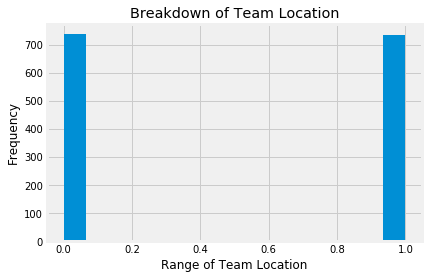

In [715]:
#Here is a histogram for teamLoc_Home 

celtics.loc[:,"teamLoc_Home"].plot(kind='hist', bins=15)
plt.xlabel("Range of Team Location")
plt.title("Breakdown of Team Location");

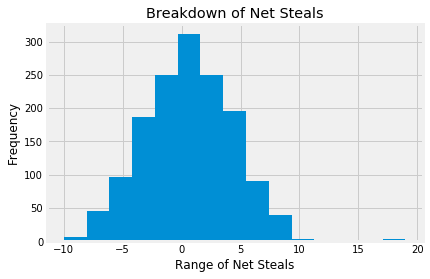

In [716]:
#Here is a histogram for Net_STL 

celtics.loc[:,"Net_STL"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Steals")
plt.title("Breakdown of Net Steals");

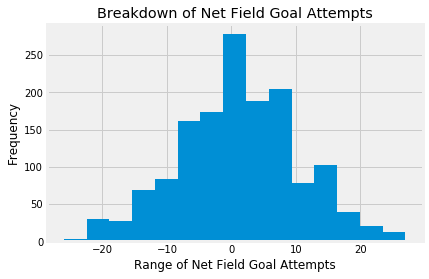

In [717]:
#Here is a histogram for Net_FGA 

celtics.loc[:,"Net_FGA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Field Goal Attempts")
plt.title("Breakdown of Net Field Goal Attempts");

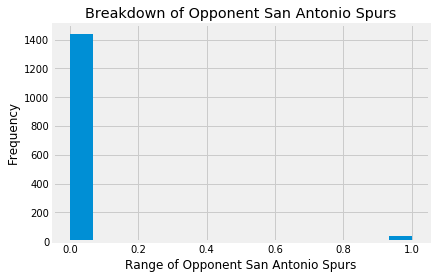

In [718]:
#Here is a histogram for opptAbbr_SA 

celtics.loc[:,"opptAbbr_SA"].plot(kind='hist', bins=15)
plt.xlabel("Range of Opponent San Antonio Spurs")
plt.title("Breakdown of Opponent San Antonio Spurs");

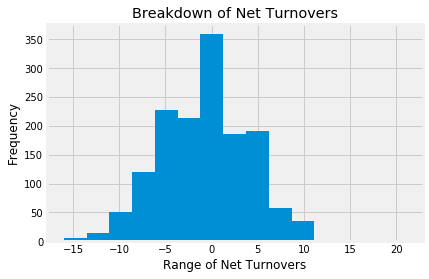

In [719]:
#Here is a histogram for Net_TO 

celtics.loc[:,"Net_TO"].plot(kind='hist', bins=15)
plt.xlabel("Range of Net Turnovers")
plt.title("Breakdown of Net Turnovers");

# Correlation In-Depth

#### Denver Nuggets

In [720]:
#Here I am just affirming the remaining columns in the nuggets subset

nuggets.columns

Index(['teamAbbr', 'Net_Day_Off', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK',
       'Net_Fouls', 'Net_FGA', 'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_LAL', 'opptAbbr_MIL',
       'opptAbbr_SA'],
      dtype='object')

In [721]:
#Here I am checking how many columns there are

nuggets.shape

(1478, 17)

In [722]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

nugs_1 = nuggets.iloc[:, 0:12]

In [723]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

nugs_2 = nuggets.iloc[:, 12:18]

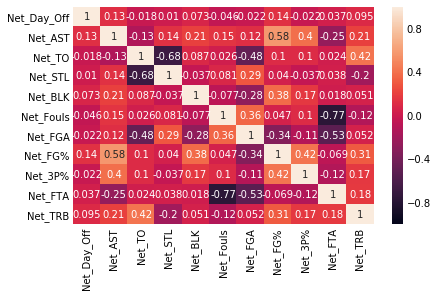

In [724]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the nuggets subset

ax = sns.heatmap(nugs_1.corr(), vmin = -1, vmax = 1, annot=True)

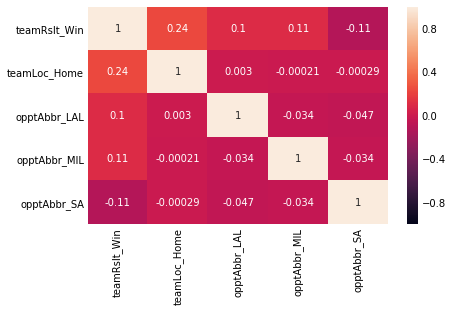

In [725]:
#Here is the second heatmap to check for collinearity
#Doesn't look like there are any variables to worry about

ax = sns.heatmap(nugs_2.corr(), vmin = -1, vmax = 1, annot=True)

In [726]:
#Here I am officially dropping Net Steals from the nuggets subset

nuggets = nuggets.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

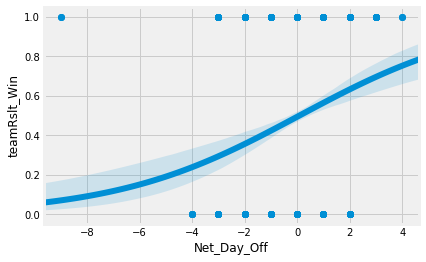

In [727]:
#Scatter Plot for Net_Day_Off


sns.regplot(x='Net_Day_Off', y='teamRslt_Win', data=nuggets, logistic=True)

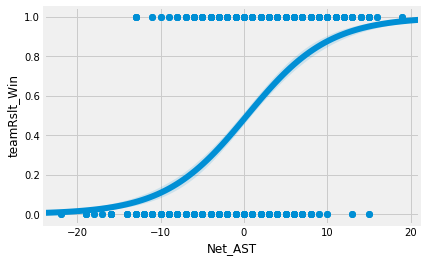

In [728]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=nuggets, logistic=True)

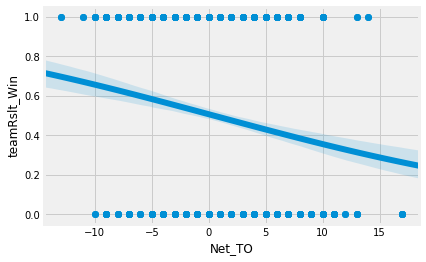

In [729]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=nuggets, logistic=True)

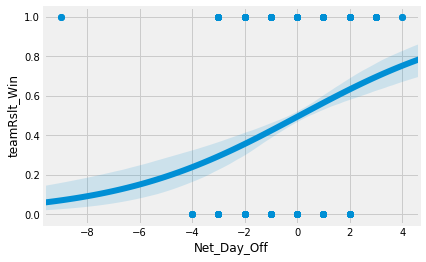

In [730]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_Day_Off', y='teamRslt_Win', data=nuggets, logistic=True)

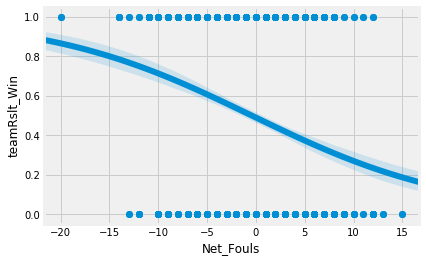

In [731]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=nuggets, logistic=True)

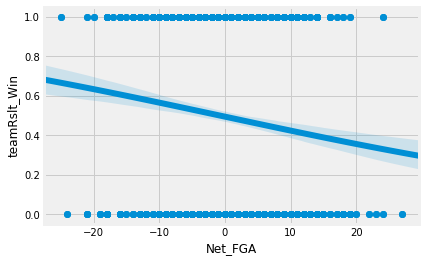

In [732]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=nuggets, logistic=True)

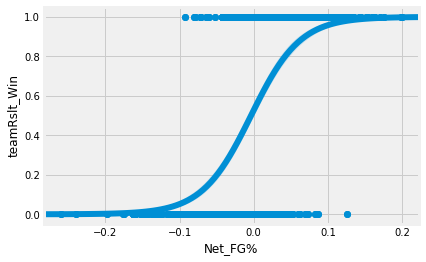

In [733]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=nuggets, logistic=True)

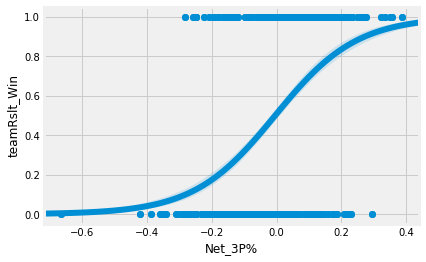

In [734]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=nuggets, logistic=True)

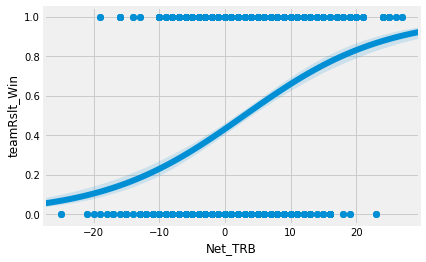

In [735]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=nuggets, logistic=True)

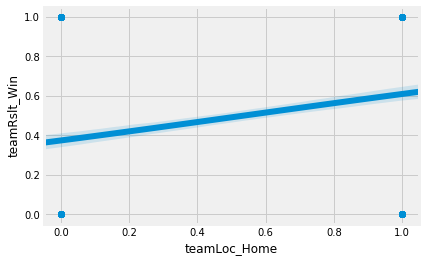

In [736]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=nuggets, logistic=True)

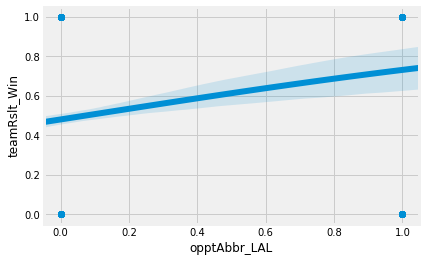

In [737]:
#Scatter Plot for opptAbbr_LAL


sns.regplot(x='opptAbbr_LAL', y='teamRslt_Win', data=nuggets, logistic=True)

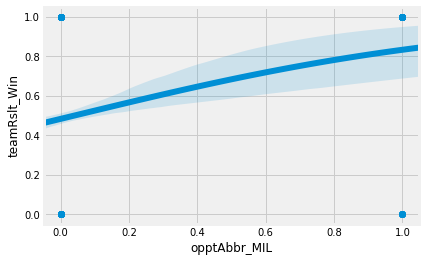

In [738]:
#Scatter Plot for opptAbbr_MIL


sns.regplot(x='opptAbbr_MIL', y='teamRslt_Win', data=nuggets, logistic=True)

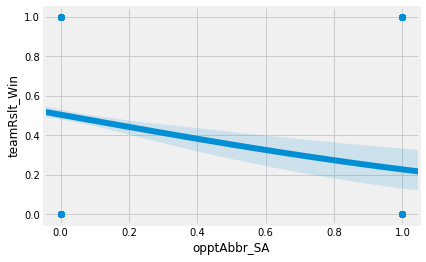

In [739]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=nuggets, logistic=True)

#### Minnesota Timberwolves

In [740]:
#Here I am just affirming the remaining columns in the timberwolves subset

timberwolves.columns

Index(['teamAbbr', 'Net_Day_Off', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK',
       'Net_Fouls', 'Net_FGA', 'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA',
       'Net_TRB', 'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_HOU'],
      dtype='object')

In [741]:
#Here I am checking how many columns there are

timberwolves.shape

(1478, 16)

In [742]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

wolves_1 = timberwolves.iloc[:, 0:12]

In [743]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

wolves_2 = timberwolves.iloc[:, 12:17]

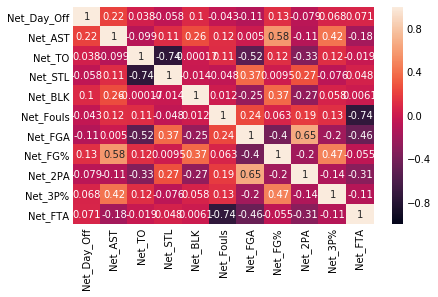

In [744]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the timberwolves subset

ax = sns.heatmap(wolves_1.corr(), vmin = -1, vmax = 1, annot=True)

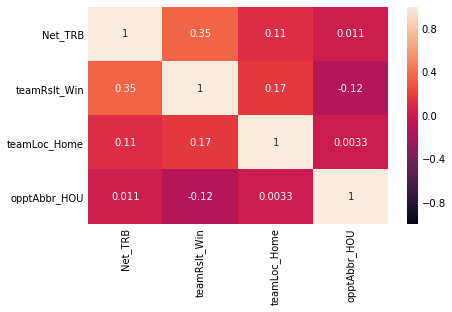

In [745]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(wolves_2.corr(), vmin = -1, vmax = 1, annot=True)

In [746]:
#Here I am officially dropping Net Steals from the timberwolves subset

timberwolves = timberwolves.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

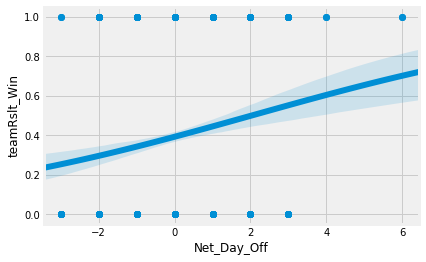

In [747]:
#Scatter Plot for Net_Day_Off


sns.regplot(x='Net_Day_Off', y='teamRslt_Win', data=timberwolves, logistic=True)

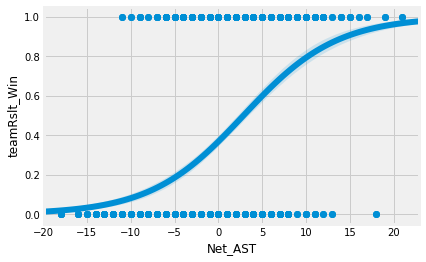

In [748]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=timberwolves, logistic=True)

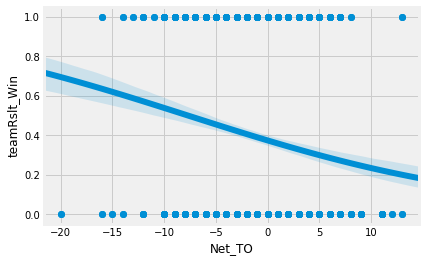

In [749]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=timberwolves, logistic=True)

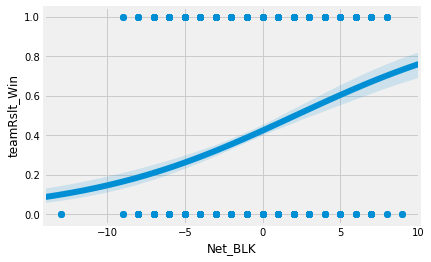

In [750]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=timberwolves, logistic=True)

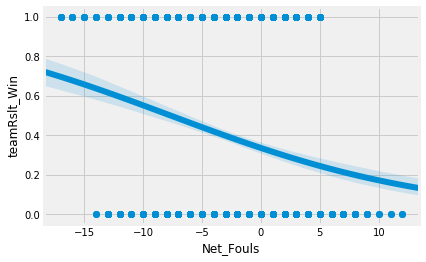

In [751]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=timberwolves, logistic=True)

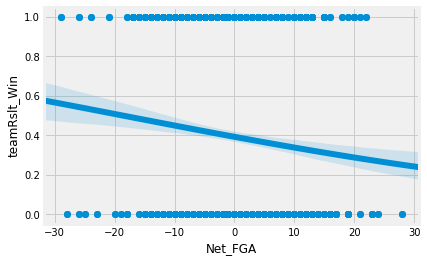

In [752]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=timberwolves, logistic=True)

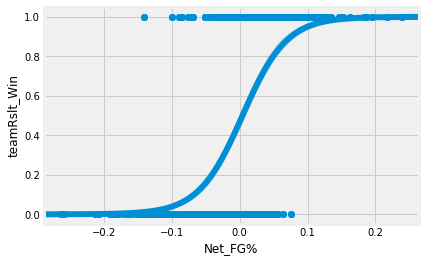

In [753]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=timberwolves, logistic=True)

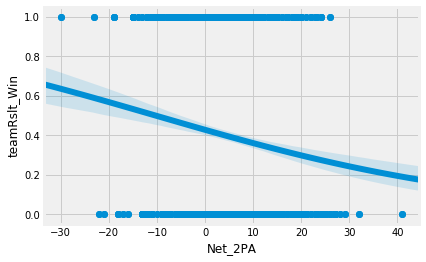

In [754]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=timberwolves, logistic=True)

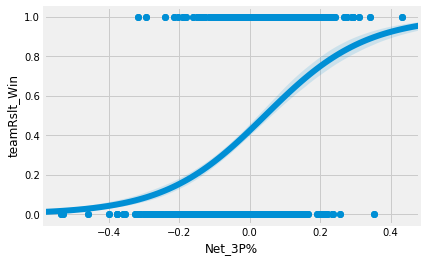

In [755]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=timberwolves, logistic=True)

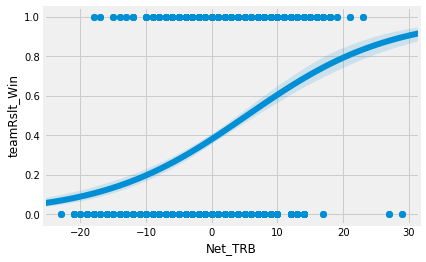

In [756]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=timberwolves, logistic=True)

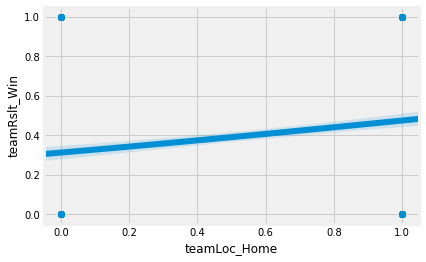

In [757]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=timberwolves, logistic=True)

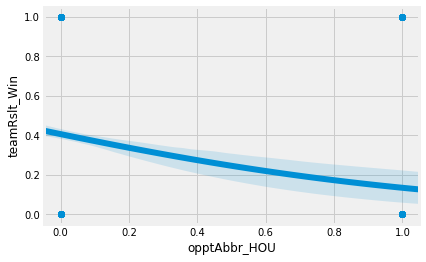

In [758]:
#Scatter Plot for opptAbbr_HOU


sns.regplot(x='opptAbbr_HOU', y='teamRslt_Win', data=timberwolves, logistic=True)

#### Milwaukee Bucks

In [759]:
#Here I am just affirming the remaining columns in the bucks subset

bucks.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_PHI', 'opptAbbr_PHO'],
      dtype='object')

In [760]:
#Here I am checking how many columns there are

bucks.shape

(1477, 14)

In [761]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

bucks_1 = bucks.iloc[:, 0:9]

In [762]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

bucks_2 = bucks.iloc[:, 9:15]

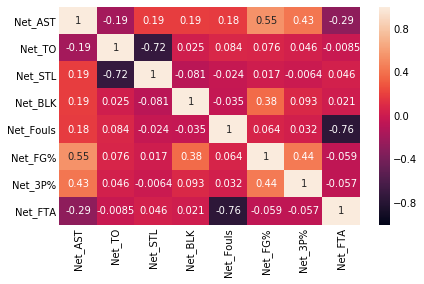

In [763]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the bucks subset

ax = sns.heatmap(bucks_1.corr(), vmin = -1, vmax = 1, annot=True)

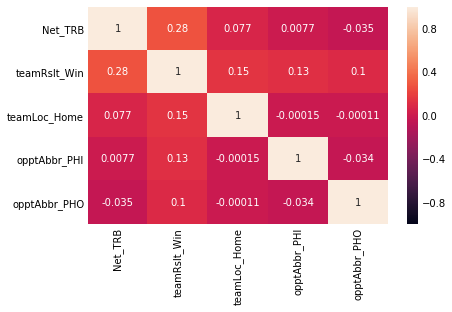

In [764]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(bucks_2.corr(), vmin = -1, vmax = 1, annot=True)

In [765]:
#Here I am officially dropping Net Steals from the bucks subset

bucks = bucks.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

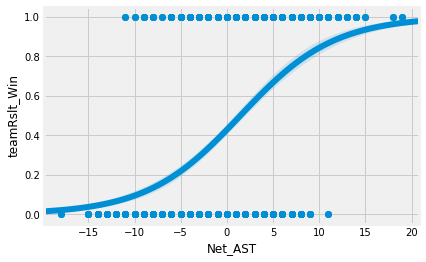

In [766]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=bucks, logistic=True)

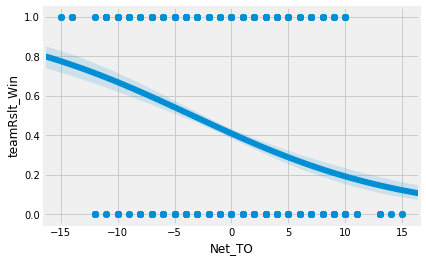

In [767]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=bucks, logistic=True)

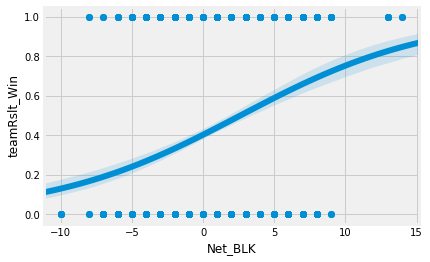

In [768]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=bucks, logistic=True)

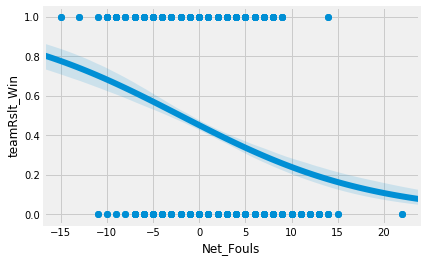

In [769]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=bucks, logistic=True)

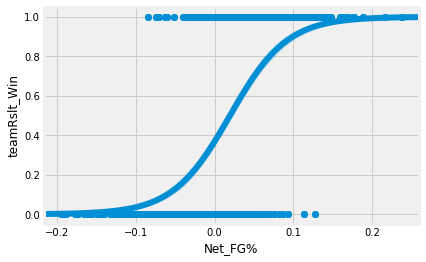

In [770]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=bucks, logistic=True)

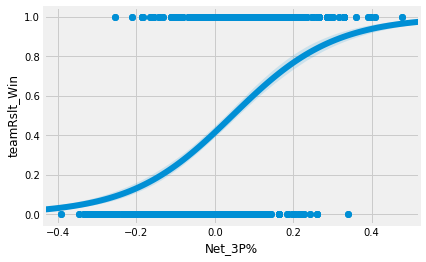

In [771]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=bucks, logistic=True)

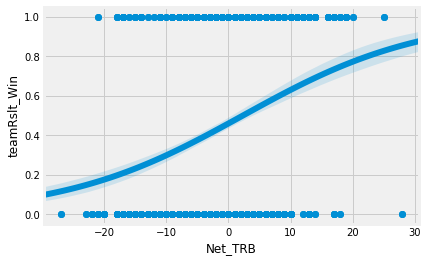

In [772]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=bucks, logistic=True)

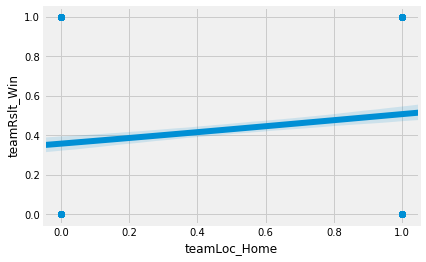

In [773]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=bucks, logistic=True)

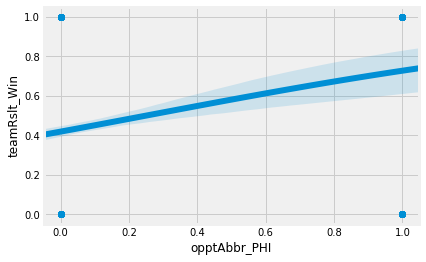

In [774]:
#Scatter Plot for opptAbbr_PHI


sns.regplot(x='opptAbbr_PHI', y='teamRslt_Win', data=bucks, logistic=True)

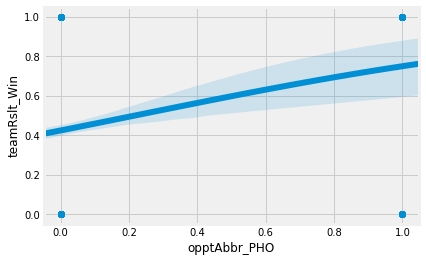

In [775]:
#Scatter Plot for opptAbbr_PHO


sns.regplot(x='opptAbbr_PHO', y='teamRslt_Win', data=bucks, logistic=True)

#### Los Angeles Lakers

In [776]:
#Here I am just affirming the remaining columns in the lakers subset

lakers.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_BKN', 'opptAbbr_DET', 'opptAbbr_LAC'],
      dtype='object')

In [777]:
#Here I am checking how many columns there are

lakers.shape

(1477, 16)

In [778]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

lakers_1 = lakers.iloc[:, 0:11]

In [779]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

lakers_2 = lakers.iloc[:, 11:17]

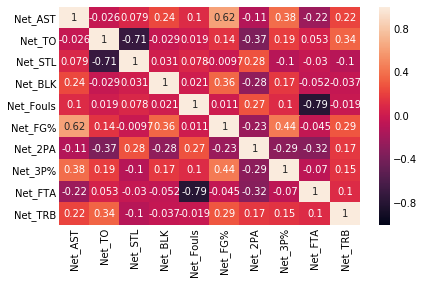

In [780]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the lakers subset

ax = sns.heatmap(lakers_1.corr(), vmin = -1, vmax = 1, annot=True)

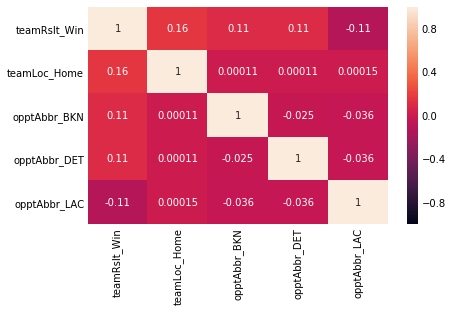

In [781]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(lakers_2.corr(), vmin = -1, vmax = 1, annot=True)

In [782]:
#Here I am officially dropping Net Steals from the lakers subset

lakers = lakers.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

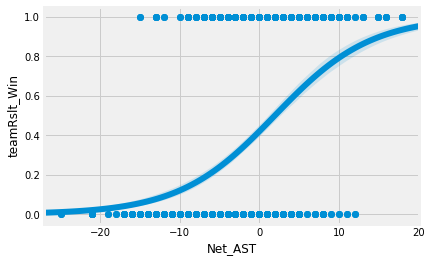

In [783]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=lakers, logistic=True)

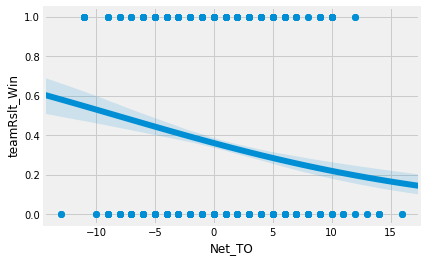

In [784]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=lakers, logistic=True)

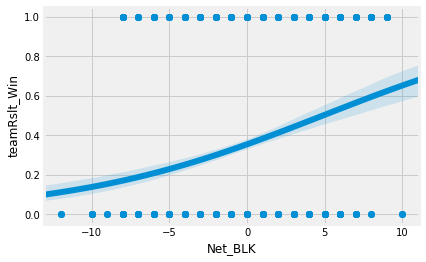

In [785]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=lakers, logistic=True)

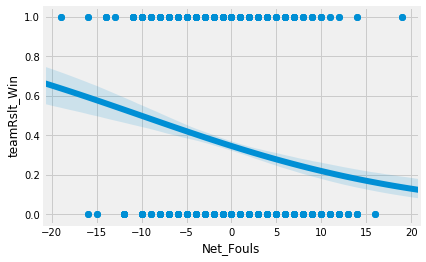

In [786]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=lakers, logistic=True)

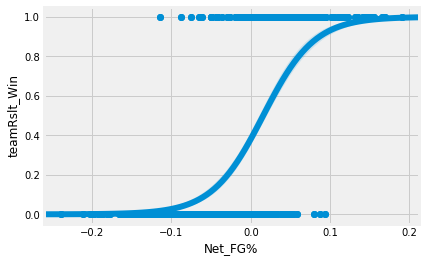

In [787]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=lakers, logistic=True)

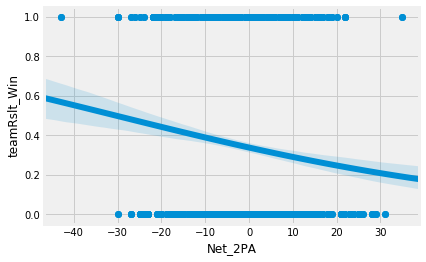

In [788]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=lakers, logistic=True)

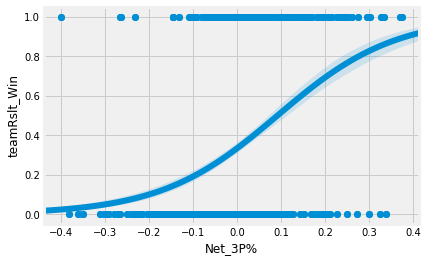

In [789]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=lakers, logistic=True)

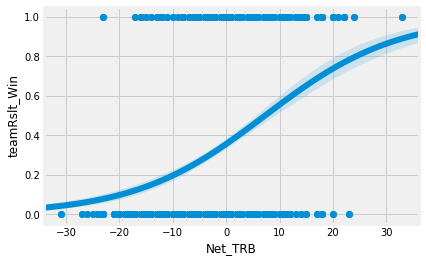

In [790]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=lakers, logistic=True)

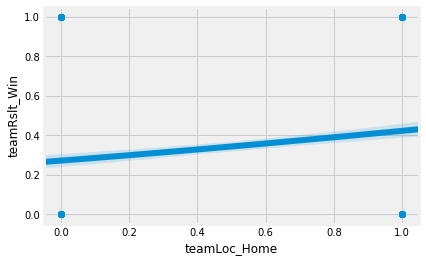

In [791]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=lakers, logistic=True)

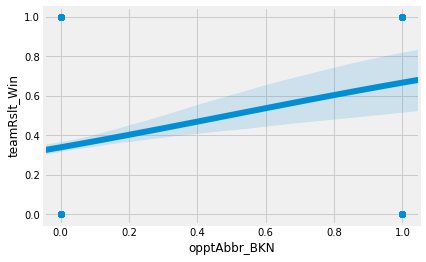

In [792]:
#Scatter Plot for opptAbbr_BKN


sns.regplot(x='opptAbbr_BKN', y='teamRslt_Win', data=lakers, logistic=True)

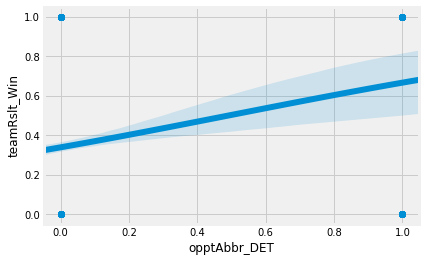

In [793]:
#Scatter Plot for opptAbbr_DET


sns.regplot(x='opptAbbr_DET', y='teamRslt_Win', data=lakers, logistic=True)

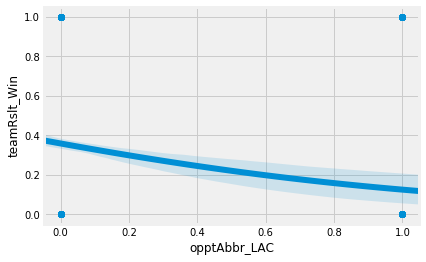

In [794]:
#Scatter Plot for opptAbbr_LAC


sns.regplot(x='opptAbbr_LAC', y='teamRslt_Win', data=lakers, logistic=True)

#### Dallas Mavericks

In [795]:
#Here I am just affirming the remaining columns in the mavericks subset

mavericks.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_LAL',
       'opptAbbr_MIA', 'opptAbbr_SA', 'opptAbbr_WAS'],
      dtype='object')

In [796]:
#Here I am checking how many columns there are

mavericks.shape

(1477, 19)

In [797]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

mavericks_1 = mavericks.iloc[:, 0:11]

In [798]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

mavericks_2 = mavericks.iloc[:, 11:20]

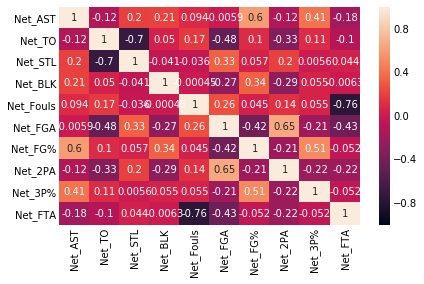

In [799]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the mavericks subset

ax = sns.heatmap(mavericks_1.corr(), vmin = -1, vmax = 1, annot=True)

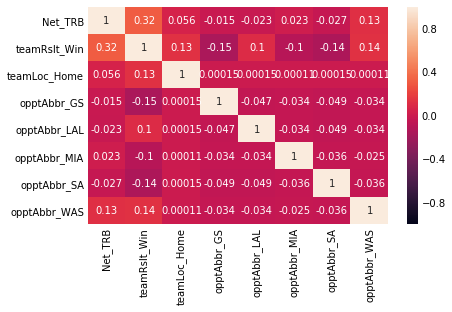

In [800]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(mavericks_2.corr(), vmin = -1, vmax = 1, annot=True)

In [801]:
#Here I am officially dropping Net Steals and Net_FTA from the mavericks subset

mavericks = mavericks.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

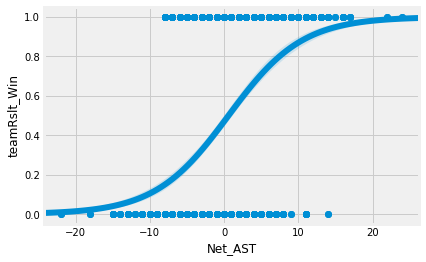

In [802]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=mavericks, logistic=True)

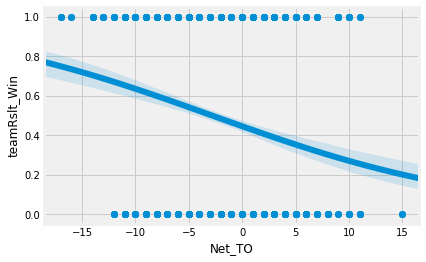

In [803]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=mavericks, logistic=True)

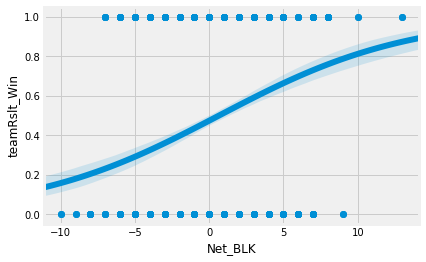

In [804]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=mavericks, logistic=True)

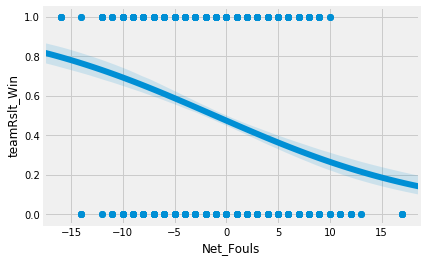

In [805]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=mavericks, logistic=True)

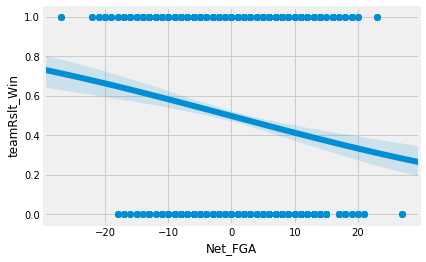

In [806]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=mavericks, logistic=True)

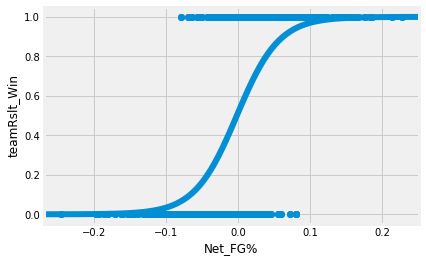

In [807]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=mavericks, logistic=True)

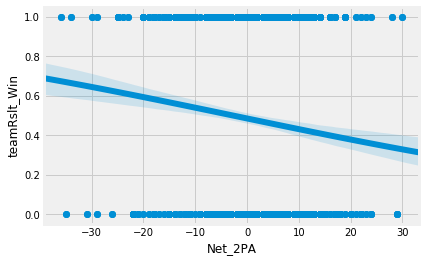

In [808]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=mavericks, logistic=True)

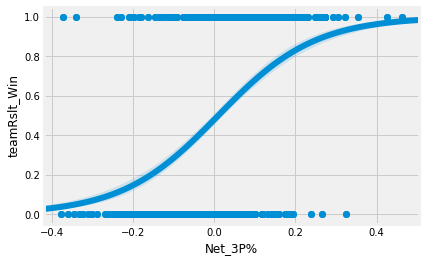

In [809]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=mavericks, logistic=True)

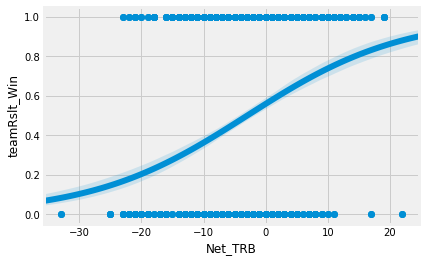

In [810]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=mavericks, logistic=True)

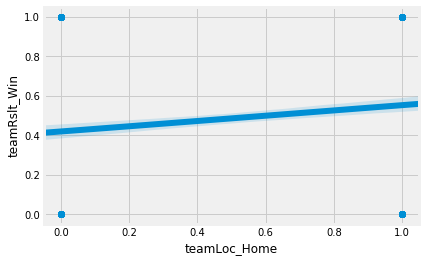

In [811]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=mavericks, logistic=True)

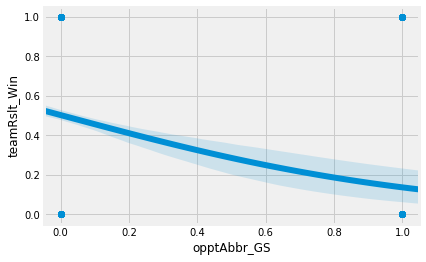

In [812]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=mavericks, logistic=True)

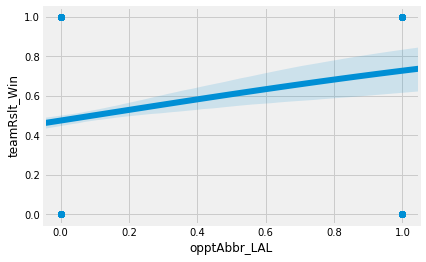

In [813]:
#Scatter Plot for opptAbbr_LAL


sns.regplot(x='opptAbbr_LAL', y='teamRslt_Win', data=mavericks, logistic=True)

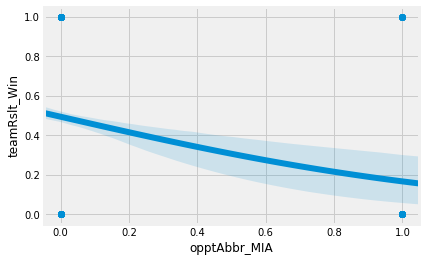

In [814]:
#Scatter Plot for opptAbbr_MIA


sns.regplot(x='opptAbbr_MIA', y='teamRslt_Win', data=mavericks, logistic=True)

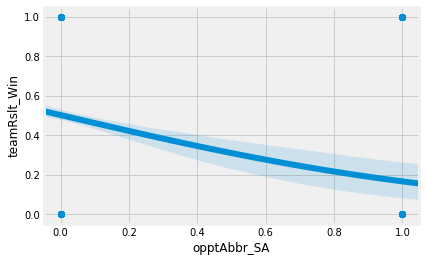

In [815]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=mavericks, logistic=True)

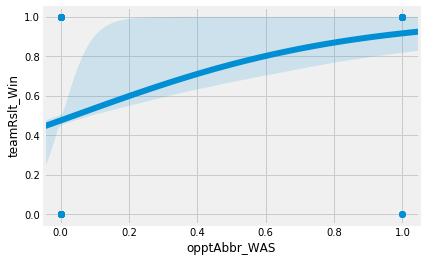

In [816]:
#Scatter Plot for opptAbbr_WAS


sns.regplot(x='opptAbbr_WAS', y='teamRslt_Win', data=mavericks, logistic=True)

#### Miami Heat

In [817]:
#Here I am just affirming the remaining columns in the heat subset

heat.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_PHO', 'opptAbbr_SA'],
      dtype='object')

In [818]:
#Here I am checking how many columns there are

heat.shape

(1477, 15)

In [819]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

heat_1 = heat.iloc[:, 0:9]

In [820]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

heat_2 = heat.iloc[:, 9:16]

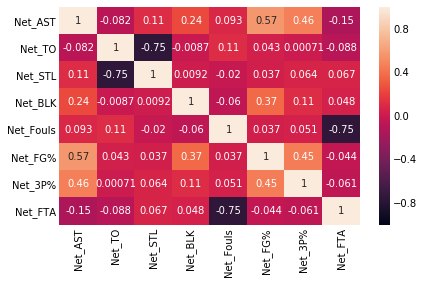

In [821]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the heat subset

ax = sns.heatmap(heat_1.corr(), vmin = -1, vmax = 1, annot=True)

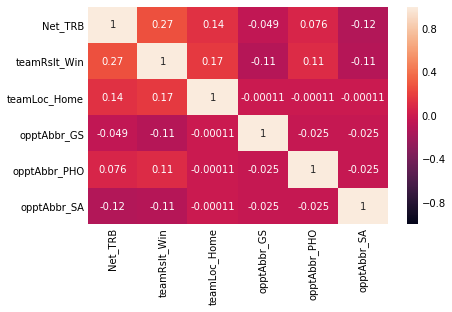

In [822]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(heat_2.corr(), vmin = -1, vmax = 1, annot=True)

In [823]:
#Here I am officially dropping Net Steals and Net_FTA from the heat subset

heat = heat.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

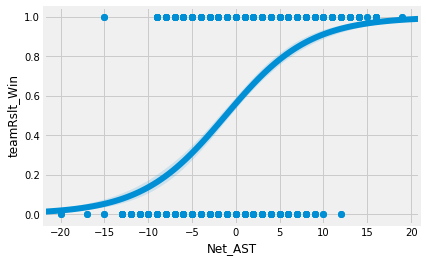

In [824]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=heat, logistic=True)

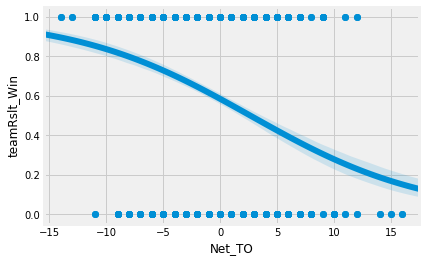

In [825]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=heat, logistic=True)

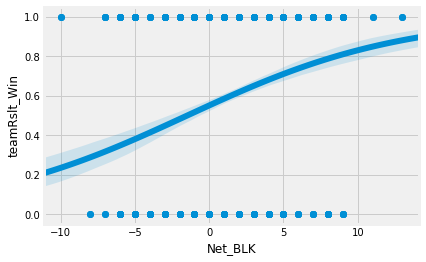

In [826]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=heat, logistic=True)

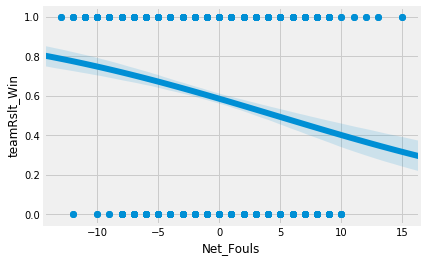

In [827]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=heat, logistic=True)

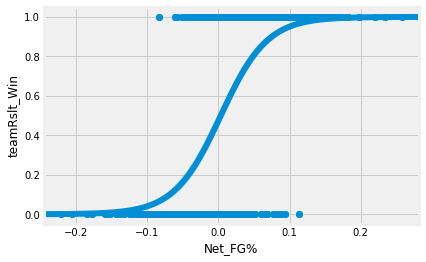

In [828]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=heat, logistic=True)

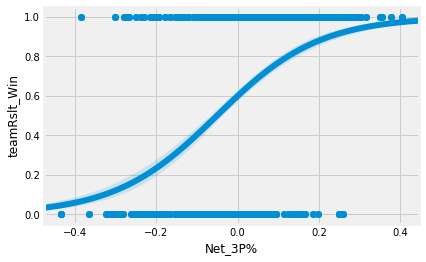

In [829]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=heat, logistic=True)

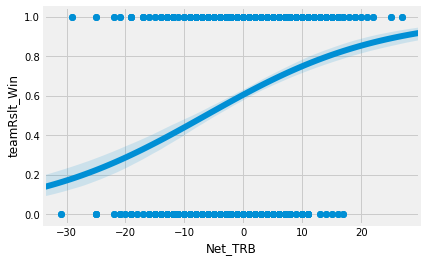

In [830]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=heat, logistic=True)

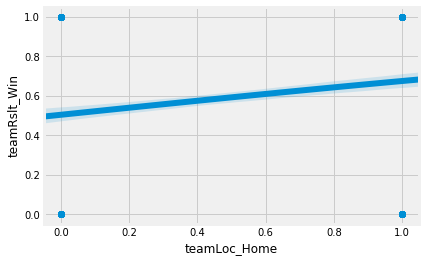

In [831]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=heat, logistic=True)

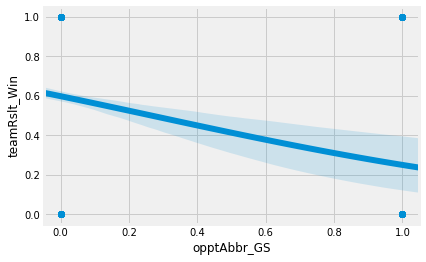

In [832]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=heat, logistic=True)

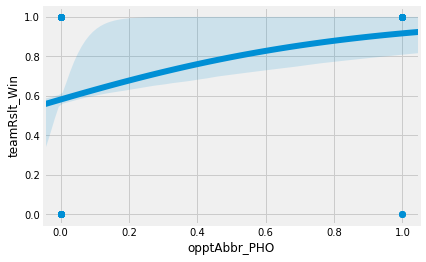

In [833]:
#Scatter Plot for opptAbbr_PHO


sns.regplot(x='opptAbbr_PHO', y='teamRslt_Win', data=heat, logistic=True)

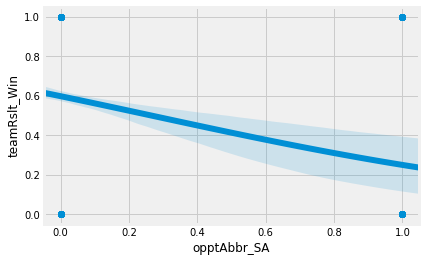

In [834]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=heat, logistic=True)

#### Utah Jazz

In [835]:
#Here I am just affirming the remaining columns in the jazz subset

jazz.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_LAC', 'opptAbbr_LAL', 'opptAbbr_OKC'],
      dtype='object')

In [836]:
#Here I am checking how many columns there are

jazz.shape

(1477, 16)

In [837]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

jazz_1 = jazz.iloc[:, 0:10]

In [838]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

jazz_2 = jazz.iloc[:, 10:17]

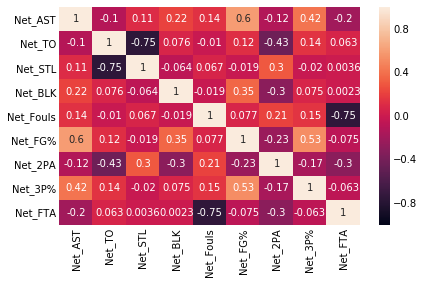

In [839]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the jazz subset

ax = sns.heatmap(jazz_1.corr(), vmin = -1, vmax = 1, annot=True)

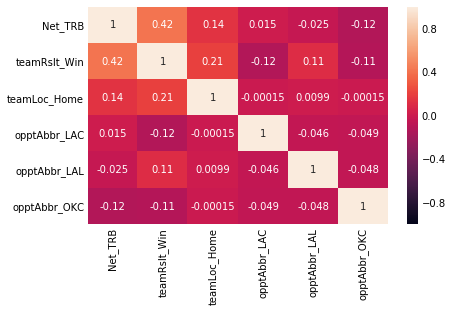

In [840]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(jazz_2.corr(), vmin = -1, vmax = 1, annot=True)

In [841]:
#Here I am officially dropping Net Steals and Net_FTA from the jazz subset

jazz = jazz.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

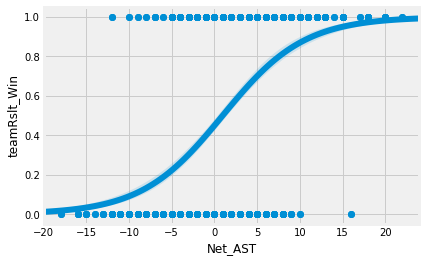

In [842]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=jazz, logistic=True)

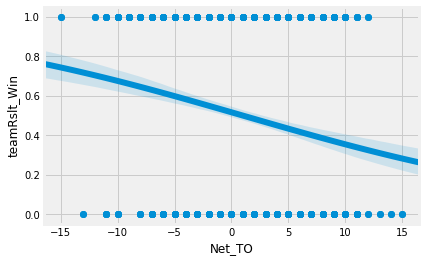

In [843]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=jazz, logistic=True)

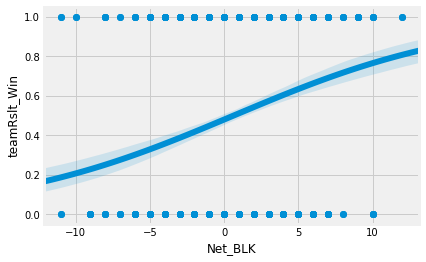

In [844]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=jazz, logistic=True)

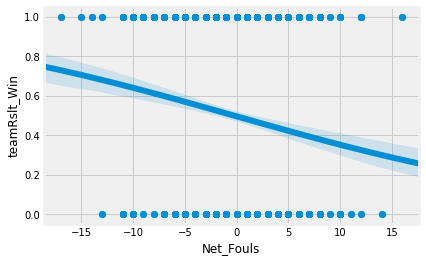

In [845]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=jazz, logistic=True)

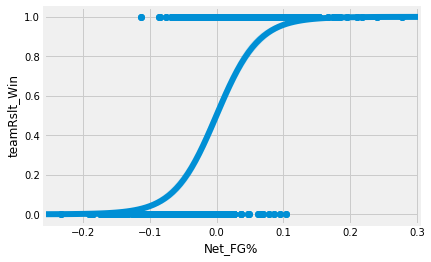

In [846]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=jazz, logistic=True)

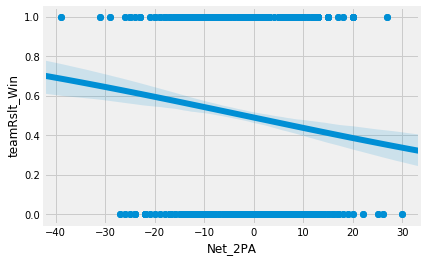

In [847]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=jazz, logistic=True)

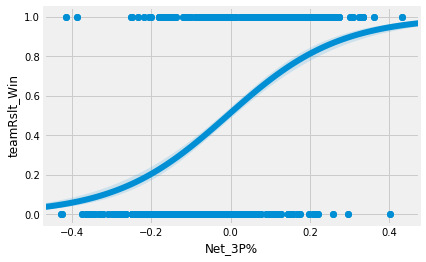

In [848]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=jazz, logistic=True)

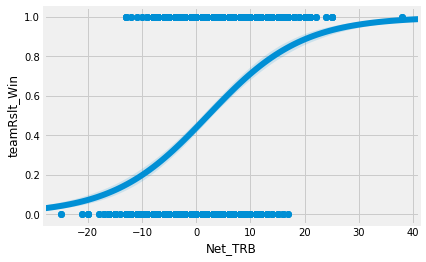

In [849]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=jazz, logistic=True)

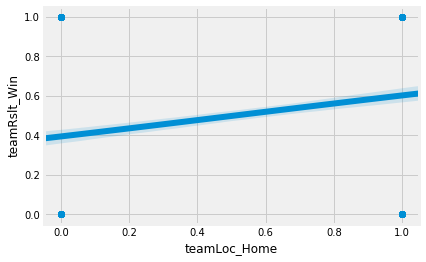

In [850]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=jazz, logistic=True)

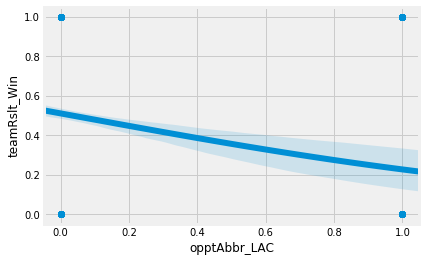

In [851]:
#Scatter Plot for opptAbbr_LAC


sns.regplot(x='opptAbbr_LAC', y='teamRslt_Win', data=jazz, logistic=True)

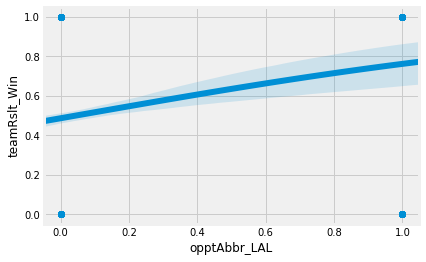

In [852]:
#Scatter Plot for opptAbbr_LAL


sns.regplot(x='opptAbbr_LAL', y='teamRslt_Win', data=jazz, logistic=True)

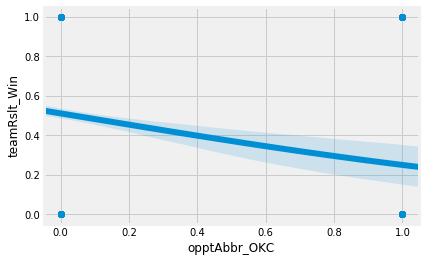

In [853]:
#Scatter Plot for opptAbbr_OKC


sns.regplot(x='opptAbbr_OKC', y='teamRslt_Win', data=jazz, logistic=True)

#### Chicago Bulls

In [854]:
#Here I am just affirming the remaining columns in the bulls subset

bulls.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_LAC', 'opptAbbr_PHI'],
      dtype='object')

In [855]:
#Here I am checking how many columns there are

bulls.shape

(1477, 16)

In [856]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

bulls_1 = bulls.iloc[:, 0:11]

In [857]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

bulls_2 = bulls.iloc[:, 11:17]

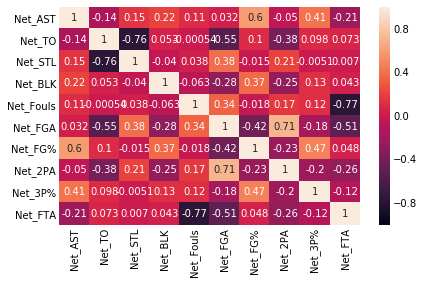

In [858]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other
#I am going to drop Net Steals and Net_FTA from the bulls subset

ax = sns.heatmap(bulls_1.corr(), vmin = -1, vmax = 1, annot=True)

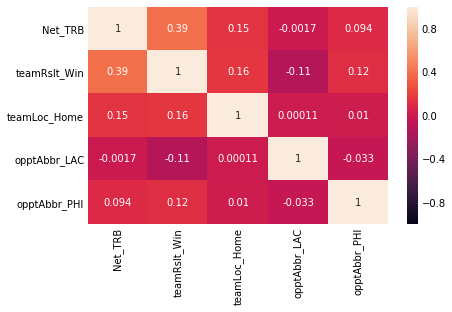

In [859]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(bulls_2.corr(), vmin = -1, vmax = 1, annot=True)

In [860]:
#Here I am officially dropping Net Steals and Net_FTA from the bulls subset

bulls = bulls.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

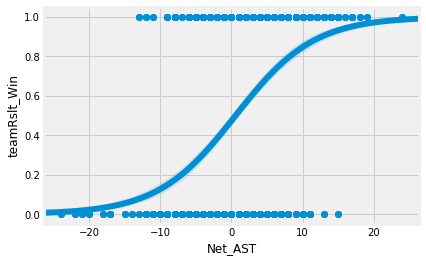

In [861]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=bulls, logistic=True)

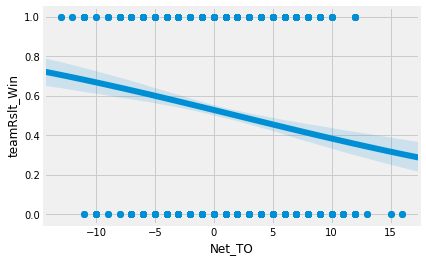

In [862]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=bulls, logistic=True)

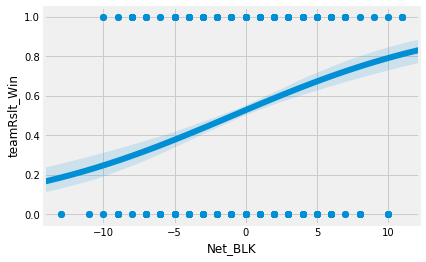

In [863]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=bulls, logistic=True)

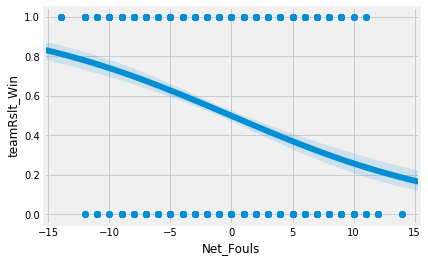

In [864]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=bulls, logistic=True)

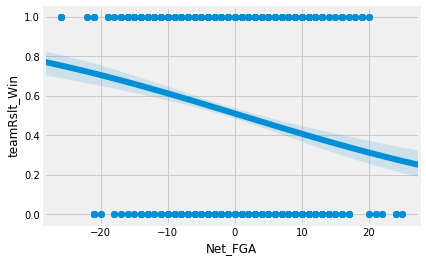

In [865]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=bulls, logistic=True)

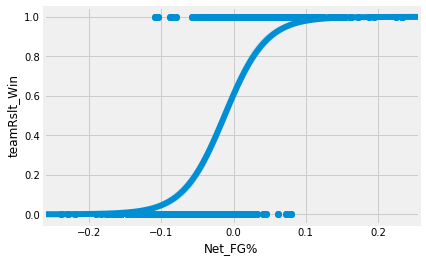

In [866]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=bulls, logistic=True)

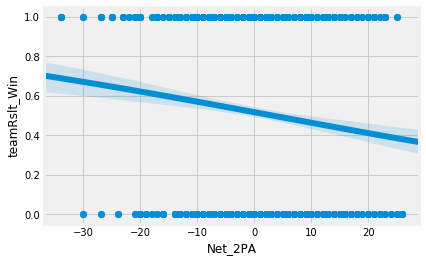

In [867]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=bulls, logistic=True)

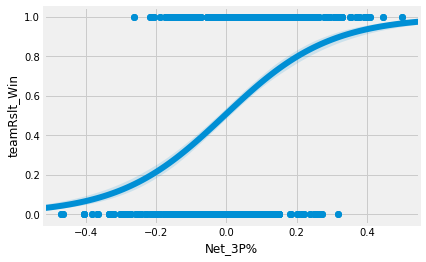

In [868]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=bulls, logistic=True)

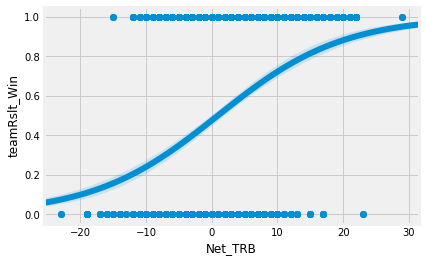

In [869]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=bulls, logistic=True)

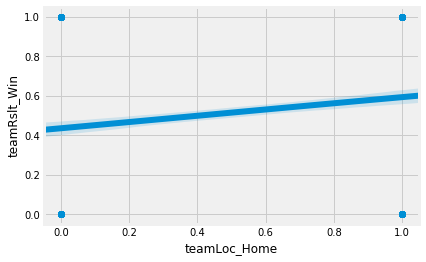

In [870]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=bulls, logistic=True)

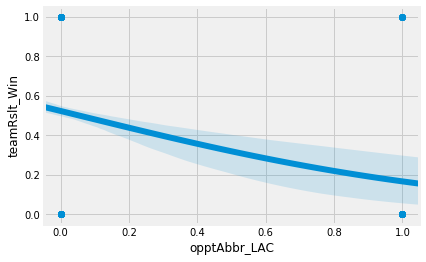

In [871]:
#Scatter Plot for opptAbbr_LAC


sns.regplot(x='opptAbbr_LAC', y='teamRslt_Win', data=bulls, logistic=True)

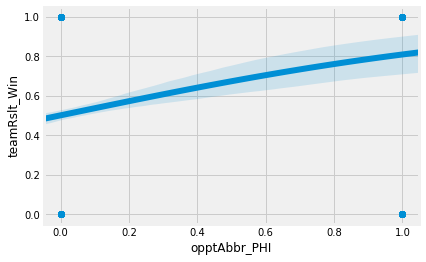

In [872]:
#Scatter Plot for opptAbbr_PHI


sns.regplot(x='opptAbbr_PHI', y='teamRslt_Win', data=bulls, logistic=True)

#### Portland Trailblazers

In [873]:
#Here I am just affirming the remaining columns in the trailbalzers subset

trailblazers.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_LAL'],
      dtype='object')

In [874]:
#Here I am checking how many columns there are

trailblazers.shape

(1477, 14)

In [875]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

blazers_1 = trailblazers.iloc[:, 0:9]

In [876]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

blazers_2 = trailblazers.iloc[:, 9:15]

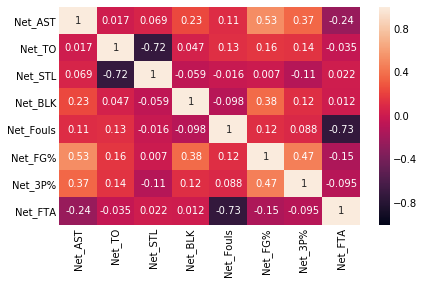

In [877]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net_FTA are highly correlated with each other 
#I am going to drop Net Steals and Net_FTA from the trailblazers subset

ax = sns.heatmap(blazers_1.corr(), vmin = -1, vmax = 1, annot=True)

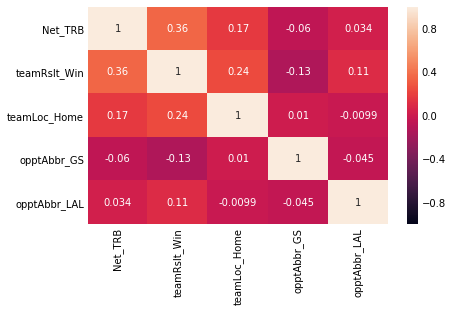

In [878]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(blazers_2.corr(), vmin = -1, vmax = 1, annot=True)

In [879]:
#Here I am officially dropping Net Steals and Net_FTA from the trailblazers subset

trailblazers = trailblazers.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

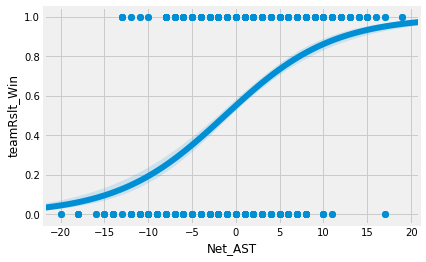

In [880]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=trailblazers, logistic=True)

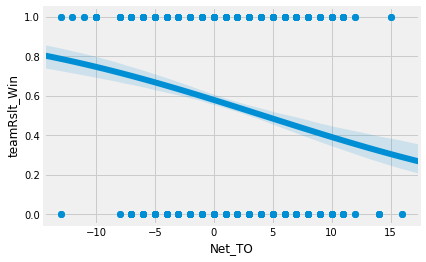

In [881]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=trailblazers, logistic=True)

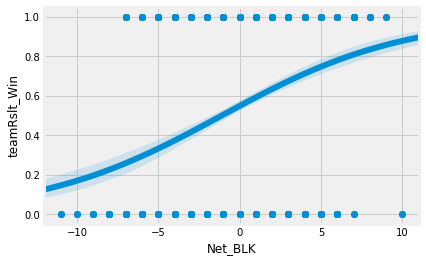

In [882]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=trailblazers, logistic=True)

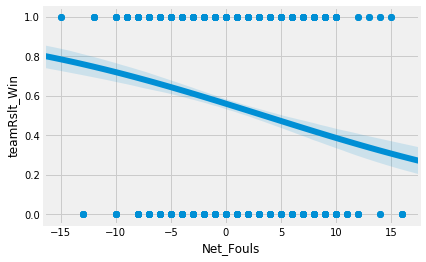

In [883]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=trailblazers, logistic=True)

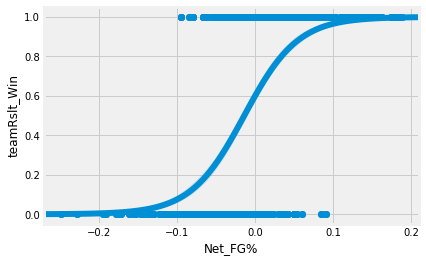

In [884]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=trailblazers, logistic=True)

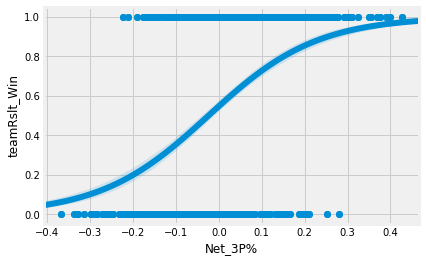

In [885]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=trailblazers, logistic=True)

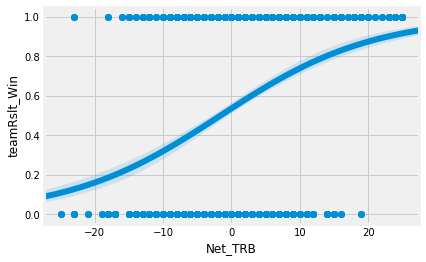

In [886]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=trailblazers, logistic=True)

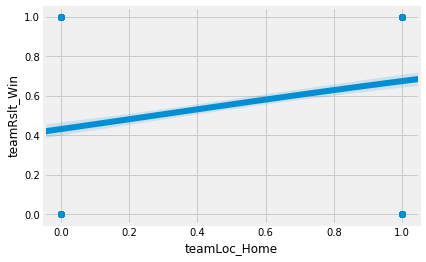

In [887]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=trailblazers, logistic=True)

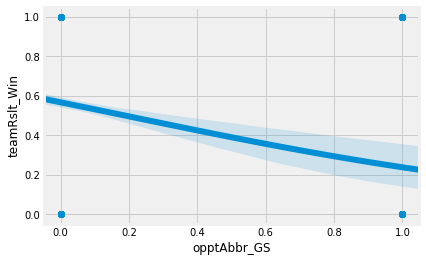

In [888]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=trailblazers, logistic=True)

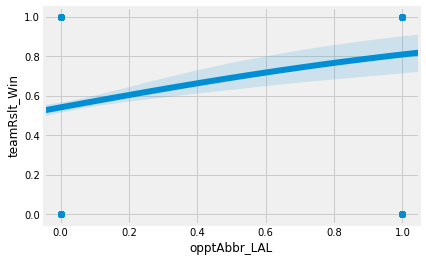

In [889]:
#Scatter Plot for opptAbbr_LAL


sns.regplot(x='opptAbbr_LAL', y='teamRslt_Win', data=trailblazers, logistic=True)

#### Cleveland Cavaliers

In [890]:
#Here I am just affirming the remaining columns in the cavaliers subset

cavaliers.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_2PA', 'Net_3PA', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_HOU', 'opptAbbr_MIA',
       'opptAbbr_ORL', 'opptAbbr_SA'],
      dtype='object')

In [891]:
#Here I am checking how many columns there are

cavaliers.shape

(1477, 18)

In [892]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

cavs_1 = cavaliers.iloc[:, 0:11]

In [893]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

cavs_2 = cavaliers.iloc[:, 11:19]

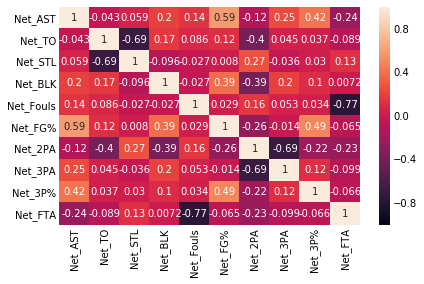

In [894]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net Free Throw Attempts are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the cavaliers subset

ax = sns.heatmap(cavs_1.corr(), vmin = -1, vmax = 1, annot=True)

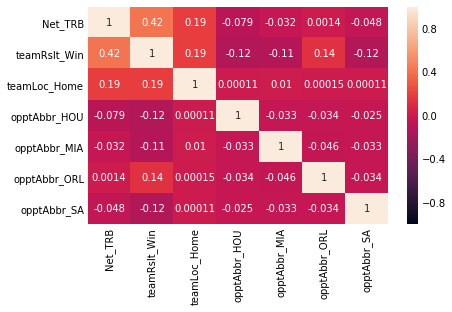

In [895]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(cavs_2.corr(), vmin = -1, vmax = 1, annot=True)

In [896]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the cavaliers subset

cavaliers = cavaliers.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

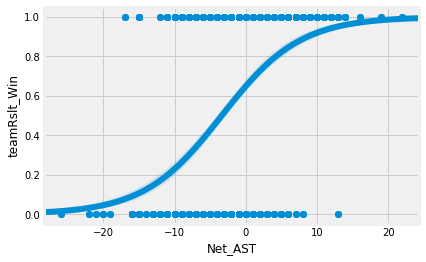

In [897]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=cavaliers, logistic=True)

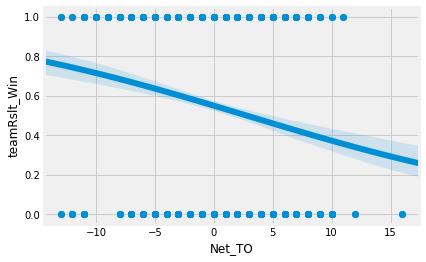

In [898]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=cavaliers, logistic=True)

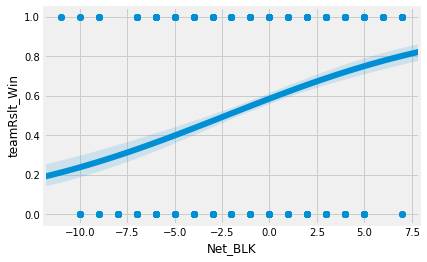

In [899]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=cavaliers, logistic=True)

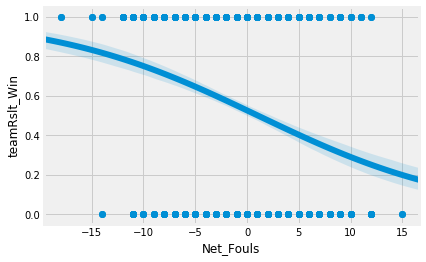

In [900]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=cavaliers, logistic=True)

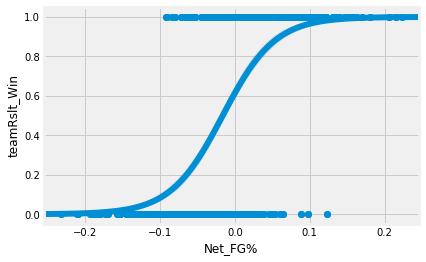

In [901]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=cavaliers, logistic=True)

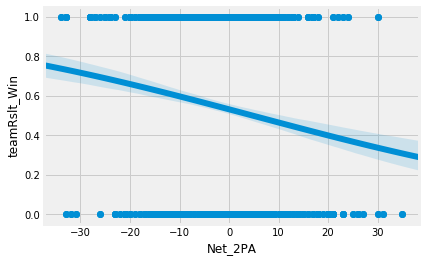

In [902]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=cavaliers, logistic=True)

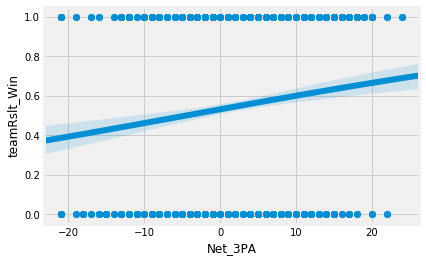

In [903]:
#Scatter Plot for Net_3PA


sns.regplot(x='Net_3PA', y='teamRslt_Win', data=cavaliers, logistic=True)

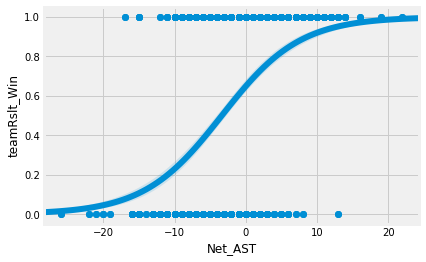

In [904]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_AST', y='teamRslt_Win', data=cavaliers, logistic=True)

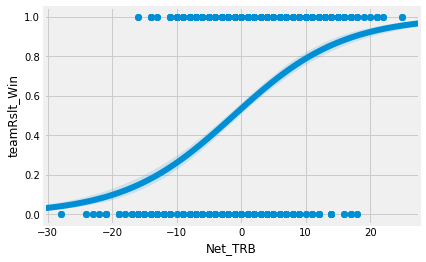

In [905]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=cavaliers, logistic=True)

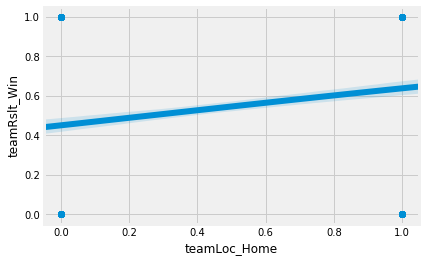

In [906]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=cavaliers, logistic=True)

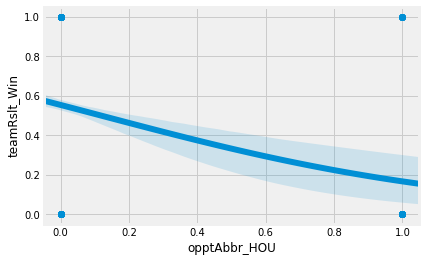

In [907]:
#Scatter Plot for opptAbbr_HOU


sns.regplot(x='opptAbbr_HOU', y='teamRslt_Win', data=cavaliers, logistic=True)

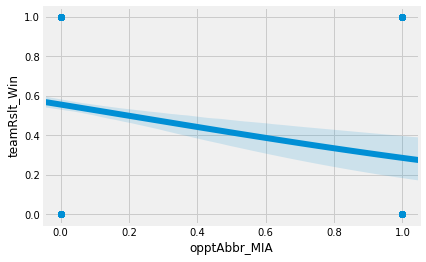

In [908]:
#Scatter Plot for opptAbbr_MIA


sns.regplot(x='opptAbbr_MIA', y='teamRslt_Win', data=cavaliers, logistic=True)

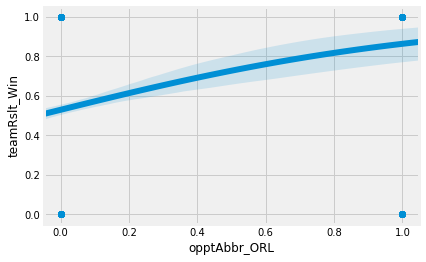

In [909]:
#Scatter Plot for opptAbbr_ORL


sns.regplot(x='opptAbbr_ORL', y='teamRslt_Win', data=cavaliers, logistic=True)

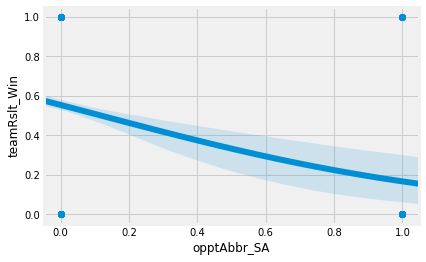

In [910]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=cavaliers, logistic=True)

#### Toronto Raptors

In [911]:
#Here I am just affirming the remaining columns in the raptors subset

raptors.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_ORL', 'opptAbbr_SA'],
      dtype='object')

In [912]:
#Here I am checking how many columns there are

raptors.shape

(1476, 15)

In [913]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

raps_1 = raptors.iloc[:, 0:9]

In [914]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

raps_2 = raptors.iloc[:, 9:16]

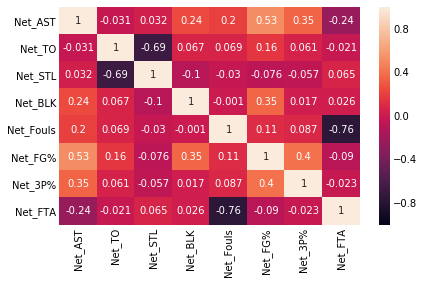

In [915]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net Free Throw Attempts are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the raptors subset

ax = sns.heatmap(raps_1.corr(), vmin = -1, vmax = 1, annot=True)

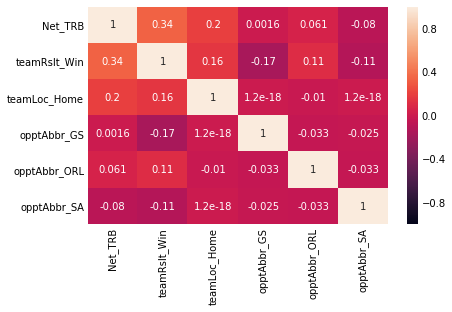

In [916]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(raps_2.corr(), vmin = -1, vmax = 1, annot=True)

In [917]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the raptors subset

raptors = raptors.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

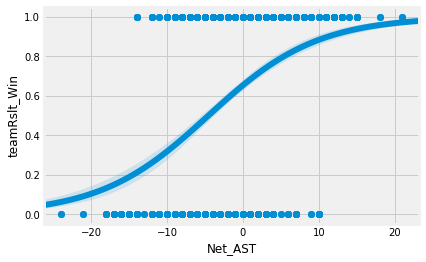

In [918]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=raptors, logistic=True)

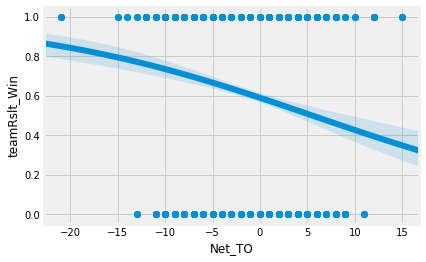

In [919]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=raptors, logistic=True)

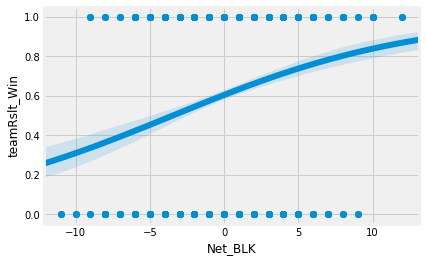

In [920]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=raptors, logistic=True)

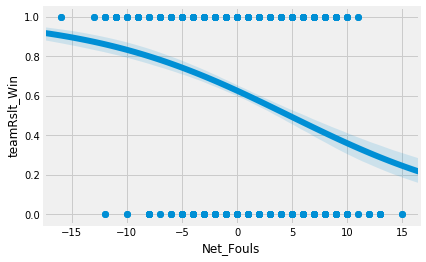

In [921]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=raptors, logistic=True)

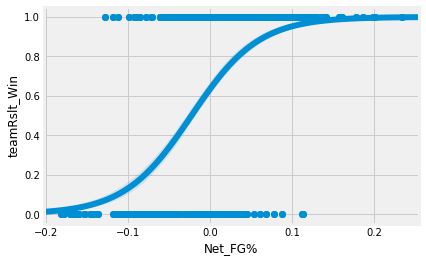

In [922]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=raptors, logistic=True)

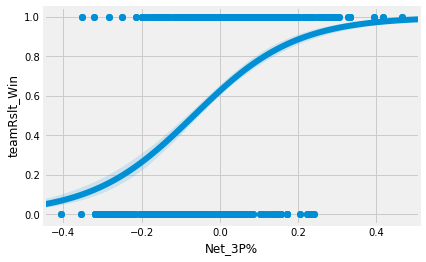

In [923]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=raptors, logistic=True)

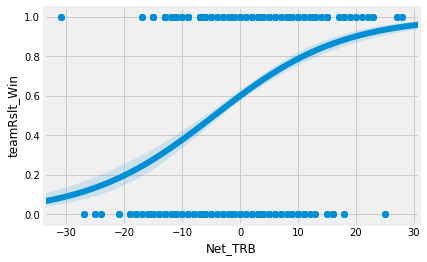

In [924]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=raptors, logistic=True)

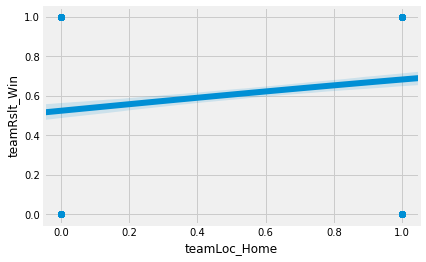

In [925]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=raptors, logistic=True)

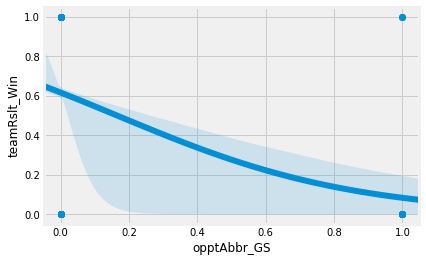

In [926]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=raptors, logistic=True)

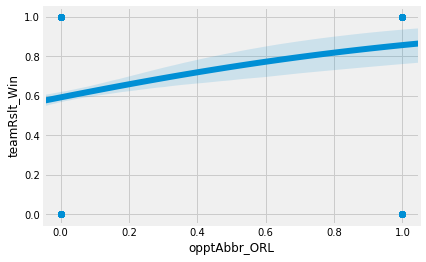

In [927]:
#Scatter Plot for opptAbbr_ORL


sns.regplot(x='opptAbbr_ORL', y='teamRslt_Win', data=raptors, logistic=True)

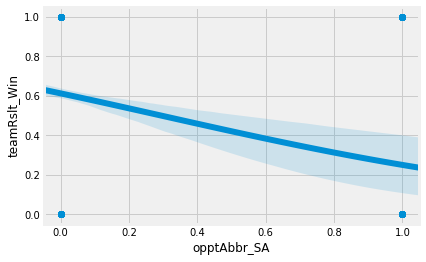

In [928]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=raptors, logistic=True)

#### Orlando Magic

In [929]:
#Here I am just affirming the remaining columns in the magic subset

magic.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_PHI'],
      dtype='object')

In [930]:
#Here I am checking how many columns there are

magic.shape

(1476, 13)

In [931]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

mag_1 = magic.iloc[:, 0:9]

In [932]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

mag_2 = magic.iloc[:, 9:14]

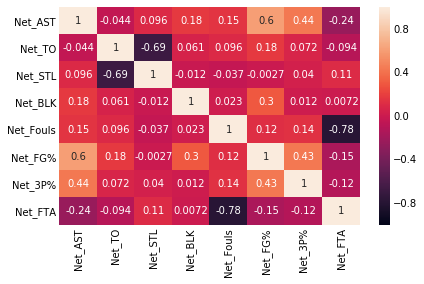

In [933]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net Free Throw Attempts are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the magic subset

ax = sns.heatmap(mag_1.corr(), vmin = -1, vmax = 1, annot=True)

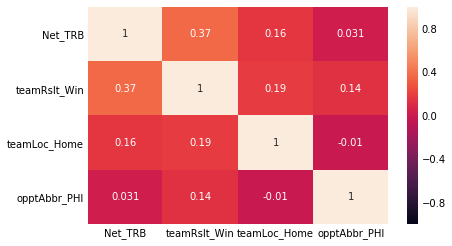

In [934]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(mag_2.corr(), vmin = -1, vmax = 1, annot=True)

In [935]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the magic subset

magic = magic.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

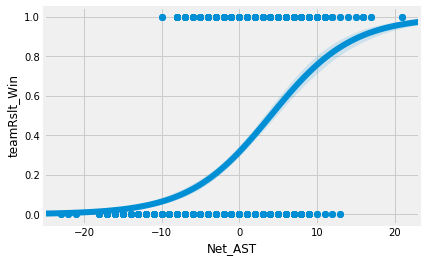

In [936]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=magic, logistic=True)

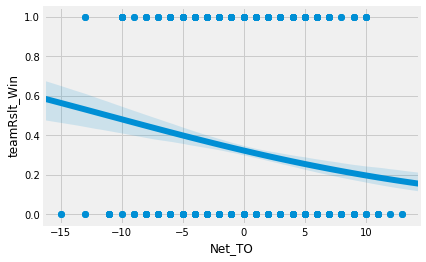

In [937]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=magic, logistic=True)

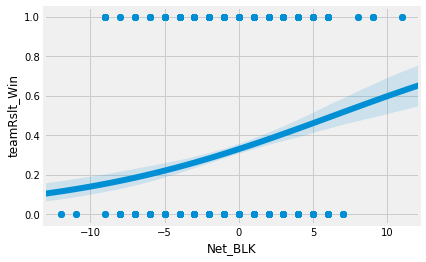

In [938]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=magic, logistic=True)

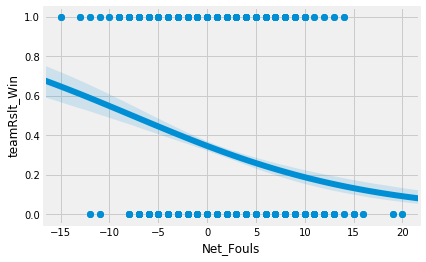

In [939]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=magic, logistic=True)

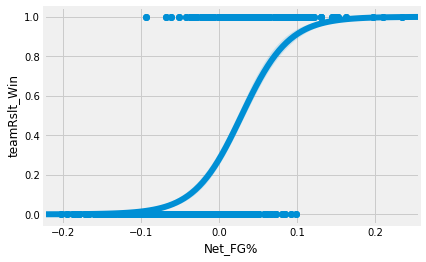

In [940]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=magic, logistic=True)

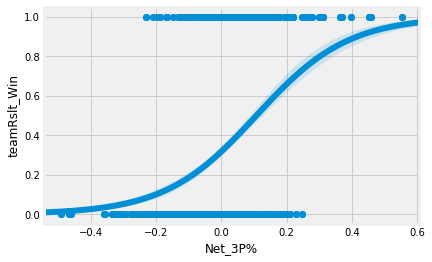

In [941]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=magic, logistic=True)

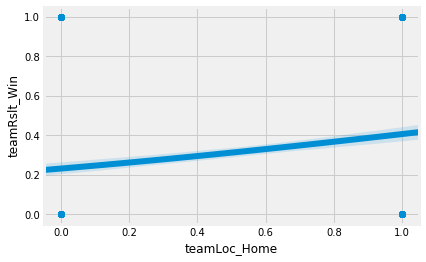

In [942]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=magic, logistic=True)

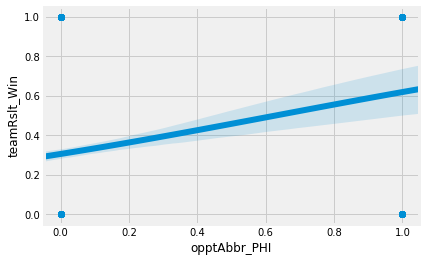

In [943]:
#Scatter Plot for opptAbbr_PHI


sns.regplot(x='opptAbbr_PHI', y='teamRslt_Win', data=magic, logistic=True)

#### New Orleans Pelicans

In [944]:
#Here I am just affirming the remaining columns in the pelicans subset

pelicans.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_DET', 'opptAbbr_GS', 'opptAbbr_WAS'],
      dtype='object')

In [945]:
#Here I am checking how many columns there are

pelicans.shape

(1476, 15)

In [946]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

pels_1 = pelicans.iloc[:, 0:9]

In [947]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

pels_2 = pelicans.iloc[:, 9:16]

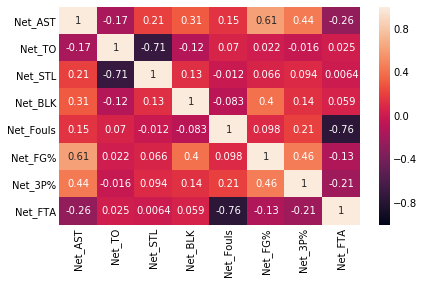

In [948]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net Free Throw Attempts are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the pelicans subset

ax = sns.heatmap(pels_1.corr(), vmin = -1, vmax = 1, annot=True)

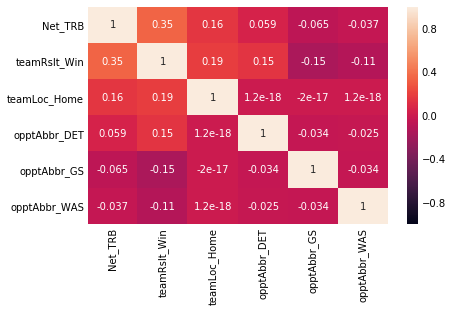

In [949]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(pels_2.corr(), vmin = -1, vmax = 1, annot=True)

In [950]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the pelicans subset

pelicans = pelicans.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

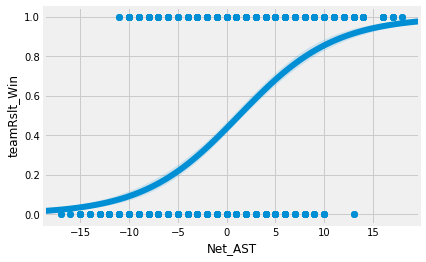

In [951]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=pelicans, logistic=True)

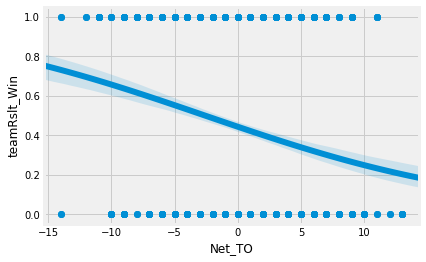

In [952]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=pelicans, logistic=True)

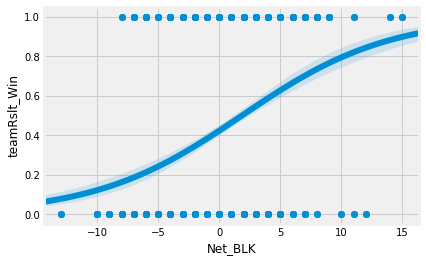

In [953]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=pelicans, logistic=True)

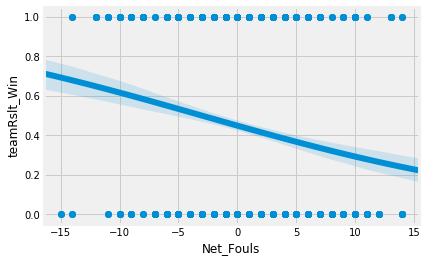

In [954]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=pelicans, logistic=True)

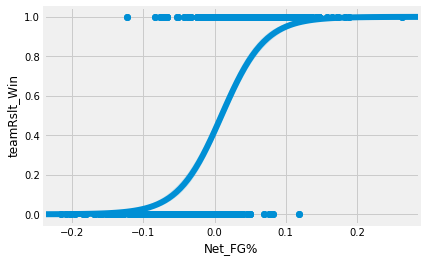

In [955]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=pelicans, logistic=True)

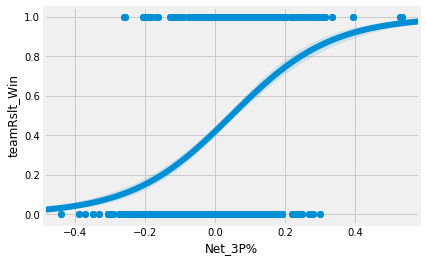

In [956]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=pelicans, logistic=True)

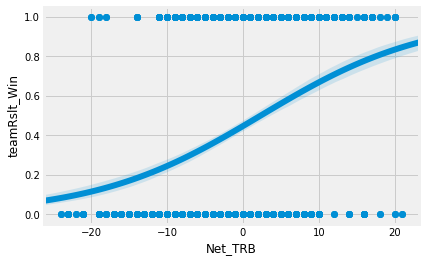

In [957]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=pelicans, logistic=True)

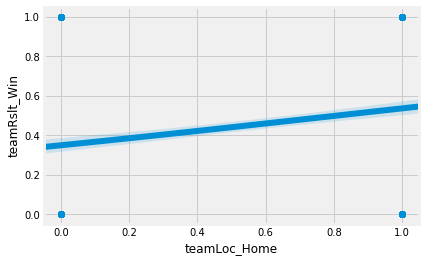

In [958]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=pelicans, logistic=True)

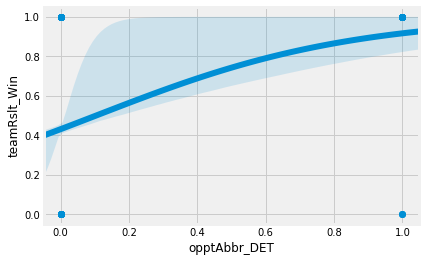

In [959]:
#Scatter Plot for opptAbbr_DET


sns.regplot(x='opptAbbr_DET', y='teamRslt_Win', data=pelicans, logistic=True)

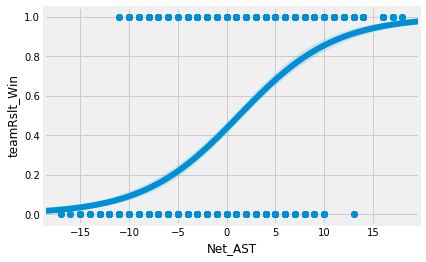

In [960]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='Net_AST', y='teamRslt_Win', data=pelicans, logistic=True)

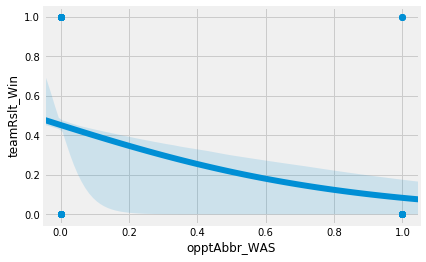

In [961]:
#Scatter Plot for opptAbbr_WAS


sns.regplot(x='opptAbbr_WAS', y='teamRslt_Win', data=pelicans, logistic=True)

#### Atlanta Hawks

In [962]:
#Here I am just affirming the remaining columns in the hawks subset

hawks.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_SA'],
      dtype='object')

In [963]:
#Here I am checking how many columns there are

hawks.shape

(1476, 14)

In [964]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

hawks_1 = hawks.iloc[:, 0:9]

In [965]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

hawks_2 = hawks.iloc[:, 9:13]

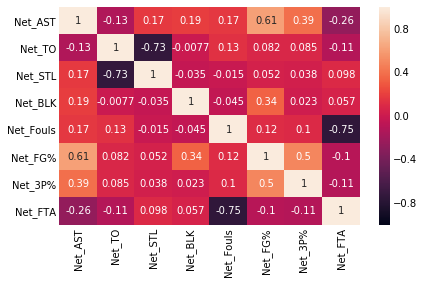

In [966]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net Free Throw Attempts are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the hawks subset

ax = sns.heatmap(hawks_1.corr(), vmin = -1, vmax = 1, annot=True)

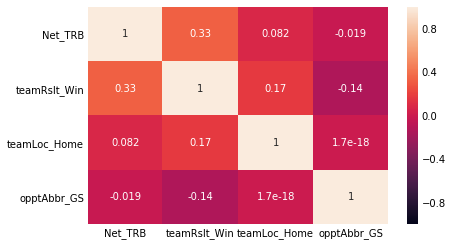

In [967]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(hawks_2.corr(), vmin = -1, vmax = 1, annot=True)

In [968]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the hawks subset

hawks = hawks.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

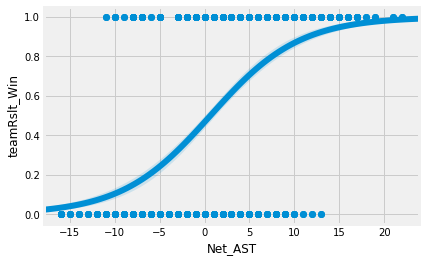

In [969]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=hawks, logistic=True)

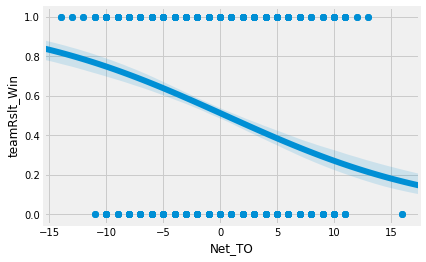

In [970]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=hawks, logistic=True)

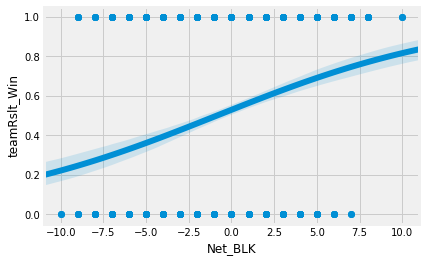

In [971]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=hawks, logistic=True)

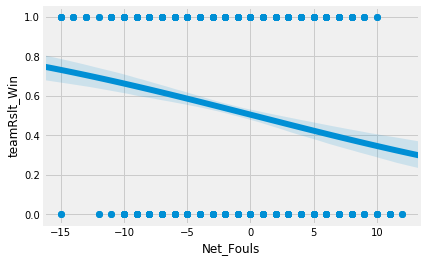

In [972]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=hawks, logistic=True)

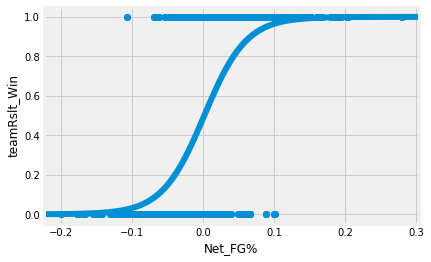

In [973]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=hawks, logistic=True)

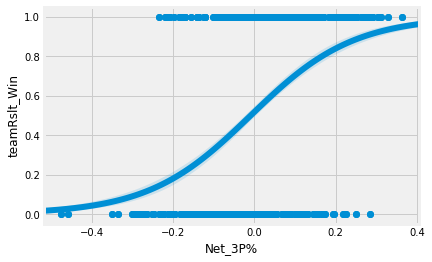

In [974]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=hawks, logistic=True)

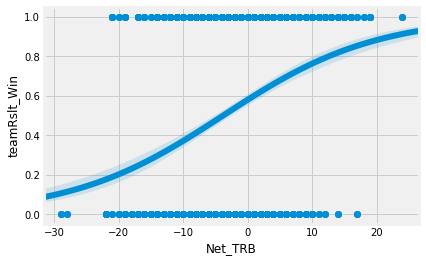

In [975]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=hawks, logistic=True)

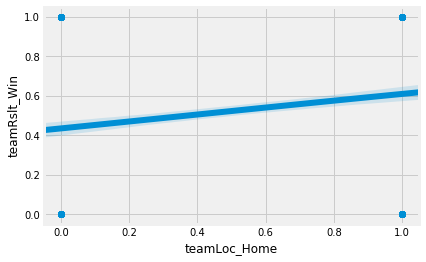

In [976]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=hawks, logistic=True)

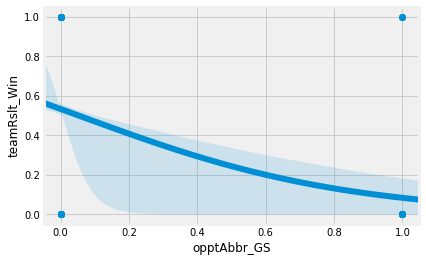

In [977]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=hawks, logistic=True)

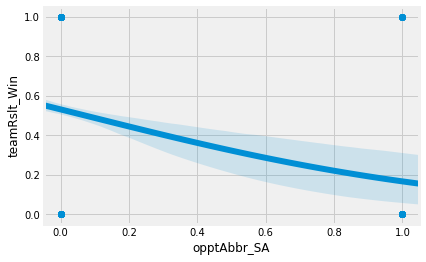

In [978]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=hawks, logistic=True)

#### Oklahoma City Thunder

In [979]:
#Here I am just affirming the remaining columns in the thunder subset

thunder.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_PHI', 'opptAbbr_POR'],
      dtype='object')

In [980]:
#Here I am checking how many columns there are

thunder.shape

(1476, 15)

In [981]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

thunder_1 = thunder.iloc[:, 0:9]

In [982]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

thunder_2 = thunder.iloc[:, 9:16]

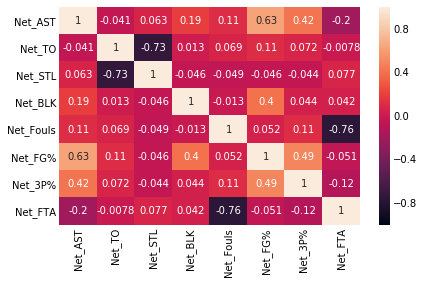

In [983]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net Fouls and Net Free Throw Attempts are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the thunder subset

ax = sns.heatmap(thunder_1.corr(), vmin = -1, vmax = 1, annot=True)

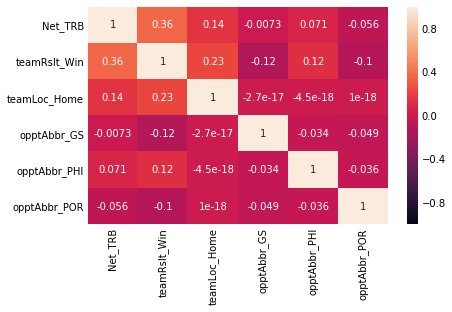

In [984]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(thunder_2.corr(), vmin = -1, vmax = 1, annot=True)

In [985]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the thunder subset

thunder = thunder.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

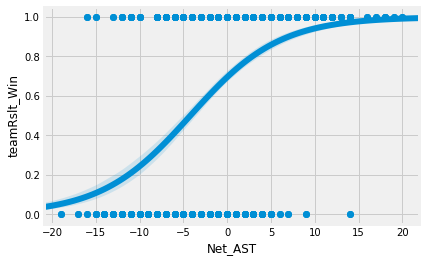

In [986]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=thunder, logistic=True)

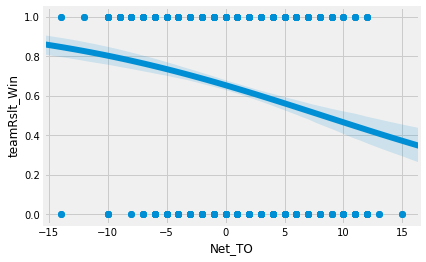

In [987]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=thunder, logistic=True)

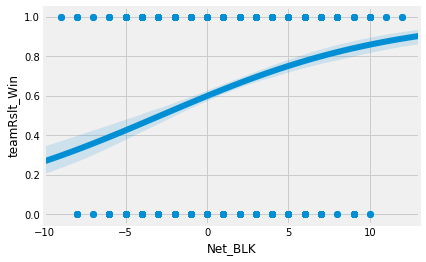

In [988]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=thunder, logistic=True)

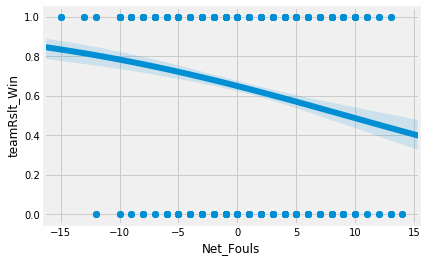

In [989]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=thunder, logistic=True)

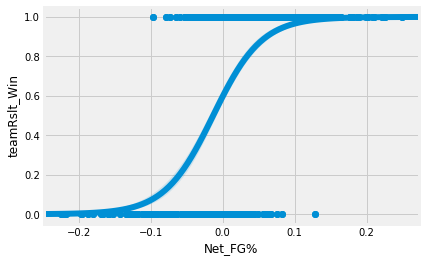

In [990]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=thunder, logistic=True)

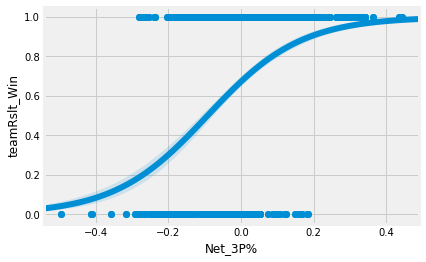

In [991]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=thunder, logistic=True)

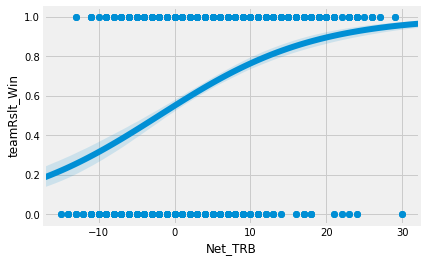

In [992]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=thunder, logistic=True)

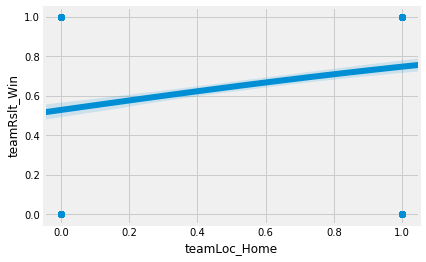

In [993]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=thunder, logistic=True)

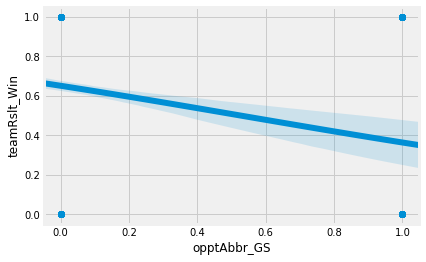

In [994]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=thunder, logistic=True)

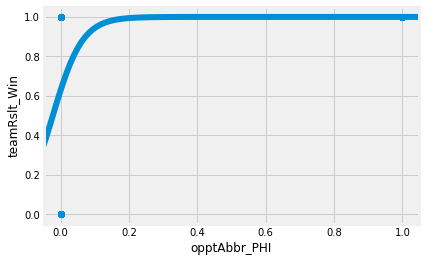

In [995]:
#Scatter Plot for opptAbbr_PHI


sns.regplot(x='opptAbbr_PHI', y='teamRslt_Win', data=thunder, logistic=True)

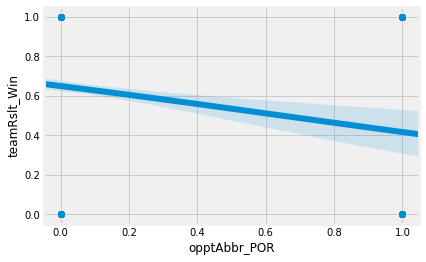

In [996]:
#Scatter Plot for opptAbbr_POR


sns.regplot(x='opptAbbr_POR', y='teamRslt_Win', data=thunder, logistic=True)

#### Philadelphia 76ers

In [997]:
#Here I am just affirming the remaining columns in the sixers subset

sixers.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3PA', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_OKC'],
      dtype='object')

In [998]:
#Here I am checking how many columns there are

sixers.shape

(1476, 14)

In [999]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

sixers_1 = sixers.iloc[:, 0:10]

In [1000]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

sixers_2 = sixers.iloc[:, 10:15]

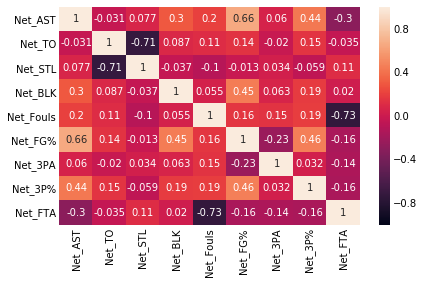

In [1001]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the sixers subset

ax = sns.heatmap(sixers_1.corr(), vmin = -1, vmax = 1, annot=True)

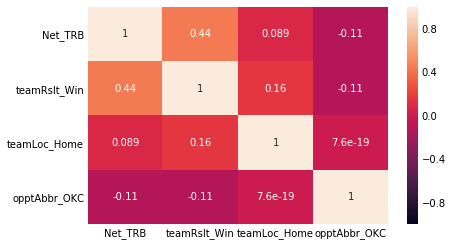

In [1002]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(sixers_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1003]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the sixers subset

sixers = sixers.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

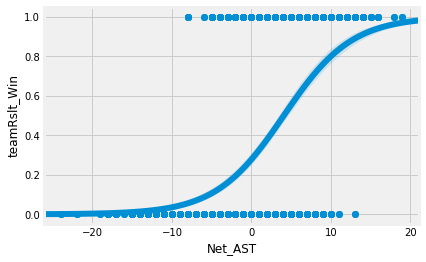

In [1004]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=sixers, logistic=True)

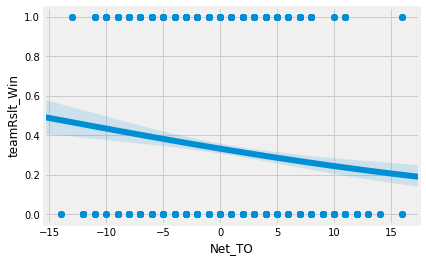

In [1005]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=sixers, logistic=True)

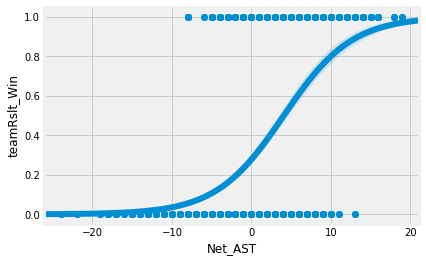

In [1006]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_AST', y='teamRslt_Win', data=sixers, logistic=True)

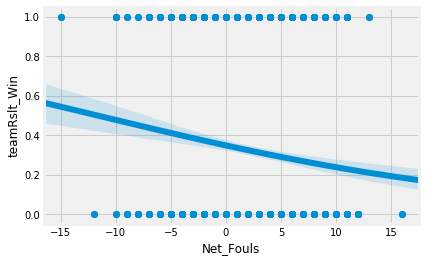

In [1007]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=sixers, logistic=True)

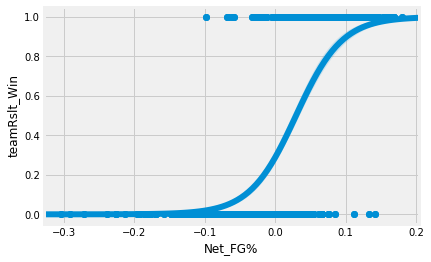

In [1008]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=sixers, logistic=True)

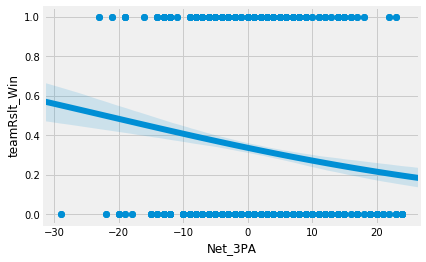

In [1009]:
#Scatter Plot for Net_3PA


sns.regplot(x='Net_3PA', y='teamRslt_Win', data=sixers, logistic=True)

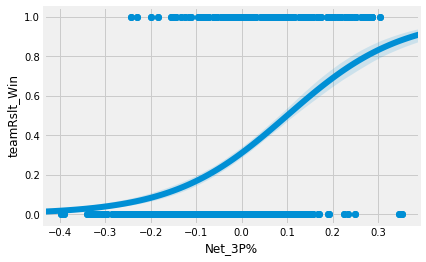

In [1010]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=sixers, logistic=True)

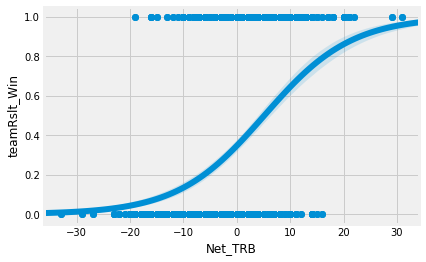

In [1011]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=sixers, logistic=True)

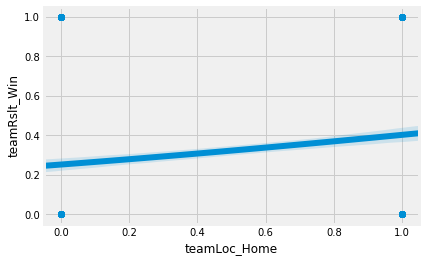

In [1012]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=sixers, logistic=True)

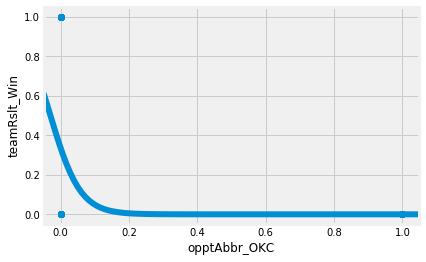

In [1013]:
#Scatter Plot for opptAbbr_OKC


sns.regplot(x='opptAbbr_OKC', y='teamRslt_Win', data=sixers, logistic=True)

#### Memphis Grizzlies

In [1014]:
#Here I am just affirming the remaining columns in the grizzlies subset

grizzlies.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_SA', 'opptAbbr_SAC'],
      dtype='object')

In [1015]:
#Here I am checking how many columns there are

grizzlies.shape

(1476, 15)

In [1016]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

griz_1 = grizzlies.iloc[:, 0:10]

In [1017]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

griz_2 = grizzlies.iloc[:, 10:16]

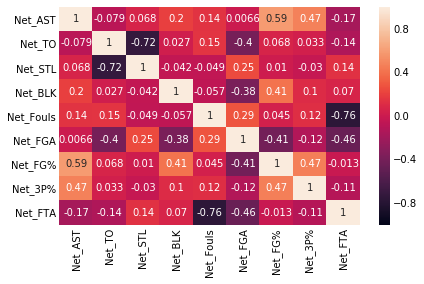

In [1018]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the grizzlies subset

ax = sns.heatmap(griz_1.corr(), vmin = -1, vmax = 1, annot=True)

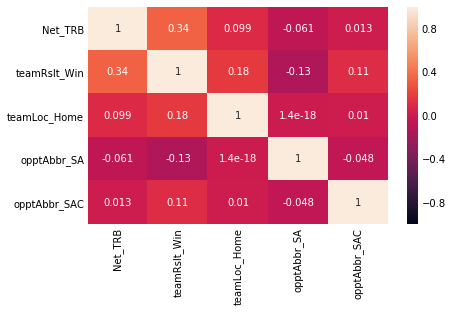

In [1019]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(griz_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1020]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the grizzlies subset

grizzlies = grizzlies.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

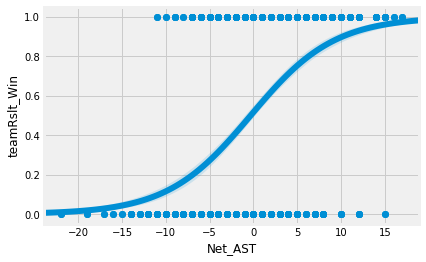

In [1021]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=grizzlies, logistic=True)

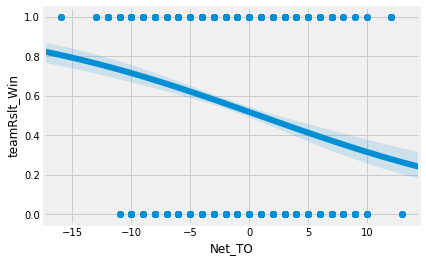

In [1022]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=grizzlies, logistic=True)

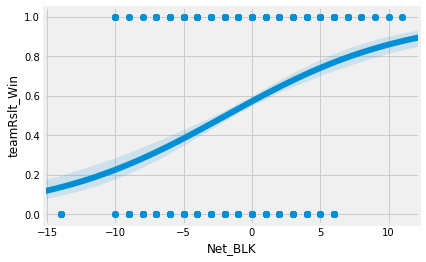

In [1023]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=grizzlies, logistic=True)

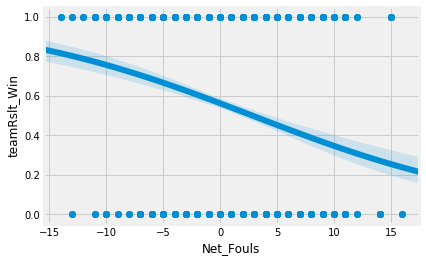

In [1024]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=grizzlies, logistic=True)

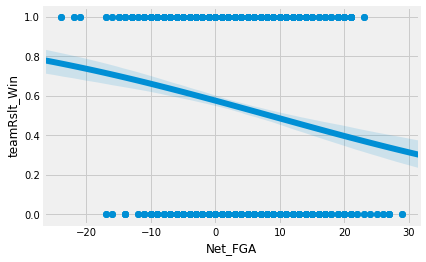

In [1025]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=grizzlies, logistic=True)

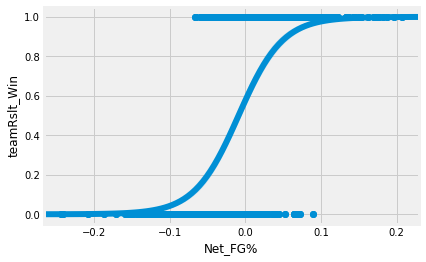

In [1026]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=grizzlies, logistic=True)

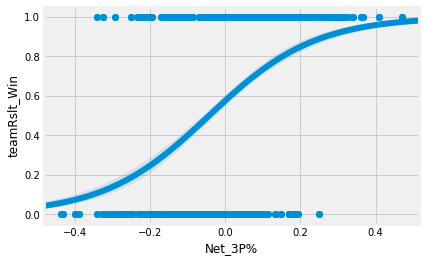

In [1027]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=grizzlies, logistic=True)

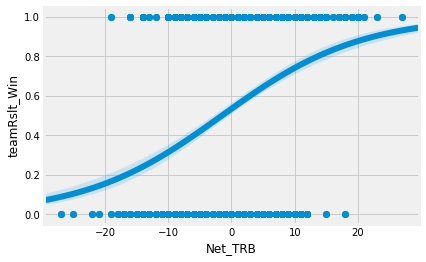

In [1028]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=grizzlies, logistic=True)

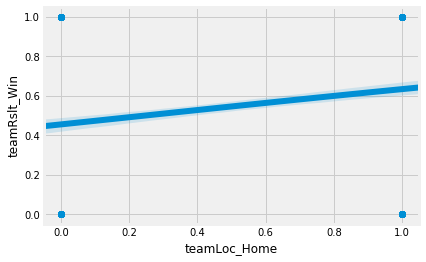

In [1029]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=grizzlies, logistic=True)

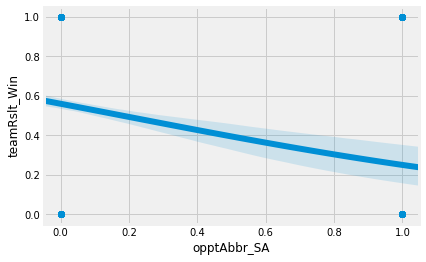

In [1030]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=grizzlies, logistic=True)

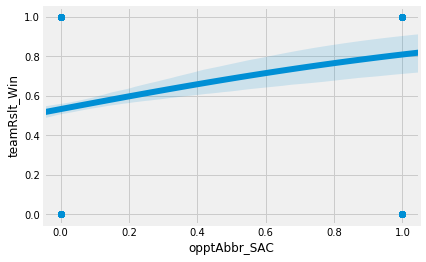

In [1031]:
#Scatter Plot for opptAbbr_SAC


sns.regplot(x='opptAbbr_SAC', y='teamRslt_Win', data=grizzlies, logistic=True)

#### San Antonio Spurs

In [1032]:
#Here I am just affirming the remaining columns in the spurs subset

spurs.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_FG%',
       'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win', 'teamLoc_Home',
       'opptAbbr_OKC', 'opptAbbr_SAC'],
      dtype='object')

In [1033]:
#Here I am checking how many columns there are

spurs.shape

(1476, 13)

In [1034]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

spurs_1 = spurs.iloc[:, 0:9]

In [1035]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

spurs_2 = spurs.iloc[:, 9:14]

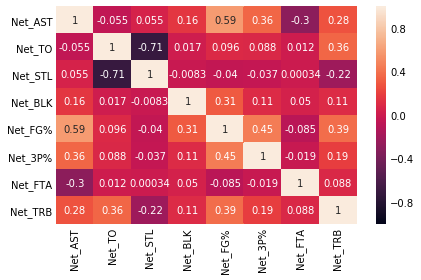

In [1036]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#I am going to drop Net Steals from the spurs subset

ax = sns.heatmap(spurs_1.corr(), vmin = -1, vmax = 1, annot=True)

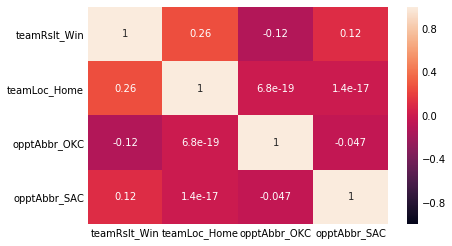

In [1037]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(spurs_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1038]:
#Here I am officially dropping Net Steals from the spurs subset

spurs = spurs.drop(['Net_STL'], axis = 'columns')

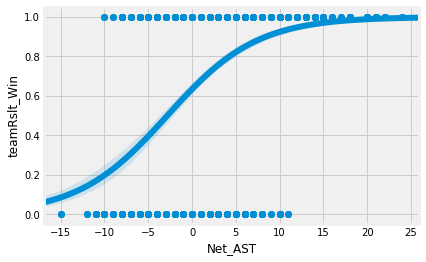

In [1039]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=spurs, logistic=True)

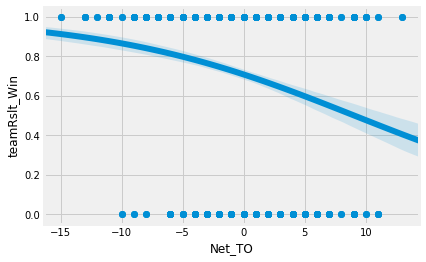

In [1040]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=spurs, logistic=True)

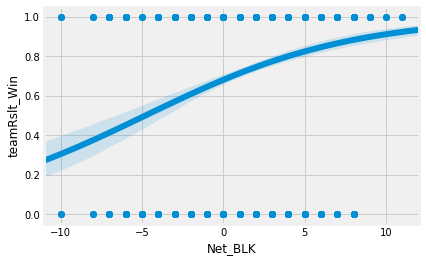

In [1041]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=spurs, logistic=True)

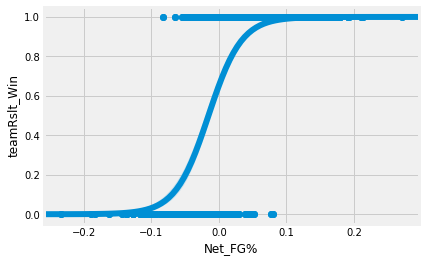

In [1042]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=spurs, logistic=True)

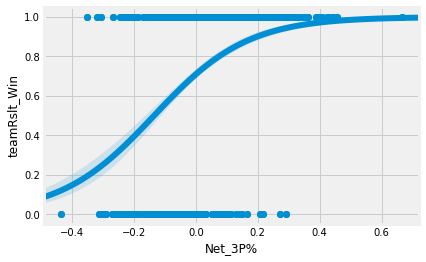

In [1043]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=spurs, logistic=True)

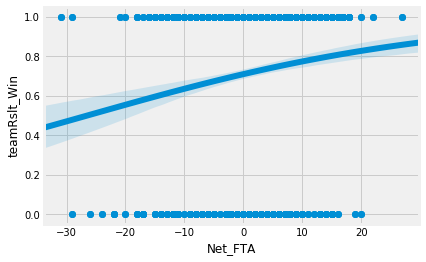

In [1044]:
#Scatter Plot for Net_FTA


sns.regplot(x='Net_FTA', y='teamRslt_Win', data=spurs, logistic=True)

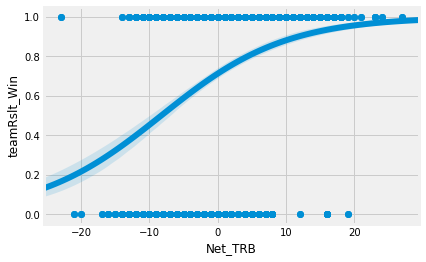

In [1045]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=spurs, logistic=True)

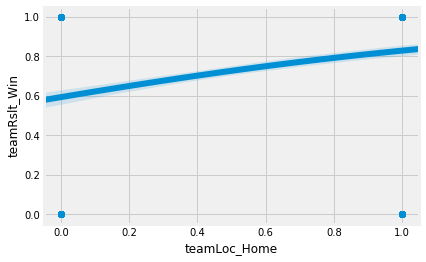

In [1046]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=spurs, logistic=True)

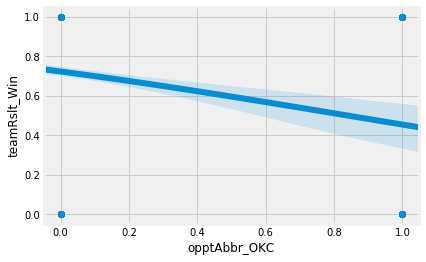

In [1047]:
#Scatter Plot for opptAbbr_OKC


sns.regplot(x='opptAbbr_OKC', y='teamRslt_Win', data=spurs, logistic=True)

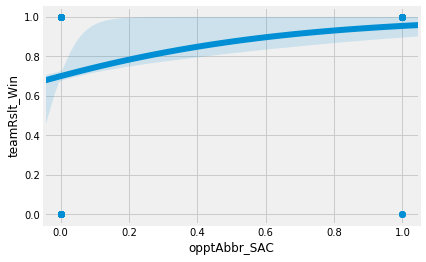

In [1048]:
#Scatter Plot for opptAbbr_SAC


sns.regplot(x='opptAbbr_SAC', y='teamRslt_Win', data=spurs, logistic=True)

#### Phoenix Suns

In [1049]:
#Here I am just affirming the remaining columns in the suns subset

suns.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_LAL'],
      dtype='object')

In [1050]:
#Here I am checking how many columns there are

suns.shape

(1476, 16)

In [1051]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

suns_1 = suns.iloc[:, 0:10]

In [1052]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

suns_2 = suns.iloc[:, 10:17]

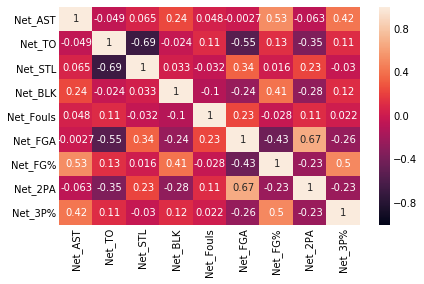

In [1053]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the suns subset

ax = sns.heatmap(suns_1.corr(), vmin = -1, vmax = 1, annot=True)

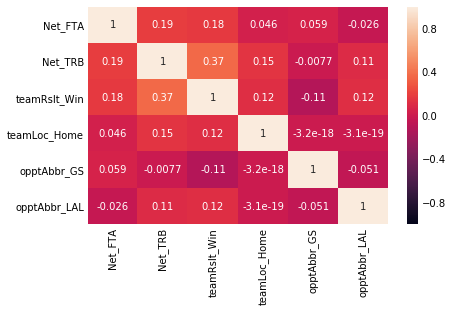

In [1054]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(suns_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1055]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the suns subset

suns = suns.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

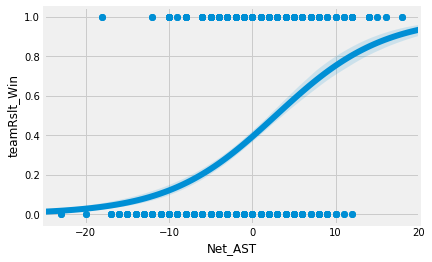

In [1056]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=suns, logistic=True)

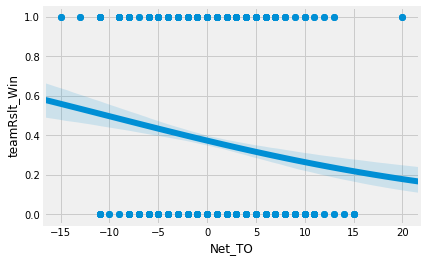

In [1057]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=suns, logistic=True)

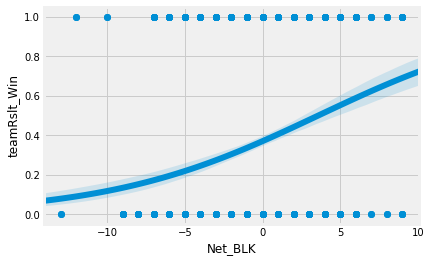

In [1058]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=suns, logistic=True)

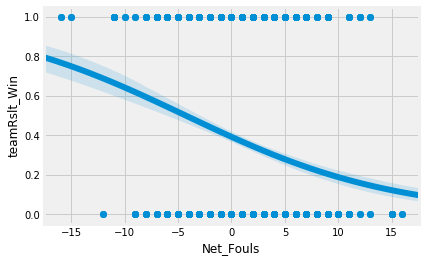

In [1059]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=suns, logistic=True)

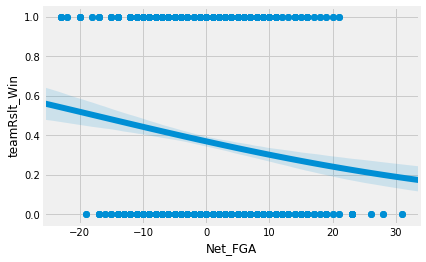

In [1060]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=suns, logistic=True)

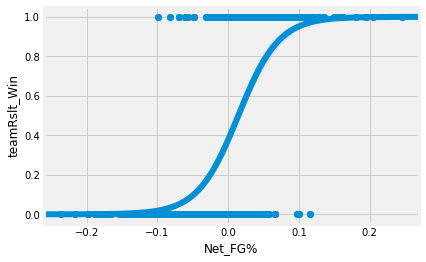

In [1061]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=suns, logistic=True)

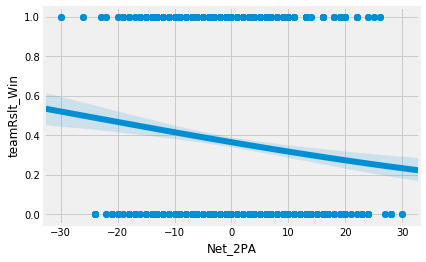

In [1062]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=suns, logistic=True)

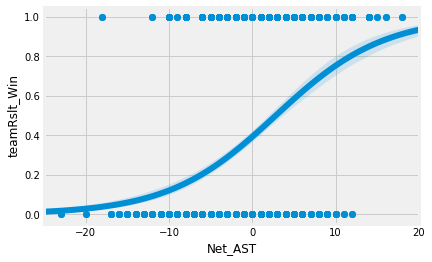

In [1063]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=suns, logistic=True)

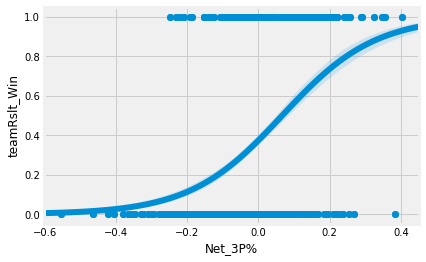

In [1064]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=suns, logistic=True)

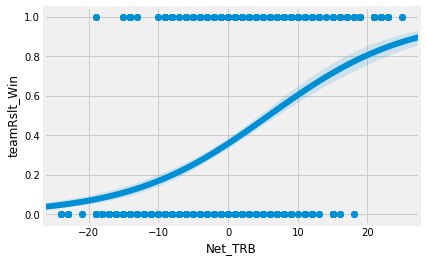

In [1065]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=suns, logistic=True)

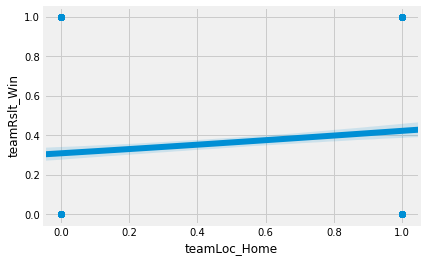

In [1066]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=suns, logistic=True)

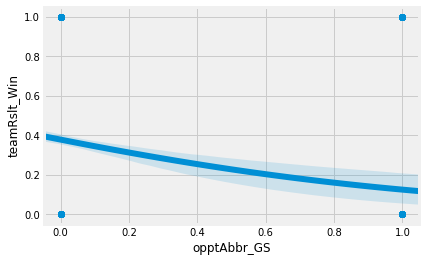

In [1067]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=suns, logistic=True)

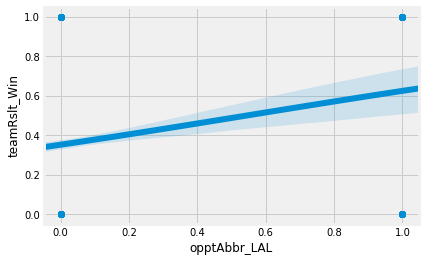

In [1068]:
#Scatter Plot for opptAbbr_LAL


sns.regplot(x='opptAbbr_LAL', y='teamRslt_Win', data=suns, logistic=True)

#### Sacramento Kings

In [1069]:
#Here I am just affirming the remaining columns in the kings subset

kings.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_ORL', 'opptAbbr_PHO', 'opptAbbr_SA'],
      dtype='object')

In [1070]:
#Here I am checking how many columns there are

kings.shape

(1476, 16)

In [1071]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

kings_1 = kings.iloc[:, 0:10]

In [1072]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

kings_2 = kings.iloc[:, 10:17]

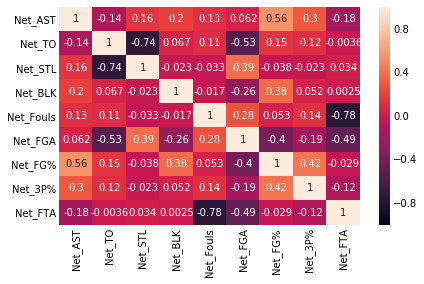

In [1073]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the kings subset

ax = sns.heatmap(kings_1.corr(), vmin = -1, vmax = 1, annot=True)

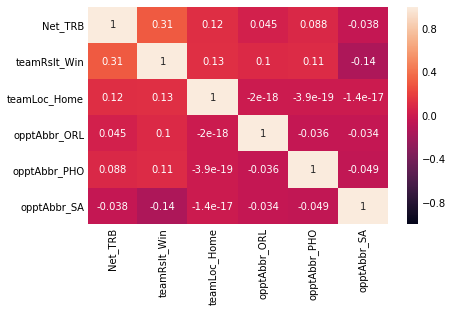

In [1074]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(kings_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1075]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the kings subset

kings = kings.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

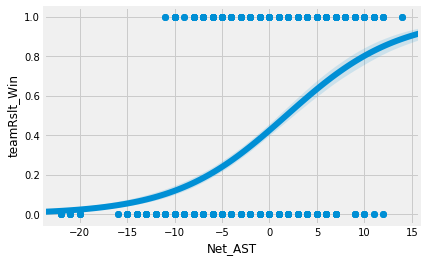

In [1076]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=kings, logistic=True)

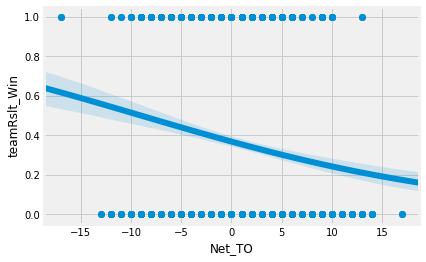

In [1077]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=kings, logistic=True)

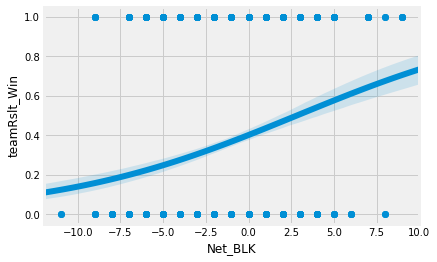

In [1078]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=kings, logistic=True)

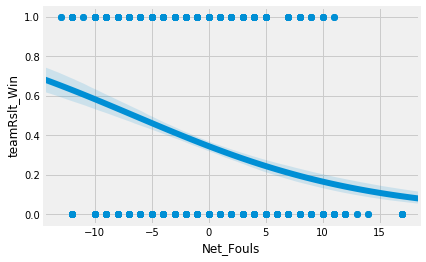

In [1079]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=kings, logistic=True)

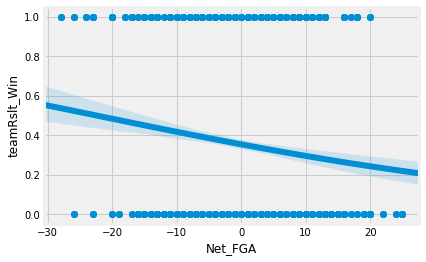

In [1080]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=kings, logistic=True)

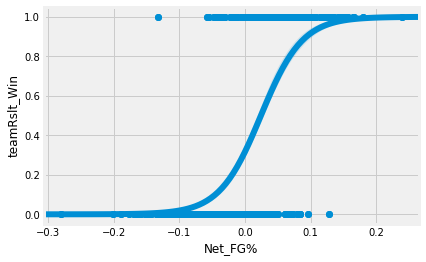

In [1081]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=kings, logistic=True)

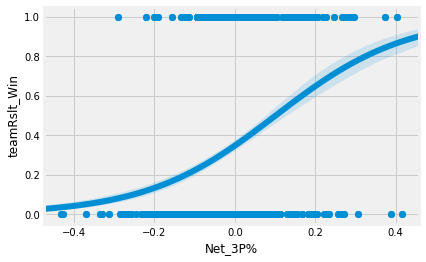

In [1082]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=kings, logistic=True)

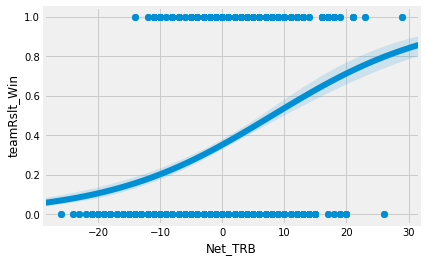

In [1083]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=kings, logistic=True)

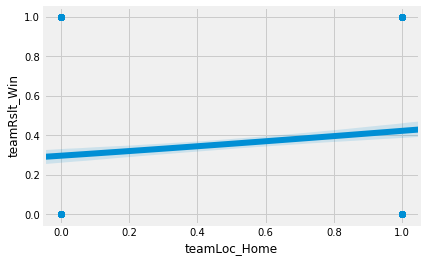

In [1084]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=kings, logistic=True)

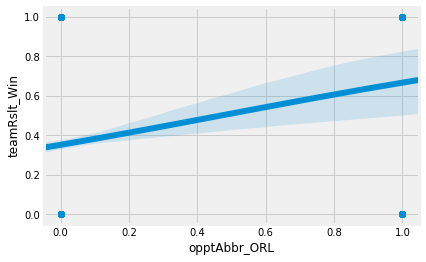

In [1085]:
#Scatter Plot for opptAbbr_ORL


sns.regplot(x='opptAbbr_ORL', y='teamRslt_Win', data=kings, logistic=True)

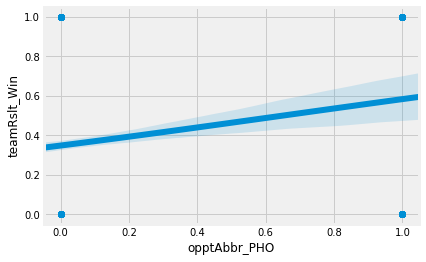

In [1086]:
#Scatter Plot for opptAbbr_PHO


sns.regplot(x='opptAbbr_PHO', y='teamRslt_Win', data=kings, logistic=True)

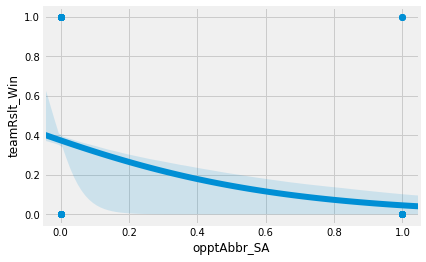

In [1087]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=kings, logistic=True)

#### Los Angeles Clippers

In [1088]:
#Here I am just affirming the remaining columns in the clippers subset

clippers.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_IND', 'opptAbbr_LAL',
       'opptAbbr_OKC', 'Off_Name_BrianForte'],
      dtype='object')

In [1089]:
#Here I am checking how many columns there are

clippers.shape

(1476, 18)

In [1090]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

clips_1 = clippers.iloc[:, 0:10]

In [1091]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

clips_2 = clippers.iloc[:, 10:19]

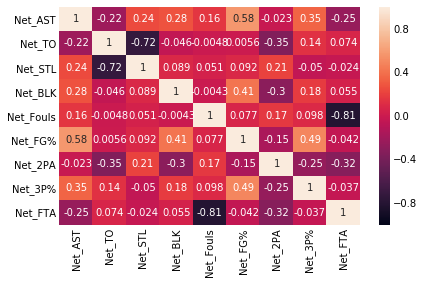

In [1092]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the clippers subset

ax = sns.heatmap(clips_1.corr(), vmin = -1, vmax = 1, annot=True)

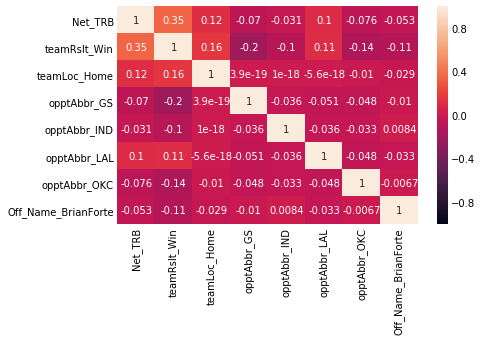

In [1093]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(clips_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1094]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the clippers subset

clippers = clippers.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

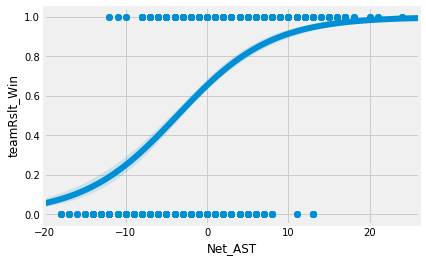

In [1095]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=clippers, logistic=True)

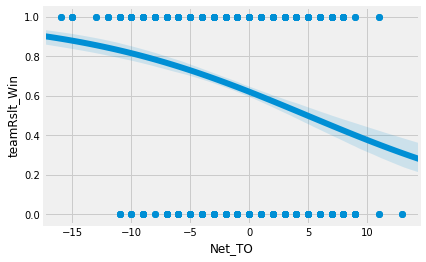

In [1096]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=clippers, logistic=True)

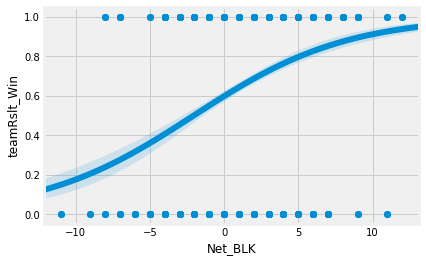

In [1097]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=clippers, logistic=True)

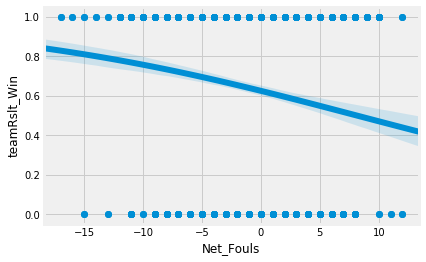

In [1098]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=clippers, logistic=True)

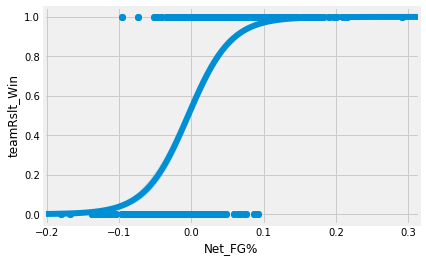

In [1099]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=clippers, logistic=True)

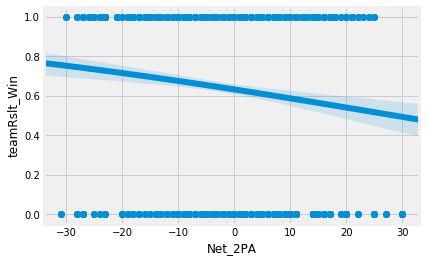

In [1100]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=clippers, logistic=True)

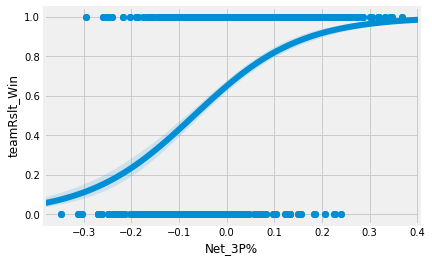

In [1101]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=clippers, logistic=True)

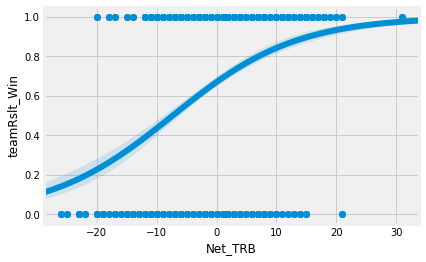

In [1102]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=clippers, logistic=True)

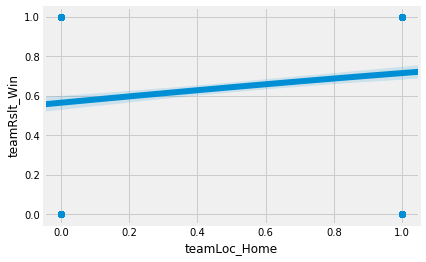

In [1103]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=clippers, logistic=True)

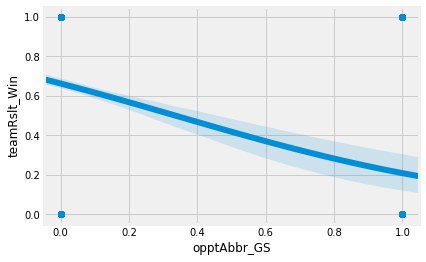

In [1104]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=clippers, logistic=True)

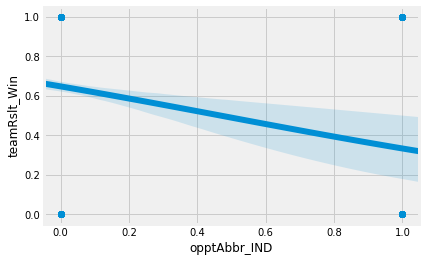

In [1105]:
#Scatter Plot for opptAbbr_IND


sns.regplot(x='opptAbbr_IND', y='teamRslt_Win', data=clippers, logistic=True)

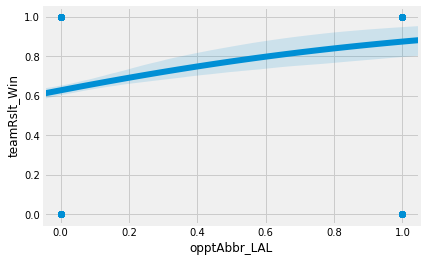

In [1106]:
#Scatter Plot for opptAbbr_LAL


sns.regplot(x='opptAbbr_LAL', y='teamRslt_Win', data=clippers, logistic=True)

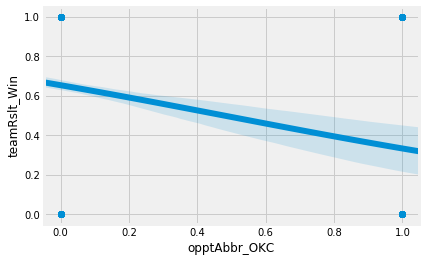

In [1107]:
#Scatter Plot for opptAbbr_OKC


sns.regplot(x='opptAbbr_OKC', y='teamRslt_Win', data=clippers, logistic=True)

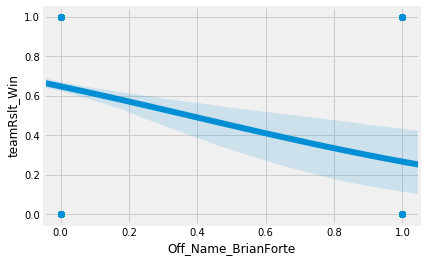

In [1108]:
#Scatter Plot for Off_Name_BrianForte


sns.regplot(x='Off_Name_BrianForte', y='teamRslt_Win', data=clippers, logistic=True)

#### Washington Wizards

In [1109]:
#Here I am just affirming the remaining columns in the wizards subset

wizards.columns

Index(['teamAbbr', 'Net_Day_Off', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK',
       'Net_Fouls', 'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_DAL', 'opptAbbr_GS', 'opptAbbr_NO',
       'opptAbbr_NY', 'opptAbbr_ORL', 'opptAbbr_TOR'],
      dtype='object')

In [1110]:
#Here I am checking how many columns there are

wizards.shape

(1476, 19)

In [1111]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

wiz_1 = wizards.iloc[:, 0:10]

In [1112]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

wiz_2 = wizards.iloc[:, 10:20]

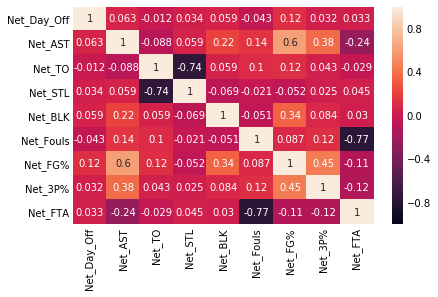

In [1113]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the wizards subset

ax = sns.heatmap(wiz_1.corr(), vmin = -1, vmax = 1, annot=True)

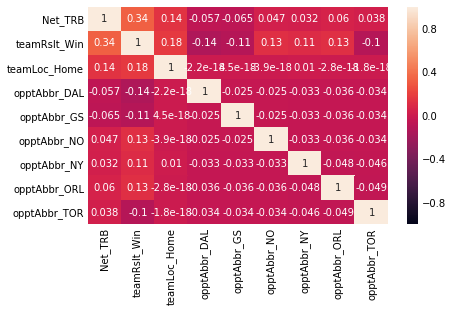

In [1114]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(wiz_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1115]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the wizards subset

wizards = wizards.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

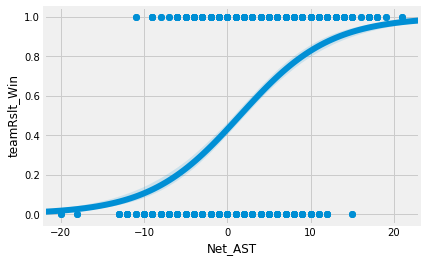

In [1116]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=wizards, logistic=True)

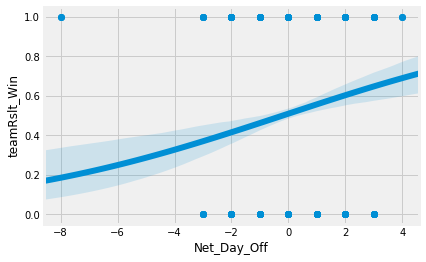

In [1117]:
#Scatter Plot for Net_Day_Off


sns.regplot(x='Net_Day_Off', y='teamRslt_Win', data=wizards, logistic=True)

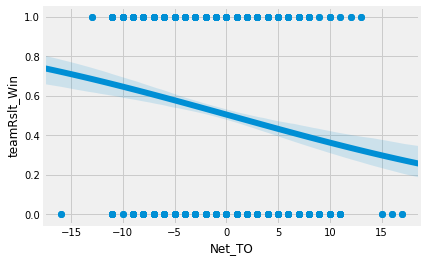

In [1118]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=wizards, logistic=True)

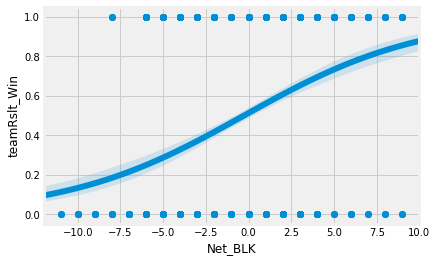

In [1119]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=wizards, logistic=True)

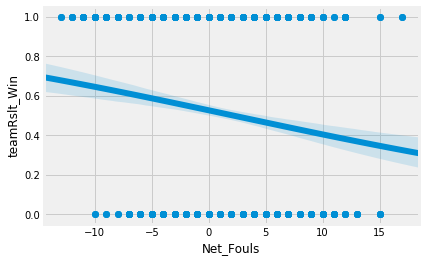

In [1120]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=wizards, logistic=True)

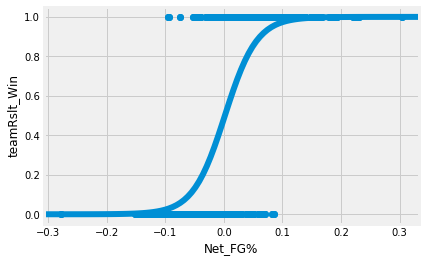

In [1121]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=wizards, logistic=True)

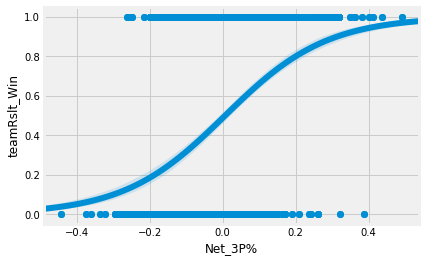

In [1122]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=wizards, logistic=True)

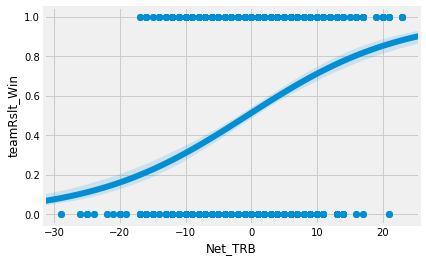

In [1123]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=wizards, logistic=True)

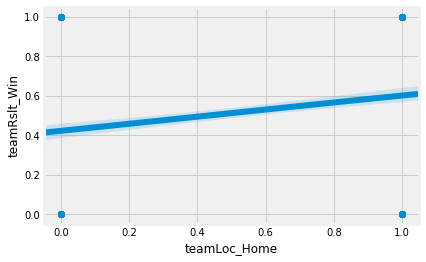

In [1124]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=wizards, logistic=True)

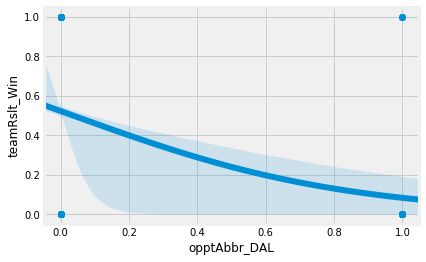

In [1125]:
#Scatter Plot for opptAbbr_DAL


sns.regplot(x='opptAbbr_DAL', y='teamRslt_Win', data=wizards, logistic=True)

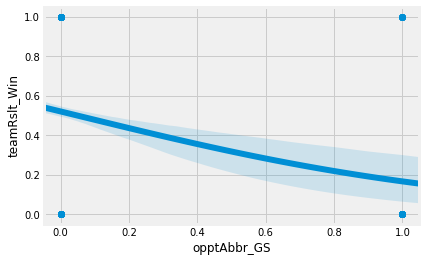

In [1126]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=wizards, logistic=True)

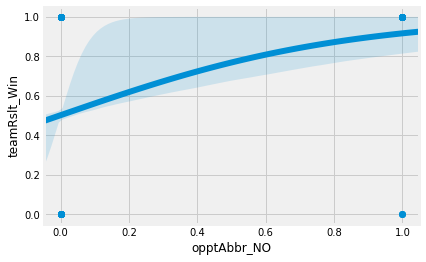

In [1127]:
#Scatter Plot for opptAbbr_NO


sns.regplot(x='opptAbbr_NO', y='teamRslt_Win', data=wizards, logistic=True)

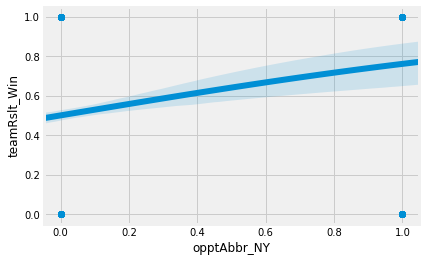

In [1128]:
#Scatter Plot for opptAbbr_NY


sns.regplot(x='opptAbbr_NY', y='teamRslt_Win', data=wizards, logistic=True)

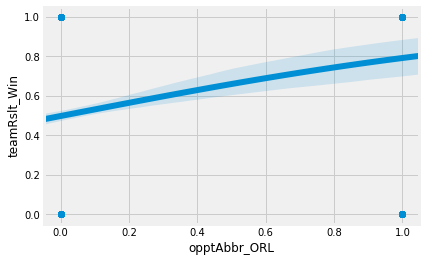

In [1129]:
#Scatter Plot for opptAbbr_ORL


sns.regplot(x='opptAbbr_ORL', y='teamRslt_Win', data=wizards, logistic=True)

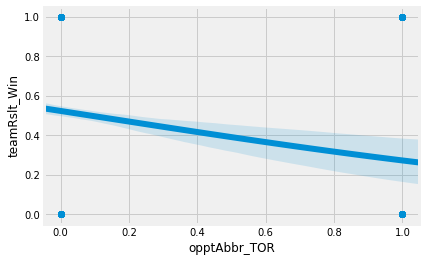

In [1130]:
#Scatter Plot for opptAbbr_TOR


sns.regplot(x='opptAbbr_TOR', y='teamRslt_Win', data=wizards, logistic=True)

#### New York Knicks

In [1131]:
#Here I am just affirming the remaining columns in the knicks subset

knicks.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_HOU', 'opptAbbr_LAC', 'opptAbbr_PHI'],
      dtype='object')

In [1132]:
#Here I am checking how many columns there are

knicks.shape

(1476, 16)

In [1133]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

knicks_1 = knicks.iloc[:, 0:10]

In [1134]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

knicks_2 = knicks.iloc[:, 10:17]

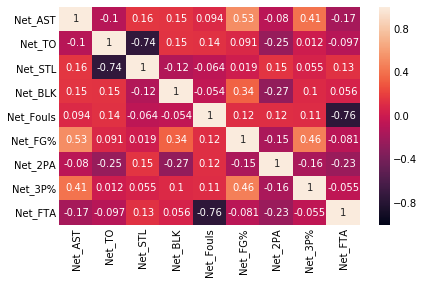

In [1135]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the knicks subset

ax = sns.heatmap(knicks_1.corr(), vmin = -1, vmax = 1, annot=True)

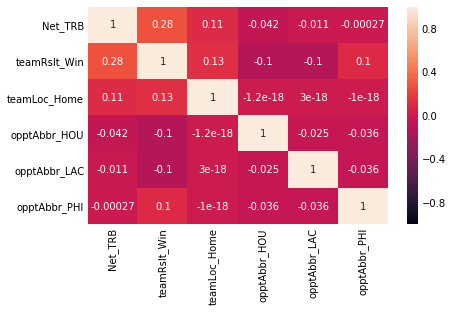

In [1136]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(knicks_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1137]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the knicks subset

knicks = knicks.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

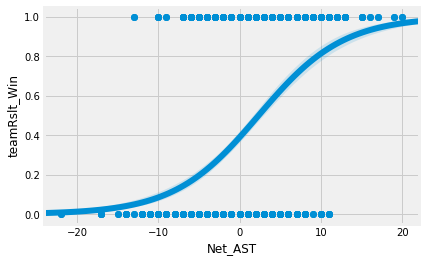

In [1138]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=knicks, logistic=True)

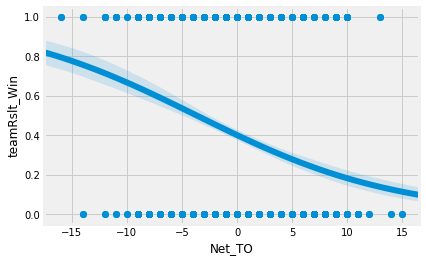

In [1139]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=knicks, logistic=True)

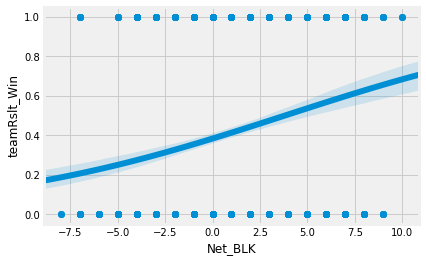

In [1140]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=knicks, logistic=True)

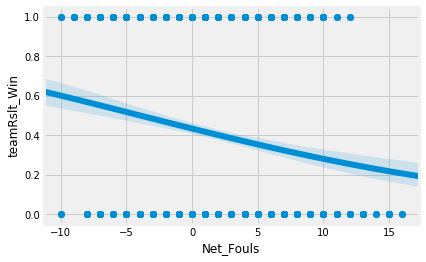

In [1141]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=knicks, logistic=True)

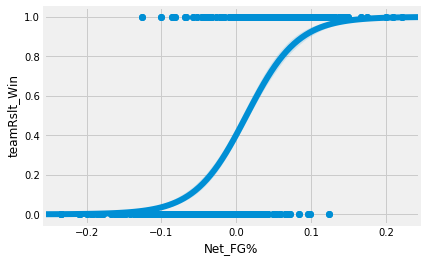

In [1142]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=knicks, logistic=True)

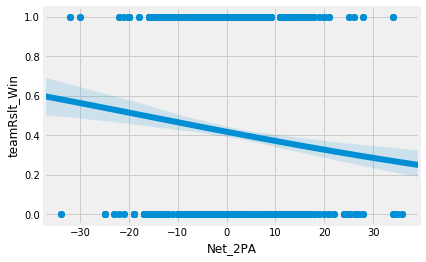

In [1143]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=knicks, logistic=True)

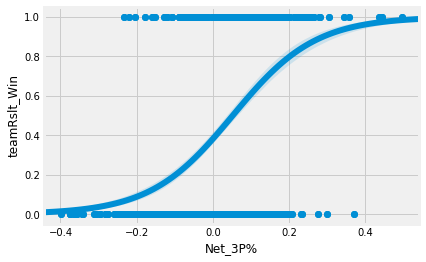

In [1144]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=knicks, logistic=True)

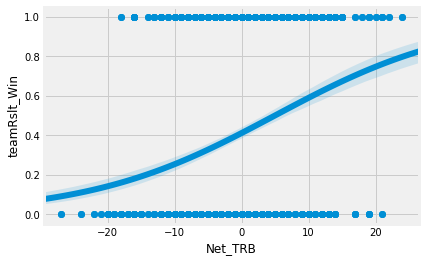

In [1145]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=knicks, logistic=True)

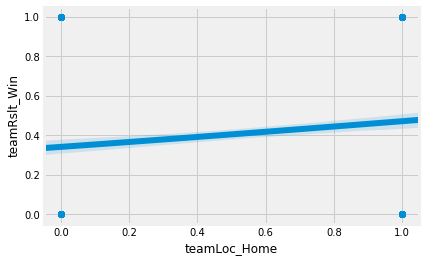

In [1146]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=knicks, logistic=True)

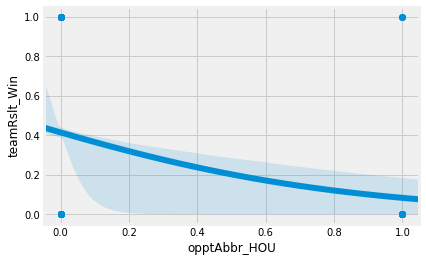

In [1147]:
#Scatter Plot for opptAbbr_HOU


sns.regplot(x='opptAbbr_HOU', y='teamRslt_Win', data=knicks, logistic=True)

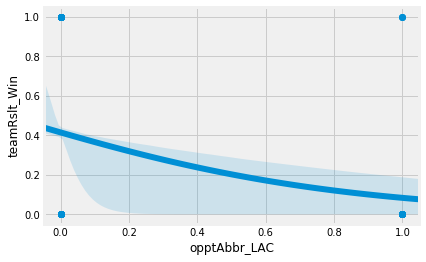

In [1148]:
#Scatter Plot for opptAbbr_LAC


sns.regplot(x='opptAbbr_LAC', y='teamRslt_Win', data=knicks, logistic=True)

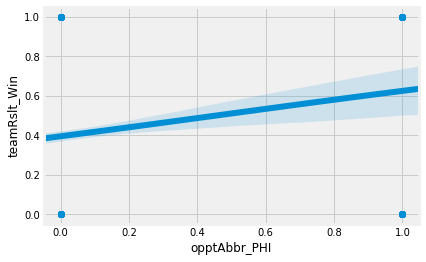

In [1149]:
#Scatter Plot for opptAbbr_PHI


sns.regplot(x='opptAbbr_PHI', y='teamRslt_Win', data=knicks, logistic=True)

#### Houston Rockets

In [1150]:
#Here I am just affirming the remaining columns in the rockets subset

rockets.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_2PA', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_LAC',
       'opptAbbr_MIN'],
      dtype='object')

In [1151]:
#Here I am checking how many columns there are

rockets.shape

(1476, 17)

In [1152]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

rocks_1 = rockets.iloc[:, 0:11]

In [1153]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

rocks_2 = rockets.iloc[:, 11:18]

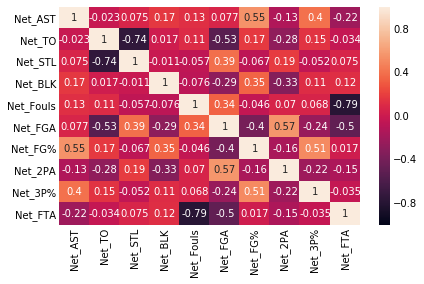

In [1154]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the rockets subset

ax = sns.heatmap(rocks_1.corr(), vmin = -1, vmax = 1, annot=True)

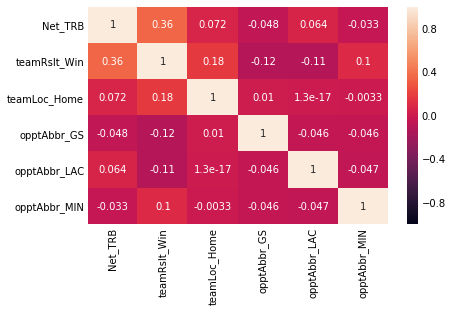

In [1155]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(rocks_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1156]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the rockets subset

rockets = rockets.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

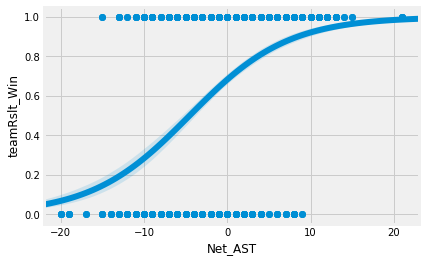

In [1157]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=rockets, logistic=True)

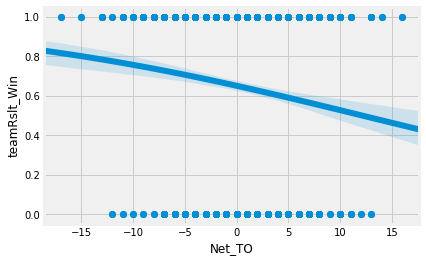

In [1158]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=rockets, logistic=True)

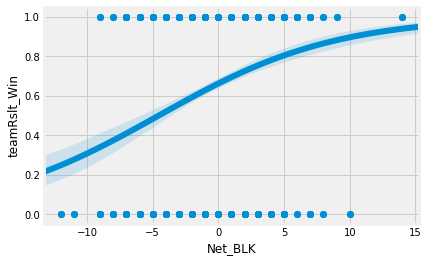

In [1159]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=rockets, logistic=True)

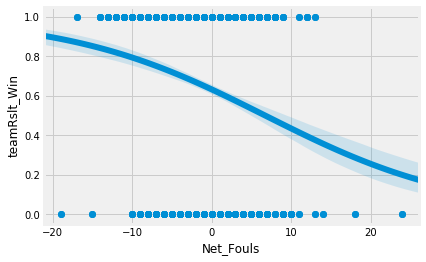

In [1160]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=rockets, logistic=True)

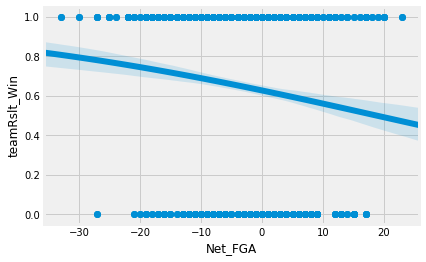

In [1161]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=rockets, logistic=True)

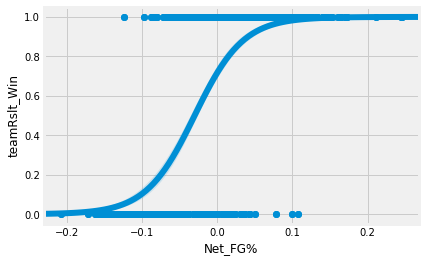

In [1162]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=rockets, logistic=True)

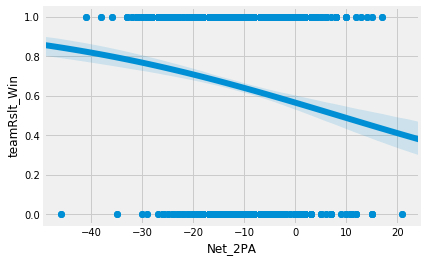

In [1163]:
#Scatter Plot for Net_2PA


sns.regplot(x='Net_2PA', y='teamRslt_Win', data=rockets, logistic=True)

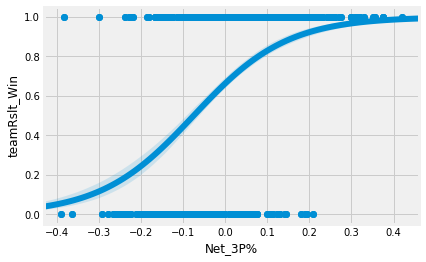

In [1164]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=rockets, logistic=True)

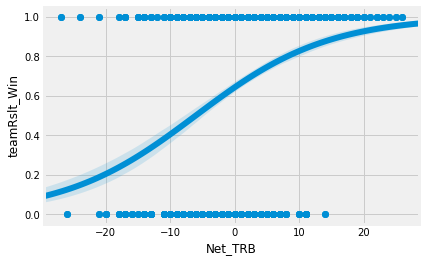

In [1165]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=rockets, logistic=True)

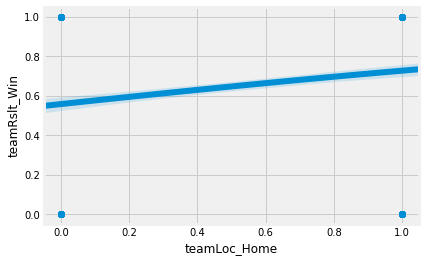

In [1166]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=rockets, logistic=True)

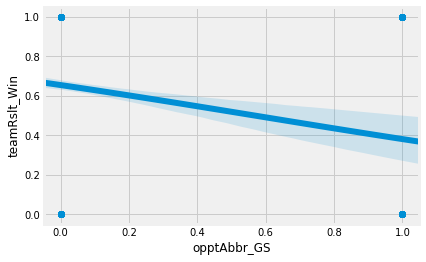

In [1167]:
#Scatter Plot for opptAbbr_GS


sns.regplot(x='opptAbbr_GS', y='teamRslt_Win', data=rockets, logistic=True)

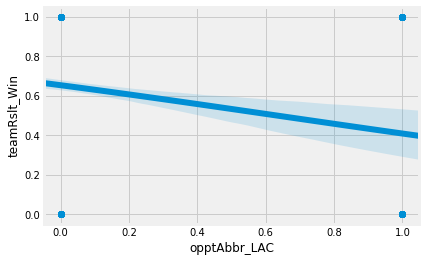

In [1168]:
#Scatter Plot for opptAbbr_LAC


sns.regplot(x='opptAbbr_LAC', y='teamRslt_Win', data=rockets, logistic=True)

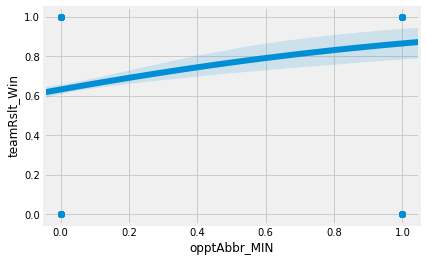

In [1169]:
#Scatter Plot for opptAbbr_MIN


sns.regplot(x='opptAbbr_MIN', y='teamRslt_Win', data=rockets, logistic=True)

#### Brooklyn Nets

In [1170]:
#Here I am just affirming the remaining columns in the nets subset

nets.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_PHO'],
      dtype='object')

In [1171]:
#Here I am checking how many columns there are

nets.shape

(1476, 13)

In [1172]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

nets_1 = nets.iloc[:, 0:9]

In [1173]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

nets_2 = nets.iloc[:, 9:14]

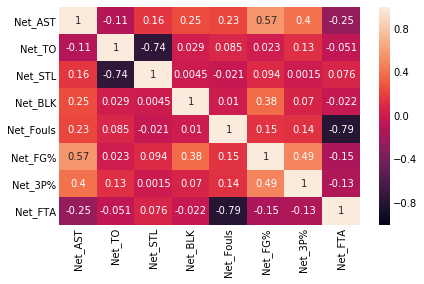

In [1174]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the nets subset

ax = sns.heatmap(nets_1.corr(), vmin = -1, vmax = 1, annot=True)

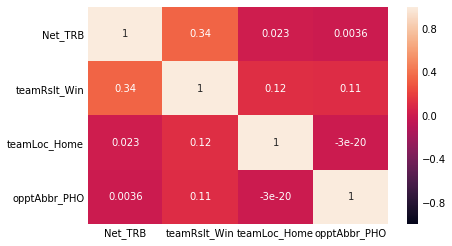

In [1175]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(nets_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1176]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the nets subset

nets = nets.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

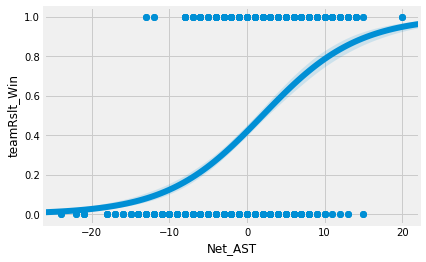

In [1177]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=nets, logistic=True)

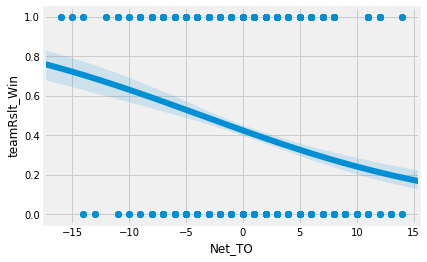

In [1178]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=nets, logistic=True)

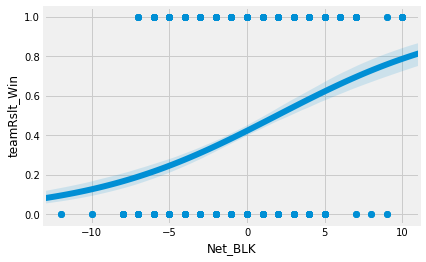

In [1179]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=nets, logistic=True)

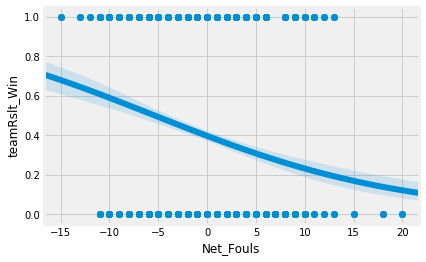

In [1180]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=nets, logistic=True)

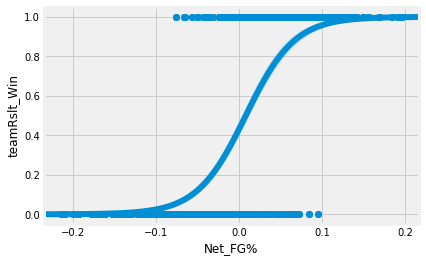

In [1181]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=nets, logistic=True)

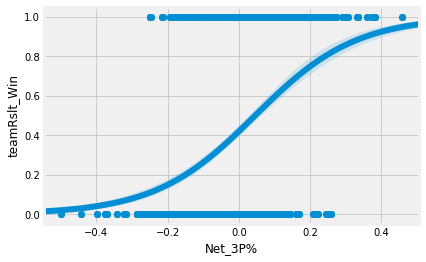

In [1182]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=nets, logistic=True)

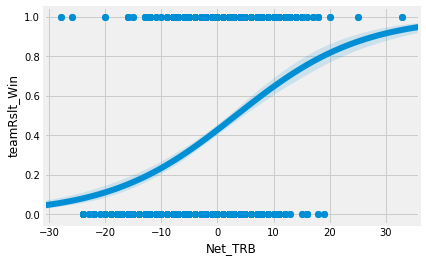

In [1183]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=nets, logistic=True)

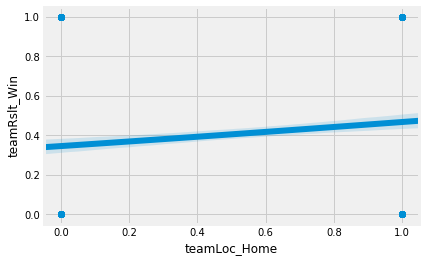

In [1184]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=nets, logistic=True)

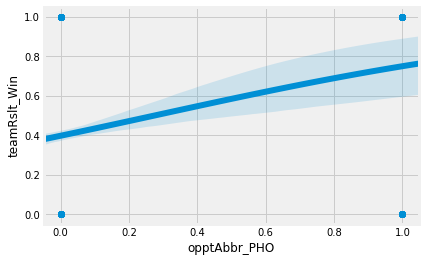

In [1185]:
#Scatter Plot for opptAbbr_PHO


sns.regplot(x='opptAbbr_PHO', y='teamRslt_Win', data=nets, logistic=True)

#### Golden State Warriors

In [1186]:
#Here I am just affirming the remaining columns in the warriors subset

warriors.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_2PA', 'Net_3PA', 'Net_3P%', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_SA'],
      dtype='object')

In [1187]:
#Here I am checking how many columns there are

warriors.shape

(1476, 14)

In [1188]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

wars_1 = warriors.iloc[:, 0:9]

In [1189]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

wars_2 = warriors.iloc[:, 9:15]

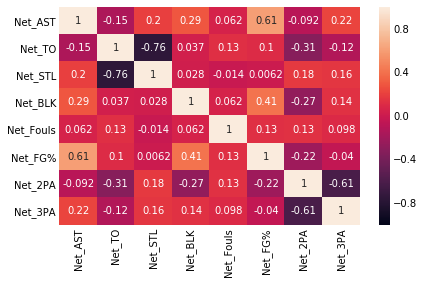

In [1190]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_2PA and Net_3PA are highly correlated with each other
#I am going to drop Net Steals and Net Three Point Attempts from the warriors subset

ax = sns.heatmap(wars_1.corr(), vmin = -1, vmax = 1, annot=True)

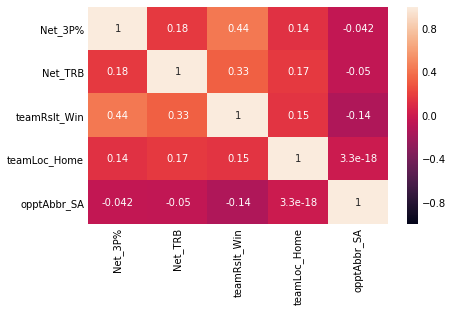

In [1191]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(wars_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1192]:
#Here I am officially dropping Net Steals and Net Two Point Attempts from the warriors subset

warriors = warriors.drop(['Net_STL', 'Net_2PA'], axis = 'columns')

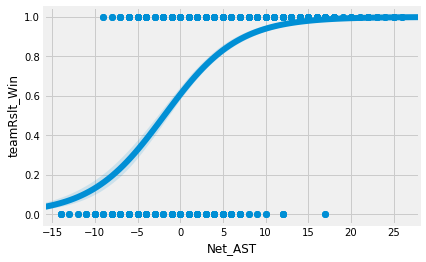

In [1193]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=warriors, logistic=True)

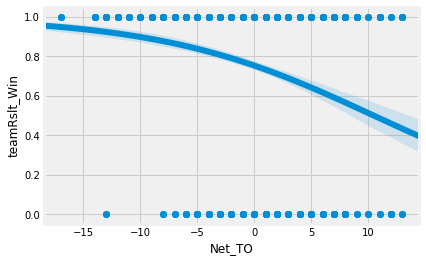

In [1194]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=warriors, logistic=True)

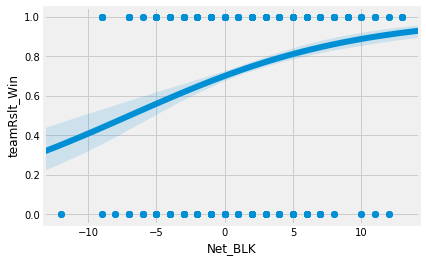

In [1195]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=warriors, logistic=True)

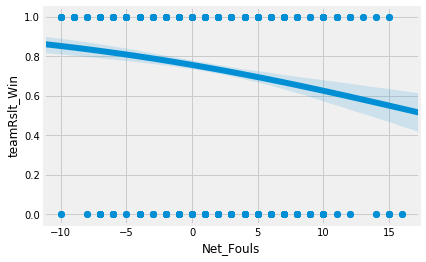

In [1196]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=warriors, logistic=True)

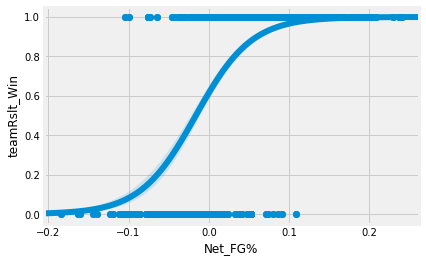

In [1197]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=warriors, logistic=True)

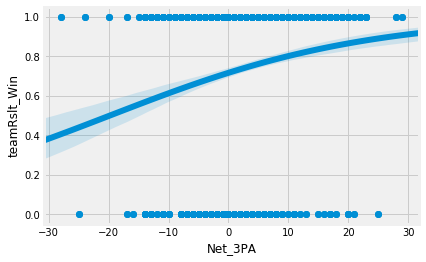

In [1198]:
#Scatter Plot for Net_3PA


sns.regplot(x='Net_3PA', y='teamRslt_Win', data=warriors, logistic=True)

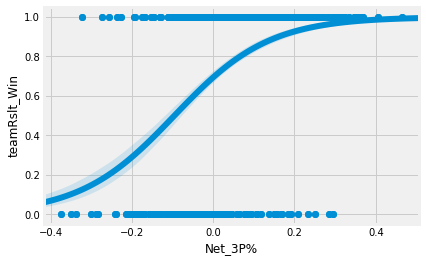

In [1199]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=warriors, logistic=True)

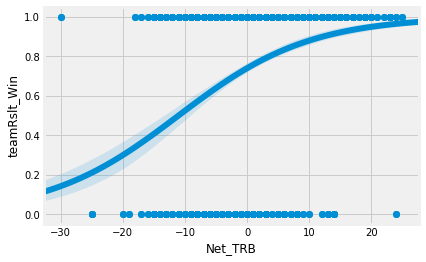

In [1200]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=warriors, logistic=True)

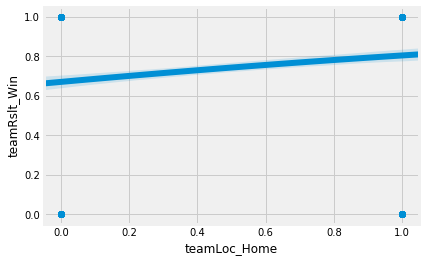

In [1201]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=warriors, logistic=True)

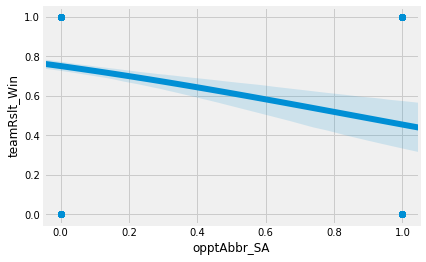

In [1202]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=warriors, logistic=True)

#### Detroit Pistons

In [1203]:
#Here I am just affirming the remaining columns in the pistons subset

pistons.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_NO'],
      dtype='object')

In [1204]:
#Here I am checking how many columns there are

pistons.shape

(1475, 13)

In [1205]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

pist_1 = pistons.iloc[:, 0:9]

In [1206]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

pist_2 = pistons.iloc[:, 9:14]

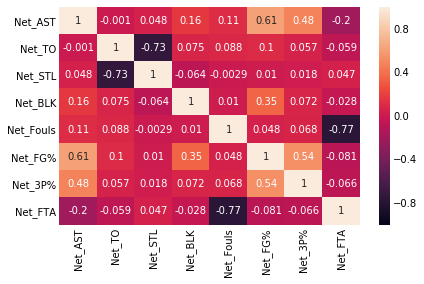

In [1207]:
#Here is the first heatmap to check for collinearity
#Like on the first project, Net Steals and Net Turnovers are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the pistons subset

ax = sns.heatmap(pist_1.corr(), vmin = -1, vmax = 1, annot=True)

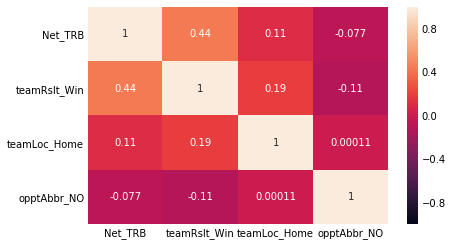

In [1208]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(pist_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1209]:
#Here I am officially dropping Net Steals and Net Free Throw Attempts from the pistons subset

pistons = pistons.drop(['Net_STL', 'Net_FTA'], axis = 'columns')

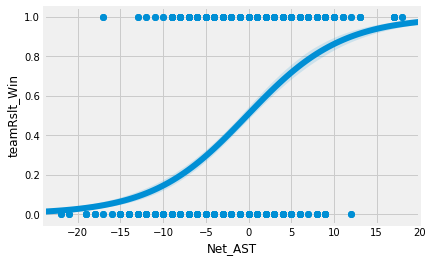

In [1210]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=pistons, logistic=True)

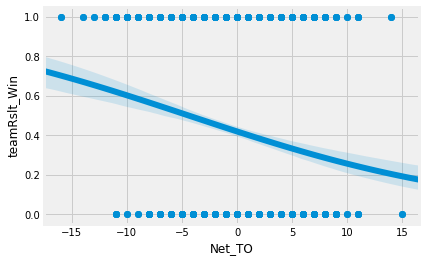

In [1211]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=pistons, logistic=True)

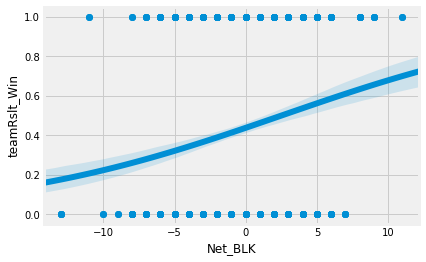

In [1212]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=pistons, logistic=True)

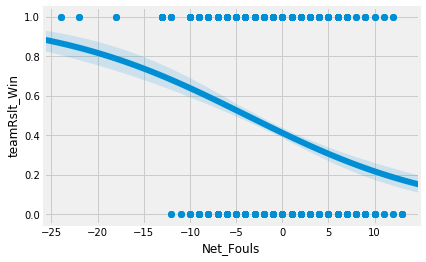

In [1213]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=pistons, logistic=True)

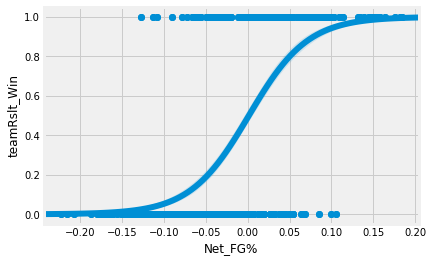

In [1214]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=pistons, logistic=True)

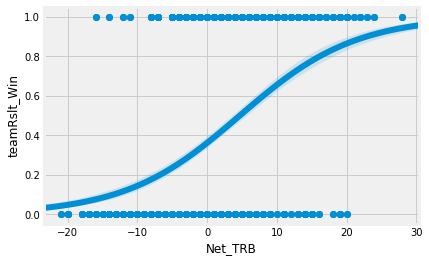

In [1215]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=pistons, logistic=True)

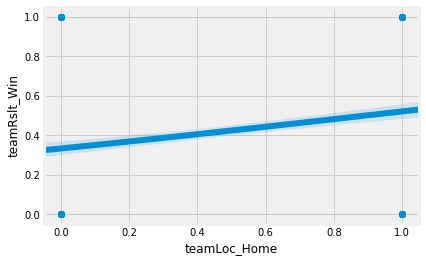

In [1216]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=pistons, logistic=True)

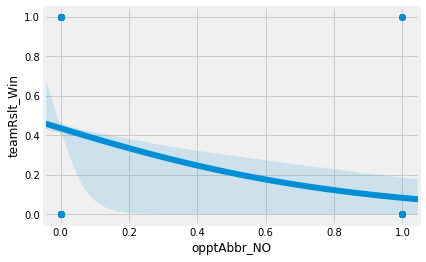

In [1217]:
#Scatter Plot for opptAbbr_NO


sns.regplot(x='opptAbbr_NO', y='teamRslt_Win', data=pistons, logistic=True)

#### Charlotte Hornets

In [1218]:
#Here I am just affirming the remaining columns in the hornets subset

hornets.columns

Index(['teamAbbr', 'Net_AST', 'Net_STL', 'Net_BLK', 'Net_Fouls', 'Net_FG%',
       'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win', 'teamLoc_Home',
       'opptAbbr_HOU', 'opptAbbr_ORL', 'opptAbbr_SA'],
      dtype='object')

In [1219]:
#Here I am checking how many columns there are

hornets.shape

(1475, 14)

In [1220]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

horns_1 = hornets.iloc[:, 0:8]

In [1221]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

horns_2 = hornets.iloc[:, 8:15]

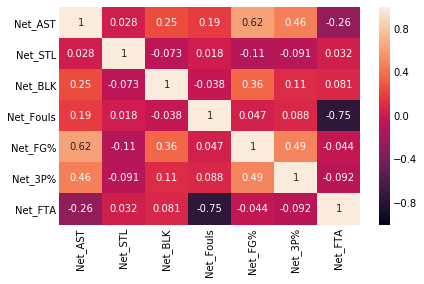

In [1222]:
#Here is the first heatmap to check for collinearity
#Net Turnovers apparently are not in this subset
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Free Throw Attempts from the hornets subset

ax = sns.heatmap(horns_1.corr(), vmin = -1, vmax = 1, annot=True)

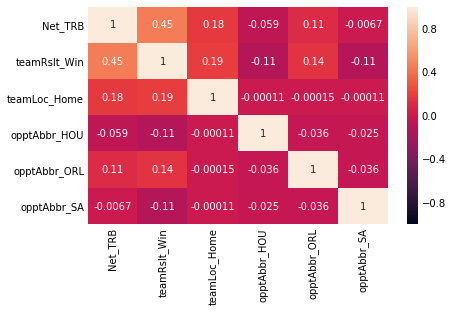

In [1223]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(horns_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1224]:
#Here I am officially dropping Net Free Throw Attempts from the hornets subset

hornets = hornets.drop(['Net_FTA'], axis = 'columns')

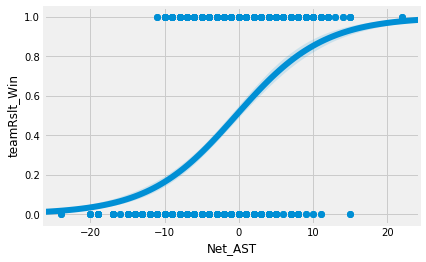

In [1225]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=hornets, logistic=True)

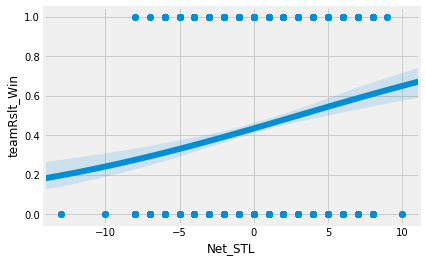

In [1226]:
#Scatter Plot for Net_STL


sns.regplot(x='Net_STL', y='teamRslt_Win', data=hornets, logistic=True)

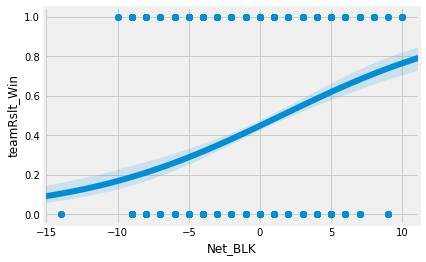

In [1227]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=hornets, logistic=True)

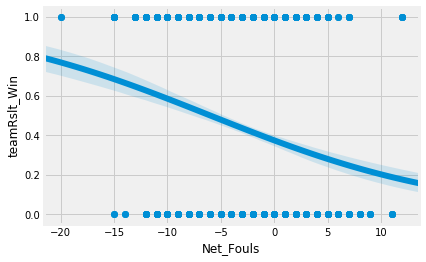

In [1228]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=hornets, logistic=True)

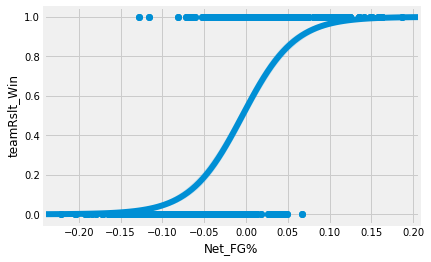

In [1229]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=hornets, logistic=True)

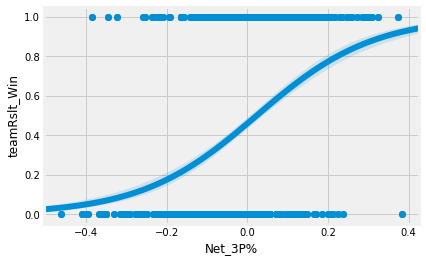

In [1230]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=hornets, logistic=True)

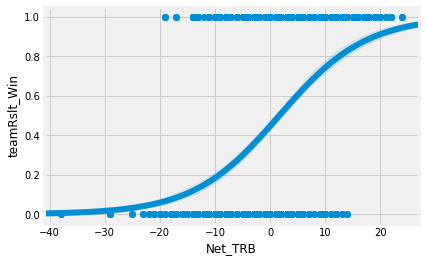

In [1231]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=hornets, logistic=True)

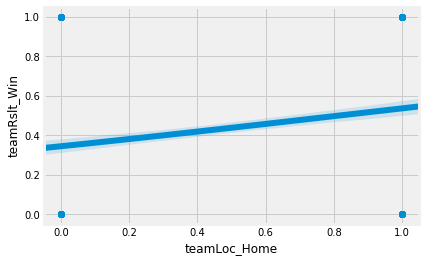

In [1232]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=hornets, logistic=True)

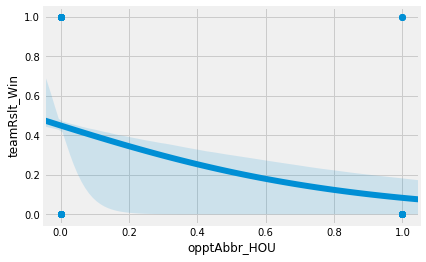

In [1233]:
#Scatter Plot for opptAbbr_HOU


sns.regplot(x='opptAbbr_HOU', y='teamRslt_Win', data=hornets, logistic=True)

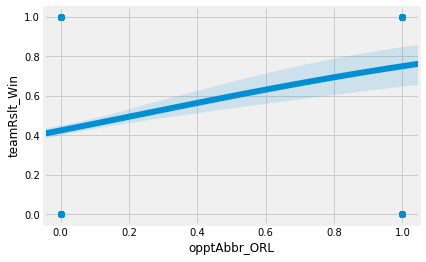

In [1234]:
#Scatter Plot for opptAbbr_ORL


sns.regplot(x='opptAbbr_ORL', y='teamRslt_Win', data=hornets, logistic=True)

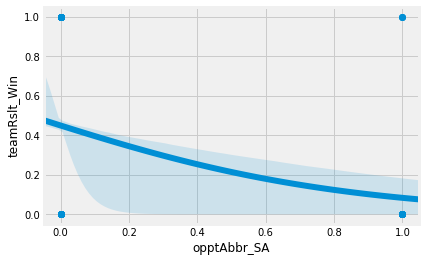

In [1235]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=hornets, logistic=True)

#### Indiana Pacers

In [1236]:
#Here I am just affirming the remaining columns in the pacers subset

pacers.columns

Index(['teamAbbr', 'Net_Day_Off', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK',
       'Net_Fouls', 'Net_FGA', 'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB',
       'teamRslt_Win', 'teamLoc_Home', 'opptAbbr_DEN', 'opptAbbr_ORL',
       'opptAbbr_POR', 'opptAbbr_TOR'],
      dtype='object')

In [1237]:
#Here I am checking how many columns there are

pacers.shape

(1473, 18)

In [1238]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

pace_1 = pacers.iloc[:, 0:11]

In [1239]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

pace_2 = pacers.iloc[:, 11:19]

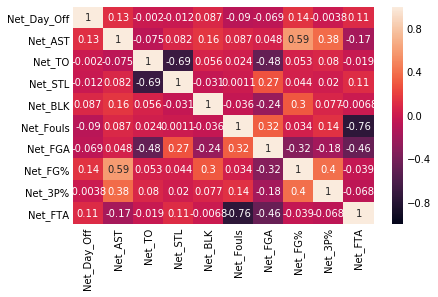

In [1240]:
#Here is the first heatmap to check for collinearity
#Like in the previous project, Net_TO and Net_STL are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the pacers subset

ax = sns.heatmap(pace_1.corr(), vmin = -1, vmax = 1, annot=True)

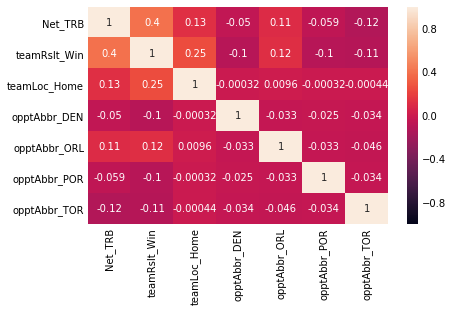

In [1241]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(pace_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1242]:
#Here I am officially dropping Net Free Throw Attempts from the pacers subset

pacers = pacers.drop(['Net_STL','Net_FTA'], axis = 'columns')

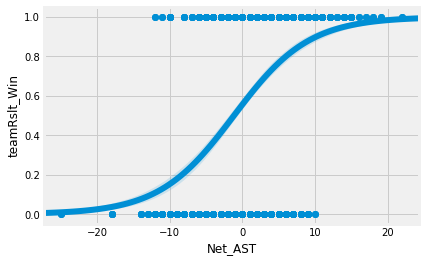

In [1243]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=pacers, logistic=True)

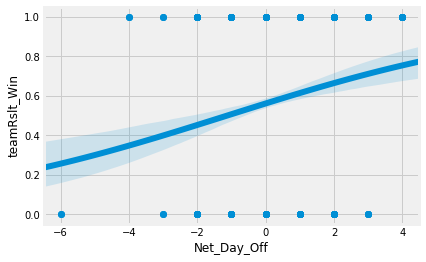

In [1244]:
#Scatter Plot for Net_Day_Off


sns.regplot(x='Net_Day_Off', y='teamRslt_Win', data=pacers, logistic=True)

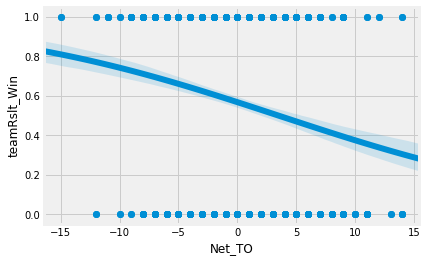

In [1245]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=pacers, logistic=True)

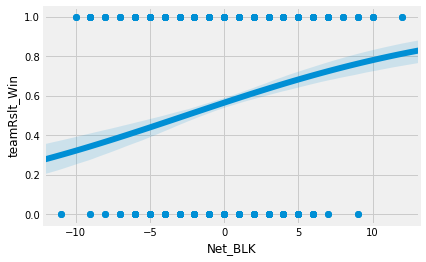

In [1246]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=pacers, logistic=True)

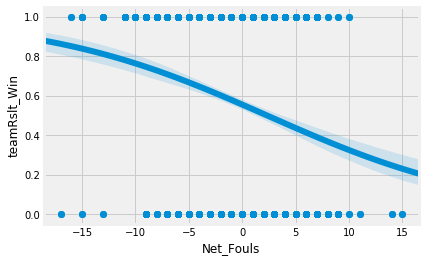

In [1247]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=pacers, logistic=True)

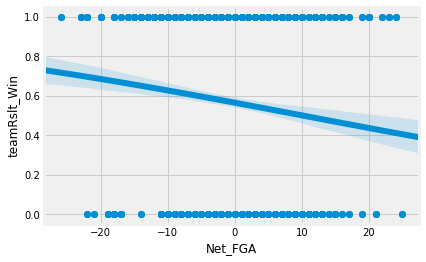

In [1248]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=pacers, logistic=True)

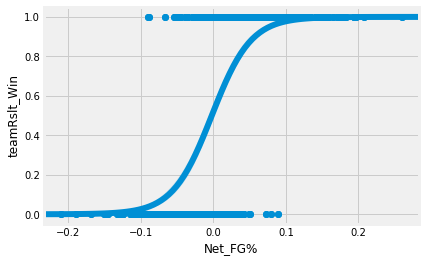

In [1249]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=pacers, logistic=True)

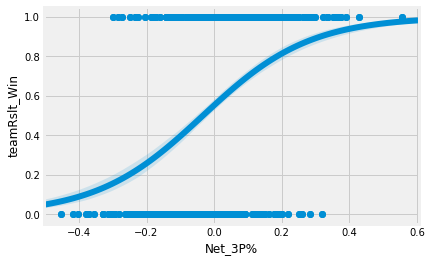

In [1250]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=pacers, logistic=True)

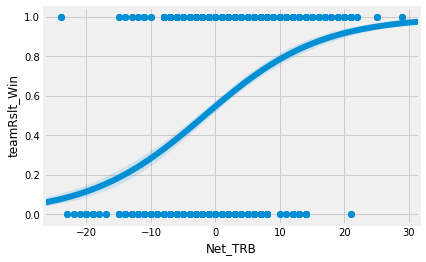

In [1251]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=pacers, logistic=True)

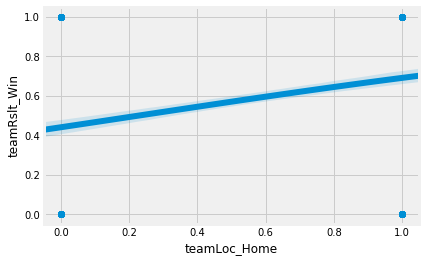

In [1252]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=pacers, logistic=True)

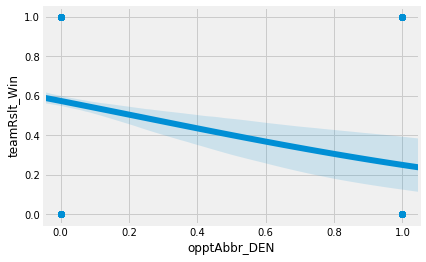

In [1253]:
#Scatter Plot for opptAbbr_DEN


sns.regplot(x='opptAbbr_DEN', y='teamRslt_Win', data=pacers, logistic=True)

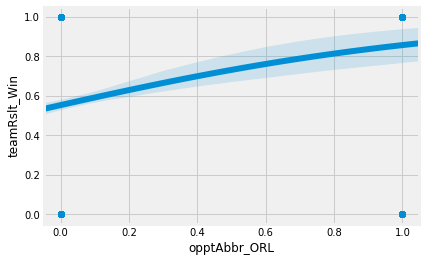

In [1254]:
#Scatter Plot for opptAbbr_ORL


sns.regplot(x='opptAbbr_ORL', y='teamRslt_Win', data=pacers, logistic=True)

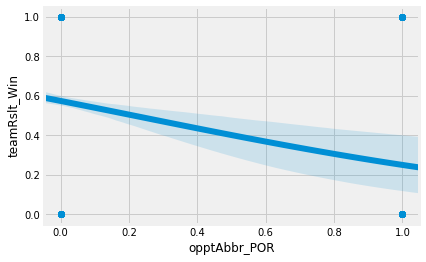

In [1255]:
#Scatter Plot for opptAbbr_POR


sns.regplot(x='opptAbbr_POR', y='teamRslt_Win', data=pacers, logistic=True)

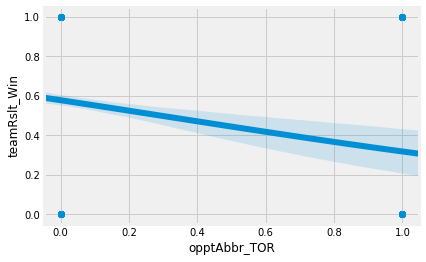

In [1256]:
#Scatter Plot for opptAbbr_TOR


sns.regplot(x='opptAbbr_TOR', y='teamRslt_Win', data=pacers, logistic=True)

#### Boston Celtics

In [1257]:
#Here I am just affirming the remaining columns in the celtics subset

celtics.columns

Index(['teamAbbr', 'Net_AST', 'Net_TO', 'Net_STL', 'Net_BLK', 'Net_Fouls',
       'Net_FGA', 'Net_FG%', 'Net_3P%', 'Net_FTA', 'Net_TRB', 'teamRslt_Win',
       'teamLoc_Home', 'opptAbbr_SA'],
      dtype='object')

In [1258]:
#Here I am checking how many columns there are

celtics.shape

(1473, 14)

In [1259]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

celtics_1 = celtics.iloc[:, 0:10]

In [1260]:
#Here I am splitting the dataset up so the correlation heat map looks more legible 

celtics_2 = celtics.iloc[:, 10:15]

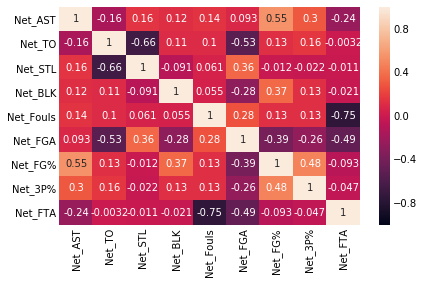

In [1261]:
#Here is the first heatmap to check for collinearity
#Like in the previous project, Net_TO and Net_STL are highly correlated with each other
#Also, Net_FTA and Net_Fouls are highly correlated with each other
#I am going to drop Net Steals and Net Free Throw Attempts from the celtics subset

ax = sns.heatmap(celtics_1.corr(), vmin = -1, vmax = 1, annot=True)

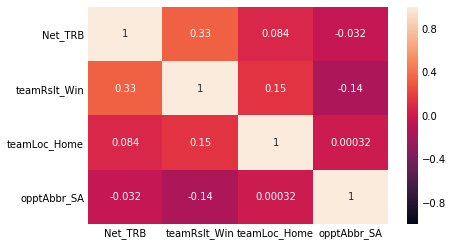

In [1262]:
#Here is the second heatmap to check for collinearity
#No variables to worry about here

ax = sns.heatmap(celtics_2.corr(), vmin = -1, vmax = 1, annot=True)

In [1263]:
#Here I am officially dropping Net Free Throw Attempts from the celtics subset

celtics = celtics.drop(['Net_STL','Net_FTA'], axis = 'columns')

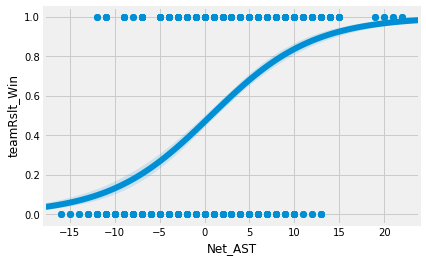

In [1264]:
#Scatter Plot for Net_AST


sns.regplot(x='Net_AST', y='teamRslt_Win', data=celtics, logistic=True)

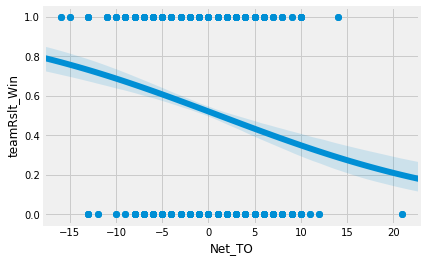

In [1265]:
#Scatter Plot for Net_TO


sns.regplot(x='Net_TO', y='teamRslt_Win', data=celtics, logistic=True)

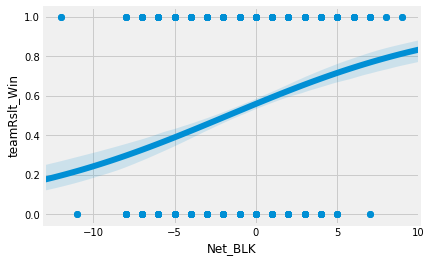

In [1266]:
#Scatter Plot for Net_BLK


sns.regplot(x='Net_BLK', y='teamRslt_Win', data=celtics, logistic=True)

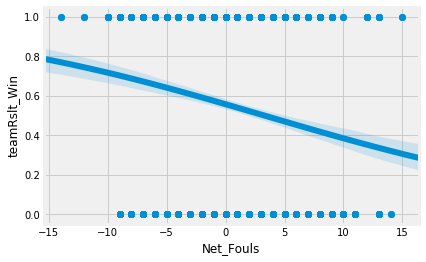

In [1267]:
#Scatter Plot for Net_Fouls


sns.regplot(x='Net_Fouls', y='teamRslt_Win', data=celtics, logistic=True)

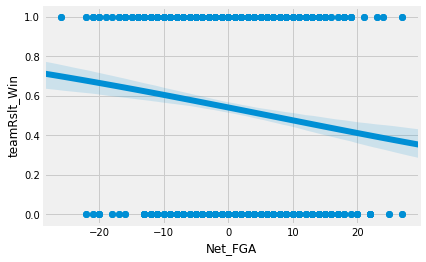

In [1268]:
#Scatter Plot for Net_FGA


sns.regplot(x='Net_FGA', y='teamRslt_Win', data=celtics, logistic=True)

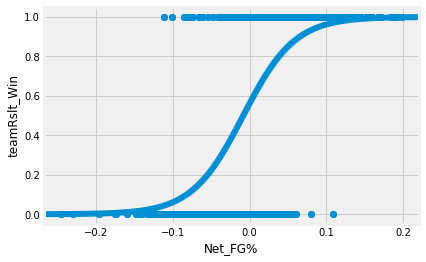

In [1269]:
#Scatter Plot for Net_FG%


sns.regplot(x='Net_FG%', y='teamRslt_Win', data=celtics, logistic=True)

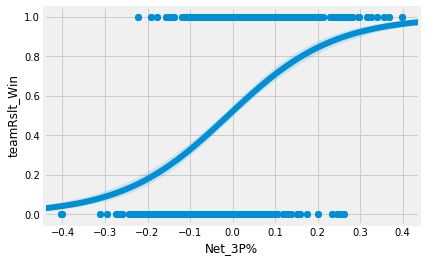

In [1270]:
#Scatter Plot for Net_3P%


sns.regplot(x='Net_3P%', y='teamRslt_Win', data=celtics, logistic=True)

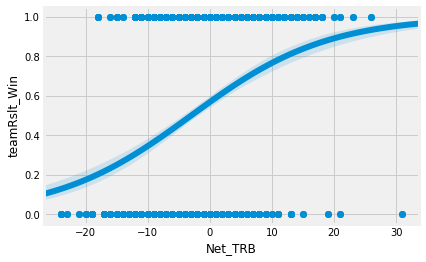

In [1271]:
#Scatter Plot for Net_TRB


sns.regplot(x='Net_TRB', y='teamRslt_Win', data=celtics, logistic=True)

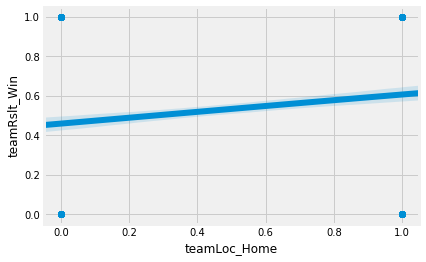

In [1272]:
#Scatter Plot for teamLoc_Home


sns.regplot(x='teamLoc_Home', y='teamRslt_Win', data=celtics, logistic=True)

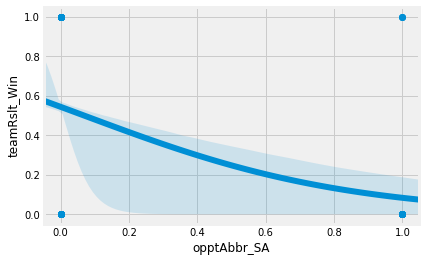

In [1273]:
#Scatter Plot for opptAbbr_SA


sns.regplot(x='opptAbbr_SA', y='teamRslt_Win', data=celtics, logistic=True)

# Building Logistic Regression Model

#### Denver Nuggets

In [1274]:
nuggets = nuggets.drop('teamAbbr', axis = 'columns')

In [1275]:
nuggets.shape

(1478, 14)

In [1276]:
#Separating X and y values

X = nuggets.drop('teamRslt_Win', axis='columns')
y = nuggets.loc[:, 'teamRslt_Win']

In [1277]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1278]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1279]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1280]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 1 0 1
 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 1 0 1 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 1 0
 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 1 1
 1 1 1 1 1 0 1 1 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 0 0 1 0 1 1 0 0 1 1 0
 0 0 1 1 1 0 1 1 1 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 1 0 1 1
 0 1 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1 0 1 1 0
 0 0 0 0 1 0 1 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 0
 1 0 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 1
 0 1 0 1 1 1 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 1 0 0 1 1
 0 0 1 1 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 1 1 0 1]


In [1281]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.881768953068592
0.8918918918918919


In [1282]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[180  17]
 [ 23 150]]


In [1283]:
#Accuracy of our model, 89% accuracy

(180+150)/370

0.8918918918918919

In [1284]:
#In order to check the statistical significance, I am going to import the statsmodel library

import statsmodels.api as sm

In [1285]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1478,1)).astype(int), values = X, axis = 1)

In [1286]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  0.,  1., ...,  0.,  0.,  0.],
       [ 1.,  0.,  1., ...,  0.,  0.,  0.],
       [ 1.,  0.,  1., ...,  0.,  0.,  0.],
       ...,
       [ 1., -1., -5., ...,  0.,  0.,  0.],
       [ 1., -1., -5., ...,  0.,  0.,  0.],
       [ 1., -1., -5., ...,  0.,  0.,  0.]])

In [1287]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1288]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X4, X10, X11, and X13 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.645
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     204.8
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          7.17e-318
Time:                        14:02:08   Log-Likelihood:                -306.79
No. Observations:                1478   AIC:                             641.6
Df Residuals:                    1464   BIC:                             715.8
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4928      0.012     39.653      0.000       0.468       0.517
x1             0.0167      0.007      2.398      0.017       0.003       0.030
x2             0.0067      0.002      4.079      0.000       0.004       0.010
x3            -0.0353      0.003    -13.443      0.000      -0.040      -0.030
x4            -0.0002      0.002     -0.067      0.947      -0.005       0.004
x5            -0.0211      0.002    -11.013      0.000      -0.025      -0.017
x6            -0.0033      0.002     -2.032      0.042      -0.006      -0.000
x7             2.8800      0.174     16.516      0.000       2.538       3.222
x8             0.7975      0.065     12.351      0.000       0.671       0.924
x9             0.0159      0.001     11.932      0.000       0.013       0.018
x10            0.0159      0.017      0.931      0.352      -0.018       0.050
x11            0.0318      0.038      0.832      0.405      -0.043       0.107
x12            0.2249      0.051      4.403      0.000       0.125       0.325
x13            0.0622      0.039      1.601      0.110      -0.014       0.138
==============================================================================
Omnibus:                       42.626   Durbin-Watson:                   0.677
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               20.989
Skew:                          -0.019   Prob(JB):                     2.77e-05
Kurtosis:                       2.417   Cond. No.                         215.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1289]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,3,5,6,7,8,9,12]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1290]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.644
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     295.3
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          8.35e-322
Time:                        14:02:08   Log-Likelihood:                -308.93
No. Observations:                1478   AIC:                             637.9
Df Residuals:                    1468   BIC:                             690.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5053      0.008     60.448      0.000       0.489       0.522
x1             0.0186      0.007      2.739      0.006       0.005       0.032
x2             0.0068      0.002      4.201      0.000       0.004       0.010
x3            -0.0355      0.003    -13.609      0.000      -0.041      -0.030
x4            -0.0212      0.002    -11.194      0.000      -0.025      -0.017
x5            -0.0033      0.002     -2.023      0.043      -0.006   -9.83e-05
x6             2.8641      0.170     16.819      0.000       2.530       3.198
x7             0.8022      0.064     12.535      0.000       0.677       0.928
x8             0.0159      0.001     12.051      0.000       0.013       0.019
x9             0.2200      0.051      4.314      0.000       0.120       0.320
==============================================================================
Omnibus:                       45.028   Durbin-Watson:                   0.677
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.794
Skew:                          -0.023   Prob(JB):                     1.85e-05
Kurtosis:                       2.407   Cond. No.                         210.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Minnesota Timberwolves

In [1291]:
timberwolves = timberwolves.drop('teamAbbr', axis = 'columns')

In [1292]:
timberwolves.shape

(1478, 13)

In [1293]:
#Separating X and y values

X = timberwolves.drop('teamRslt_Win', axis='columns')
y = timberwolves.loc[:, 'teamRslt_Win']

In [1294]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1295]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1296]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1297]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 1 1 0 1 0 1 0 0 1 0 0 0 1 0 1 1 0 0 1 0
 1 0 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 0 1 0 1
 0 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 1 0 1 0 0 0 1 1 1 0 0 0 0 1
 1 0 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0
 1 0 0 1 0 1 1 1 0 1 1 1 0 0 1 0 1 0 0 0 1 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1
 0 1 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 1 0
 1 0 1 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 1 0 1 1 0 1 0 0]


In [1298]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9025270758122743
0.8702702702702703


In [1299]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[197  17]
 [ 31 125]]


In [1300]:
#Accuracy of our model, 87% accuracy

(197+125)/370

0.8702702702702703

In [1301]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1478,1)).astype(int), values = X, axis = 1)

In [1302]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -2.,  0., ..., 10.,  1.,  0.],
       [ 1., -2.,  0., ..., 10.,  1.,  0.],
       [ 1., -2.,  0., ..., 10.,  1.,  0.],
       ...,
       [ 1.,  1.,  5., ..., -7.,  1.,  0.],
       [ 1.,  1.,  5., ..., -7.,  1.,  0.],
       [ 1.,  1.,  5., ..., -7.,  1.,  0.]])

In [1303]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1304]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X2, X4, X6, and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     211.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          2.70e-309
Time:                        14:02:08   Log-Likelihood:                -295.61
No. Observations:                1478   AIC:                             617.2
Df Residuals:                    1465   BIC:                             686.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4361      0.013     32.450      0.000       0.410       0.462
x1             0.0088      0.008      1.155      0.248      -0.006       0.024
x2             0.0025      0.002      1.509      0.132      -0.001       0.006
x3            -0.0375      0.003    -13.886      0.000      -0.043      -0.032
x4             0.0016      0.003      0.639      0.523      -0.003       0.007
x5            -0.0185      0.002     -9.666      0.000      -0.022      -0.015
x6             0.0015      0.002      0.809      0.419      -0.002       0.005
x7             2.8506      0.181     15.745      0.000       2.495       3.206
x8            -0.0063      0.001     -5.767      0.000      -0.008      -0.004
x9             0.6830      0.061     11.158      0.000       0.563       0.803
x10            0.0191      0.001     13.960      0.000       0.016       0.022
x11           -0.0166      0.017     -0.996      0.319      -0.049       0.016
x12           -0.1687      0.039     -4.289      0.000      -0.246      -0.092
==============================================================================
Omnibus:                       67.202   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               39.661
Skew:                           0.254   Prob(JB):                     2.44e-09
Kurtosis:                       2.379   Cond. No.                         321.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1305]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,3,5,7,8,9,10,12]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1306]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.632
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     361.4
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          4.38e-314
Time:                        14:02:08   Log-Likelihood:                -298.89
No. Observations:                1478   AIC:                             613.8
Df Residuals:                    1470   BIC:                             656.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4284      0.010     42.896      0.000       0.409       0.448
x1            -0.0399      0.002    -20.663      0.000      -0.044      -0.036
x2            -0.0171      0.002    -10.371      0.000      -0.020      -0.014
x3             2.9033      0.123     23.699      0.000       2.663       3.144
x4            -0.0063      0.001     -6.782      0.000      -0.008      -0.004
x5             0.7006      0.059     11.890      0.000       0.585       0.816
x6             0.0199      0.001     18.290      0.000       0.018       0.022
x7            -0.1687      0.039     -4.321      0.000      -0.245      -0.092
==============================================================================
Omnibus:                       66.576   Durbin-Watson:                   0.651
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               39.756
Skew:                           0.257   Prob(JB):                     2.33e-09
Kurtosis:                       2.383   Cond. No.                         194.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Milwaukee Bucks

In [1307]:
bucks = bucks.drop('teamAbbr', axis = 'columns')

In [1308]:
bucks.shape

(1477, 11)

In [1309]:
#Separating X and y values

X = bucks.drop('teamRslt_Win', axis='columns')
y = bucks.loc[:, 'teamRslt_Win']

In [1310]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1311]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1312]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1313]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 0 0 0 1 0 1 0 1 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 1 0 1
 0 1 0 1 0 0 1 0 0 1 1 1 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1
 1 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 0 0 1 0 1 1 1 0 1 1 0 0 0
 0 1 0 1 0 0 1 0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0
 1 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 1 0 1 1 1 1 0 0 0 1 0 1 0 0 1 1 0 1 1 1 1
 0 0 1 0 0 1 0 0 1 1 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0
 1 0 1 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 1 0 0 0 1 0 1 0 0 0 0 1 0 1
 1 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 1
 1 1 1 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 1
 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1]


In [1314]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.912375790424571
0.9297297297297298


In [1315]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[198   9]
 [ 17 146]]


In [1316]:
#Accuracy of our model, 93% accuracy

(198+146)/370

0.9297297297297298

In [1317]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1318]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,   4.,   1., ...,   0.,   0.,   0.],
       [  1.,   4.,   1., ...,   0.,   0.,   0.],
       [  1.,   4.,   1., ...,   0.,   0.,   0.],
       ...,
       [  1., -13.,   8., ...,   0.,   1.,   0.],
       [  1., -13.,   8., ...,   0.,   1.,   0.],
       [  1., -13.,   8., ...,   0.,   1.,   0.]])

In [1319]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1320]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X8 and X10 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     260.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.28e-316
Time:                        14:02:08   Log-Likelihood:                -304.04
No. Observations:                1477   AIC:                             630.1
Df Residuals:                    1466   BIC:                             688.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4381      0.012     36.652      0.000       0.415       0.462
x1             0.0058      0.002      3.449      0.001       0.003       0.009
x2            -0.0370      0.002    -20.421      0.000      -0.041      -0.033
x3             0.0085      0.002      3.622      0.000       0.004       0.013
x4            -0.0203      0.002    -12.355      0.000      -0.024      -0.017
x5             2.7613      0.144     19.223      0.000       2.480       3.043
x6             0.7573      0.060     12.675      0.000       0.640       0.874
x7             0.0168      0.001     16.489      0.000       0.015       0.019
x8             0.0073      0.016      0.454      0.650      -0.024       0.039
x9             0.1230      0.038      3.244      0.001       0.049       0.197
x10            0.0846      0.051      1.662      0.097      -0.015       0.184
==============================================================================
Omnibus:                      100.701   Durbin-Watson:                   0.611
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.004
Skew:                           0.049   Prob(JB):                     1.52e-08
Kurtosis:                       2.241   Cond. No.                         174.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1321]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,3,4,5,6,7,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1322]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     325.2
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.70e-318
Time:                        14:02:08   Log-Likelihood:                -305.52
No. Observations:                1477   AIC:                             629.0
Df Residuals:                    1468   BIC:                             676.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4438      0.008     52.277      0.000       0.427       0.460
x1             0.0058      0.002      3.479      0.001       0.003       0.009
x2            -0.0373      0.002    -20.701      0.000      -0.041      -0.034
x3             0.0087      0.002      3.712      0.000       0.004       0.013
x4            -0.0206      0.002    -12.662      0.000      -0.024      -0.017
x5             2.7794      0.143     19.420      0.000       2.499       3.060
x6             0.7565      0.060     12.658      0.000       0.639       0.874
x7             0.0168      0.001     16.560      0.000       0.015       0.019
x8             0.1195      0.038      3.155      0.002       0.045       0.194
==============================================================================
Omnibus:                       98.403   Durbin-Watson:                   0.613
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.484
Skew:                           0.045   Prob(JB):                     1.97e-08
Kurtosis:                       2.246   Cond. No.                         173.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Utah Jazz

In [1323]:
jazz = jazz.drop('teamAbbr', axis = 'columns')

In [1324]:
jazz.shape

(1477, 13)

In [1325]:
#Separating X and y values

X = jazz.drop('teamRslt_Win', axis='columns')
y = jazz.loc[:, 'teamRslt_Win']

In [1326]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1327]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1328]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1329]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1
 1 0 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 0 0 1 1 1 0 0 0 1 1 1 0 0 1 1 1 0 1 0 1
 1 1 0 1 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 0 1 1 1 0 1 1 0 0 1 1 0 0 1 1 0 0
 1 0 0 1 1 0 0 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1
 1 1 0 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 1 0 1 1 1 0 0 0 0 1 0 1
 1 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 0 1 0 0 1
 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 1
 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 0 1
 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1
 1 0 1 0 1 0 1 0 1 1 0 0 0 1 0 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0]


In [1330]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9069557362240289
0.9216216216216216


In [1331]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[170  19]
 [ 10 171]]


In [1332]:
#Accuracy of our model, 92% accuracy

(170+171)/370

0.9216216216216216

In [1333]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1334]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  4., -2., ...,  0.,  0.,  0.],
       [ 1.,  4., -2., ...,  0.,  0.,  0.],
       [ 1.,  4., -2., ...,  0.,  0.,  0.],
       ...,
       [ 1., -1.,  5., ...,  0.,  0.,  0.],
       [ 1., -1.,  5., ...,  0.,  0.,  0.],
       [ 1., -1.,  5., ...,  0.,  0.,  0.]])

In [1335]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1336]:
jazz.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_2PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_LAC,opptAbbr_LAL,opptAbbr_OKC
51,4,-2,3,-7,0.0505,12,-0.0714,21,1,1,0,0,0
52,4,-2,3,-7,0.0505,12,-0.0714,21,1,1,0,0,0
53,4,-2,3,-7,0.0505,12,-0.0714,21,1,1,0,0,0
114,-4,3,2,5,-0.0450,-10,0.0000,2,0,0,0,0,0
115,-4,3,2,5,-0.0450,-10,0.0000,2,0,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Two Point Attempts

X7: Net Three Point Percentage

X8: Net Total Rebounds

X9: Team Location

X10: Opponent Los Angeles Clippers

X11: Opponent Los Angeles Lakers

X12: Opponent Oklahoma City Thunder

In [1337]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3, X9, and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.649
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     225.8
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.78e-322
Time:                        14:02:09   Log-Likelihood:                -298.27
No. Observations:                1477   AIC:                             622.5
Df Residuals:                    1464   BIC:                             691.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5115      0.012     42.488      0.000       0.488       0.535
x1             0.0054      0.002      3.491      0.000       0.002       0.009
x2            -0.0404      0.002    -19.194      0.000      -0.045      -0.036
x3            -0.0015      0.002     -0.620      0.536      -0.006       0.003
x4            -0.0177      0.002    -10.159      0.000      -0.021      -0.014
x5             2.5741      0.145     17.751      0.000       2.290       2.859
x6            -0.0058      0.001     -6.034      0.000      -0.008      -0.004
x7             0.5902      0.061      9.738      0.000       0.471       0.709
x8             0.0182      0.001     16.213      0.000       0.016       0.020
x9            -0.0181      0.016     -1.102      0.270      -0.050       0.014
x10           -0.1748      0.038     -4.572      0.000      -0.250      -0.100
x11            0.0503      0.039      1.292      0.196      -0.026       0.127
x12           -0.0993      0.037     -2.688      0.007      -0.172      -0.027
==============================================================================
Omnibus:                      134.645   Durbin-Watson:                   0.645
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.544
Skew:                           0.003   Prob(JB):                     9.53e-10
Kurtosis:                       2.178   Cond. No.                         214.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1338]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,8,10,12]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1339]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     300.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:02:09   Log-Likelihood:                -300.05
No. Observations:                1477   AIC:                             620.1
Df Residuals:                    1467   BIC:                             673.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5042      0.009     57.803      0.000       0.487       0.521
x1             0.0054      0.002      3.461      0.001       0.002       0.008
x2            -0.0404      0.002    -19.353      0.000      -0.044      -0.036
x3            -0.0175      0.002    -10.171      0.000      -0.021      -0.014
x4             2.5280      0.138     18.284      0.000       2.257       2.799
x5            -0.0058      0.001     -6.213      0.000      -0.008      -0.004
x6             0.6026      0.060     10.087      0.000       0.485       0.720
x7             0.0181      0.001     16.169      0.000       0.016       0.020
x8            -0.1771      0.038     -4.640      0.000      -0.252      -0.102
x9            -0.0991      0.037     -2.714      0.007      -0.171      -0.027
==============================================================================
Omnibus:                      161.019   Durbin-Watson:                   0.648
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               45.475
Skew:                           0.010   Prob(JB):                     1.33e-10
Kurtosis:                       2.141   Cond. No.                         202.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1340]:
jazz = jazz.drop(['Net_BLK', 'teamLoc_Home', 'opptAbbr_LAL'], axis = 'columns')

In [1341]:
#Separating X and y values

X = jazz.drop('teamRslt_Win', axis='columns')
y = jazz.loc[:, 'teamRslt_Win']

In [1342]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1343]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1344]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1345]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9024390243902439
0.918918918918919


In [1346]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[171  18]
 [ 12 169]]


In [1347]:
#Accuracy of the model

(171+169)/370

0.918918918918919

#### Portland Trailblazers

In [1348]:
trailblazers = trailblazers.drop('teamAbbr', axis = 'columns')

In [1349]:
trailblazers.shape

(1477, 11)

In [1350]:
#Separating X and y values

X = trailblazers.drop('teamRslt_Win', axis='columns')
y = trailblazers.loc[:, 'teamRslt_Win']

In [1351]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1352]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1353]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1354]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 0 0 1 1 0 1 1 1 1 0 1 0 1 1 0 1 0 0 1 0 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1
 1 0 1 1 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 1 1 0 0 1
 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0
 1 1 0 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 1 1 0 1 1 0 0 1 0 0 0
 0 1 0 0 1 1 0 0 1 1 1 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 0 1 1 1
 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 0
 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 0 1 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1
 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 1 0 1 1 1 1 0 0 1 1
 0 0 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1
 1 1 0 0 1 1 1 0 0 0 1 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1]


In [1355]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9060523938572719
0.8918918918918919


In [1356]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[140  24]
 [ 16 190]]


In [1357]:
#Accuracy of our model, 89% accuracy

(140+190)/370

0.8918918918918919

In [1358]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1359]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,  -2., -13., ...,   1.,   0.,   1.],
       [  1.,  -2., -13., ...,   1.,   0.,   1.],
       [  1.,  -2., -13., ...,   1.,   0.,   1.],
       ...,
       [  1.,   1.,  -5., ...,   1.,   0.,   0.],
       [  1.,   1.,  -5., ...,   1.,   0.,   0.],
       [  1.,   1.,  -5., ...,   1.,   0.,   0.]])

In [1360]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1361]:
trailblazers.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_GS,opptAbbr_LAL
69,-2,-13,3,-9,0.0060,0.0056,-15,1,1,0,1
70,-2,-13,3,-9,0.0060,0.0056,-15,1,1,0,1
71,-2,-13,3,-9,0.0060,0.0056,-15,1,1,0,1
126,-1,0,-10,3,-0.1536,-0.2094,-3,0,0,0,0
127,-1,0,-10,3,-0.1536,-0.2094,-3,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Three Point Percentage

X7: Net Total Rebounds

X8: Team Location

X9: Opponent Golden State Warriors

X10: Opponent Los Angeles Lakers

In [1362]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X8, and X10 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.625
Model:                            OLS   Adj. R-squared:                  0.622
Method:                 Least Squares   F-statistic:                     244.3
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.06e-303
Time:                        14:02:09   Log-Likelihood:                -339.24
No. Observations:                1477   AIC:                             700.5
Df Residuals:                    1466   BIC:                             758.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5827      0.013     46.531      0.000       0.558       0.607
x1             0.0016      0.002      1.037      0.300      -0.001       0.005
x2            -0.0374      0.002    -20.498      0.000      -0.041      -0.034
x3             0.0055      0.003      1.989      0.047    7.46e-05       0.011
x4            -0.0193      0.002    -11.777      0.000      -0.022      -0.016
x5             2.9860      0.147     20.254      0.000       2.697       3.275
x6             0.8847      0.064     13.783      0.000       0.759       1.011
x7             0.0159      0.001     15.815      0.000       0.014       0.018
x8             0.0158      0.017      0.914      0.361      -0.018       0.050
x9            -0.1721      0.041     -4.248      0.000      -0.252      -0.093
x10            0.0347      0.040      0.859      0.390      -0.045       0.114
==============================================================================
Omnibus:                       80.570   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.415
Skew:                          -0.129   Prob(JB):                     3.36e-08
Kurtosis:                       2.298   Cond. No.                         182.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1363]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,5,6,7,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1364]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.622
Method:                 Least Squares   F-statistic:                     348.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          8.81e-307
Time:                        14:02:09   Log-Likelihood:                -340.84
No. Observations:                1477   AIC:                             697.7
Df Residuals:                    1469   BIC:                             740.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5935      0.009     69.475      0.000       0.577       0.610
x1            -0.0382      0.002    -21.521      0.000      -0.042      -0.035
x2             0.0055      0.003      2.001      0.046       0.000       0.011
x3            -0.0195      0.002    -12.268      0.000      -0.023      -0.016
x4             3.0639      0.139     22.072      0.000       2.792       3.336
x5             0.8991      0.063     14.252      0.000       0.775       1.023
x6             0.0163      0.001     16.678      0.000       0.014       0.018
x7            -0.1771      0.040     -4.395      0.000      -0.256      -0.098
==============================================================================
Omnibus:                       74.503   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.888
Skew:                          -0.128   Prob(JB):                     7.22e-08
Kurtosis:                       2.315   Cond. No.                         168.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1365]:
trailblazers = trailblazers.drop(['Net_AST', 'teamLoc_Home', 'opptAbbr_LAL'], axis = 'columns')

In [1366]:
#Separating X and y values

X = trailblazers.drop('teamRslt_Win', axis='columns')
y = trailblazers.loc[:, 'teamRslt_Win']

In [1367]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1368]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1369]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1370]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8943089430894309
0.9027027027027027


In [1371]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[145  19]
 [ 17 189]]


In [1372]:
#Accuracy of the model 90%

(145+189)/370

0.9027027027027027

#### Miami Heat

In [1373]:
heat = heat.drop('teamAbbr', axis = 'columns')

In [1374]:
heat.shape

(1477, 12)

In [1375]:
#Separating X and y values

X = heat.drop('teamRslt_Win', axis='columns')
y = heat.loc[:, 'teamRslt_Win']

In [1376]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1377]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1378]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1379]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 1 1 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 1 0 1
 0 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1
 0 0 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 0 1 1 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1 1 0 1 1 0 1
 1 0 1 1 1 1 1 1 0 1 0 1 1 1 0 0 0 0 1 1 1 1 0 1 0 1 0 1 1 1 0 0 1 1 0 0 1
 1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 0 0 0 1 1 0 0 0 1 0 0 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 0 0 0 1 1 1 1 0 0 0 0
 0 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0 0 0 0 1 1 0
 1 1 0 0 1 0 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1]


In [1380]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8852755194218609
0.9297297297297298


In [1381]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[138  18]
 [  8 206]]


In [1382]:
#Accuracy of our model, 93% accuracy

(138+206)/370

0.9297297297297298

In [1383]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1384]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  1., -8., ...,  0.,  0.,  0.],
       [ 1.,  1., -8., ...,  0.,  0.,  0.],
       [ 1.,  1., -8., ...,  0.,  0.,  0.],
       ...,
       [ 1.,  2., -5., ...,  0.,  0.,  0.],
       [ 1.,  2., -5., ...,  0.,  0.,  0.],
       [ 1.,  2., -5., ...,  0.,  0.,  0.]])

In [1385]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1386]:
heat.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_GS,opptAbbr_PHO,opptAbbr_SA
9,1,-8,3,-3,0.0243,0.0385,-5,1,1,0,0,0
10,1,-8,3,-3,0.0243,0.0385,-5,1,1,0,0,0
11,1,-8,3,-3,0.0243,0.0385,-5,1,1,0,0,0
108,-9,7,5,-4,0.0362,-0.1778,0,0,0,0,0,0
109,-9,7,5,-4,0.0362,-0.1778,0,0,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Three Point Percentage

X7: Net Total Rebounds

X8: Team Location

X9: Opponent Golden State Warriors

X10: Opponent Phoniex Suns

X11: Opponent San Antonio Spurs

In [1387]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3, X8, X9, X10 and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     244.1
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.23e-321
Time:                        14:02:09   Log-Likelihood:                -278.87
No. Observations:                1477   AIC:                             581.7
Df Residuals:                    1465   BIC:                             645.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5150      0.011     44.872      0.000       0.492       0.537
x1             0.0074      0.002      4.706      0.000       0.004       0.010
x2            -0.0403      0.002    -23.364      0.000      -0.044      -0.037
x3             0.0010      0.002      0.406      0.685      -0.004       0.006
x4            -0.0155      0.002     -9.422      0.000      -0.019      -0.012
x5             2.7525      0.141     19.550      0.000       2.476       3.029
x6             0.8242      0.061     13.520      0.000       0.705       0.944
x7             0.0182      0.001     18.516      0.000       0.016       0.020
x8            -0.0265      0.016     -1.647      0.100      -0.058       0.005
x9            -0.0220      0.050     -0.439      0.660      -0.120       0.076
x10           -0.0514      0.050     -1.022      0.307      -0.150       0.047
x11            0.0005      0.050      0.010      0.992      -0.099       0.100
==============================================================================
Omnibus:                       67.679   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.439
Skew:                          -0.084   Prob(JB):                     4.05e-07
Kurtosis:                       2.329   Cond. No.                         171.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1388]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1389]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.646
Model:                            OLS   Adj. R-squared:                  0.645
Method:                 Least Squares   F-statistic:                     447.2
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:02:09   Log-Likelihood:                -280.86
No. Observations:                1477   AIC:                             575.7
Df Residuals:                    1470   BIC:                             612.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5012      0.008     61.428      0.000       0.485       0.517
x1             0.0072      0.002      4.636      0.000       0.004       0.010
x2            -0.0398      0.002    -23.437      0.000      -0.043      -0.036
x3            -0.0152      0.002     -9.369      0.000      -0.018      -0.012
x4             2.7713      0.133     20.841      0.000       2.510       3.032
x5             0.8113      0.060     13.452      0.000       0.693       0.930
x6             0.0178      0.001     18.765      0.000       0.016       0.020
==============================================================================
Omnibus:                       63.359   Durbin-Watson:                   0.656
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.779
Skew:                          -0.064   Prob(JB):                     9.29e-07
Kurtosis:                       2.341   Cond. No.                         161.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1390]:
heat = heat.drop(['Net_BLK', 'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_PHO', 'opptAbbr_SA'], axis = 'columns')

In [1391]:
#Separating X and y values

X = heat.drop('teamRslt_Win', axis='columns')
y = heat.loc[:, 'teamRslt_Win']

In [1392]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1393]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1394]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1395]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8825654923215899
0.9135135135135135


In [1396]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[139  17]
 [ 15 199]]


In [1397]:
#Accuracy of our model, 91% accuracy

(139+199)/370

0.9135135135135135

#### Los Angeles Lakers

In [1398]:
lakers = lakers.drop('teamAbbr', axis = 'columns')

In [1399]:
lakers.shape

(1477, 13)

In [1400]:
#Separating X and y values

X = lakers.drop('teamRslt_Win', axis='columns')
y = lakers.loc[:, 'teamRslt_Win']

In [1401]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1402]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1403]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1404]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0
 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 0 0 0 1 1 0
 0 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1
 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 0 0 0
 0 0 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1
 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0
 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0
 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 1 0 1 1 0]


In [1405]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.90063233965673
0.8594594594594595


In [1406]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[215  21]
 [ 31 103]]


In [1407]:
#Accuracy of our model, 86% accuracy

(215+103)/370

0.8594594594594595

In [1408]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1409]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  2.,  2., ...,  0.,  0.,  0.],
       [ 1.,  2.,  2., ...,  0.,  0.,  0.],
       [ 1.,  2.,  2., ...,  0.,  0.,  0.],
       ...,
       [ 1., -2.,  0., ...,  0.,  0.,  1.],
       [ 1., -2.,  0., ...,  0.,  0.,  1.],
       [ 1., -2.,  0., ...,  0.,  0.,  1.]])

In [1410]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1411]:
lakers.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_2PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_BKN,opptAbbr_DET,opptAbbr_LAC
15,2,2,0,-4,0.0229,-6,-0.1025,6,0,1,0,0,0
16,2,2,0,-4,0.0229,-6,-0.1025,6,0,1,0,0,0
17,2,2,0,-4,0.0229,-6,-0.1025,6,0,1,0,0,0
66,2,13,-3,9,-0.0060,-9,-0.0056,15,0,0,0,0,0
67,2,13,-3,9,-0.0060,-9,-0.0056,15,0,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Two Point Attempts

X7: Net Three Point Percentage

X8: Net Total Rebounds

X9: Team Location

X10: Opponent Brooklyn Nets

X11: Opponent Detroit Pistons

X12: Opponent Los Angeles Clippers

In [1412]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X9, X10, and X12 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.591
Model:                            OLS   Adj. R-squared:                  0.588
Method:                 Least Squares   F-statistic:                     176.3
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          8.03e-274
Time:                        14:02:10   Log-Likelihood:                -339.49
No. Observations:                1477   AIC:                             705.0
Df Residuals:                    1464   BIC:                             773.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4865      0.013     36.787      0.000       0.461       0.512
x1            -0.0012      0.002     -0.751      0.453      -0.004       0.002
x2            -0.0424      0.002    -19.682      0.000      -0.047      -0.038
x3            -0.0060      0.003     -2.366      0.018      -0.011      -0.001
x4            -0.0119      0.002     -7.646      0.000      -0.015      -0.009
x5             3.0719      0.150     20.412      0.000       2.777       3.367
x6            -0.0052      0.001     -5.696      0.000      -0.007      -0.003
x7             0.7318      0.070     10.487      0.000       0.595       0.869
x8             0.0160      0.001     15.441      0.000       0.014       0.018
x9            -0.0178      0.017     -1.072      0.284      -0.050       0.015
x10            0.0683      0.052      1.303      0.193      -0.035       0.171
x11            0.1023      0.052      1.958      0.050      -0.000       0.205
x12            0.0032      0.038      0.085      0.932      -0.070       0.077
==============================================================================
Omnibus:                      112.756   Durbin-Watson:                   0.612
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               47.654
Skew:                           0.222   Prob(JB):                     4.49e-11
Kurtosis:                       2.240   Cond. No.                         242.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1413]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,5,6,7,8,11]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1414]:
#Here we are checking the p-values of our various X variables
#Looks like X8 is now insignificant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.590
Model:                            OLS   Adj. R-squared:                  0.588
Method:                 Least Squares   F-statistic:                     264.0
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          9.77e-278
Time:                        14:02:10   Log-Likelihood:                -341.43
No. Observations:                1477   AIC:                             700.9
Df Residuals:                    1468   BIC:                             748.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4806      0.009     54.537      0.000       0.463       0.498
x1            -0.0420      0.002    -20.100      0.000      -0.046      -0.038
x2            -0.0061      0.003     -2.400      0.017      -0.011      -0.001
x3            -0.0120      0.002     -7.821      0.000      -0.015      -0.009
x4             3.0149      0.130     23.279      0.000       2.761       3.269
x5            -0.0051      0.001     -5.634      0.000      -0.007      -0.003
x6             0.7257      0.069     10.555      0.000       0.591       0.861
x7             0.0158      0.001     15.505      0.000       0.014       0.018
x8             0.0991      0.052      1.899      0.058      -0.003       0.201
==============================================================================
Omnibus:                      123.031   Durbin-Watson:                   0.610
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               50.139
Skew:                           0.227   Prob(JB):                     1.30e-11
Kurtosis:                       2.220   Cond. No.                         211.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1415]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X_optimal[:,[0,1,2,3,4,5,6,7]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1416]:
#Here we are checking the p-values of our various X variables
#All good

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.589
Model:                            OLS   Adj. R-squared:                  0.587
Method:                 Least Squares   F-statistic:                     300.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          3.27e-278
Time:                        14:02:10   Log-Likelihood:                -343.24
No. Observations:                1477   AIC:                             702.5
Df Residuals:                    1469   BIC:                             744.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4833      0.009     55.564      0.000       0.466       0.500
x1            -0.0421      0.002    -20.161      0.000      -0.046      -0.038
x2            -0.0062      0.003     -2.435      0.015      -0.011      -0.001
x3            -0.0119      0.002     -7.762      0.000      -0.015      -0.009
x4             3.0352      0.129     23.496      0.000       2.782       3.289
x5            -0.0052      0.001     -5.796      0.000      -0.007      -0.003
x6             0.7265      0.069     10.557      0.000       0.591       0.861
x7             0.0158      0.001     15.481      0.000       0.014       0.018
==============================================================================
Omnibus:                      128.394   Durbin-Watson:                   0.611
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               50.938
Skew:                           0.226   Prob(JB):                     8.69e-12
Kurtosis:                       2.210   Cond. No.                         211.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1417]:
lakers = lakers.drop(['Net_AST', 'teamLoc_Home', 'opptAbbr_BKN', 'opptAbbr_DET', 'opptAbbr_LAC'], axis = 'columns')

In [1418]:
#Separating X and y values

X = lakers.drop('teamRslt_Win', axis='columns')
y = lakers.loc[:, 'teamRslt_Win']

In [1419]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1420]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1421]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1422]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8988256549232159
0.8567567567567568


In [1423]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[217  19]
 [ 34 100]]


In [1424]:
#Accuracy of our model, 86% accuracy

(217+100)/370

0.8567567567567568

#### Dallas Mavericks

In [1425]:
mavericks = mavericks.drop('teamAbbr', axis = 'columns')

In [1426]:
mavericks.shape

(1477, 16)

In [1427]:
#Separating X and y values

X = mavericks.drop('teamRslt_Win', axis='columns')
y = mavericks.loc[:, 'teamRslt_Win']

In [1428]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1429]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1430]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1431]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 1 1 1 1 0 0 1 0 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 1 0 1 0 1 0 0 1 1 1 1 1
 0 1 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1
 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 1 1 1 1 1 0 1 0 0 0 1 1
 0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 1 1 1 0 0 0 1
 1 0 0 1 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0
 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0 0 1 1 1 0 1 0 0
 1 1 1 1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 1 1 1 1 0 1 1 1
 0 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 0 1 1 0 0 0 1 0 0 1 1 0 1 1 1 0 1
 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 0 0 0 0 1 1]


In [1432]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9051490514905149
0.8702702702702703


In [1433]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[167  22]
 [ 26 155]]


In [1434]:
#Accuracy of our model, 87% accuracy

(167+155)/370

0.8702702702702703

In [1435]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1436]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,  -2.,  -2., ...,   0.,   0.,   0.],
       [  1.,  -2.,  -2., ...,   0.,   0.,   0.],
       [  1.,  -2.,  -2., ...,   0.,   0.,   0.],
       ...,
       [  1., -15.,  -6., ...,   0.,   0.,   0.],
       [  1., -15.,  -6., ...,   0.,   0.,   0.],
       [  1., -15.,  -6., ...,   0.,   0.,   0.]])

In [1437]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1438]:
mavericks.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_GS,opptAbbr_LAL,opptAbbr_MIA,opptAbbr_SA,opptAbbr_WAS
12,-2,-2,0,4,8,-0.0229,6,0.1025,-6,1,0,0,1,0,0,0
13,-2,-2,0,4,8,-0.0229,6,0.1025,-6,1,0,0,1,0,0,0
14,-2,-2,0,4,8,-0.0229,6,0.1025,-6,1,0,0,1,0,0,0
48,-4,2,-3,7,-4,-0.0505,-12,0.0714,-21,0,0,0,0,0,0,0
49,-4,2,-3,7,-4,-0.0505,-12,0.0714,-21,0,0,0,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FGA

X6: Net FG%

X7: Net Two Point Attempts

X8: Net Three Point Percentage

X9: Net Total Rebounds

X10: Team Location

X11: Opponent Golden State Warriors

X12: Opponent Los Angeles Lakers

X13: Opponent Miami Heat

X14: Opponent San Antonio Spurs

X15: Opponent Washington Wizards

In [1439]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X5, X10, X12, and X13 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.660
Model:                            OLS   Adj. R-squared:                  0.657
Method:                 Least Squares   F-statistic:                     189.4
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:02:10   Log-Likelihood:                -273.75
No. Observations:                1477   AIC:                             579.5
Df Residuals:                    1461   BIC:                             664.3
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4947      0.012     39.850      0.000       0.470       0.519
x1            -0.0019      0.002     -1.098      0.272      -0.005       0.001
x2            -0.0415      0.003    -15.069      0.000      -0.047      -0.036
x3             0.0071      0.003      2.656      0.008       0.002       0.012
x4            -0.0155      0.002     -8.028      0.000      -0.019      -0.012
x5             0.0011      0.002      0.553      0.580      -0.003       0.005
x6             3.4199      0.189     18.088      0.000       3.049       3.791
x7            -0.0056      0.001     -5.728      0.000      -0.007      -0.004
x8             0.5502      0.067      8.178      0.000       0.418       0.682
x9             0.0195      0.001     14.523      0.000       0.017       0.022
x10           -0.0239      0.016     -1.500      0.134      -0.055       0.007
x11           -0.1401      0.038     -3.661      0.000      -0.215      -0.065
x12            0.0595      0.038      1.588      0.113      -0.014       0.133
x13           -0.0899      0.050     -1.780      0.075      -0.189       0.009
x14           -0.0813      0.037     -2.208      0.027      -0.154      -0.009
x15            0.1005      0.051      1.983      0.048       0.001       0.200
==============================================================================
Omnibus:                       88.473   Durbin-Watson:                   0.643
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.816
Skew:                          -0.097   Prob(JB):                     2.75e-08
Kurtosis:                       2.273   Cond. No.                         330.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1440]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,6,7,8,9,11,14,15]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1441]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.656
Method:                 Least Squares   F-statistic:                     282.1
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:02:10   Log-Likelihood:                -278.92
No. Observations:                1477   AIC:                             579.8
Df Residuals:                    1466   BIC:                             638.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4833      0.009     52.790      0.000       0.465       0.501
x1            -0.0415      0.002    -20.742      0.000      -0.045      -0.038
x2             0.0068      0.003      2.572      0.010       0.002       0.012
x3            -0.0149      0.002     -9.427      0.000      -0.018      -0.012
x4             3.3215      0.131     25.393      0.000       3.065       3.578
x5            -0.0051      0.001     -5.922      0.000      -0.007      -0.003
x6             0.5442      0.067      8.173      0.000       0.414       0.675
x7             0.0193      0.001     17.735      0.000       0.017       0.021
x8            -0.1347      0.038     -3.548      0.000      -0.209      -0.060
x9            -0.0810      0.036     -2.226      0.026      -0.152      -0.010
x10            0.1084      0.050      2.161      0.031       0.010       0.207
==============================================================================
Omnibus:                       85.512   Durbin-Watson:                   0.636
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.206
Skew:                          -0.098   Prob(JB):                     3.73e-08
Kurtosis:                       2.281   Cond. No.                         204.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1442]:
mavericks = mavericks.drop(['Net_AST', 'Net_FGA', 'teamLoc_Home', 'opptAbbr_LAL', 'opptAbbr_MIA'], axis = 'columns')

In [1443]:
#Separating X and y values

X = mavericks.drop('teamRslt_Win', axis='columns')
y = mavericks.loc[:, 'teamRslt_Win']

In [1444]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1445]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1446]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1447]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8934056007226739
0.8891891891891892


In [1448]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[170  19]
 [ 22 159]]


In [1449]:
#Accuracy of our model, 89% accuracy

(170+159)/370

0.8891891891891892

#### Chicago Bulls

In [1450]:
bulls = bulls.drop('teamAbbr', axis = 'columns')

In [1451]:
bulls.shape

(1477, 13)

In [1452]:
#Separating X and y values

X = bulls.drop('teamRslt_Win', axis='columns')
y = bulls.loc[:, 'teamRslt_Win']

In [1453]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1454]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1455]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1456]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 0 0 0 0 1 1 0 0 1 0 0 1 1 1 0 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0
 1 1 0 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 1 1 0 0 0 0 1 0 0 1 1 0 0 0
 0 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0 0
 0 1 0 0 0 1 1 0 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 0 1 0 1 1 0 0 0 0 1 1 0 1 1
 0 1 0 1 1 0 0 0 1 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 0 0 0 0 0 0 1 1 1 1
 0 1 0 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 1 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 1 1 0 0 1 0 0 0 0 0 0 1 0 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 1 1 1 0
 0 0 1 1 1 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 1 0 1 0 0
 1 1 1 1 1 0 1 1 0 0 1 0 0 1 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 1 0 0 0 0 0 1]


In [1457]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9114724480578139
0.9162162162162162


In [1458]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[165  16]
 [ 15 174]]


In [1459]:
#Accuracy of our model, 92% accuracy

(165+174)/370

0.9162162162162162

In [1460]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1461]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  7., -3., ...,  1.,  0.,  0.],
       [ 1.,  7., -3., ...,  1.,  0.,  0.],
       [ 1.,  7., -3., ...,  1.,  0.,  0.],
       ...,
       [ 1., -6.,  7., ...,  1.,  0.,  0.],
       [ 1., -6.,  7., ...,  1.,  0.,  0.],
       [ 1., -6.,  7., ...,  1.,  0.,  0.]])

In [1462]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1463]:
bulls.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_LAC,opptAbbr_PHI
39,7,-3,5,-10,-5,0.0129,3,-0.1307,6,1,1,0,0
40,7,-3,5,-10,-5,0.0129,3,-0.1307,6,1,1,0,0
41,7,-3,5,-10,-5,0.0129,3,-0.1307,6,1,1,0,0
96,11,0,3,-4,-10,0.2326,0,0.0000,8,1,0,0,0
97,11,0,3,-4,-10,0.2326,0,0.0000,8,1,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FGA

X6: Net FG%

X7: Net Two Point Attempts

X8: Net Three Point Percentage

X9: Net Total Rebounds

X10: Team Location

X11: Opponent Los Angeles Clippers

X12: Opponent Philadelphia 76ers

In [1464]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X5, X10, X11 and X12 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.651
Model:                            OLS   Adj. R-squared:                  0.648
Method:                 Least Squares   F-statistic:                     227.2
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          9.88e-324
Time:                        14:02:10   Log-Likelihood:                -294.77
No. Observations:                1477   AIC:                             615.5
Df Residuals:                    1464   BIC:                             684.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5086      0.012     43.075      0.000       0.485       0.532
x1             0.0028      0.002      1.760      0.079      -0.000       0.006
x2            -0.0402      0.003    -14.983      0.000      -0.045      -0.035
x3            -0.0071      0.002     -3.002      0.003      -0.012      -0.002
x4            -0.0176      0.002     -8.783      0.000      -0.022      -0.014
x5            -0.0025      0.002     -1.204      0.229      -0.007       0.002
x6             2.8804      0.192     14.985      0.000       2.503       3.257
x7            -0.0057      0.001     -5.309      0.000      -0.008      -0.004
x8             0.5472      0.058      9.383      0.000       0.433       0.662
x9             0.0199      0.001     14.601      0.000       0.017       0.023
x10            0.0269      0.016      1.634      0.102      -0.005       0.059
x11           -0.0478      0.051     -0.935      0.350      -0.148       0.052
x12            0.0481      0.039      1.221      0.222      -0.029       0.125
==============================================================================
Omnibus:                      205.118   Durbin-Watson:                   0.703
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               52.156
Skew:                          -0.075   Prob(JB):                     4.73e-12
Kurtosis:                       2.092   Cond. No.                         338.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1465]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,6,7,8,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1466]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.647
Method:                 Least Squares   F-statistic:                     387.2
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:02:10   Log-Likelihood:                -299.26
No. Observations:                1477   AIC:                             614.5
Df Residuals:                    1469   BIC:                             656.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5277      0.008     64.889      0.000       0.512       0.544
x1            -0.0394      0.002    -19.678      0.000      -0.043      -0.035
x2            -0.0061      0.002     -2.608      0.009      -0.011      -0.002
x3            -0.0193      0.002    -11.796      0.000      -0.023      -0.016
x4             3.1218      0.129     24.217      0.000       2.869       3.375
x5            -0.0063      0.001     -6.872      0.000      -0.008      -0.005
x6             0.5746      0.057     10.066      0.000       0.463       0.687
x7             0.0195      0.001     16.760      0.000       0.017       0.022
==============================================================================
Omnibus:                      219.271   Durbin-Watson:                   0.706
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               53.621
Skew:                          -0.072   Prob(JB):                     2.27e-12
Kurtosis:                       2.078   Cond. No.                         192.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1467]:
bulls = bulls.drop(['Net_AST', 'Net_FGA', 'teamLoc_Home', 'opptAbbr_LAC', 'opptAbbr_PHI'], axis = 'columns')

In [1468]:
#Separating X and y values

X = bulls.drop('teamRslt_Win', axis='columns')
y = bulls.loc[:, 'teamRslt_Win']

In [1469]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1470]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1471]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1472]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8988256549232159
0.8891891891891892


In [1473]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[157  24]
 [ 17 172]]


In [1474]:
#Accuracy of our model, 89% accuracy

(157+172)/370

0.8891891891891892

#### Cleveland Cavaliers

In [1475]:
cavaliers = cavaliers.drop('teamAbbr', axis = 'columns')

In [1476]:
cavaliers.shape

(1477, 15)

In [1477]:
#Separating X and y values

X = cavaliers.drop('teamRslt_Win', axis='columns')
y = cavaliers.loc[:, 'teamRslt_Win']

In [1478]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1479]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1480]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1481]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 1 1 0 1 0 0 1 0 1
 0 1 1 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0
 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 0
 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 1 0
 1 1 1 0 0 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0
 1 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 1 1 1 0 1 0 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 0 1 1 0 1 0
 1 0 0 1 1 0 1 0 0 0 0 1 1 1 0 1 1 1 0 0 1 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1 0
 1 0 0 1 0 0 0 1 1 1 0 0 0 1 1 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 1 1 1 1 0 0 0
 0 0 0 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1 1 1 0 0 1 0 1 1 0 1]


In [1482]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9150858175248419
0.9135135135135135


In [1483]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[148  21]
 [ 11 190]]


In [1484]:
#Accuracy of our model, 91% accuracy

(148+190)/370

0.9135135135135135

In [1485]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1477,1)).astype(int), values = X, axis = 1)

In [1486]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,  -4.,   8., ...,   0.,   0.,   0.],
       [  1.,  -4.,   8., ...,   0.,   0.,   0.],
       [  1.,  -4.,   8., ...,   0.,   0.,   0.],
       ...,
       [  1., -15.,   1., ...,   0.,   0.,   0.],
       [  1., -15.,   1., ...,   0.,   0.,   0.],
       [  1., -15.,   1., ...,   0.,   0.,   0.]])

In [1487]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1488]:
cavaliers.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_2PA,Net_3PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_HOU,opptAbbr_MIA,opptAbbr_ORL,opptAbbr_SA
3,-4,8,-5,2,0.1001,1,-12,0.1,15,1,1,0,0,0,0
4,-4,8,-5,2,0.1001,1,-12,0.1,15,1,1,0,0,0,0
5,-4,8,-5,2,0.1001,1,-12,0.1,15,1,1,0,0,0,0
99,-11,0,-3,4,-0.2326,0,10,0.0,-8,0,1,0,0,0,0
100,-11,0,-3,4,-0.2326,0,10,0.0,-8,0,1,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Two Point Attempts

X7: Net Three Point Attempts

X8: Net Three Point Percentage

X9: Net Total Rebounds

X10: Team Location

X11: Opponent Houston Rockets

X12: Opponent Miami Heat

X13: Opponent Orlando Magic

X14: Opponent San Antonio Spurs

In [1489]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, X7, X10, X13 and X14 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.645
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     189.7
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          3.04e-316
Time:                        14:02:10   Log-Likelihood:                -301.50
No. Observations:                1477   AIC:                             633.0
Df Residuals:                    1462   BIC:                             712.5
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5392      0.013     40.162      0.000       0.513       0.566
x1             0.0021      0.002      1.229      0.219      -0.001       0.005
x2            -0.0379      0.003    -14.511      0.000      -0.043      -0.033
x3             0.0042      0.003      1.552      0.121      -0.001       0.009
x4            -0.0171      0.002     -9.391      0.000      -0.021      -0.014
x5             2.6373      0.186     14.206      0.000       2.273       3.001
x6            -0.0059      0.002     -3.327      0.001      -0.009      -0.002
x7             0.0008      0.002      0.387      0.699      -0.003       0.005
x8             0.6090      0.067      9.119      0.000       0.478       0.740
x9             0.0199      0.001     14.532      0.000       0.017       0.023
x10            0.0022      0.017      0.130      0.897      -0.031       0.035
x11           -0.1029      0.052     -1.986      0.047      -0.205      -0.001
x12           -0.1533      0.039     -3.950      0.000      -0.229      -0.077
x13            0.0554      0.038      1.447      0.148      -0.020       0.131
x14           -0.0664      0.052     -1.288      0.198      -0.168       0.035
==============================================================================
Omnibus:                      210.588   Durbin-Watson:                   0.661
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.698
Skew:                          -0.138   Prob(JB):                     8.04e-13
Kurtosis:                       2.089   Cond. No.                         339.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1490]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,5,6,8,9,11,12]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1491]:
#Here we are checking the p-values of our various X variables
#Looks like X7 is now insignificant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.643
Model:                            OLS   Adj. R-squared:                  0.641
Method:                 Least Squares   F-statistic:                     329.8
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          2.06e-321
Time:                        14:02:10   Log-Likelihood:                -306.44
No. Observations:                1477   AIC:                             630.9
Df Residuals:                    1468   BIC:                             678.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5325      0.008     62.952      0.000       0.516       0.549
x1            -0.0400      0.002    -19.854      0.000      -0.044      -0.036
x2            -0.0165      0.002    -10.789      0.000      -0.019      -0.013
x3             2.7742      0.127     21.927      0.000       2.526       3.022
x4            -0.0072      0.001     -8.532      0.000      -0.009      -0.006
x5             0.6067      0.065      9.334      0.000       0.479       0.734
x6             0.0208      0.001     18.860      0.000       0.019       0.023
x7            -0.0949      0.052     -1.836      0.067      -0.196       0.007
x8            -0.1570      0.039     -4.064      0.000      -0.233      -0.081
==============================================================================
Omnibus:                      211.304   Durbin-Watson:                   0.660
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.688
Skew:                          -0.136   Prob(JB):                     8.08e-13
Kurtosis:                       2.089   Cond. No.                         206.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1492]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X_optimal[:,[0,1,2,3,4,5,6,8]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1493]:
#Here we are checking the p-values of our various X variables
#We're now good

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.640
Method:                 Least Squares   F-statistic:                     375.9
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          5.48e-322
Time:                        14:02:10   Log-Likelihood:                -308.13
No. Observations:                1477   AIC:                             632.3
Df Residuals:                    1469   BIC:                             674.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5293      0.008     63.913      0.000       0.513       0.546
x1            -0.0402      0.002    -19.973      0.000      -0.044      -0.036
x2            -0.0167      0.002    -10.992      0.000      -0.020      -0.014
x3             2.7717      0.127     21.891      0.000       2.523       3.020
x4            -0.0074      0.001     -8.911      0.000      -0.009      -0.006
x5             0.6039      0.065      9.287      0.000       0.476       0.731
x6             0.0210      0.001     19.144      0.000       0.019       0.023
x7            -0.1538      0.039     -3.984      0.000      -0.230      -0.078
==============================================================================
Omnibus:                      199.669   Durbin-Watson:                   0.660
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               54.585
Skew:                          -0.140   Prob(JB):                     1.40e-12
Kurtosis:                       2.101   Cond. No.                         206.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1494]:
cavaliers = cavaliers.drop(['Net_AST', 'Net_BLK', 'Net_3PA', 'teamLoc_Home', 'opptAbbr_ORL', 'opptAbbr_SA'], axis = 'columns')

In [1495]:
#Separating X and y values

X = cavaliers.drop('teamRslt_Win', axis='columns')
y = cavaliers.loc[:, 'teamRslt_Win']

In [1496]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1497]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1498]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1499]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9114724480578139
0.9162162162162162


In [1500]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[146  23]
 [  8 193]]


In [1501]:
#Accuracy of our model, 92% accuracy

(146+193)/370

0.9162162162162162

#### Houston Rockets

In [1502]:
rockets = rockets.drop('teamAbbr', axis = 'columns')

In [1503]:
rockets.shape

(1476, 14)

In [1504]:
#Separating X and y values

X = rockets.drop('teamRslt_Win', axis='columns')
y = rockets.loc[:, 'teamRslt_Win']

In [1505]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1506]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1507]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1508]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 1
 1 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 1 0 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 1 1
 1 0 1 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 0
 0 0 1 1 0 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0 0
 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 0
 0 1 1 1 1 1 1 1 1 0 1 0 0 0 1 1 1 1 0 1 1 1 0 1 1 0 1 0 0 1 1 1 0 0 1 1 0
 0 0 1 1 1 0 1 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1
 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 0 0 0 1 1
 1 1 1 1 0 1 1 0 1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 1 0 0 0 1 1
 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]


In [1509]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9015356820234869
0.907859078590786


In [1510]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[120  24]
 [ 10 215]]


In [1511]:
#Accuracy of our model, 91% accuracy

(120+215)/369

0.907859078590786

In [1512]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1513]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,   7.,   4., ...,   0.,   0.,   0.],
       [  1.,   7.,   4., ...,   0.,   0.,   0.],
       [  1.,   7.,   4., ...,   0.,   0.,   0.],
       ...,
       [  1., -11.,   3., ...,   0.,   0.,   0.],
       [  1., -11.,   3., ...,   0.,   0.,   0.],
       [  1., -11.,   3., ...,   0.,   0.,   0.]])

In [1514]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1515]:
rockets.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_2PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_GS,opptAbbr_LAC,opptAbbr_MIN
30,7,4,-1,9,0,0.0507,-11,-0.0046,9,1,0,0,0,0
31,7,4,-1,9,0,0.0507,-11,-0.0046,9,1,0,0,0,0
32,7,4,-1,9,0,0.0507,-11,-0.0046,9,1,0,0,0,0
102,-1,8,-2,-8,5,-0.0484,-3,-0.0515,22,1,0,0,0,0
103,-1,8,-2,-8,5,-0.0484,-3,-0.0515,22,1,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FGA

X6: Net FG%

X7: Net Two Point Attempts

X8: Net Three Point Percentage

X9: Net Total Rebounds

X10: Team Location

X11: Opponent Golden State Warriors

X12: Opponent Los Angeles Clippers

X13: Opponent Minnesota Timberwolves

In [1516]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, X5, X10, X11, and X12 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.611
Model:                            OLS   Adj. R-squared:                  0.607
Method:                 Least Squares   F-statistic:                     176.5
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          3.55e-288
Time:                        14:02:11   Log-Likelihood:                -311.93
No. Observations:                1476   AIC:                             651.9
Df Residuals:                    1462   BIC:                             726.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4944      0.015     33.028      0.000       0.465       0.524
x1            -0.0020      0.002     -1.172      0.241      -0.005       0.001
x2            -0.0363      0.003    -13.341      0.000      -0.042      -0.031
x3            -0.0046      0.003     -1.756      0.079      -0.010       0.001
x4            -0.0119      0.002     -6.256      0.000      -0.016      -0.008
x5             0.0037      0.002      1.933      0.053   -5.55e-05       0.007
x6             3.1779      0.191     16.602      0.000       2.802       3.553
x7            -0.0108      0.001    -10.796      0.000      -0.013      -0.009
x8             0.6103      0.073      8.334      0.000       0.467       0.754
x9             0.0191      0.001     14.056      0.000       0.016       0.022
x10            0.0144      0.016      0.878      0.380      -0.018       0.047
x11           -0.0591      0.040     -1.478      0.140      -0.138       0.019
x12           -0.0340      0.039     -0.878      0.380      -0.110       0.042
x13            0.1526      0.039      3.942      0.000       0.077       0.229
==============================================================================
Omnibus:                       75.493   Durbin-Watson:                   0.646
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               37.043
Skew:                          -0.194   Prob(JB):                     9.04e-09
Kurtosis:                       2.328   Cond. No.                         417.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1517]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,6,7,8,9,13]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1518]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.608
Model:                            OLS   Adj. R-squared:                  0.606
Method:                 Least Squares   F-statistic:                     325.5
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          2.77e-293
Time:                        14:02:11   Log-Likelihood:                -316.89
No. Observations:                1476   AIC:                             649.8
Df Residuals:                    1468   BIC:                             692.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5062      0.012     42.573      0.000       0.483       0.530
x1            -0.0398      0.002    -21.504      0.000      -0.043      -0.036
x2            -0.0098      0.001     -6.634      0.000      -0.013      -0.007
x3             2.8825      0.131     21.948      0.000       2.625       3.140
x4            -0.0095      0.001    -11.325      0.000      -0.011      -0.008
x5             0.6176      0.072      8.616      0.000       0.477       0.758
x6             0.0205      0.001     18.396      0.000       0.018       0.023
x7             0.1616      0.038      4.198      0.000       0.086       0.237
==============================================================================
Omnibus:                       66.444   Durbin-Watson:                   0.650
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.617
Skew:                          -0.194   Prob(JB):                     3.04e-08
Kurtosis:                       2.358   Cond. No.                         271.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1519]:
rockets = rockets.drop(['Net_AST', 'Net_BLK', 'Net_FGA', 'teamLoc_Home', 'opptAbbr_GS', 'opptAbbr_LAC'], axis = 'columns')

In [1520]:
#Separating X and y values

X = rockets.drop('teamRslt_Win', axis='columns')
y = rockets.loc[:, 'teamRslt_Win']

In [1521]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1522]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1523]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1524]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.90063233965673
0.8943089430894309


In [1525]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[119  25]
 [ 14 211]]


In [1526]:
#Accuracy of our model, 89% accuracy

(119+211)/369

0.8943089430894309

#### Orlando Magic

In [1527]:
magic = magic.drop('teamAbbr', axis = 'columns')

In [1528]:
magic.shape

(1476, 10)

In [1529]:
#Separating X and y values

X = magic.drop('teamRslt_Win', axis='columns')
y = magic.loc[:, 'teamRslt_Win']

In [1530]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1531]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1532]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1533]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0
 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1
 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0
 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 0 0 0 1 1 1 1 1 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 1 0
 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]


In [1534]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9015356820234869
0.8970189701897019


In [1535]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[242  16]
 [ 22  89]]


In [1536]:
#Accuracy of our model, 90% accuracy

(242+89)/369

0.8970189701897019

In [1537]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1538]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  2., -1., ...,  1.,  1.,  0.],
       [ 1.,  2., -1., ...,  1.,  1.,  0.],
       [ 1.,  2., -1., ...,  1.,  1.,  0.],
       ...,
       [ 1.,  3.,  4., ..., -8.,  1.,  0.],
       [ 1.,  3.,  4., ..., -8.,  1.,  0.],
       [ 1.,  3.,  4., ..., -8.,  1.,  0.]])

In [1539]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1540]:
magic.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_PHI
81,2,-1,3,7,0.1074,0.0641,1,1,1,0
82,2,-1,3,7,0.1074,0.0641,1,1,1,0
83,2,-1,3,7,0.1074,0.0641,1,1,1,0
219,7,-5,-9,0,0.0605,0.5550,1,1,1,0
220,7,-5,-9,0,0.0605,0.5550,1,1,1,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Three Point Percentage

X7: Net Total Rebounds

X8: Team Location

X9: Opponent Philadelphia 76ers

In [1541]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1 and X3 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.612
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     256.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.17e-293
Time:                        14:15:21   Log-Likelihood:                -269.58
No. Observations:                1476   AIC:                             559.2
Df Residuals:                    1466   BIC:                             612.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4325      0.012     34.946      0.000       0.408       0.457
x1             0.0002      0.002      0.147      0.883      -0.003       0.003
x2            -0.0327      0.002    -17.583      0.000      -0.036      -0.029
x3             0.0036      0.002      1.514      0.130      -0.001       0.008
x4            -0.0194      0.001    -13.369      0.000      -0.022      -0.017
x5             3.2958      0.145     22.779      0.000       3.012       3.580
x6             0.6148      0.062      9.897      0.000       0.493       0.737
x7             0.0152      0.001     14.480      0.000       0.013       0.017
x8             0.0491      0.016      3.140      0.002       0.018       0.080
x9             0.1191      0.038      3.140      0.002       0.045       0.194
==============================================================================
Omnibus:                       73.509   Durbin-Watson:                   0.646
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               37.415
Skew:                           0.206   Prob(JB):                     7.51e-09
Kurtosis:                       2.338   Cond. No.                         175.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1542]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,5,6,7,8,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1543]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.611
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     329.5
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.14e-295
Time:                        14:15:30   Log-Likelihood:                -270.75
No. Observations:                1476   AIC:                             557.5
Df Residuals:                    1468   BIC:                             599.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4289      0.012     35.368      0.000       0.405       0.453
x1            -0.0326      0.002    -18.117      0.000      -0.036      -0.029
x2            -0.0194      0.001    -13.477      0.000      -0.022      -0.017
x3             3.3715      0.121     27.879      0.000       3.134       3.609
x4             0.6042      0.060     10.137      0.000       0.487       0.721
x5             0.0150      0.001     14.592      0.000       0.013       0.017
x6             0.0520      0.016      3.350      0.001       0.022       0.082
x7             0.1178      0.038      3.105      0.002       0.043       0.192
==============================================================================
Omnibus:                       72.718   Durbin-Watson:                   0.645
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               37.789
Skew:                           0.214   Prob(JB):                     6.23e-09
Kurtosis:                       2.343   Cond. No.                         144.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1544]:
magic = magic.drop(['Net_AST', 'Net_BLK'], axis = 'columns')

In [1545]:
#Separating X and y values

X = magic.drop('teamRslt_Win', axis='columns')
y = magic.loc[:, 'teamRslt_Win']

In [1546]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1547]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1548]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1549]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8943089430894309
0.9105691056910569


In [1550]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[250   8]
 [ 25  86]]


In [1552]:
#Accuracy of our model, 91% accuracy

(250+86)/369

0.9105691056910569

#### Los Angeles Clippers

In [1553]:
clippers = clippers.drop('teamAbbr', axis = 'columns')

In [1554]:
clippers.shape

(1476, 15)

In [1555]:
#Separating X and y values

X = clippers.drop('teamRslt_Win', axis='columns')
y = clippers.loc[:, 'teamRslt_Win']

In [1556]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1557]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1558]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1559]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 1 1 0 1 1 1 1 0 1 0 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1
 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 0 1 0 0 1 0
 1 1 0 1 0 1 1 1 1 0 0 0 1 1 1 1 1 1 0 0 0 1 1 1 1 0 1 1 0 0 1 1 1 1 0 1 0
 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 0 1
 0 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1 1 1
 0 1 1 0 1 0 0 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1
 0 1 1 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 0 1 0 0 0
 0 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 0 1 0 1 1 0 0 1 0 1 1 0 1 1 1 1
 1 0 1 0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 0 0 1
 0 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 1 0 1 0 0 1 0 1 1 0 1 1 1 1 1 0 1]


In [1560]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9141824751580849
0.8861788617886179


In [1561]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[117  22]
 [ 20 210]]


In [1562]:
#Accuracy of our model, 89% accuracy

(117+210)/369

0.8861788617886179

In [1563]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1564]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [1., 2., 0., ..., 1., 0., 0.],
       [1., 2., 0., ..., 1., 0., 0.],
       [1., 2., 0., ..., 1., 0., 0.]])

In [1565]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1566]:
clippers.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_2PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_GS,opptAbbr_IND,opptAbbr_LAL,opptAbbr_OKC,Off_Name_BrianForte
63,1,1,5,2,0.1298,-13,0.1904,-5,1,1,0,0,0,0,0
64,1,1,5,2,0.1298,-13,0.1904,-5,1,1,0,0,0,0,0
65,1,1,5,2,0.1298,-13,0.1904,-5,1,1,0,0,0,0,0
138,9,-8,-3,3,-0.0476,10,-0.0739,-1,1,0,0,0,1,0,0
139,9,-8,-3,3,-0.0476,10,-0.0739,-1,1,0,0,0,1,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Two Point Attempts

X7: Net Three Point Percentage

X8: Net Total Rebounds

X9: Team Location

X10: Opponent Golden State Warriors

X11: Opponent Indiana Pacers

X12: Opponent Los Angeles Lakers

X13: Opponent Oklahoma City Thunder

X14: Official Brian Forte

In [1567]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, X9, X11 and X12 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     181.1
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          9.01e-307
Time:                        14:28:13   Log-Likelihood:                -268.27
No. Observations:                1476   AIC:                             566.5
Df Residuals:                    1461   BIC:                             646.0
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5054      0.012     41.608      0.000       0.482       0.529
x1            -0.0012      0.001     -0.797      0.426      -0.004       0.002
x2            -0.0392      0.002    -19.478      0.000      -0.043      -0.035
x3            -0.0016      0.003     -0.649      0.517      -0.007       0.003
x4            -0.0157      0.001    -10.490      0.000      -0.019      -0.013
x5             2.7943      0.149     18.703      0.000       2.501       3.087
x6            -0.0055      0.001     -6.434      0.000      -0.007      -0.004
x7             0.7990      0.068     11.747      0.000       0.666       0.932
x8             0.0166      0.001     14.984      0.000       0.014       0.019
x9            -0.0080      0.016     -0.504      0.614      -0.039       0.023
x10           -0.1185      0.037     -3.238      0.001      -0.190      -0.047
x11           -0.0783      0.050     -1.571      0.116      -0.176       0.019
x12            0.0253      0.036      0.706      0.480      -0.045       0.095
x13           -0.1305      0.038     -3.400      0.001      -0.206      -0.055
x14           -0.1866      0.054     -3.449      0.001      -0.293      -0.080
==============================================================================
Omnibus:                      161.908   Durbin-Watson:                   0.684
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               49.855
Skew:                          -0.142   Prob(JB):                     1.49e-11
Kurtosis:                       2.146   Cond. No.                         239.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1568]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,5,6,7,8,10,13,14]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1569]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     281.3
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          8.91e-312
Time:                        14:28:18   Log-Likelihood:                -270.51
No. Observations:                1476   AIC:                             561.0
Df Residuals:                    1466   BIC:                             614.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5005      0.009     53.312      0.000       0.482       0.519
x1            -0.0388      0.002    -20.559      0.000      -0.042      -0.035
x2            -0.0158      0.001    -10.869      0.000      -0.019      -0.013
x3             2.7158      0.129     20.997      0.000       2.462       2.969
x4            -0.0053      0.001     -6.494      0.000      -0.007      -0.004
x5             0.8054      0.067     11.999      0.000       0.674       0.937
x6             0.0165      0.001     15.180      0.000       0.014       0.019
x7            -0.1144      0.036     -3.146      0.002      -0.186      -0.043
x8            -0.1274      0.038     -3.351      0.001      -0.202      -0.053
x9            -0.1848      0.054     -3.421      0.001      -0.291      -0.079
==============================================================================
Omnibus:                      175.978   Durbin-Watson:                   0.683
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               51.475
Skew:                          -0.138   Prob(JB):                     6.64e-12
Kurtosis:                       2.127   Cond. No.                         209.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1571]:
clippers = clippers.drop(['Net_AST', 'Net_BLK', 'teamLoc_Home', 'opptAbbr_IND', 'opptAbbr_LAL'], axis = 'columns')

In [1572]:
#Separating X and y values

X = clippers.drop('teamRslt_Win', axis='columns')
y = clippers.loc[:, 'teamRslt_Win']

In [1573]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1574]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1575]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1576]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9060523938572719
0.8861788617886179


In [1577]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[113  26]
 [ 16 214]]


In [1578]:
#Accuracy of our model, 89% accuracy

(113+214)/369

0.8861788617886179

#### Brooklyn Nets

In [1579]:
nets = nets.drop('teamAbbr', axis = 'columns')

In [1580]:
nets.shape

(1476, 10)

In [1581]:
#Separating X and y values

X = nets.drop('teamRslt_Win', axis='columns')
y = nets.loc[:, 'teamRslt_Win']

In [1582]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1583]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1584]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1585]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1
 0 1 1 0 0 0 0 0 1 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 1 1
 0 1 0 0 1 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 1 1 1 0 0
 0 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 0 1
 0 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 1 1 1
 0 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 1 0 0 0
 1 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1
 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 0 0 0 0 0 1 0 0 1 1 0 0 1 0 1
 1 1 0 1 0 0 1 1 1 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 0 0 1 0 1 1 0
 1 1 0 0 0 1 0 1 0 1 1 0 1 1 0 0 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 0 0]


In [1586]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8925022583559169
0.9322493224932249


In [1587]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[199  15]
 [ 10 145]]


In [1588]:
#Accuracy of our model, 93% accuracy

(199+145)/369

0.9322493224932249

In [1589]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1590]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,  -3.,   3., ...,   4.,   1.,   0.],
       [  1.,  -3.,   3., ...,   4.,   1.,   0.],
       [  1.,  -3.,   3., ...,   4.,   1.,   0.],
       ...,
       [  1.,   5.,   2., ..., -18.,   0.,   0.],
       [  1.,   5.,   2., ..., -18.,   0.,   0.],
       [  1.,   5.,   2., ..., -18.,   0.,   0.]])

In [1591]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1592]:
nets.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_PHO
171,-3,3,0,-12,0.0056,0.0111,4,1,1,0
172,-3,3,0,-12,0.0056,0.0111,4,1,1,0
173,-3,3,0,-12,0.0056,0.0111,4,1,1,0
255,-6,4,-3,-1,-0.0205,0.2152,-16,0,1,0
256,-6,4,-3,-1,-0.0205,0.2152,-16,0,1,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls

X5: Net FG%

X6: Net Three Point Percentage

X7: Net Total Rebounds

X8: Team Location

X9: Opponent Phoenix Suns

In [1593]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, X8 or X9 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.645
Method:                 Least Squares   F-statistic:                     298.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:46:23   Log-Likelihood:                -276.44
No. Observations:                1476   AIC:                             572.9
Df Residuals:                    1466   BIC:                             625.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5079      0.012     43.912      0.000       0.485       0.531
x1             0.0031      0.001      2.074      0.038       0.000       0.006
x2            -0.0301      0.002    -18.167      0.000      -0.033      -0.027
x3             0.0047      0.002      1.941      0.052   -5.02e-05       0.010
x4            -0.0229      0.002    -14.480      0.000      -0.026      -0.020
x5             3.0665      0.139     22.108      0.000       2.794       3.339
x6             0.7187      0.062     11.625      0.000       0.597       0.840
x7             0.0154      0.001     16.301      0.000       0.014       0.017
x8             0.0217      0.016      1.392      0.164      -0.009       0.052
x9             0.0296      0.050      0.592      0.554      -0.068       0.128
==============================================================================
Omnibus:                       99.161   Durbin-Watson:                   0.628
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.424
Skew:                           0.032   Prob(JB):                     2.03e-08
Kurtosis:                       2.244   Cond. No.                         175.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1594]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1595]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.646
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     445.9
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:46:31   Log-Likelihood:                -279.54
No. Observations:                1476   AIC:                             573.1
Df Residuals:                    1469   BIC:                             610.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5177      0.008     63.333      0.000       0.502       0.534
x1             0.0036      0.001      2.491      0.013       0.001       0.006
x2            -0.0299      0.002    -18.153      0.000      -0.033      -0.027
x3            -0.0234      0.002    -14.938      0.000      -0.026      -0.020
x4             3.1670      0.131     24.260      0.000       2.911       3.423
x5             0.6968      0.061     11.422      0.000       0.577       0.816
x6             0.0153      0.001     16.193      0.000       0.013       0.017
==============================================================================
Omnibus:                      105.799   Durbin-Watson:                   0.628
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.737
Skew:                           0.034   Prob(JB):                     1.05e-08
Kurtosis:                       2.230   Cond. No.                         164.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1596]:
nets = nets.drop(['Net_AST', 'Net_BLK', 'teamLoc_Home', 'opptAbbr_PHO'], axis = 'columns')

In [1597]:
#Separating X and y values

X = nets.drop('teamRslt_Win', axis='columns')
y = nets.loc[:, 'teamRslt_Win']

In [1598]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1599]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1600]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1601]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8979223125564589
0.8997289972899729


In [1602]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[198  16]
 [ 21 134]]


In [1603]:
#Accuracy of our model, 90% accuracy

(198+134)/369

0.8997289972899729

#### Sacramento Kings

In [1604]:
kings = kings.drop('teamAbbr', axis = 'columns')

In [1605]:
kings.shape

(1476, 13)

In [1606]:
#Separating X and y values

X = kings.drop('teamRslt_Win', axis='columns')
y = kings.loc[:, 'teamRslt_Win']

In [1607]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1608]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1609]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1610]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 1 0 1 1 1 1 0 1 0 0
 0 0 1 0 0 1 1 0 1 0 0 1 0 1 0 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 1
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 1 0
 1 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0
 1 1 1 0 0 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 0 1 1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 1 0 1 1 1 1 0 1 0 0 0 1 1
 0 1 1 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 0 0 1 1
 0 1 1 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 1 1 1]


In [1611]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8897922312556459
0.8753387533875339


In [1612]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[213  22]
 [ 24 110]]


In [1613]:
#Accuracy of our model, 88% accuracy

(213+110)/369

0.8753387533875339

In [1614]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1615]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -7.,  3., ...,  0.,  0.,  0.],
       [ 1., -7.,  3., ...,  0.,  0.,  0.],
       [ 1., -7.,  3., ...,  0.,  0.,  0.],
       ...,
       [ 1., 11., -3., ...,  0.,  0.,  0.],
       [ 1., 11., -3., ...,  0.,  0.,  0.],
       [ 1., 11., -3., ...,  0.,  0.,  0.]])

In [1616]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1617]:
kings.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_ORL,opptAbbr_PHO,opptAbbr_SA
36,-7,3,-5,10,5,-0.0129,0.1307,-6,0,0,0,0,0
37,-7,3,-5,10,5,-0.0129,0.1307,-6,0,0,0,0,0
38,-7,3,-5,10,5,-0.0129,0.1307,-6,0,0,0,0,0
120,0,1,-6,17,2,-0.0082,0.0699,-10,0,0,0,0,0
121,0,1,-6,17,2,-0.0082,0.0699,-10,0,0,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls
    
X5: Net FGA

X6: Net FG%

X7: Net Three Point Percentage

X8: Net Total Rebounds

X9: Team Location
    
X10: Opponent Orlando Magic

X11: Opponent Phoenix Suns
    
X12: Opponent San Antonio Spurs

In [1618]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, X5, X9, X10 and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     210.6
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          2.96e-308
Time:                        14:59:21   Log-Likelihood:                -270.23
No. Observations:                1476   AIC:                             566.5
Df Residuals:                    1463   BIC:                             635.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4386      0.013     34.799      0.000       0.414       0.463
x1            -0.0012      0.002     -0.775      0.438      -0.004       0.002
x2            -0.0341      0.003    -13.060      0.000      -0.039      -0.029
x3             0.0018      0.003      0.694      0.488      -0.003       0.007
x4            -0.0198      0.002    -11.202      0.000      -0.023      -0.016
x5         -4.717e-05      0.002     -0.029      0.977      -0.003       0.003
x6             3.4708      0.174     19.924      0.000       3.129       3.813
x7             0.6616      0.063     10.439      0.000       0.537       0.786
x8             0.0166      0.001     12.744      0.000       0.014       0.019
x9            -0.0209      0.016     -1.336      0.182      -0.052       0.010
x10            0.0856      0.050      1.722      0.085      -0.012       0.183
x11            0.0551      0.036      1.527      0.127      -0.016       0.126
x12           -0.1115      0.038     -2.960      0.003      -0.185      -0.038
==============================================================================
Omnibus:                       60.604   Durbin-Watson:                   0.619
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.760
Skew:                           0.219   Prob(JB):                     2.83e-08
Kurtosis:                       2.390   Cond. No.                         234.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1619]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,6,7,8,12]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1620]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     419.3
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          5.34e-314
Time:                        14:59:28   Log-Likelihood:                -274.38
No. Observations:                1476   AIC:                             562.8
Df Residuals:                    1469   BIC:                             599.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4328      0.008     54.229      0.000       0.417       0.448
x1            -0.0337      0.002    -20.699      0.000      -0.037      -0.031
x2            -0.0201      0.001    -14.355      0.000      -0.023      -0.017
x3             3.4455      0.117     29.494      0.000       3.216       3.675
x4             0.6553      0.062     10.511      0.000       0.533       0.778
x5             0.0164      0.001     16.666      0.000       0.014       0.018
x6            -0.1153      0.037     -3.088      0.002      -0.189      -0.042
==============================================================================
Omnibus:                       65.464   Durbin-Watson:                   0.612
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.827
Skew:                           0.201   Prob(JB):                     2.74e-08
Kurtosis:                       2.364   Cond. No.                         154.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1621]:
kings = kings.drop(['Net_AST', 'Net_BLK', 'Net_FGA', 'teamLoc_Home', 'opptAbbr_ORL', 'opptAbbr_PHO'], axis = 'columns')

In [1622]:
#Separating X and y values

X = kings.drop('teamRslt_Win', axis='columns')
y = kings.loc[:, 'teamRslt_Win']

In [1623]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1624]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1625]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1626]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8988256549232159
0.8888888888888888


In [1627]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[221  14]
 [ 27 107]]


In [1628]:
#Accuracy of our model, 89% accuracy

(221+107)/369

0.8888888888888888

#### Memphis Grizzlies

In [1629]:
grizzlies = grizzlies.drop('teamAbbr', axis = 'columns')

In [1630]:
grizzlies.shape

(1476, 12)

In [1631]:
#Separating X and y values

X = grizzlies.drop('teamRslt_Win', axis='columns')
y = grizzlies.loc[:, 'teamRslt_Win']

In [1632]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1633]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1634]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1635]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 1 1 1 1 1 1 0 0 0 0 1 0 1 1 1 0 0 1 1 0 1 0 0 0 0 0 1 1 1 0 0 0 1 0 0 1
 0 1 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 1
 0 1 1 0 0 1 1 0 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 1 0
 1 0 0 1 1 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1
 1 1 0 0 0 0 1 0 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 1 1 1 0 1 0 1 0
 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 1 1 1 0 0
 0 0 1 0 0 0 0 0 1 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 0 1 1 0 0 0 0 1 1 0
 0 0 0 1 1 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 0 1 0 1 0 1 0 1
 1 1 0 1 0 0 1 1 1 1 0 1 1 0 0 1 0 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1
 1 0 0 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 1 1 1 0 1 0 1 0 0 1 0 1 1 1 0 1 1 1]


In [1636]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9069557362240289
0.9132791327913279


In [1637]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[150  11]
 [ 21 187]]


In [1638]:
#Accuracy of our model, 91% accuracy

(150+187)/369

0.9132791327913279

In [1639]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1640]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,  -1.,  -1., ...,   0.,   0.,   0.],
       [  1.,  -1.,  -1., ...,   0.,   0.,   0.],
       [  1.,  -1.,  -1., ...,   0.,   0.,   0.],
       ...,
       [  1., -10.,  -1., ...,   0.,   0.,   0.],
       [  1., -10.,  -1., ...,   0.,   0.,   0.],
       [  1., -10.,  -1., ...,   0.,   0.,   0.]])

In [1641]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1642]:
grizzlies.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_SA,opptAbbr_SAC
60,-1,-1,-5,-2,12,-0.1298,-0.1904,5,0,0,0,0
61,-1,-1,-5,-2,12,-0.1298,-0.1904,5,0,0,0,0
62,-1,-1,-5,-2,12,-0.1298,-0.1904,5,0,0,0,0
144,1,-5,-1,-2,-3,0.0045,-0.0385,4,1,0,0,0
145,1,-5,-1,-2,-3,0.0045,-0.0385,4,1,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls
    
X5: Net FGA

X6: Net FG%

X7: Net Three Point Percentage

X8: Net Total Rebounds

X9: Team Location
    
X10: Opponent San Antonio Spurs

X11: Opponent Sacramento Kings

In [1643]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3, X9, X10 and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.636
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     232.9
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          5.33e-312
Time:                        15:24:33   Log-Likelihood:                -318.83
No. Observations:                1476   AIC:                             661.7
Df Residuals:                    1464   BIC:                             725.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5009      0.012     41.195      0.000       0.477       0.525
x1             0.0057      0.002      3.315      0.001       0.002       0.009
x2            -0.0388      0.003    -15.077      0.000      -0.044      -0.034
x3            -0.0012      0.003     -0.438      0.662      -0.006       0.004
x4            -0.0148      0.002     -7.359      0.000      -0.019      -0.011
x5            -0.0070      0.002     -4.211      0.000      -0.010      -0.004
x6             2.8681      0.183     15.642      0.000       2.508       3.228
x7             0.5280      0.060      8.796      0.000       0.410       0.646
x8             0.0202      0.001     14.416      0.000       0.017       0.023
x9             0.0285      0.016      1.748      0.081      -0.003       0.060
x10           -0.0363      0.037     -0.984      0.325      -0.109       0.036
x11            0.0331      0.040      0.828      0.408      -0.045       0.111
==============================================================================
Omnibus:                       39.523   Durbin-Watson:                   0.667
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.924
Skew:                           0.016   Prob(JB):                     4.72e-05
Kurtosis:                       2.432   Cond. No.                         240.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1644]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,8,]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1645]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     365.2
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          5.06e-316
Time:                        15:26:56   Log-Likelihood:                -321.14
No. Observations:                1476   AIC:                             658.3
Df Residuals:                    1468   BIC:                             700.7
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5148      0.009     59.755      0.000       0.498       0.532
x1             0.0062      0.002      3.595      0.000       0.003       0.010
x2            -0.0389      0.003    -15.253      0.000      -0.044      -0.034
x3            -0.0153      0.002     -7.734      0.000      -0.019      -0.011
x4            -0.0068      0.002     -4.227      0.000      -0.010      -0.004
x5             2.8741      0.180     15.960      0.000       2.521       3.227
x6             0.5321      0.060      8.910      0.000       0.415       0.649
x7             0.0203      0.001     14.539      0.000       0.018       0.023
==============================================================================
Omnibus:                       38.556   Durbin-Watson:                   0.664
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.580
Skew:                           0.014   Prob(JB):                     5.60e-05
Kurtosis:                       2.436   Cond. No.                         234.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1646]:
grizzlies = grizzlies.drop(['Net_BLK', 'teamLoc_Home', 'opptAbbr_SA', 'opptAbbr_SAC'], axis = 'columns')

In [1647]:
#Separating X and y values

X = grizzlies.drop('teamRslt_Win', axis='columns')
y = grizzlies.loc[:, 'teamRslt_Win']

In [1648]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1649]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1650]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1651]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9033423667570009
0.9159891598915989


In [1652]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[148  13]
 [ 18 190]]


In [1653]:
#Accuracy of our model, 92% accuracy

(148+190)/369

0.9159891598915989

#### Oklahoma City Thunder

In [1654]:
thunder = thunder.drop('teamAbbr', axis = 'columns')

In [1655]:
thunder.shape

(1476, 12)

In [1656]:
#Separating X and y values

X = thunder.drop('teamRslt_Win', axis='columns')
y = thunder.loc[:, 'teamRslt_Win']

In [1657]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1658]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1659]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1660]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1
 0 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1
 1 0 1 1 0 1 1 1 1 1 0 1 1 0 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1
 1 1 1 0 1 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 1
 0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1
 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1
 1 0 0 0 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 0 1 1 1
 1 1 1 1 1 0 1 1 0 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1
 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 0
 1 0 0 0 1 0 0 1 1 0 0 1 0 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0 1 1 0 1 1 1 1 1]


In [1661]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8970189701897019
0.9024390243902439


In [1662]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[ 99  21]
 [ 15 234]]


In [1663]:
#Accuracy of our model, 90% accuracy

(99+234)/369

0.9024390243902439

In [1664]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1665]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -9.,  5., ...,  0.,  0.,  0.],
       [ 1., -9.,  5., ...,  0.,  0.,  0.],
       [ 1., -9.,  5., ...,  0.,  0.,  0.],
       ...,
       [ 1., 10.,  1., ...,  0.,  0.,  0.],
       [ 1., 10.,  1., ...,  0.,  0.,  0.],
       [ 1., 10.,  1., ...,  0.,  0.,  0.]])

In [1666]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1667]:
thunder.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_GS,opptAbbr_PHI,opptAbbr_POR
72,-9,5,1,-1,-0.0664,0.1486,9,0,0,0,0,0
73,-9,5,1,-1,-0.0664,0.1486,9,0,0,0,0,0
74,-9,5,1,-1,-0.0664,0.1486,9,0,0,0,0,0
129,1,0,10,-3,0.1536,0.2094,3,1,1,0,0,1
130,1,0,10,-3,0.1536,0.2094,3,1,1,0,0,1


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls
    
X5: Net FG%

X6: Net Three Point Percentage

X7: Net Total Rebounds

X8: Team Location

X9: Opponent Golden State Warriors
    
X10: Opponent Philadelphia 76ers

X11: Opponent Portland Trailblazers

In [1668]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X8, and X10 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.594
Method:                 Least Squares   F-statistic:                     197.5
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          9.42e-280
Time:                        16:20:59   Log-Likelihood:                -341.24
No. Observations:                1476   AIC:                             706.5
Df Residuals:                    1464   BIC:                             770.0
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5215      0.013     40.222      0.000       0.496       0.547
x1             0.0014      0.002      0.823      0.410      -0.002       0.005
x2            -0.0369      0.002    -20.073      0.000      -0.041      -0.033
x3             0.0050      0.002      2.034      0.042       0.000       0.010
x4            -0.0155      0.002     -9.545      0.000      -0.019      -0.012
x5             2.5867      0.157     16.491      0.000       2.279       2.894
x6             0.6329      0.066      9.520      0.000       0.502       0.763
x7             0.0193      0.001     18.231      0.000       0.017       0.021
x8             0.0178      0.017      1.041      0.298      -0.016       0.051
x9            -0.0925      0.039     -2.355      0.019      -0.170      -0.015
x10            0.0636      0.052      1.213      0.225      -0.039       0.167
x11           -0.1970      0.038     -5.227      0.000      -0.271      -0.123
==============================================================================
Omnibus:                      155.940   Durbin-Watson:                   0.640
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               52.651
Skew:                          -0.194   Prob(JB):                     3.69e-12
Kurtosis:                       2.160   Cond. No.                         211.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1669]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,5,6,7,9,11]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1670]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.594
Method:                 Least Squares   F-statistic:                     271.0
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          1.27e-282
Time:                        16:22:01   Log-Likelihood:                -342.97
No. Observations:                1476   AIC:                             703.9
Df Residuals:                    1467   BIC:                             751.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5287      0.010     51.889      0.000       0.509       0.549
x1            -0.0376      0.002    -21.000      0.000      -0.041      -0.034
x2             0.0051      0.002      2.081      0.038       0.000       0.010
x3            -0.0156      0.002     -9.773      0.000      -0.019      -0.013
x4             2.6857      0.135     19.913      0.000       2.421       2.950
x5             0.6367      0.066      9.675      0.000       0.508       0.766
x6             0.0196      0.001     18.874      0.000       0.018       0.022
x7            -0.0957      0.039     -2.450      0.014      -0.172      -0.019
x8            -0.2021      0.037     -5.416      0.000      -0.275      -0.129
==============================================================================
Omnibus:                      154.621   Durbin-Watson:                   0.640
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               54.206
Skew:                          -0.214   Prob(JB):                     1.70e-12
Kurtosis:                       2.165   Cond. No.                         183.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1671]:
thunder = thunder.drop(['Net_AST','teamLoc_Home', 'opptAbbr_PHI'], axis = 'columns')

In [1672]:
#Separating X and y values

X = thunder.drop('teamRslt_Win', axis='columns')
y = thunder.loc[:, 'teamRslt_Win']

In [1673]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1674]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1675]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1676]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.90063233965673
0.8997289972899729


In [1677]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[ 97  23]
 [ 14 235]]


In [1678]:
#Accuracy of our model, 90% accuracy

(97+235)/369

0.8997289972899729

#### Philadelphia 76ers

In [1679]:
sixers = sixers.drop('teamAbbr', axis = 'columns')

In [1680]:
sixers.shape

(1476, 11)

In [1681]:
#Separating X and y values

X = sixers.drop('teamRslt_Win', axis='columns')
y = sixers.loc[:, 'teamRslt_Win']

In [1682]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1683]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1684]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1685]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0
 0 0 0 1 1 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1
 1 1 0 1 1 1 1 1 0 1 1 1 1 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 1 1 0 0 1 0 1 0 0
 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0
 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 1 1 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 1 0 1 1 0
 0 1 1 0 0 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0
 1 0 0 0 1 1 1 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0]


In [1686]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.919602529358627
0.924119241192412


In [1687]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[236  12]
 [ 16 105]]


In [1688]:
#Accuracy of our model, 92% accuracy

(236+105)/369

0.924119241192412

In [1689]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1690]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -1., -6., ..., -7.,  1.,  0.],
       [ 1., -1., -6., ..., -7.,  1.,  0.],
       [ 1., -1., -6., ..., -7.,  1.,  0.],
       ...,
       [ 1., 13., -8., ..., 14.,  1.,  0.],
       [ 1., 13., -8., ..., 14.,  1.,  0.],
       [ 1., 13., -8., ..., 14.,  1.,  0.]])

In [1691]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1692]:
sixers.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3PA,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_OKC
21,-1,-6,6,-8,-0.0221,7,0.0578,-7,1,1,0
22,-1,-6,6,-8,-0.0221,7,0.0578,-7,1,1,0
23,-1,-6,6,-8,-0.0221,7,0.0578,-7,1,1,0
210,-4,3,-3,8,-0.0761,-10,0.0632,2,0,0,0
211,-4,3,-3,8,-0.0761,-10,0.0632,2,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls
    
X5: Net FG%

X6: Net Three Point Attempts

X7: Net Three Point Percentage

X8: Net Total Rebounds

X9: Team Location

X10: Opponent Oklahoma City Thunder

In [1693]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X6 and X9 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.624
Method:                 Least Squares   F-statistic:                     246.0
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          5.89e-305
Time:                        17:40:06   Log-Likelihood:                -250.15
No. Observations:                1476   AIC:                             522.3
Df Residuals:                    1465   BIC:                             580.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4748      0.012     38.948      0.000       0.451       0.499
x1             0.0038      0.002      2.442      0.015       0.001       0.007
x2            -0.0280      0.002    -17.306      0.000      -0.031      -0.025
x3             0.0075      0.002      3.363      0.001       0.003       0.012
x4            -0.0195      0.002    -11.547      0.000      -0.023      -0.016
x5             2.4156      0.149     16.168      0.000       2.123       2.709
x6             0.0008      0.001      0.804      0.421      -0.001       0.003
x7             0.6949      0.063     11.053      0.000       0.572       0.818
x8             0.0170      0.001     17.940      0.000       0.015       0.019
x9             0.0162      0.016      1.042      0.298      -0.014       0.047
x10           -0.1035      0.049     -2.093      0.037      -0.200      -0.006
==============================================================================
Omnibus:                      126.557   Durbin-Watson:                   0.664
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               49.310
Skew:                           0.211   Prob(JB):                     1.96e-11
Kurtosis:                       2.210   Cond. No.                         212.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1694]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,3,4,5,7,8,10]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1695]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.624
Method:                 Least Squares   F-statistic:                     307.3
Date:                Sun, 22 Nov 2020   Prob (F-statistic):          4.62e-307
Time:                        17:40:15   Log-Likelihood:                -251.04
No. Observations:                1476   AIC:                             520.1
Df Residuals:                    1467   BIC:                             567.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4841      0.009     55.747      0.000       0.467       0.501
x1             0.0042      0.002      2.769      0.006       0.001       0.007
x2            -0.0280      0.002    -17.367      0.000      -0.031      -0.025
x3             0.0083      0.002      3.853      0.000       0.004       0.012
x4            -0.0195      0.002    -11.776      0.000      -0.023      -0.016
x5             2.3679      0.136     17.400      0.000       2.101       2.635
x6             0.6988      0.063     11.169      0.000       0.576       0.821
x7             0.0171      0.001     18.025      0.000       0.015       0.019
x8            -0.1021      0.049     -2.066      0.039      -0.199      -0.005
==============================================================================
Omnibus:                      118.912   Durbin-Watson:                   0.666
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               47.548
Skew:                           0.207   Prob(JB):                     4.73e-11
Kurtosis:                       2.224   Cond. No.                         191.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1696]:
sixers = sixers.drop(['Net_3PA','teamLoc_Home'], axis = 'columns')

In [1697]:
#Separating X and y values

X = sixers.drop('teamRslt_Win', axis='columns')
y = sixers.loc[:, 'teamRslt_Win']

In [1698]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1699]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1700]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1701]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9186991869918699
0.9105691056910569


In [1702]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[236  12]
 [ 21 100]]


In [1703]:
#Accuracy of our model, 91% accuracy

(236+100)/369

0.9105691056910569

#### New Orleans Pelicans

In [1704]:
pelicans = pelicans.drop('teamAbbr', axis = 'columns')

In [1705]:
pelicans.shape

(1476, 12)

In [1706]:
#Separating X and y values

X = pelicans.drop('teamRslt_Win', axis='columns')
y = pelicans.loc[:, 'teamRslt_Win']

In [1707]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1708]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1709]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1710]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 1
 1 1 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1
 0 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 1 0 1 1 1 1 1 0 1 0
 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 0 0 0 0 1 0 1
 1 0 1 1 1 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 1
 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 0 0 1 0 0 1 0
 0 1 0 1 0 1 1 1 1 0 0 0 1 1 1 0 1 1 1 1 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 0
 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 1 0 0 1 0 0 1 1]


In [1711]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9060523938572719
0.8915989159891599


In [1712]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[182  14]
 [ 26 147]]


In [1713]:
#Accuracy of our model, 89% accuracy

(182+147)/369

0.8915989159891599

In [1714]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1715]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  4., -1., ...,  0.,  0.,  0.],
       [ 1.,  4., -1., ...,  0.,  0.,  0.],
       [ 1.,  4., -1., ...,  0.,  0.,  0.],
       ...,
       [ 1.,  8.,  2., ...,  0.,  0.,  0.],
       [ 1.,  8.,  2., ...,  0.,  0.,  0.],
       [ 1.,  8.,  2., ...,  0.,  0.,  0.]])

In [1716]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1717]:
pelicans.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_DET,opptAbbr_GS,opptAbbr_WAS
45,4,-1,-2,-1,-0.0375,-0.0647,0,0,1,0,0,0
46,4,-1,-2,-1,-0.0375,-0.0647,0,0,1,0,0,0
47,4,-1,-2,-1,-0.0375,-0.0647,0,0,1,0,0,0
117,4,-3,-2,-5,0.0450,0.0000,-2,1,1,0,0,0
118,4,-3,-2,-5,0.0450,0.0000,-2,1,1,0,0,0


X1: Net Assists

X2: Net Turnovers

X3: Net Blocks

X4: Net Fouls
    
X5: Net FG%

X6: Net Three Point Percentage

X7: Net Total Rebounds

X8: Team Location

X9: Opponent Detroit Pistons

X10: Opponent Golden State Warriors
    
X11: Opponent Washington Wizards

In [1718]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3 and X8 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.657
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                     254.5
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        18:14:53   Log-Likelihood:                -272.73
No. Observations:                1476   AIC:                             569.5
Df Residuals:                    1464   BIC:                             633.0
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4860      0.012     41.866      0.000       0.463       0.509
x1             0.0052      0.002      3.302      0.001       0.002       0.008
x2            -0.0339      0.002    -18.588      0.000      -0.037      -0.030
x3             0.0016      0.002      0.753      0.451      -0.003       0.006
x4            -0.0232      0.002    -14.750      0.000      -0.026      -0.020
x5             3.1430      0.143     21.935      0.000       2.862       3.424
x6             0.5396      0.063      8.554      0.000       0.416       0.663
x7             0.0203      0.001     20.009      0.000       0.018       0.022
x8            -0.0228      0.017     -1.376      0.169      -0.055       0.010
x9             0.2672      0.050      5.359      0.000       0.169       0.365
x10           -0.0872      0.037     -2.331      0.020      -0.161      -0.014
x11           -0.1067      0.050     -2.137      0.033      -0.205      -0.009
==============================================================================
Omnibus:                        9.281   Durbin-Watson:                   0.693
Prob(Omnibus):                  0.010   Jarque-Bera (JB):                9.246
Skew:                           0.176   Prob(JB):                      0.00982
Kurtosis:                       2.837   Cond. No.                         173.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1719]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,9,10,11]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1720]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.656
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                     310.8
Date:                Sun, 22 Nov 2020   Prob (F-statistic):               0.00
Time:                        18:15:00   Log-Likelihood:                -273.82
No. Observations:                1476   AIC:                             567.6
Df Residuals:                    1466   BIC:                             620.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4750      0.008     58.961      0.000       0.459       0.491
x1             0.0049      0.002      3.174      0.002       0.002       0.008
x2            -0.0337      0.002    -18.615      0.000      -0.037      -0.030
x3            -0.0230      0.002    -14.891      0.000      -0.026      -0.020
x4             3.1759      0.136     23.315      0.000       2.909       3.443
x5             0.5433      0.063      8.648      0.000       0.420       0.667
x6             0.0200      0.001     20.204      0.000       0.018       0.022
x7             0.2701      0.050      5.429      0.000       0.173       0.368
x8            -0.0903      0.037     -2.417      0.016      -0.164      -0.017
x9            -0.1098      0.050     -2.201      0.028      -0.208      -0.012
==============================================================================
Omnibus:                        8.648   Durbin-Watson:                   0.692
Prob(Omnibus):                  0.013   Jarque-Bera (JB):                8.710
Skew:                           0.176   Prob(JB):                       0.0128
Kurtosis:                       2.866   Cond. No.                         164.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1721]:
pelicans = pelicans.drop(['Net_BLK','teamLoc_Home'], axis = 'columns')

In [1722]:
#Separating X and y values

X = pelicans.drop('teamRslt_Win', axis='columns')
y = pelicans.loc[:, 'teamRslt_Win']

In [1723]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1724]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1725]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1726]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8988256549232159
0.8726287262872628


In [1727]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[178  18]
 [ 29 144]]


In [1728]:
#Accuracy of our model, 87% accuracy

(178+144)/369

0.8726287262872628

#### Golden State Warriors

In [1583]:
warriors = warriors.drop('teamAbbr', axis = 'columns')

In [1584]:
warriors.shape

(1476, 11)

In [1585]:
#Separating X and y values

X = warriors.drop('teamRslt_Win', axis='columns')
y = warriors.loc[:, 'teamRslt_Win']

In [1586]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1587]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1588]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1589]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1
 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 0 1 1 1 1 0 1 1
 0 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1
 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1
 0 1 0 0 1 1 1 0 1 1 1 1 1 0 1 0 1 1 0 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1
 0 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1
 1 0 1 1 1 0 1 1 0 1 0 1 1 1 1 0 1 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1
 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1
 1 0 1 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1]


In [1590]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.931345980126468
0.9295392953929539


In [1591]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[ 83  19]
 [  7 260]]


In [1592]:
#Accuracy of our model, 93% accuracy

(83+260)/369

0.9295392953929539

In [1593]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1594]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[  1.,   3.,   0., ...,   5.,   0.,   0.],
       [  1.,   3.,   0., ...,   5.,   0.,   0.],
       [  1.,   3.,   0., ...,   5.,   0.,   0.],
       ...,
       [  1., -11.,   1., ..., -15.,   0.,   0.],
       [  1., -11.,   1., ..., -15.,   0.,   0.],
       [  1., -11.,   1., ..., -15.,   0.,   0.]])

In [1595]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1596]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1 and X9 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.584
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     206.0
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          7.37e-271
Time:                        14:34:24   Log-Likelihood:                -234.10
No. Observations:                1476   AIC:                             490.2
Df Residuals:                    1465   BIC:                             548.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5824      0.012     48.819      0.000       0.559       0.606
x1             0.0026      0.001      1.854      0.064      -0.000       0.005
x2            -0.0300      0.002    -17.576      0.000      -0.033      -0.027
x3            -0.0045      0.002     -2.085      0.037      -0.009      -0.000
x4            -0.0179      0.002    -11.285      0.000      -0.021      -0.015
x5             2.7356      0.156     17.529      0.000       2.429       3.042
x6             0.0067      0.001      7.262      0.000       0.005       0.009
x7             0.6041      0.064      9.500      0.000       0.479       0.729
x8             0.0142      0.001     14.759      0.000       0.012       0.016
x9            -0.0248      0.016     -1.601      0.110      -0.055       0.006
x10           -0.0849      0.036     -2.336      0.020      -0.156      -0.014
==============================================================================
Omnibus:                      107.859   Durbin-Watson:                   0.664
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               58.952
Skew:                          -0.334   Prob(JB):                     1.58e-13
Kurtosis:                       2.285   Cond. No.                         239.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1597]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,5,6,7,8,10]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1598]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.580
Method:                 Least Squares   F-statistic:                     255.9
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          6.38e-272
Time:                        14:36:11   Log-Likelihood:                -237.24
No. Observations:                1476   AIC:                             492.5
Df Residuals:                    1467   BIC:                             540.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5756      0.010     60.306      0.000       0.557       0.594
x1            -0.0307      0.002    -18.730      0.000      -0.034      -0.027
x2            -0.0048      0.002     -2.210      0.027      -0.009      -0.001
x3            -0.0177      0.002    -11.194      0.000      -0.021      -0.015
x4             2.8649      0.134     21.382      0.000       2.602       3.128
x5             0.0073      0.001      8.098      0.000       0.005       0.009
x6             0.6058      0.063      9.554      0.000       0.481       0.730
x7             0.0142      0.001     15.049      0.000       0.012       0.016
x8            -0.0905      0.036     -2.493      0.013      -0.162      -0.019
==============================================================================
Omnibus:                      103.783   Durbin-Watson:                   0.659
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.756
Skew:                          -0.332   Prob(JB):                     2.87e-13
Kurtosis:                       2.295   Cond. No.                         183.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Washington Wizards

In [1599]:
wizards = wizards.drop('teamAbbr', axis = 'columns')

In [1600]:
wizards.shape

(1476, 16)

In [1601]:
#Separating X and y values

X = wizards.drop('teamRslt_Win', axis='columns')
y = wizards.loc[:, 'teamRslt_Win']

In [1602]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1603]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1604]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1605]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 0 0 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 0 0 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0
 1 1 1 1 0 1 1 0 0 0 0 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1
 0 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 0 1 0 0 1 1 0 0
 1 1 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 1 1 1 1 1 0 1 0
 1 1 1 1 1 0 0 0 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0 0 1 1 0 1 1 1 1 0 1 0
 1 0 0 0 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0 1 1 1 1 1 0 0
 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 1
 1 1 0 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 1
 1 0 0 1 0 1 0 1 1 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 0
 0 1 1 0 1 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0]


In [1606]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8897922312556459
0.8834688346883469


In [1607]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[157  29]
 [ 14 169]]


In [1608]:
#Accuracy of our model, 88% accuracy

(157+169)/369

0.8834688346883469

In [1609]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1610]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  0.,  4., ...,  0.,  0.,  0.],
       [ 1.,  0.,  4., ...,  0.,  0.,  0.],
       [ 1.,  0.,  4., ...,  0.,  0.,  0.],
       ...,
       [ 1., -1., -3., ...,  0.,  1.,  0.],
       [ 1., -1., -3., ...,  0.,  1.,  0.],
       [ 1., -1., -3., ...,  0.,  1.,  0.]])

In [1611]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1612]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X2, X10 and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     171.5
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          1.05e-308
Time:                        14:52:46   Log-Likelihood:                -321.12
No. Observations:                1476   AIC:                             674.2
Df Residuals:                    1460   BIC:                             759.0
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4953      0.013     39.378      0.000       0.471       0.520
x1             0.0127      0.007      1.716      0.086      -0.002       0.027
x2             0.0009      0.002      0.536      0.592      -0.002       0.004
x3            -0.0333      0.002    -18.044      0.000      -0.037      -0.030
x4             0.0096      0.003      3.615      0.000       0.004       0.015
x5            -0.0139      0.002     -8.240      0.000      -0.017      -0.011
x6             3.2345      0.153     21.167      0.000       2.935       3.534
x7             0.7263      0.058     12.479      0.000       0.612       0.840
x8             0.0174      0.001     16.091      0.000       0.015       0.019
x9            -0.0478      0.017     -2.800      0.005      -0.081      -0.014
x10           -0.0847      0.052     -1.627      0.104      -0.187       0.017
x11           -0.0417      0.052     -0.804      0.421      -0.143       0.060
x12            0.1624      0.052      3.150      0.002       0.061       0.264
x13            0.0952      0.040      2.408      0.016       0.018       0.173
x14            0.1124      0.037      3.018      0.003       0.039       0.186
x15           -0.1245      0.039     -3.200      0.001      -0.201      -0.048
==============================================================================
Omnibus:                      129.677   Durbin-Watson:                   0.700
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.848
Skew:                          -0.074   Prob(JB):                     8.18e-10
Kurtosis:                       2.188   Cond. No.                         184.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1613]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,3,4,5,6,7,8,9,12,13,14,15]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1614]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.636
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     232.8
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          6.03e-312
Time:                        14:56:11   Log-Likelihood:                -324.44
No. Observations:                1476   AIC:                             672.9
Df Residuals:                    1464   BIC:                             736.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4903      0.012     39.674      0.000       0.466       0.515
x1            -0.0339      0.002    -19.029      0.000      -0.037      -0.030
x2             0.0098      0.003      3.720      0.000       0.005       0.015
x3            -0.0140      0.002     -8.363      0.000      -0.017      -0.011
x4             3.3083      0.134     24.721      0.000       3.046       3.571
x5             0.7324      0.058     12.737      0.000       0.620       0.845
x6             0.0175      0.001     16.393      0.000       0.015       0.020
x7            -0.0423      0.017     -2.550      0.011      -0.075      -0.010
x8             0.1665      0.052      3.232      0.001       0.065       0.268
x9             0.0973      0.040      2.462      0.014       0.020       0.175
x10            0.1138      0.037      3.058      0.002       0.041       0.187
x11           -0.1184      0.039     -3.062      0.002      -0.194      -0.043
==============================================================================
Omnibus:                      131.433   Durbin-Watson:                   0.705
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.851
Skew:                          -0.064   Prob(JB):                     8.17e-10
Kurtosis:                       2.185   Cond. No.                         161.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Phoenix Suns

In [1615]:
suns = suns.drop('teamAbbr', axis = 'columns')

In [1616]:
suns.shape

(1476, 13)

In [1617]:
#Separating X and y values

X = suns.drop('teamRslt_Win', axis='columns')
y = suns.loc[:, 'teamRslt_Win']

In [1618]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1619]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1620]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1621]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 1
 0 0 1 0 1 1 1 0 1 1 0 1 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 0 1 1 1
 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 1 0 1 1 0 0 0 1 1 0 0 1 1 1 0 1 0 1 0 0 0 1
 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 1 0 0 0
 1 0 1 0 1 1 0 0 1 0 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 0 0 0 1
 1 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1
 0 1 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 0 0 0 1 1 0 0 0 1 0 0 0]


In [1622]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9096657633242999
0.9214092140921409


In [1623]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[226  15]
 [ 14 114]]


In [1625]:
#Accuracy of our model, 92% accuracy

(226+114)/369

0.9214092140921409

In [1626]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1627]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -3.,  0., ...,  1.,  1.,  0.],
       [ 1., -3.,  0., ...,  1.,  1.,  0.],
       [ 1., -3.,  0., ...,  1.,  1.,  0.],
       ...,
       [ 1., 15.,  6., ...,  0.,  0.,  0.],
       [ 1., 15.,  6., ...,  0.,  0.,  0.],
       [ 1., 15.,  6., ...,  0.,  0.,  0.]])

In [1628]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1629]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X5, X10 and X12 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.613
Method:                 Least Squares   F-statistic:                     196.0
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          5.58e-294
Time:                        15:14:46   Log-Likelihood:                -308.87
No. Observations:                1476   AIC:                             643.7
Df Residuals:                    1463   BIC:                             712.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5046      0.013     40.168      0.000       0.480       0.529
x1            -0.0018      0.002     -1.101      0.271      -0.005       0.001
x2            -0.0354      0.003    -12.794      0.000      -0.041      -0.030
x3            -0.0081      0.003     -3.239      0.001      -0.013      -0.003
x4            -0.0133      0.002     -6.715      0.000      -0.017      -0.009
x5             0.0021      0.002      1.109      0.267      -0.002       0.006
x6             3.3988      0.184     18.438      0.000       3.037       3.760
x7            -0.0065      0.001     -6.403      0.000      -0.008      -0.004
x8             0.5123      0.065      7.887      0.000       0.385       0.640
x9             0.0192      0.001     14.012      0.000       0.016       0.022
x10           -0.0314      0.016     -1.936      0.053      -0.063       0.000
x11           -0.0936      0.037     -2.521      0.012      -0.166      -0.021
x12            0.0255      0.037      0.686      0.493      -0.047       0.098
==============================================================================
Omnibus:                      217.553   Durbin-Watson:                   0.681
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.281
Skew:                           0.117   Prob(JB):                     9.91e-13
Kurtosis:                       2.081   Cond. No.                         316.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1630]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,3,4,6,7,8,9,11]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1631]:
#Here we are checking the p-values of our various X variables
#The remaining variables are considered statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.615
Model:                            OLS   Adj. R-squared:                  0.613
Method:                 Least Squares   F-statistic:                     292.7
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          1.97e-297
Time:                        15:17:38   Log-Likelihood:                -312.10
No. Observations:                1476   AIC:                             642.2
Df Residuals:                    1467   BIC:                             689.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4911      0.009     57.338      0.000       0.474       0.508
x1            -0.0370      0.002    -18.690      0.000      -0.041      -0.033
x2            -0.0087      0.003     -3.475      0.001      -0.014      -0.004
x3            -0.0120      0.002     -7.116      0.000      -0.015      -0.009
x4             3.2337      0.139     23.344      0.000       2.962       3.505
x5            -0.0060      0.001     -6.673      0.000      -0.008      -0.004
x6             0.4949      0.063      7.834      0.000       0.371       0.619
x7             0.0197      0.001     17.592      0.000       0.018       0.022
x8            -0.0948      0.037     -2.571      0.010      -0.167      -0.022
==============================================================================
Omnibus:                      233.538   Durbin-Watson:                   0.681
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               56.849
Skew:                           0.115   Prob(JB):                     4.52e-13
Kurtosis:                       2.066   Cond. No.                         204.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### San Antonio Spurs

In [1632]:
spurs = spurs.drop('teamAbbr', axis = 'columns')

In [1633]:
spurs.shape

(1476, 11)

In [1634]:
#Separating X and y values

X = spurs.drop('teamRslt_Win', axis='columns')
y = spurs.loc[:, 'teamRslt_Win']

In [1635]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1636]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1637]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1638]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 1 0 1 1 1 0 1
 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 1 0 0 0 1 0
 0 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 1 1 0
 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 0 1 1
 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 0 1 1 1 1 0 1 0 1
 1 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1 1 1 1
 1 1 1 1 1 1 0 0 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 1
 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0 0 1 1 0]


In [1639]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8852755194218609
0.8888888888888888


In [1640]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[ 80  25]
 [ 16 248]]


In [1641]:
#Accuracy of our model, 88% accuracy

(80+248)/369

0.8888888888888888

In [1642]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1643]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -4.,  1., ...,  0.,  0.,  0.],
       [ 1., -4.,  1., ...,  0.,  0.,  0.],
       [ 1., -4.,  1., ...,  0.,  0.,  0.],
       ...,
       [ 1., -8., -2., ...,  0.,  0.,  0.],
       [ 1., -8., -2., ...,  0.,  0.,  0.],
       [ 1., -8., -2., ...,  0.,  0.,  0.]])

In [1644]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1645]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3 is not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     216.3
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          5.35e-280
Time:                        15:31:35   Log-Likelihood:                -256.76
No. Observations:                1476   AIC:                             535.5
Df Residuals:                    1465   BIC:                             593.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5067      0.011     45.063      0.000       0.485       0.529
x1             0.0032      0.002      1.977      0.048     2.5e-05       0.006
x2            -0.0318      0.002    -18.389      0.000      -0.035      -0.028
x3             0.0022      0.002      0.946      0.344      -0.002       0.007
x4             3.0757      0.144     21.366      0.000       2.793       3.358
x5             0.3596      0.056      6.386      0.000       0.249       0.470
x6             0.0085      0.001      9.126      0.000       0.007       0.010
x7             0.0114      0.001     10.778      0.000       0.009       0.014
x8             0.0823      0.016      5.193      0.000       0.051       0.113
x9            -0.0970      0.037     -2.618      0.009      -0.170      -0.024
x10            0.1582      0.037      4.249      0.000       0.085       0.231
==============================================================================
Omnibus:                       84.359   Durbin-Watson:                   0.617
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.784
Skew:                          -0.248   Prob(JB):                     3.11e-10
Kurtosis:                       2.318   Cond. No.                         182.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1646]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,8,9,10]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1647]:
#Here we are checking the p-values of our various X variables
#Looks like X1 has become insignificant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     240.2
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          5.24e-281
Time:                        15:33:15   Log-Likelihood:                -257.21
No. Observations:                1476   AIC:                             534.4
Df Residuals:                    1466   BIC:                             587.4
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5078      0.011     45.363      0.000       0.486       0.530
x1             0.0031      0.002      1.954      0.051   -1.29e-05       0.006
x2            -0.0318      0.002    -18.388      0.000      -0.035      -0.028
x3             3.1102      0.139     22.333      0.000       2.837       3.383
x4             0.3586      0.056      6.369      0.000       0.248       0.469
x5             0.0085      0.001      9.196      0.000       0.007       0.010
x6             0.0114      0.001     10.755      0.000       0.009       0.013
x7             0.0838      0.016      5.310      0.000       0.053       0.115
x8            -0.0976      0.037     -2.635      0.008      -0.170      -0.025
x9             0.1616      0.037      4.364      0.000       0.089       0.234
==============================================================================
Omnibus:                       85.911   Durbin-Watson:                   0.619
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.823
Skew:                          -0.245   Prob(JB):                     3.05e-10
Kurtosis:                       2.312   Cond. No.                         175.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1648]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X_optimal[:,[0,2,3,4,5,6,7,8,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1649]:
#Here we are checking the p-values of our various X variables
#All good

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.595
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     269.3
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          2.07e-281
Time:                        15:34:37   Log-Likelihood:                -259.13
No. Observations:                1476   AIC:                             536.3
Df Residuals:                    1467   BIC:                             583.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5105      0.011     45.940      0.000       0.489       0.532
x1            -0.0325      0.002    -19.079      0.000      -0.036      -0.029
x2             3.2281      0.126     25.693      0.000       2.982       3.475
x3             0.3778      0.055      6.809      0.000       0.269       0.487
x4             0.0079      0.001      9.083      0.000       0.006       0.010
x5             0.0117      0.001     11.203      0.000       0.010       0.014
x6             0.0885      0.016      5.676      0.000       0.058       0.119
x7            -0.0999      0.037     -2.696      0.007      -0.173      -0.027
x8             0.1699      0.037      4.613      0.000       0.098       0.242
==============================================================================
Omnibus:                       88.063   Durbin-Watson:                   0.618
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.038
Skew:                          -0.230   Prob(JB):                     4.51e-10
Kurtosis:                       2.301   Cond. No.                         159.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### New York Knicks

In [1650]:
knicks = knicks.drop('teamAbbr', axis = 'columns')

In [1651]:
knicks.shape

(1476, 13)

In [1652]:
#Separating X and y values

X = knicks.drop('teamRslt_Win', axis='columns')
y = knicks.loc[:, 'teamRslt_Win']

In [1653]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1654]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1655]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1656]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 1 1 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 1 0 1 1 0 1 0 1 1 1 0 0 0 1 0
 0 0 0 1 1 1 1 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 1 1 0 0 0 1 1 1 1 1 1 1 0 0 0
 1 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 1 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 1 0 0 0
 1 1 1 1 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 1 1 1 0 1 0 1 0 0
 1 0 1 1 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1
 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 0 1 0
 1 0 0 0 1 0 0 1 0 0 1 1 0 1 1 1 0 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0]


In [1657]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9141824751580849
0.8915989159891599


In [1658]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[197  24]
 [ 16 132]]


In [1659]:
#Accuracy of our model, 89% accuracy

(197+132)/369

0.8915989159891599

In [1660]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1661]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  9., -7., ...,  0.,  0.,  0.],
       [ 1.,  9., -7., ...,  0.,  0.,  0.],
       [ 1.,  9., -7., ...,  0.,  0.,  0.],
       ...,
       [ 1., 15., -1., ...,  0.,  0.,  0.],
       [ 1., 15., -1., ...,  0.,  0.,  0.],
       [ 1., 15., -1., ...,  0.,  0.,  0.]])

In [1662]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1663]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.655
Model:                            OLS   Adj. R-squared:                  0.652
Method:                 Least Squares   F-statistic:                     231.4
Date:                Sun, 11 Oct 2020   Prob (F-statistic):               0.00
Time:                        16:30:50   Log-Likelihood:                -259.66
No. Observations:                1476   AIC:                             545.3
Df Residuals:                    1463   BIC:                             614.2
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5063      0.012     41.656      0.000       0.482       0.530
x1             0.0023      0.002      1.518      0.129      -0.001       0.005
x2            -0.0414      0.002    -22.220      0.000      -0.045      -0.038
x3             0.0038      0.003      1.502      0.133      -0.001       0.009
x4            -0.0172      0.002    -10.252      0.000      -0.020      -0.014
x5             2.8138      0.134     20.950      0.000       2.550       3.077
x6            -0.0048      0.001     -6.138      0.000      -0.006      -0.003
x7             0.8750      0.061     14.271      0.000       0.755       0.995
x8             0.0180      0.001     16.703      0.000       0.016       0.020
x9            -0.0350      0.016     -2.245      0.025      -0.066      -0.004
x10           -0.1584      0.050     -3.168      0.002      -0.256      -0.060
x11            0.0725      0.050      1.454      0.146      -0.025       0.170
x12            0.1286      0.036      3.592      0.000       0.058       0.199
==============================================================================
Omnibus:                      152.991   Durbin-Watson:                   0.611
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               46.520
Skew:                           0.103   Prob(JB):                     7.91e-11
Kurtosis:                       2.155   Cond. No.                         215.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1664]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,5,6,7,8,9,10,12]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1665]:
#Here we are checking the p-values of our various X variables
#all remaining variables are statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.653
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     307.1
Date:                Sun, 11 Oct 2020   Prob (F-statistic):               0.00
Time:                        16:33:38   Log-Likelihood:                -262.94
No. Observations:                1476   AIC:                             545.9
Df Residuals:                    1466   BIC:                             598.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5107      0.012     42.769      0.000       0.487       0.534
x1            -0.0415      0.002    -23.120      0.000      -0.045      -0.038
x2            -0.0171      0.002    -10.249      0.000      -0.020      -0.014
x3             2.9299      0.119     24.627      0.000       2.697       3.163
x4            -0.0051      0.001     -6.579      0.000      -0.007      -0.004
x5             0.8843      0.060     14.789      0.000       0.767       1.002
x6             0.0181      0.001     17.094      0.000       0.016       0.020
x7            -0.0323      0.016     -2.078      0.038      -0.063      -0.002
x8            -0.1579      0.050     -3.162      0.002      -0.256      -0.060
x9             0.1250      0.036      3.492      0.000       0.055       0.195
==============================================================================
Omnibus:                      125.616   Durbin-Watson:                   0.612
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               42.220
Skew:                           0.103   Prob(JB):                     6.79e-10
Kurtosis:                       2.197   Cond. No.                         192.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Atlanta Hawks

In [1666]:
hawks = hawks.drop('teamAbbr', axis = 'columns')

In [1667]:
hawks.shape

(1476, 11)

In [1668]:
#Separating X and y values

X = hawks.drop('teamRslt_Win', axis='columns')
y = hawks.loc[:, 'teamRslt_Win']

In [1669]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1670]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1671]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1672]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 1 0 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 1 1 1 1 1 0 1 0 0 0
 0 1 0 0 1 0 1 1 1 1 0 1 0 0 1 0 0 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0 1 0 1 0 1
 1 1 0 0 0 1 1 0 1 1 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0
 1 0 1 1 0 0 1 1 0 0 1 0 1 1 0 1 1 0 1 1 0 0 0 1 0 1 1 1 0 1 0 0 0 0 0 1 1
 0 1 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 1 0 0 1
 0 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 0 0 1 0 1 1 1 0 1
 0 0 1 0 1 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 0 0 0 1 1 0 0 1
 1 1 0 0 1 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 1 1 1 0 0 0 1 0 1 1
 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 0 0 1 1 0 0 1 1 1 1 0
 0 0 0 0 1 0 1 1 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 0 0]


In [1673]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9060523938572719
0.8753387533875339


In [1674]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[152  25]
 [ 21 171]]


In [1675]:
#Accuracy of our model, 88% accuracy

(152+171)/369

0.8753387533875339

In [1676]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1677]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  1., -8., ...,  1.,  0.,  0.],
       [ 1.,  1., -8., ...,  1.,  0.,  0.],
       [ 1.,  1., -8., ...,  1.,  0.,  0.],
       ...,
       [ 1., -2., -8., ...,  1.,  0.,  0.],
       [ 1., -2., -8., ...,  1.,  0.,  0.],
       [ 1., -2., -8., ...,  1.,  0.,  0.]])

In [1678]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1679]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3, and X10 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.645
Method:                 Least Squares   F-statistic:                     268.6
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          9.39e-323
Time:                        17:10:42   Log-Likelihood:                -301.08
No. Observations:                1476   AIC:                             624.2
Df Residuals:                    1465   BIC:                             682.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4666      0.012     39.547      0.000       0.443       0.490
x1             0.0054      0.002      3.562      0.000       0.002       0.008
x2            -0.0347      0.002    -20.196      0.000      -0.038      -0.031
x3             0.0022      0.003      0.862      0.389      -0.003       0.007
x4            -0.0192      0.002    -11.934      0.000      -0.022      -0.016
x5             3.1863      0.154     20.672      0.000       2.884       3.489
x6             0.6019      0.068      8.811      0.000       0.468       0.736
x7             0.0146      0.001     14.184      0.000       0.013       0.017
x8             0.0600      0.016      3.803      0.000       0.029       0.091
x9            -0.1968      0.051     -3.829      0.000      -0.298      -0.096
x10           -0.0246      0.051     -0.478      0.632      -0.125       0.076
==============================================================================
Omnibus:                       92.508   Durbin-Watson:                   0.659
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               33.968
Skew:                          -0.023   Prob(JB):                     4.21e-08
Kurtosis:                       2.258   Cond. No.                         190.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1680]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,8,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1681]:
#Here we are checking the p-values of our various X variables
#all remaining variables are statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.645
Method:                 Least Squares   F-statistic:                     335.9
Date:                Sun, 11 Oct 2020   Prob (F-statistic):               0.00
Time:                        17:11:54   Log-Likelihood:                -301.62
No. Observations:                1476   AIC:                             621.2
Df Residuals:                    1467   BIC:                             668.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4647      0.012     39.897      0.000       0.442       0.488
x1             0.0055      0.002      3.611      0.000       0.003       0.008
x2            -0.0346      0.002    -20.182      0.000      -0.038      -0.031
x3            -0.0195      0.002    -12.214      0.000      -0.023      -0.016
x4             3.2360      0.145     22.380      0.000       2.952       3.520
x5             0.5920      0.067      8.810      0.000       0.460       0.724
x6             0.0145      0.001     14.204      0.000       0.013       0.017
x7             0.0600      0.016      3.803      0.000       0.029       0.091
x8            -0.1963      0.051     -3.825      0.000      -0.297      -0.096
==============================================================================
Omnibus:                       93.803   Durbin-Watson:                   0.658
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.242
Skew:                          -0.024   Prob(JB):                     3.67e-08
Kurtosis:                       2.255   Cond. No.                         178.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Toronto Raptors

In [1682]:
raptors = raptors.drop('teamAbbr', axis = 'columns')

In [1683]:
raptors.shape

(1476, 12)

In [1684]:
#Separating X and y values

X = raptors.drop('teamRslt_Win', axis='columns')
y = raptors.loc[:, 'teamRslt_Win']

In [1685]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1686]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1687]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1688]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0
 1 0 1 1 0 0 1 0 1 0 1 1 1 0 1 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 1
 0 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0
 0 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 0 0 1 0 1 0 1 0 1
 0 1 0 0 0 1 1 1 1 0 0 0 1 1 0 0 1 1 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 0 0 1
 0 1 0 0 1 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 1 1 1 1 0
 1 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 1
 1 1 1 1 1 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 0
 1 1 0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 0 0 0 0 1 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1
 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 1 0]


In [1689]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8934056007226739
0.9051490514905149


In [1690]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[135  20]
 [ 15 199]]


In [1691]:
#Accuracy of our model, 91% accuracy

(135+199)/369

0.9051490514905149

In [1692]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1478 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1476,1)).astype(int), values = X, axis = 1)

In [1693]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -4., -9., ...,  0.,  0.,  0.],
       [ 1., -4., -9., ...,  0.,  0.,  0.],
       [ 1., -4., -9., ...,  0.,  0.,  0.],
       ...,
       [ 1., -2.,  5., ...,  0.,  0.,  0.],
       [ 1., -2.,  5., ...,  0.,  0.,  0.],
       [ 1., -2.,  5., ...,  0.,  0.,  0.]])

In [1694]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1695]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3, X8, and X11 are not statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     222.4
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          9.40e-303
Time:                        18:02:37   Log-Likelihood:                -313.88
No. Observations:                1476   AIC:                             651.8
Df Residuals:                    1464   BIC:                             715.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5626      0.012     45.594      0.000       0.538       0.587
x1             0.0032      0.001      2.157      0.031       0.000       0.006
x2            -0.0347      0.002    -19.343      0.000      -0.038      -0.031
x3             0.0041      0.003      1.621      0.105      -0.001       0.009
x4            -0.0266      0.002    -15.764      0.000      -0.030      -0.023
x5             3.1281      0.145     21.563      0.000       2.843       3.413
x6             0.7986      0.063     12.711      0.000       0.675       0.922
x7             0.0178      0.001     17.024      0.000       0.016       0.020
x8            -0.0022      0.017     -0.133      0.895      -0.035       0.030
x9            -0.1547      0.052     -2.975      0.003      -0.257      -0.053
x10            0.0970      0.039      2.473      0.014       0.020       0.174
x11           -0.0336      0.052     -0.642      0.521      -0.136       0.069
==============================================================================
Omnibus:                       67.898   Durbin-Watson:                   0.662
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.607
Skew:                          -0.156   Prob(JB):                     8.31e-08
Kurtosis:                       2.342   Cond. No.                         170.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1696]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,9,10]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1697]:
#Here we are checking the p-values of our various X variables
#all remaining variables are statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.625
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     305.3
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          9.91e-306
Time:                        18:03:59   Log-Likelihood:                -315.54
No. Observations:                1476   AIC:                             649.1
Df Residuals:                    1467   BIC:                             696.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5617      0.009     63.687      0.000       0.544       0.579
x1             0.0036      0.001      2.478      0.013       0.001       0.006
x2            -0.0346      0.002    -19.351      0.000      -0.038      -0.031
x3            -0.0269      0.002    -16.338      0.000      -0.030      -0.024
x4             3.1932      0.138     23.134      0.000       2.922       3.464
x5             0.7839      0.062     12.654      0.000       0.662       0.905
x6             0.0177      0.001     17.300      0.000       0.016       0.020
x7            -0.1593      0.052     -3.077      0.002      -0.261      -0.058
x8             0.0973      0.039      2.484      0.013       0.020       0.174
==============================================================================
Omnibus:                       68.802   Durbin-Watson:                   0.664
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.504
Skew:                          -0.149   Prob(JB):                     8.75e-08
Kurtosis:                       2.337   Cond. No.                         162.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Detroit Pistons

In [1698]:
pistons = pistons.drop('teamAbbr', axis = 'columns')

In [1699]:
pistons.shape

(1475, 10)

In [1700]:
#Separating X and y values

X = pistons.drop('teamRslt_Win', axis='columns')
y = pistons.loc[:, 'teamRslt_Win']

In [1701]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1702]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1703]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1704]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 1
 0 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 0 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 1 1 0 0 0 1 1 0 1 1 1 1 0 0 0 1 1 1
 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 1 0 1 0 0 1 1 0 1 0 0 1 1 0 1 0 1
 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 1 0 1 1 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1
 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0 1 0 1 1
 1 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 1 1 1 0 1 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 1 0 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 0 0 1 1 1 1
 0 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 0
 1 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 1 1 0 1 0]


In [1705]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9168173598553345
0.907859078590786


In [1706]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[200  16]
 [ 18 135]]


In [1707]:
#Accuracy of our model, 91% accuracy

(200+135)/369

0.907859078590786

In [1709]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1475 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1475,1)).astype(int), values = X, axis = 1)

In [1710]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -7., -4., ..., -9.,  1.,  0.],
       [ 1., -7., -4., ..., -9.,  1.,  0.],
       [ 1., -7., -4., ..., -9.,  1.,  0.],
       ...,
       [ 1.,  6., -7., ...,  7.,  0.,  0.],
       [ 1.,  6., -7., ...,  7.,  0.,  0.],
       [ 1.,  6., -7., ...,  7.,  0.,  0.]])

In [1711]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1712]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, and X8

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.646
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     296.6
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          1.73e-322
Time:                        18:18:18   Log-Likelihood:                -289.51
No. Observations:                1475   AIC:                             599.0
Df Residuals:                    1465   BIC:                             652.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4347      0.012     35.201      0.000       0.410       0.459
x1             0.0020      0.002      1.286      0.199      -0.001       0.005
x2            -0.0324      0.002    -18.684      0.000      -0.036      -0.029
x3            -0.0042      0.002     -1.688      0.092      -0.009       0.001
x4            -0.0209      0.002    -13.695      0.000      -0.024      -0.018
x5             2.8612      0.148     19.393      0.000       2.572       3.151
x6             0.6644      0.063     10.566      0.000       0.541       0.788
x7             0.0179      0.001     18.441      0.000       0.016       0.020
x8             0.0218      0.016      1.353      0.176      -0.010       0.054
x9            -0.2184      0.050     -4.336      0.000      -0.317      -0.120
==============================================================================
Omnibus:                       39.076   Durbin-Watson:                   0.620
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.078
Skew:                           0.217   Prob(JB):                     1.32e-06
Kurtosis:                       2.498   Cond. No.                         185.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1713]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,5,6,7,9]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1714]:
#Here we are checking the p-values of our various X variables
#all remaining variables are statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.644
Model:                            OLS   Adj. R-squared:                  0.643
Method:                 Least Squares   F-statistic:                     442.6
Date:                Sun, 11 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:20:41   Log-Likelihood:                -293.04
No. Observations:                1475   AIC:                             600.1
Df Residuals:                    1468   BIC:                             637.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4434      0.008     53.086      0.000       0.427       0.460
x1            -0.0329      0.002    -19.131      0.000      -0.036      -0.030
x2            -0.0208      0.002    -13.801      0.000      -0.024      -0.018
x3             2.8880      0.124     23.233      0.000       2.644       3.132
x4             0.6995      0.061     11.497      0.000       0.580       0.819
x5             0.0182      0.001     18.929      0.000       0.016       0.020
x6            -0.2059      0.050     -4.106      0.000      -0.304      -0.108
==============================================================================
Omnibus:                       40.286   Durbin-Watson:                   0.623
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.640
Skew:                           0.218   Prob(JB):                     9.96e-07
Kurtosis:                       2.491   Cond. No.                         155.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Charlotte Hornets

In [1715]:
hornets = hornets.drop('teamAbbr', axis = 'columns')

In [1716]:
hornets.shape

(1475, 12)

In [1717]:
#Separating X and y values

X = hornets.drop('teamRslt_Win', axis='columns')
y = hornets.loc[:, 'teamRslt_Win']

In [1718]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1719]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1720]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1721]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 0 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1 1 0 0 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1 0 1
 1 1 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0
 0 1 0 0 1 0 0 0 1 1 0 1 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 1 0 1
 0 1 0 1 0 1 0 1 1 0 0 1 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 1
 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 1 0 1 0 0 0 1 1 0 1 1 1 1 0 0 1 1 1 1 0 0 0
 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 1 1 1
 0 1 0 0 0 0 1 1 1 0 1 0 1 1 0 0 1 1 1 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 1 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 1 0 0 1 0 0 0 1 0 1 0 0
 0 1 0 0 1 1 1 1 0 1 0 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0 1 0 1 1 1 0 1 1 0 1 0
 1 0 0 1 0 1 1 0 0 1 1 0 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 0 0]


In [1722]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8725135623869801
0.8617886178861789


In [1723]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[170  20]
 [ 31 148]]


In [1730]:
#Accuracy of our model, 86% accuracy

(170+148)/369

0.8617886178861789

In [1731]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1475 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1475,1)).astype(int), values = X, axis = 1)

In [1732]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -1.,  5., ...,  0.,  0.,  0.],
       [ 1., -1.,  5., ...,  0.,  0.,  0.],
       [ 1., -1.,  5., ...,  0.,  0.,  0.],
       ...,
       [ 1.,  5.,  3., ...,  0.,  0.,  0.],
       [ 1.,  5.,  3., ...,  0.,  0.,  0.],
       [ 1.,  5.,  3., ...,  0.,  0.,  0.]])

In [1733]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1734]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X3, X8 and X9 are insignificant 

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.606
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                     204.3
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          3.47e-286
Time:                        18:25:59   Log-Likelihood:                -373.72
No. Observations:                1475   AIC:                             771.4
Df Residuals:                    1463   BIC:                             835.0
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4412      0.013     33.570      0.000       0.415       0.467
x1             0.0011      0.002      0.669      0.504      -0.002       0.004
x2             0.0369      0.002     15.661      0.000       0.032       0.042
x3             0.0032      0.002      1.312      0.190      -0.002       0.008
x4            -0.0216      0.002    -12.498      0.000      -0.025      -0.018
x5             3.1292      0.161     19.416      0.000       2.813       3.445
x6             0.5915      0.067      8.789      0.000       0.459       0.723
x7             0.0122      0.001     11.875      0.000       0.010       0.014
x8             0.0235      0.017      1.349      0.178      -0.011       0.058
x9            -0.1906      0.053     -3.583      0.000      -0.295      -0.086
x10            0.0512      0.038      1.335      0.182      -0.024       0.126
x11           -0.1532      0.054     -2.850      0.004      -0.259      -0.048
==============================================================================
Omnibus:                       78.317   Durbin-Watson:                   0.611
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.870
Skew:                           0.107   Prob(JB):                     7.29e-08
Kurtosis:                       2.301   Cond. No.                         197.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1735]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,2,4,5,6,7,9,11]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1736]:
#Here we are checking the p-values of our various X variables
#all remaining variables are statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.604
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     319.4
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          1.38e-289
Time:                        18:32:01   Log-Likelihood:                -377.22
No. Observations:                1475   AIC:                             770.4
Df Residuals:                    1467   BIC:                             812.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4538      0.010     45.772      0.000       0.434       0.473
x1             0.0371      0.002     15.970      0.000       0.033       0.042
x2            -0.0220      0.002    -13.292      0.000      -0.025      -0.019
x3             3.2769      0.137     23.967      0.000       3.009       3.545
x4             0.5994      0.065      9.230      0.000       0.472       0.727
x5             0.0123      0.001     12.277      0.000       0.010       0.014
x6            -0.1877      0.053     -3.529      0.000      -0.292      -0.083
x7            -0.1654      0.053     -3.109      0.002      -0.270      -0.061
==============================================================================
Omnibus:                       90.412   Durbin-Watson:                   0.611
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.575
Skew:                           0.106   Prob(JB):                     1.88e-08
Kurtosis:                       2.269   Cond. No.                         161.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Indiana Pacers

In [1737]:
pacers = pacers.drop('teamAbbr', axis = 'columns')

In [1738]:
pacers.shape

(1473, 15)

In [1739]:
#Separating X and y values

X = pacers.drop('teamRslt_Win', axis='columns')
y = pacers.loc[:, 'teamRslt_Win']

In [1740]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1741]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1742]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1743]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 0 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1 0 1 0 0 1 0 1 1 1
 1 0 1 1 0 1 0 0 0 0 0 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 0 1 0 1 1 0 0 0 0 1
 0 0 1 1 1 1 0 0 0 1 1 0 0 0 1 0 1 1 0 0 1 0 1 1 1 0 1 1 1 0 0 1 0 1 1 0 1
 1 1 1 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 1 0 0 0 1 0 0 1 0 1 1
 0 0 1 1 0 1 1 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 1
 0 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 0
 0 1 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 1 1 1 0 0 0
 1 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1 0 1 1 1 0 1 0 1 0 0 0 0 1 1 1 1 0 0 1 0 1
 1 0 0 1 1 0 1 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 0 0 1 1 1 0 1 0 0 1 0 0 1 1]


In [1744]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.9021739130434783
0.9186991869918699


In [1745]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[153  11]
 [ 19 186]]


In [1747]:
#Accuracy of our model, 92% accuracy

(152+186)/368

0.9184782608695652

In [1748]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1473 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1473,1)).astype(int), values = X, axis = 1)

In [1749]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1.,  0.,  4., ...,  0.,  0.,  1.],
       [ 1.,  0.,  4., ...,  0.,  0.,  1.],
       [ 1.,  0.,  4., ...,  0.,  0.,  1.],
       ...,
       [ 1.,  0., -5., ...,  0.,  0.,  0.],
       [ 1.,  0., -5., ...,  0.,  0.,  0.],
       [ 1.,  0., -5., ...,  0.,  0.,  0.]])

In [1750]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1751]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X1, X2, X4, X10 and X12 are insignificant 

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.680
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     221.1
Date:                Sun, 11 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:38:46   Log-Likelihood:                -217.45
No. Observations:                1473   AIC:                             464.9
Df Residuals:                    1458   BIC:                             544.3
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4735      0.011     43.270      0.000       0.452       0.495
x1             0.0012      0.007      0.172      0.864      -0.013       0.015
x2            -0.0010      0.002     -0.671      0.503      -0.004       0.002
x3            -0.0401      0.002    -16.558      0.000      -0.045      -0.035
x4             0.0026      0.002      1.154      0.249      -0.002       0.007
x5            -0.0178      0.002     -9.190      0.000      -0.022      -0.014
x6            -0.0054      0.002     -3.451      0.001      -0.009      -0.002
x7             3.1431      0.169     18.591      0.000       2.811       3.475
x8             0.7116      0.056     12.666      0.000       0.601       0.822
x9             0.0201      0.001     15.813      0.000       0.018       0.023
x10            0.0254      0.016      1.588      0.112      -0.006       0.057
x11           -0.2416      0.048     -5.003      0.000      -0.336      -0.147
x12            0.0308      0.037      0.831      0.406      -0.042       0.104
x13           -0.1002      0.048     -2.081      0.038      -0.195      -0.006
x14           -0.0811      0.036     -2.250      0.025      -0.152      -0.010
==============================================================================
Omnibus:                       36.137   Durbin-Watson:                   0.641
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.373
Skew:                          -0.066   Prob(JB):                     6.21e-05
Kurtosis:                       2.454   Cond. No.                         221.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1752]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,3,5,6,7,8,9,11,13,14]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1753]:
#Here we are checking the p-values of our various X variables
#all remaining variables are statistically significant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.679
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     343.3
Date:                Sun, 11 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:41:18   Log-Likelihood:                -219.91
No. Observations:                1473   AIC:                             459.8
Df Residuals:                    1463   BIC:                             512.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4865      0.008     60.610      0.000       0.471       0.502
x1            -0.0403      0.002    -16.684      0.000      -0.045      -0.036
x2            -0.0184      0.002     -9.701      0.000      -0.022      -0.015
x3            -0.0057      0.002     -3.711      0.000      -0.009      -0.003
x4             3.1754      0.143     22.156      0.000       2.894       3.457
x5             0.7022      0.054     12.963      0.000       0.596       0.809
x6             0.0201      0.001     15.942      0.000       0.018       0.023
x7            -0.2359      0.048     -4.910      0.000      -0.330      -0.142
x8            -0.0984      0.048     -2.047      0.041      -0.193      -0.004
x9            -0.0819      0.036     -2.281      0.023      -0.152      -0.011
==============================================================================
Omnibus:                       37.323   Durbin-Watson:                   0.644
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               20.011
Skew:                          -0.076   Prob(JB):                     4.52e-05
Kurtosis:                       2.449   Cond. No.                         184.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Boston Celtics

In [1754]:
celtics = celtics.drop('teamAbbr', axis = 'columns')

In [1755]:
celtics.shape

(1473, 11)

In [1756]:
#Separating X and y values

X = celtics.drop('teamRslt_Win', axis='columns')
y = celtics.loc[:, 'teamRslt_Win']

In [1757]:
#Here I am importing train-test split so I can create a training set to train the model and a test set to test it

from sklearn.model_selection import train_test_split


#Here we are splitting the dataset into a training set and test set for our model
#As you can see, "test size" of .25 means 25% of the data will be used for the test set and 75% for the training set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state=0)

In [1758]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()

#Here I am fitting the model on the training set
classifier.fit(X_train, y_train)

C:\Users\kalstedh\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [1759]:
#Here I am creating the predicted values from the test set in order to evalute the model later using a confusion matrix

y_pred = classifier.predict(X_test)

In [1760]:
#Just verifying my results. 1-0-1-0 is how the logistic regression model should be

print(y_pred)

[1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 0 0 0 1 0 0 1 1 0 1 0 1 0 1
 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1 1 0 1 0 0 0 1 1 1 1 0 0 1 1 0 0 0 0 0 1
 0 0 0 1 1 1 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0
 0 1 1 0 0 1 0 1 1 1 1 0 1 0 0 1 1 1 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 0
 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 0 0 0 1 1 0 1
 1 0 1 1 0 1 1 0 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 0 1 0 1 1 0 0
 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 0 1 0 1 0 0 1 0 1 1 1
 1 1 1 0 1 1 1 0 1 1 0 1 0 0 0 1 1 0 1 1 1 0 1 1 0 0 0 0 1 1 1 0 1 0 1 1 0
 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 0 1 0 1 0 0
 0 1 1 0 0 0 1 0 0 0 1 0 1 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 1 1 1 1 0 1 0 0]


In [1761]:
#Well, according to the scoring of the model, mine has perfect predictive power.
#I highly doubt I found the perfect model

print(classifier.score(X_train, y_train))
print(classifier.score(X_test, y_test))

0.8903985507246377
0.8970189701897019


In [1762]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred) 

print(cm)

[[147  23]
 [ 15 184]]


In [1764]:
#Accuracy of our model, 90% accuracy

(147+184)/369

0.8970189701897019

In [1765]:
#Essentially we need a B0X0
#The stats model library is useful, but does not contain the constant column, hence why we add it

#This is specifically a column of 1473 "ones" since the constant will just multiply by one to keep its value
#The append function helps us add a new column to our dataset
X = np.append(arr =  np.ones((1473,1)).astype(int), values = X, axis = 1)

In [1766]:
#Checking if X came out correct
#We now have a Beta Constant and a Beta One to plug into our model

X

array([[ 1., -1.,  8., ...,  5.,  0.,  0.],
       [ 1., -1.,  8., ...,  5.,  0.,  0.],
       [ 1., -1.,  8., ...,  5.,  0.,  0.],
       ...,
       [ 1., -5., -2., ..., 18.,  1.,  0.],
       [ 1., -5., -2., ..., 18.,  1.,  0.],
       [ 1., -5., -2., ..., 18.,  1.,  0.]])

In [1767]:
#The stats model has an OLS method that gives us a nice statistical summary of our model

regressor_OLS = sm.OLS(endog = y, exog = X).fit()

In [1768]:
#Here we are checking the p-values of our various X variables
#I am setting the significance level at .05
#Looks like X3 and X9 are insignificant 

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.643
Model:                            OLS   Adj. R-squared:                  0.640
Method:                 Least Squares   F-statistic:                     262.8
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          5.65e-318
Time:                        19:09:49   Log-Likelihood:                -308.30
No. Observations:                1473   AIC:                             638.6
Df Residuals:                    1462   BIC:                             696.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5576      0.012     46.597      0.000       0.534       0.581
x1             0.0033      0.002      1.965      0.050     6.1e-06       0.007
x2            -0.0394      0.003    -14.425      0.000      -0.045      -0.034
x3             0.0022      0.003      0.785      0.433      -0.003       0.008
x4            -0.0211      0.002    -10.712      0.000      -0.025      -0.017
x5            -0.0037      0.002     -2.127      0.034      -0.007      -0.000
x6             3.2850      0.187     17.528      0.000       2.917       3.653
x7             0.7598      0.070     10.835      0.000       0.622       0.897
x8             0.0198      0.001     14.328      0.000       0.017       0.022
x9            -0.0075      0.016     -0.457      0.648      -0.039       0.025
x10           -0.1016      0.052     -1.973      0.049      -0.203      -0.001
==============================================================================
Omnibus:                       46.288   Durbin-Watson:                   0.612
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               22.301
Skew:                          -0.036   Prob(JB):                     1.44e-05
Kurtosis:                       2.402   Cond. No.                         242.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1769]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X[:,[0,1,2,4,5,6,7,8,10]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1770]:
#Here we are checking the p-values of our various X variables
#Now X1 is insignificant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.640
Method:                 Least Squares   F-statistic:                     328.6
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          2.51e-320
Time:                        19:11:08   Log-Likelihood:                -308.68
No. Observations:                1473   AIC:                             635.4
Df Residuals:                    1464   BIC:                             683.0
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5524      0.009     64.225      0.000       0.536       0.569
x1             0.0031      0.002      1.889      0.059      -0.000       0.006
x2            -0.0395      0.003    -14.489      0.000      -0.045      -0.034
x3            -0.0209      0.002    -10.685      0.000      -0.025      -0.017
x4            -0.0038      0.002     -2.225      0.026      -0.007      -0.000
x5             3.3179      0.183     18.119      0.000       2.959       3.677
x6             0.7555      0.070     10.813      0.000       0.618       0.893
x7             0.0197      0.001     14.368      0.000       0.017       0.022
x8            -0.1019      0.051     -1.982      0.048      -0.203      -0.001
==============================================================================
Omnibus:                       45.163   Durbin-Watson:                   0.612
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.915
Skew:                          -0.034   Prob(JB):                     1.74e-05
Kurtosis:                       2.406   Cond. No.                         236.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1771]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X_optimal[:,[0,2,3,4,5,6,7,8]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1772]:
#Here we are checking the p-values of our various X variables
#Now X3 is insignificant

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.640
Method:                 Least Squares   F-statistic:                     374.4
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          7.39e-321
Time:                        19:12:10   Log-Likelihood:                -310.47
No. Observations:                1473   AIC:                             636.9
Df Residuals:                    1465   BIC:                             679.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5565      0.008     66.779      0.000       0.540       0.573
x1            -0.0394      0.003    -14.467      0.000      -0.045      -0.034
x2            -0.0212      0.002    -10.837      0.000      -0.025      -0.017
x3            -0.0029      0.002     -1.764      0.078      -0.006       0.000
x4             3.5037      0.155     22.663      0.000       3.200       3.807
x5             0.7691      0.070     11.056      0.000       0.633       0.906
x6             0.0195      0.001     14.247      0.000       0.017       0.022
x7            -0.1119      0.051     -2.186      0.029      -0.212      -0.012
==============================================================================
Omnibus:                       48.008   Durbin-Watson:                   0.613
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               22.854
Skew:                          -0.037   Prob(JB):                     1.09e-05
Kurtosis:                       2.394   Cond. No.                         198.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1773]:
#We are going to create a separate set of X variables that are "high impact" based on our criteria
#First, we select a significance level needed to stay in the model. We will choose .05 to be simple
#Second, we fit the model with all possible predictors 
X_optimal = X_optimal[:,[0,1,2,4,5,6,7]]

regressor_OLS = sm.OLS(endog = y, exog = X_optimal).fit()

In [1774]:
#Here we are checking the p-values of our various X variables
#All good

regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           teamRslt_Win   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     435.7
Date:                Sun, 11 Oct 2020   Prob (F-statistic):          1.60e-321
Time:                        19:12:48   Log-Likelihood:                -312.03
No. Observations:                1473   AIC:                             638.1
Df Residuals:                    1466   BIC:                             675.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5563      0.008     66.714      0.000       0.540       0.573
x1            -0.0357      0.002    -20.775      0.000      -0.039      -0.032
x2            -0.0233      0.002    -14.982      0.000      -0.026      -0.020
x3             3.6673      0.124     29.623      0.000       3.424       3.910
x4             0.7824      0.069     11.306      0.000       0.647       0.918
x5             0.0179      0.001     17.478      0.000       0.016       0.020
x6            -0.1124      0.051     -2.195      0.028      -0.213      -0.012
==============================================================================
Omnibus:                       53.943   Durbin-Watson:                   0.615
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               24.629
Skew:                          -0.037   Prob(JB):                     4.49e-06
Kurtosis:                       2.371   Cond. No.                         144.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1775]:
celtics.head()

,Net_AST,Net_TO,Net_BLK,Net_Fouls,Net_FGA,Net_FG%,Net_3P%,Net_TRB,teamRslt_Win,teamLoc_Home,opptAbbr_SA
6,-1,8,-3,3,-4,-0.0243,-0.0385,5,0,0,0
7,-1,8,-3,3,-4,-0.0243,-0.0385,5,0,0,0
8,-1,8,-3,3,-4,-0.0243,-0.0385,5,0,0,0
93,-4,-1,-1,1,-12,-0.0192,-0.0873,-10,0,1,0
94,-4,-1,-1,1,-12,-0.0192,-0.0873,-10,0,1,0


In [ ]:
#celtics = celtics.drop('teamAbbr', axis = 'columns')

# Final Thoughts